In [1]:
####################################################################
# 1. Libraries

import numpy as np
import pandas as pd
import os
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt 
from IPython.display import clear_output
import pickle
import xgboost as xgb
from collections import deque
import random

import tensorflow as tf
import tensorflow_probability as tfp
tf.keras.backend.clear_session()

physical_devices = tf.config.list_physical_devices('GPU')

try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print('Invalid device or cannot modify virtual devices once initialized.')

from tensorflow.keras import models, layers, regularizers, metrics, losses, optimizers
from tensorflow.keras.utils import Sequence
from tensorflow.keras.initializers import VarianceScaling

from kaggle_environments import make

####################################################################

Loading environment football failed: No module named 'gfootball'


In [2]:
####################################################################
# 2. Global Variables

path_models = '../04_Models/ActorCritic/'

####################################################################

In [3]:
####################################################################
# 3. Classes 


class MultiEnv:
    
    def __init__(self, num_envs, num_actions, model_regressor):
        self.num_envs = num_envs
        self.num_actions=num_actions
        self.model_regressor = model_regressor
        self.list_envs = []
        
        # Agents
        list_opps = [AgentRandom(False),
                     AgentVegas(False), 
                     AgentRegressor(False)]
        
        list_probs_agents_opps = [0.1, 0.45, 0.45]
        self.list_agents_opps = list(np.random.choice(list_opps, size=num_envs, p=list_probs_agents_opps))
        self.list_agents_me = []
        print(f'-> List opponents: {self.list_agents_opps}')
        # Agents me
        for i in range(self.num_envs):
            agent_me = AgentA2C(model_regressor=self.model_regressor, num_actions=self.num_actions, 
                                num_decissions=num_decissions)
            env = MultiArmedBanditsEnvironment(False, n_bandits=num_actions, 
                                               agent_me=agent_me, 
                                               agent_opp=self.list_agents_opps[i]) 
            self.list_agents_me.append(agent_me)
            self.list_envs.append(env)
            
        # idx env
        self.idx = np.random.randint(self.num_envs)
        self.last_idx = self.idx
        self.list_done_envs = [False for i in range(self.num_envs)]
        
    def reset(self, restart_probs=True):
        self.idx = np.random.randint(self.num_envs)
        self.list_done_envs = [False for i in range(self.num_envs)]
        list_ini_states = []
        for i in range(self.num_envs):
            state = self.list_envs[i].reset()
            list_ini_states.append(state)
        return list_ini_states[self.idx]
    
    def step(self, action_me):
        state, reward, done = self.list_envs[self.idx].step(action_me)
        if done:
            self.list_done_envs[self.idx] = True
        return state, reward, done
    
    def switchEnv(self):
        # Update idx
        self.last_idx = self.idx
        # Get env that has not finished
        candidate_idxs = [i for i in range(self.num_envs) if not self.list_done_envs[i]]
        if candidate_idxs:
            self.idx = np.random.choice(candidate_idxs)
        
    def allEnvsDone(self):
        if np.sum(self.list_done_envs)==self.num_envs:
            return True
        return False
    
#     def addAgentEnv(new_agent):
#         idx = np.random.randint(self.num_envs)
#         print(f'Old envs: {self.list_envs}')
#         agent_me = AgentA2C(model_regressor=self.model_regressor, num_actions=self.num_actions, 
#                             num_decissions=num_decissions)
#         agent_opp = AgentA2C(model_regressor=self.model_regressor, num_actions=self.num_actions, 
#                             num_decissions=num_decissions)
        
#         env = MultiArmedBanditsEnvironment(False, n_bandits=num_actions, 
#                                            agent_me=agent_me, 
#                                            agent_opp=agent_opp) 
#         self.list_agents_me[idx] = agent_me
#         self.list_agents_opps[idx] = agent_me
#         self.list_envs[idx] = env
#         print(f'New envs: {self.list_envs}')
        


# 3.1 Environment
class MultiArmedBanditsEnvironment:
    
    def __init__(self, debug, n_bandits=100, agent_me=None, agent_opp=None):
        self.n_bandits = n_bandits
        self.arr_probs = np.random.uniform(size=100)
        self.ini_probs = self.arr_probs.copy()
        self.arr_counts = np.zeros(self.n_bandits)
        self.cum_reward = [0, 0]
        self.cum_prob = [0, 0]
        self.list_cum_reward_agent_0, self.list_cum_reward_agent_1 = [], []
        self.list_cum_prob_agent_0, self.list_cum_prob_agent_1 = [], []
        self.debug = debug  
        self.agent_me = agent_me
        self.agent_opp = agent_opp
        
        
    def restartUtils(self, restart_probs=True):
        self.arr_counts = np.zeros(self.n_bandits)
        self.cum_reward = [0, 0]
        self.cum_prob = [0, 0]
        self.list_cum_reward_agent_0, self.list_cum_reward_agent_1 = [], []
        self.list_cum_prob_agent_0, self.list_cum_prob_agent_1 = [], []
        self.arr_probs = self.ini_probs.copy()
        
        
    def iniEnvObjects(self):  
        configuration = {'episodeSteps': 2000, 'actTimeout': 0.25, 'runTimeout': 1200, 
                                'banditCount': 100, 'decayRate': 0.97, 'sampleResolution': 100}
        # 0-opp / 1-me
        observation_opp = {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 0, 'step': 0, 'lastActions': []}
        observation_me = {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 0, 'step': 0, 'lastActions': []}
    
        return configuration, observation_me, observation_opp
        
        
    def pull(self, action_opp, action_me):
        if self.debug:
            print(f"Step: {step}")
            print(f"Prob action Me: {np.round(self.arr_probs[action_me], 4)}")
            print(f"Prob action Opp: {np.round(self.arr_probs[action_opp], 4)}")
            print('=='*20)
        
        step = self.observation_me['step']
        assert self.observation_me['step'] == self.observation_opp['step']
        
        rn_me = np.random.random()
        rn_enemy = np.random.random()
        
        if rn_me < self.arr_probs[action_me]:
            reward_agent_me = 1
        else: 
            reward_agent_me = 0
            
        if rn_enemy < self.arr_probs[action_opp]:
            reward_agent_opp = 1
        else: 
            reward_agent_opp = 0
        
        self.cum_reward[0]+=reward_agent_opp
        self.cum_reward[1]+=reward_agent_me
        
        self.cum_prob[0]+=self.arr_probs[action_opp]
        self.cum_prob[1]+=self.arr_probs[action_me]
        
        self.list_cum_reward_agent_0.append(self.cum_reward[0])
        self.list_cum_reward_agent_1.append(self.cum_reward[1])
        
        self.list_cum_prob_agent_0.append(self.cum_prob[0])
        self.list_cum_prob_agent_1.append(self.cum_prob[1])
        
        self.arr_counts[action_me] += 1
        self.arr_counts[action_opp] += 1
        
        self.arr_probs[action_me] = self.arr_probs[action_me] * 0.97
        self.arr_probs[action_opp] = self.arr_probs[action_opp] * 0.97
        
        return self.cum_reward[1], self.cum_reward[0], action_me, action_opp, reward_agent_opp
    
    
    def reset(self, restart_probs=True):
        if restart_probs:
            self.arr_probs = np.random.uniform(size=100)
            self.ini_probs = self.arr_probs.copy()
        else:
            self.arr_probs = self.ini_probs.copy()
            
        self.arr_counts = np.zeros(self.n_bandits)
        self.cum_reward = [0, 0]
        self.cum_prob = [0, 0]
        self.list_cum_reward_agent_0, self.list_cum_reward_agent_1 = [], []
        self.list_cum_prob_agent_0, self.list_cum_prob_agent_1 = [], []
        self.configuration, self.observation_me, self.observation_opp = self.iniEnvObjects()
        self.agent_me.restartAgent()
        self.agent_opp.restartAgent()
        state, _, _ = self.agent_me.predict(self.observation_me, self.configuration, self.observation_opp['reward'])
        return state

    
    def step(self, decission_me):
        # decission -> Action
        action_me = self.agent_me.decissionToAction(decission_me)
        # print(decission_me, action_me)
        action_opp = self.agent_opp.predict(self.observation_opp, self.configuration, self.observation_me['reward'])
        #print(decission_me, action_me, action_opp)
        reward_agent_me, reward_agent_opp, action_me, action_opp, _ = self.pull(action_opp, action_me)     
        
        self.observation_me['reward'] = reward_agent_me
        self.observation_me['step'] += 1
        self.observation_me['lastActions'] = [action_opp, action_me]
        self.observation_opp['reward'] = reward_agent_opp
        self.observation_opp['step'] += 1
        self.observation_opp['lastActions'] = [action_opp, action_me]

        state, reward, done = self.agent_me.predict(self.observation_me, self.configuration, 
                                                    self.observation_opp['reward'])
        return state, reward, done
    
    
# 3.2 Model A2C
class A2CModel(models.Model):
    def __init__(self, num_actions, path_input=None, name_model=None):
        super(A2CModel, self).__init__()
        self.flat = layers.Flatten()
        self.layer1 = layers.Dense(128, activation='relu')
        self.layer2 = layers.Dense(64, activation='relu')

        self.layer_values = layers.Dense(32, activation='relu')
        self.out_layer_values = layers.Dense(1, activation='linear')
        
        self.layer_actions = layers.Dense(32, activation='relu')
        self.out_layer_actions = layers.Dense(num_actions, activation='linear')
            
            
    def call(self, inputs):
        x = self.layer1(inputs)
        x = self.layer2(x)
        
        x_values = self.layer_values(x)
        x_values = self.out_layer_values(x_values)
        
        x_actions = self.layer_actions(x)
        x_actions = self.out_layer_actions(x_actions)
        return x_actions, x_values
    
    
# 3.3 Memory
class Memory(object):
    def __init__(self, batch_size):
        self.states = []
        self.actions = []
        self.rewards = []
        self.next_states = []
        self.dones = []
        self.batch_size=batch_size
        
    def store(self, state, action, reward, nex_state, done):
        self.states.append(state)
        self.actions.append(action)
        self.rewards.append(reward)
        self.next_states.append(nex_state)
        self.dones.append(done)
        
    def getBatch(self):
        batch = (
            np.array(self.states[-self.batch_size:], dtype=np.float32),
            np.array(self.actions[-self.batch_size:], dtype=np.int32),
            np.array(self.rewards[-self.batch_size:], dtype=np.int32),
            np.array(self.next_states[-self.batch_size:], dtype=np.float32),
            np.array(self.dones[-self.batch_size:], dtype=np.int32)
        )
        
        return batch

    def clear(self):
        self.states = []
        self.actions = []
        self.rewards = []
        self.next_states = []
        self.dones = []

    def __len__(self):
        return len(self.states)
    
      
                        
# 3.4  AgentA2C
class AgentA2C:
    def __init__(self, model_regressor=None, num_actions=100, num_decissions=5,
                 batch_size=64, training=False):
        
        self.explore=True
        self.list_last_actions_me = []
        self.list_last_actions_opp = []
        self.list_reward_me = []
        self.total_reward = 0
        self.alpha = 0.2
        self.epsilon = 0.1
        self.classified = False
        self.num_candidates = 10
        self.name_agent = 'agent' 
        
        self.num_actions = num_actions
        self.num_decissions=num_decissions
        self.model_regressor = model_regressor
        self.batch_size = batch_size
        
        self.decission_0, self.decission_1, self.decission_2, self.decission_3, self.decission_4 = 0, 0, 0, 0, 0
        self.list_cum_dec_0 = []
        self.list_cum_dec_1 = []
        self.list_cum_dec_2 = []
        self.list_cum_dec_3 = []
        self.list_cum_dec_4 = []
        self.list_loss, self.list_loss_actor, self.list_loss_critic = [], [], []
        
        self.list_hist_actions = []
        self.list_hist_rewards = []
        self.training=training
       
    
    def restartAgent(self):
        self.explore=True
        self.list_last_actions_me = []
        self.list_last_actions_opp = []
        self.list_reward_me = []
        self.total_reward = 0
        self.alpha = 0.2
        self.epsilon = 0.1
        self.classified = False
        
        self.decission_0, self.decission_1, self.decission_2, self.decission_3, self.decission_4 = 0, 0, 0, 0, 0
        self.list_cum_dec_0 = []
        self.list_cum_dec_1 = []
        self.list_cum_dec_2 = []
        self.list_cum_dec_3 = []
        self.list_cum_dec_4 = []
        self.list_loss, self.list_loss_actor, self.list_loss_critic = [], [], []
        
        self.list_hist_actions = []
        self.list_hist_rewards = []

        
        
    def randomAction(self):
        action = np.random.randint(self.n_bandits)
        return action    
    
    
    def iniVariables(self):
        self.arr_count = np.zeros(self.n_bandits)
        self.arr_wins = np.ones(self.n_bandits)
        self.arr_loss = np.zeros(self.n_bandits)
        self.arr_q_wins = np.full(self.n_bandits, 0.5)
        self.arr_q_loss = np.full(self.n_bandits, 0.5)
        
        self.arr_last_step_visit = np.ones(self.n_bandits)
        
        self.arr_count_me = np.zeros(self.n_bandits)
        self.arr_count_opp = np.zeros(self.n_bandits)
        
        self.arr_consecutive_opp = np.zeros(self.n_bandits)
        self.arr_consecutive_me = np.zeros(self.n_bandits)
        
        self.arr_last_pull_opp = np.zeros(self.n_bandits)
        
        self.arr_max_thresh = np.ones(self.n_bandits)
        self.arr_beta_distribs = np.full(self.n_bandits, 0.7)
        self.arr_beta_distribs_std = np.zeros(self.n_bandits)
    
    
    def calculateProbBeta(self):
        self.arr_beta_distribs = np.clip(np.nan_to_num(self.arr_wins/(self.arr_wins+self.arr_loss), 0), 0, np.power(0.97, self.arr_count))
        self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))        
              
            
    def saveResults(self, opponent_action, reward, step):
        self.list_last_actions_me.append(self.last_action)
        self.list_last_actions_opp.append(opponent_action)
        
        if len(self.list_last_actions_opp)>= 3 and self.list_last_actions_opp[-1] == self.list_last_actions_opp[-2]:
            self.arr_consecutive_opp[opponent_action] += 1
        else:
            self.arr_consecutive_opp[opponent_action] = 0
            
        if len(self.list_last_actions_me)>= 3 and self.list_last_actions_me[-1] == self.list_last_actions_me[-2]:
            self.arr_consecutive_me[self.last_action] += 1
        else:
            self.arr_consecutive_me[self.last_action] = 0
            
        self.arr_count[self.last_action] += 1
        self.arr_count[opponent_action] += 1
        
        self.arr_count_me[self.last_action] += 1
        self.arr_count_opp[opponent_action] += 1
        
        self.arr_wins[self.last_action] += reward
        self.arr_loss[self.last_action] += 1-reward
        
        self.list_reward_me.append(reward)
            
        self.arr_q_wins[self.last_action] += self.alpha*(reward - self.arr_q_wins[self.last_action])
        self.arr_q_loss[self.last_action] += self.alpha*((1-reward) - self.arr_q_loss[self.last_action])
        if len(self.list_last_actions_opp)>= 3 and self.list_last_actions_opp[-1]==self.list_last_actions_opp[-2]:
            self.arr_q_wins[opponent_action] += self.alpha*(0.95 - self.arr_q_wins[opponent_action])
            self.arr_q_loss[opponent_action] += self.alpha*(0.95 - self.arr_q_loss[opponent_action])
            
        self.arr_max_thresh[self.last_action] *= 0.97
        self.arr_max_thresh[opponent_action] *= 0.97
        
        self.arr_q_wins[self.last_action] =  np.clip(self.arr_q_wins[self.last_action], 0, self.arr_max_thresh[self.last_action])
        self.arr_q_wins[opponent_action] =  np.clip(self.arr_q_wins[opponent_action], 0, self.arr_max_thresh[opponent_action])
        
        self.arr_last_step_visit[self.last_action] = step
        
        self.arr_last_pull_opp[opponent_action] = 1
        self.arr_last_pull_opp[self.last_action] = 0
        
    
    def getRegressorPrediction(self):
        vegas_values = (
                self.arr_wins - self.arr_loss    
                + self.arr_count_opp            
                - (self.arr_count_opp>0)*1.5   
                + self.arr_consecutive_opp 
            ) / (self.arr_wins + self.arr_loss + self.arr_count_opp) * self.arr_max_thresh
        vegas_values = np.nan_to_num(vegas_values, 0)
        df_test = pd.DataFrame({
            'list_count' : self.arr_count,
            'list_count_me' : self.arr_count_me,
            'list_max_thresh' : self.arr_max_thresh,
            'list_count_opp' : self.arr_count_opp,
            'list_count_consec_opp' : self.arr_consecutive_opp,
            'list_last_pull_opp' : self.arr_last_pull_opp,
            'list_vegas' : vegas_values,
            'list_wins' : self.arr_wins,
            'list_loss' : self.arr_loss,
            'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,
            'list_pc_count_me' : self.arr_count_me / self.arr_count,
            'list_beta' : self.arr_beta_distribs,
            'list_beta_std' : self.arr_beta_distribs_std,
            'list_qwins' : self.arr_q_wins
        })
        
        df_test = df_test.fillna(0)
        predictions = self.model_regressor.predict(xgb.DMatrix(df_test)) 
        return df_test, predictions.squeeze(), vegas_values
        
        
    def getStepValues(self, observation, opponent_action, reward):  
        
        arr_state = np.zeros((1, 82))
        _, regressor_preds, vegas_values = self.getRegressorPrediction()
        regressor_preds = np.clip(regressor_preds, 0, self.arr_max_thresh)
        
        # Save for decission -> Action
        self.regressor_preds = regressor_preds
        self.vegas_values = vegas_values
        self.opponent_action = opponent_action
            
        if observation['step'] > 0:
            best_regressor = int(regressor_preds.argmax())
            top_10_best_regresor = regressor_preds.argsort()[-10:]
            best_vegas = int(vegas_values.argmax())
            best_q_wins = int(self.arr_q_wins.argmax())

            pc_wins = np.nan_to_num((self.arr_wins - 1) / self.arr_count_me, 0)
            pc_count_me = np.nan_to_num(self.arr_count_me / self.arr_count, 0)

            # Regressor
            arr_state[:, 0] = self.arr_count[best_regressor] / 100
            arr_state[:, 1] = self.arr_count_me[best_regressor] / 100
            arr_state[:, 2] = self.arr_count_opp[best_regressor] / 100
            arr_state[:, 3] = self.arr_consecutive_opp[best_regressor] / 100
            arr_state[:, 4] = self.arr_last_pull_opp[best_regressor]
            arr_state[:, 5] = self.arr_wins[best_regressor] / 100
            arr_state[:, 6] = self.arr_loss[best_regressor] / 100
            arr_state[:, 7] = regressor_preds[best_regressor]
            arr_state[:, 8] = pc_wins[best_regressor]
            arr_state[:, 9] = pc_count_me[best_regressor]
            arr_state[:, 10] = self.arr_q_wins[best_regressor]
            arr_state[:, 11] = self.arr_beta_distribs[best_regressor]
            arr_state[:, 12] = self.arr_beta_distribs_std[best_regressor]

            # Opponent action
            arr_state[:, 13] = self.arr_count[opponent_action] / 100
            arr_state[:, 14] = self.arr_count_me[opponent_action] / 100
            arr_state[:, 15] = self.arr_count_opp[opponent_action] / 100
            arr_state[:, 16] = self.arr_consecutive_opp[opponent_action] / 100
            arr_state[:, 17] = self.arr_last_pull_opp[opponent_action]
            arr_state[:, 18] = self.arr_wins[opponent_action] / 100
            arr_state[:, 19] = self.arr_loss[opponent_action] / 100
            arr_state[:, 20] = regressor_preds[opponent_action]
            arr_state[:, 21] = pc_wins[opponent_action]
            arr_state[:, 22] = pc_count_me[opponent_action]
            arr_state[:, 23] = self.arr_q_wins[opponent_action]
            arr_state[:, 24] = self.arr_beta_distribs[opponent_action]
            arr_state[:, 25] = self.arr_beta_distribs_std[opponent_action]

            # Vegas
            arr_state[:, 26] = self.arr_count[best_vegas] / 100
            arr_state[:, 27] = self.arr_count_me[best_vegas] / 100
            arr_state[:, 28] = self.arr_count_opp[best_vegas] / 100
            arr_state[:, 29] = self.arr_consecutive_opp[best_vegas] / 100
            arr_state[:, 30] = self.arr_last_pull_opp[best_vegas]
            arr_state[:, 31] = self.arr_wins[best_vegas] / 100
            arr_state[:, 32] = self.arr_loss[best_vegas] / 100
            arr_state[:, 33] = regressor_preds[best_vegas]
            arr_state[:, 34] = pc_wins[best_vegas]
            arr_state[:, 35] = pc_count_me[best_vegas]
            arr_state[:, 36] = self.arr_q_wins[best_vegas]
            arr_state[:, 37] = self.arr_beta_distribs[best_vegas]
            arr_state[:, 38] = self.arr_beta_distribs_std[best_vegas]

            # Last Action
            arr_state[:, 39] = self.arr_count[self.last_action] / 100
            arr_state[:, 40] = self.arr_count_me[self.last_action] / 100
            arr_state[:, 41] = self.arr_count_opp[self.last_action] / 100
            arr_state[:, 42] = self.arr_consecutive_opp[self.last_action] / 100
            arr_state[:, 43] = self.arr_last_pull_opp[self.last_action]
            arr_state[:, 44] = self.arr_wins[self.last_action] / 100
            arr_state[:, 45] = self.arr_loss[self.last_action] / 100
            arr_state[:, 46] = regressor_preds[self.last_action]
            arr_state[:, 47] = pc_wins[self.last_action]
            arr_state[:, 48] = pc_count_me[self.last_action]
            arr_state[:, 49] = self.arr_q_wins[self.last_action]
            arr_state[:, 50] = self.arr_beta_distribs[self.last_action]
            arr_state[:, 51] = self.arr_beta_distribs_std[self.last_action]

            # Best Q
            arr_state[:, 52] = self.arr_count[best_q_wins] / 100
            arr_state[:, 53] = self.arr_count_me[best_q_wins] / 100
            arr_state[:, 54] = self.arr_count_opp[best_q_wins] / 100
            arr_state[:, 55] = self.arr_consecutive_opp[best_q_wins] / 100
            arr_state[:, 56] = self.arr_last_pull_opp[best_q_wins]
            arr_state[:, 57] = self.arr_wins[best_q_wins] / 100
            arr_state[:, 58] = self.arr_loss[best_q_wins] / 100
            arr_state[:, 59] = regressor_preds[best_q_wins]
            arr_state[:, 60] = pc_wins[best_q_wins]
            arr_state[:, 61] = pc_count_me[best_q_wins]
            arr_state[:, 62] = self.arr_q_wins[best_q_wins]
            arr_state[:, 63] = self.arr_beta_distribs[best_q_wins]
            arr_state[:, 64] = self.arr_beta_distribs_std[best_q_wins]

            # General
            arr_state[:, 65] = observation['step']/2000
            arr_state[:, 66] = 1 if opponent_action == self.last_action else 0
            agent_repeat = 1 if len(self.list_last_actions_me)>=2 and self.list_last_actions_me[-2]==self.list_last_actions_me[-1] else 0
            opp_repeat = 1 if len(self.list_last_actions_opp)>=2 and self.list_last_actions_opp[-2]==self.list_last_actions_opp[-1] else 0
            arr_state[:, 67] = agent_repeat 
            arr_state[:, 68] = opp_repeat 
            arr_state[:, 69] = 1 if reward>0 else 0 
            arr_state[:, 70] = np.std(regressor_preds[top_10_best_regresor])
            arr_state[:, 71] = (regressor_preds[top_10_best_regresor[-1]] - regressor_preds[top_10_best_regresor[0]])
            arr_state[:, 72] = 1 if self.last_action == best_regressor else 0 
            arr_state[:, 73] = 1 if opponent_action == best_regressor else 0 
            arr_state[:, 74] = 1 if best_q_wins == best_regressor else 0
            arr_state[:, 75] = 1 if best_vegas == best_regressor else 0
            arr_state[:, 76] = 1 if self.last_action == best_vegas else 0
            arr_state[:, 77] = 1 if opponent_action == best_vegas else 0
            arr_state[:, 78] = 1 if best_q_wins == best_vegas else 0
            arr_state[:, 79] = 1 if opponent_action == best_q_wins else 0
            arr_state[:, 80] = 1 if self.last_action == best_q_wins else 0
            arr_state[:, 81] = np.max(regressor_preds) - np.min(regressor_preds)

        # done = True if observation['step']==1999 else False
        return arr_state.squeeze(), regressor_preds, vegas_values
     
    
    def getmodelReward(self, cum_opp_reward, reward, step):
        
        if (np.abs(self.total_reward - cum_opp_reward) >= 120) or step>=1999:
            done = True
            print(self.total_reward, cum_opp_reward, step)
        else:
            done = False
          
        reward_model = reward
        if reward==1 and self.last_cum_opp_reward==cum_opp_reward:
            reward_model = 1.1
#         if done:
#             if self.total_reward > cum_opp_reward: 
#                 reward_model = 1
#             elif self.total_reward < cum_opp_reward:
#                 reward_model = -1
#             else:
#                 reward_model = -0.25
#         else:
#             reward_model = 0     
        

        return reward_model, done
     
        
    def decissionToAction(self, decission):
        # 0: best regressor | 1: opp action | 2: best vegas | 3: Repeat last action | 4: explore 
        if decission == 0:
            action = int(self.regressor_preds.argmax())
        elif decission == 1:
            action = self.opponent_action
        elif decission == 2:
            action = int(self.vegas_values.argmax())
        elif decission == 3:
            action = self.last_action
        elif decission == 4:
            action = int(self.arr_q_wins.argmax())
        else:
            raise ValueError(f'Invalid decission: {decission}')
        
        return action
    
        
    def predict(self, observation, configuration, cum_opp_reward):
        self.n_bandits = configuration['banditCount']
        
        # 1st step
        if observation['step']==0:
            self.iniVariables()
            action = self.randomAction()
            self.last_action = action
            self.agent_index = observation['agentIndex']
            self.opponent_index = np.abs(self.agent_index - 1)
            done = False
            opponent_action, reward = self.randomAction(), None
        
        # 2nd-N step   
        else:
            opponent_action = observation['lastActions'][self.opponent_index]
            self.last_action = observation['lastActions'][self.agent_index]
            reward = observation['reward'] - self.total_reward
            self.total_reward = observation['reward']
            self.saveResults(opponent_action, reward, observation['step'])
            self.calculateProbBeta()

            # Get step
            reward_model, done = self.getmodelReward(cum_opp_reward, reward, observation['step'])
            self.list_hist_rewards.append(reward_model)

        state, regressor_preds, vegas_values = self.getStepValues(observation, opponent_action, reward) 
        self.last_cum_opp_reward = cum_opp_reward
        
        if observation['step']==0:
            return state, 0.5, done
        else:
            return state, reward_model, done
    
    
class TrainingSantaAgentRL:
    
    def __init__(self, model_regressor, model_a2c=None, clip_grad=0.5, num_decissions=5,
                 num_episodes=1000, batch_size=32, num_actions=100, num_envs=2,
                 lr_a2c=1e-3, maxlen=10_000, gamma=0.9, entropy_coef=0.01, critic_coef=0.5,
                 path_load_model_a2c=None, load_model=False):
        
        # Models
        self.num_actions = num_actions
        self.num_decissions = num_decissions
        self.num_envs = num_envs
        self.model_regressor = model_regressor
        self.memory = Memory(batch_size)
        # Environment
        # agent_me = AgentA2C(model_regressor=self.model_regressor, 
        #                         num_actions=num_actions, batch_size=batch_size)
        # self.agent_me = agent_me
        # self.env = MultiArmedBanditsEnvironment(debug=False, n_bandits=100, agent_me=self.agent_me, agent_opp=None)
        self.env = MultiEnv(num_envs=self.num_envs, num_actions=self.num_actions, model_regressor=self.model_regressor)
        if not load_model:
            self.model_a2c = model_a2c
        else:
            print('->Loading model....')
            self.model_a2c = tf.keras.models.load_model(path_load_model_a2c)
            
        self.model_a2c_opp = self.model_a2c
        
        # Params
        self.num_episodes = num_episodes
        self.batch_size = batch_size
        self.lr_a2c = lr_a2c
        self.optimizer_a2c = tf.keras.optimizers.Adam(lr=self.lr_a2c, clipnorm=clip_grad)
        self.maxlen = maxlen
        self.gamma = tf.constant(gamma)
        self.entropy_coef = tf.constant(entropy_coef) 
        self.critic_coef = tf.constant(critic_coef)
        
        # Utils
        self.list_total_loss, self.list_wins_running = [], []
        self.list_actor_loss, self.list_critic_loss = [], []
        self.list_wins_nemesis = []
        self.list_mape_rew, self.list_rew, self.list_agent_rewards = [], [], []
        self.list_cum_rewards = []
        
        
    def getElements(self, batch):
        return (tf.constant(batch[0], dtype=tf.float32), 
                tf.constant(batch[1], dtype=tf.int32), 
                tf.constant(batch[2], dtype=tf.float32),
                tf.constant(batch[3], dtype=tf.float32),
                tf.constant(batch[4], dtype=tf.float32))
    
    
    def getExpectedReturns(self, states, next_states, done, rewards, standarize=True):
        # Get next value
        if done[-1] == 1.0:
            arr_idx = np.zeros((rewards.shape[0], 1))
            arr_idx[-1] = 1.0
            values_rewards_sum_one_hot = tf.convert_to_tensor(arr_idx, dtype=tf.float32)
            next_value = tf.reduce_sum(rewards * values_rewards_sum_one_hot, axis=0)
        else:
            values_rewards_sum = self.model_a2c(next_states)[-1]
            arr_idx = np.zeros((rewards.shape[0], 1))
            arr_idx[0] = 1.0
            # arr_idx[-1] = 1.0
            values_rewards_sum_one_hot = tf.convert_to_tensor(arr_idx, dtype=tf.float32)
            next_value = tf.reduce_sum(values_rewards_sum * values_rewards_sum_one_hot, axis=0)
        # print(next_value)
        
        # Iterate over rewards         
        list_true_values = []
        for i in reversed(range(0, len(rewards))):
            if done[i]==0.0:
                next_value = rewards[i] + next_value * self.gamma
            else:
                next_value = rewards[i]
            list_true_values.append(next_value)
        list_true_values.reverse()
        list_true_values = tf.convert_to_tensor(list_true_values, dtype=tf.float32)

        # print(tf.squeeze(done), tf.squeeze(rewards), tf.squeeze(list_true_values))
        
        if standarize:
            list_true_values = ((list_true_values - tf.math.reduce_mean(list_true_values)) / 
                       (tf.math.reduce_std(list_true_values) + tf.constant(1e-12)))
        
        return list_true_values


    @tf.function
    def optimize(self, inputs):
        
        states, actions, rewards, next_states, done = inputs[0], inputs[1], inputs[2], inputs[3], inputs[4]
        # print(states.shape, actions.shape, rewards.shape, done.shape)
        actions = tf.squeeze(actions)
        with tf.GradientTape() as tape:

            # Advantage            
            returns = self.getExpectedReturns(states, next_states, done, rewards, standarize=False)
            actions_probs_logits, values = self.model_a2c(states)
            advantage = returns - values
            advantage = tf.squeeze(advantage)
            
            # Actions probs
            actions_probs_softmax = tf.nn.softmax(actions_probs_logits)
            actions_log_probs_softmax = tf.nn.log_softmax(actions_probs_logits) 
            actions_one_hot = tf.one_hot(actions, self.num_decissions, 1.0, 0.0)
            # actions_log_probs = tf.reduce_mean(actions_log_probs_softmax * actions_one_hot, axis=-1)

            # Entropy
            entropy = self.entropy_coef * tf.reduce_mean(tf.reduce_sum(actions_probs_softmax * actions_log_probs_softmax, 
                                                                      axis=1), axis=0)

            # Losses
            # actor_loss = -tf.reduce_mean(actions_log_probs * tf.stop_gradient(advantage), axis=0)
            actor_loss = tf.nn.softmax_cross_entropy_with_logits(labels=actions_one_hot,
                                                                 logits=actions_probs_logits)
            actor_loss *= tf.stop_gradient(advantage)
            actor_loss -= entropy
            critic_loss = self.critic_coef * tf.math.pow(advantage, 2)
            total_loss = tf.reduce_mean(actor_loss + critic_loss, axis=0)
            # print(actor_loss.shape, critic_loss.shape, total_loss.shape, entropy.shape)

        grads = tape.gradient(total_loss, self.model_a2c.trainable_weights) 
        self.optimizer_a2c.apply_gradients(zip(grads, self.model_a2c.trainable_weights)) 
        return total_loss, tf.reduce_mean(actor_loss, axis=0), tf.reduce_mean(critic_loss, axis=0), advantage, returns
        
        
    def policy(self, state, step, model=None, display=False):
        action_prob_logits, _ = self.model_a2c(np.expand_dims(state, 0))
        action_probs = tf.nn.softmax(action_prob_logits).numpy().squeeze()
        action = np.random.choice(self.num_decissions, p=action_probs)   
        if display and step % 500 == 0:
            print('=='*10)
            print(f'Step: {step}')
            print(action_probs)
            print(action)
            
        return action
            
        
        
    def runSimulation(self, save_episodes=10, display_plots=10, episodes_play_nemesis=10, restart_opp=5,
                      path_save_model=None, name_model=''):
        
        # Ini variables
        diff_running_reward, mape_reward_running, loss_running, loss_actor_running, loss_critic_running = 0, 0, 0, 0, 0
        wins_running = 0
        progress_bar = tqdm(range(self.num_episodes), position=0)
        total_steps = 0
        env = MultiArmedBanditsEnvironment(debug=False)
        
        # Episode Iter
        for episode in range(self.num_episodes):
                       
            # Ini Game Objs
            state = self.env.reset()           
            self.memory.clear()
            step, done = 0, False
            ep_loss, ep_loss_actor, ep_loss_critic = [], [], []
            list_ep_actions, list_ep_rewards = [], []
            print(f'-> Ini env -> {self.env.idx}')
            self.last_state = state
            # list_dec_0, list_dec_1, list_dec_2, list_dec_3, list_dec_4 = [], [], [], [], []
            while not self.env.allEnvsDone():
                decission = self.policy(self.last_state, step, display=False)                
                next_state, reward, done =  self.env.step(decission)
                self.memory.store(self.last_state, [decission], [reward], next_state, [1 if done else 0])
                list_ep_actions.append(decission)
                list_ep_rewards.append(reward)
                # Debug
                if done:
                    print(f'Env Agent Opp: {self.env.list_agents_opps[self.env.idx].name_agent} done, Idx: {self.env.idx}')
                # Train
                if ((step % self.batch_size == 0) or done) and len(self.memory) > 1:
                    # print(f"-> Training in Step: {step} ...")
                    minibatch = self.memory.getBatch()
                    inputs = self.getElements(minibatch)
                    loss, actor_loss, critic_loss, advantage, returns = self.optimize(inputs)
                    # print(loss, actor_loss, critic_loss)
                    self.memory.clear()
                    self.env.switchEnv()
                    # print(f'-> Memory cleared and env swtiched to -> {self.env.idx} on step {step}')
                    ep_loss.append(loss.numpy())
                    ep_loss_actor.append(actor_loss.numpy())
                    ep_loss_critic.append(critic_loss.numpy())
                self.last_state = next_state
                step +=1
                
            print('==='*10)
            print('All envs done')
            print(f'Break step: {step}, Done: {done}, Idx : {self.env.idx} | '
                  f'Me: {self.env.list_envs[self.env.last_idx].observation_me} | '
                  f'Opp: {self.env.list_envs[self.env.last_idx].observation_opp}')  
            print('==='*10) 
            
            # Restart opp
            if episode % restart_opp == 0:
                self.model_a2c_opp = self.model_a2c
            
            # Get results
            kind_opp = self.env.list_agents_opps[self.env.last_idx].name_agent
            agent_episode_reward = self.env.list_envs[self.env.last_idx].observation_me['reward']
            opp_episode_reward = self.env.list_envs[self.env.last_idx].observation_opp['reward']
            ep_loss, ep_actor_loss, ep_critic_loss = np.mean(ep_loss), np.mean(ep_loss_actor), np.mean(ep_loss_critic)
            self.list_total_loss.append(ep_loss)
            self.list_actor_loss.append(ep_actor_loss)
            self.list_critic_loss.append(ep_critic_loss)
            
            # Save model
            if episode % save_episodes == 0:
                self.model_a2c.save(f'{path_save_model}/{name_model}_{episode}')

            # Epsiode stats
            self.list_cum_rewards.append(np.sum(list_ep_rewards))
            diff_reward = (agent_episode_reward-opp_episode_reward)
            diff_running_reward = diff_reward*0.01 + diff_running_reward*0.99
            wins = 1 if agent_episode_reward > opp_episode_reward else 0
            wins_running = wins*0.01 + wins_running*0.99
            mape_rew = (agent_episode_reward-opp_episode_reward)/agent_episode_reward
            mape_reward_running = mape_rew*0.01 + mape_reward_running*0.99
            loss_running = np.mean(ep_loss)*0.01 + loss_running*0.99
            progress_bar.set_description(f'Ep: {episode}')
            progress_bar.set_postfix(
                agent_reward=agent_episode_reward, 
                opp_reward=opp_episode_reward, 
                mape_rew=mape_rew,
                diff_reward=diff_reward,
                diff_running_reward=diff_running_reward,
                mape_reward_running=mape_reward_running,
                loss=ep_loss,
                loss_running=loss_running,
                actor_loss=ep_actor_loss,
                critic_loss=ep_critic_loss,
                wins_running=wins_running,
                opponent=kind_opp,
                memory_len=len(self.memory),
                wins_last10_nemesis=np.mean(self.list_wins_nemesis[-10:])
            )
            progress_bar.update(1)
            self.list_wins_running.append(wins_running)
            self.list_rew.append(diff_reward)
            self.list_mape_rew.append(mape_rew)
            self.list_agent_rewards.append(agent_episode_reward)

            # Evaluation against nemesis
            if episode % episodes_play_nemesis == 0:
                agent_episode_reward, opp_episode_reward, tup_decissions_nemesis = self.simulateNemeis()
                win_nemesis = 1 if agent_episode_reward > opp_episode_reward else 0
                self.list_wins_nemesis.append(win_nemesis)
                print('=='*20)
                print(f'Episode: {episode}')
                print(f'Agent Reward: {agent_episode_reward}')
                print(f'Opponent Reward: {opp_episode_reward}')
                print(f'Diff Reward: {agent_episode_reward - opp_episode_reward}')
                print(f'Wins Nemesis last 10: {np.mean(self.list_wins_nemesis[-10:])}')
                print('=='*20)
                displayDecissionActionsHistory(episode, tup_decissions_nemesis, 'vegas')
                displayDecission0History(episode, tup_decissions_nemesis[0], 'vegas')
                displayDecission1History(episode, tup_decissions_nemesis[1], 'vegas')
                displayDecission2History(episode, tup_decissions_nemesis[2], 'vegas')
                displayDecission3History(episode, tup_decissions_nemesis[3], 'vegas')
                displayDecission4History(episode, tup_decissions_nemesis[4], 'vegas')
                
            # Display plots
            if episode % display_plots == 0:
                displayTotalLosshistory(episode, self.list_total_loss, self.list_actor_loss, self.list_critic_loss)
                displayWinsRunninghistory(episode, self.list_wins_running)
                displayDiffRewards(episode, self.list_rew)
                displayMapeRewards(episode, self.list_mape_rew)
                displayAgentReward(episode, self.list_agent_rewards)
                displayCumRewards(episode, self.list_cum_rewards)
                # print(list_ep_actions)
                # print(list_ep_rewards)
                            
#             if episode in [250, 1000] == 0:
#                 self.lr_a2c = self.lr_a2c * 0.5
#                 self.optimizer_a2c.learning_rate = self.lr_a2c
                
    
    def simulateNemeis(self):
        # Agents
        if np.random.random() > 0.5:
            agent_opp = AgentVegas(debug=False)
        else:
            agent_opp = AgentRegressor(debug=False)
        
        agent_me = AgentA2C(model_regressor=self.model_regressor, num_actions=self.num_actions)
        env = MultiArmedBanditsEnvironment(debug=False, n_bandits=self.num_actions, 
                                           agent_me=agent_me, agent_opp=agent_opp)
        # Ini Game Objs
        state = env.reset()           
        step, done = 0, False
        ep_loss, ep_loss_actor, ep_loss_critic = [], [], []
        list_ep_actions, list_ep_rewards = [], []
        list_dec_0, list_dec_1, list_dec_2, list_dec_3, list_dec_4 = [], [], [], [], []
        dec_0, dec_1, dec_2, dec_3, dec_4 = 0, 0, 0, 0, 0
        while not done:
            decission_me = self.policy(state, step, display=True)
            state, reward, done =  env.step(decission_me)
            list_ep_actions.append(decission_me )
            list_ep_rewards.append(reward)
            step +=1
            #Stats
            if decission_me==0:
                dec_0 +=1
            elif decission_me==1:
                dec_1 +=1
            elif decission_me==2:
                dec_2 +=1
            elif decission_me==3:
                dec_3 +=1
            elif decission_me==4:
                dec_4 +=1
            else:
                raise ValueError(f'Invalid decission: {decission_me}')
            list_dec_0.append(dec_0)
            list_dec_1.append(dec_1)
            list_dec_2.append(dec_2)
            list_dec_3.append(dec_3)
            list_dec_4.append(dec_4)
                       
        # Get results
        agent_episode_reward = env.observation_me['reward']
        opp_episode_reward = env.observation_opp['reward']
        tup_decissions = (list_dec_0, list_dec_1, list_dec_2, list_dec_3, list_dec_4)
        print(agent_opp.name_agent)
        return agent_episode_reward, opp_episode_reward, tup_decissions

####################################################################

In [4]:
####################################################################
# 4. Functions  
   
def displayDecissionActionsHistory(episode, decissions, kind_opp):
    plt.figure(figsize=(14, 6))
    plt.title(f'Decission Hist - Episode : {episode}, Opp: {kind_opp}')
    plt.plot(decissions[0], label = "Best Regressor")
    plt.plot(decissions[1], label = "Repeat Opponent")
    plt.plot(decissions[2], label = "Best Vegas")
    plt.plot(decissions[3], label = "Repeat Last")
    plt.plot(decissions[4], label = "Best Q-Wins")

    plt.legend()
    plt.show()
    
def displayDecission0History(episode, list_cum_dec_0, kind_opp):
    plt.figure(figsize=(14, 6))
    plt.title(f'Best Regressor Hist - Episode : {episode}, Opp: {kind_opp}')
    plt.plot(list_cum_dec_0, label = "Regressor")

    plt.legend()
    plt.show()
    
def displayDecission1History(episode, list_cum_dec_1, kind_opp):
    plt.figure(figsize=(14, 6))
    plt.title(f'Repeat Opponent Hist - Episode : {episode}, Opp: {kind_opp}')
    plt.plot(list_cum_dec_1, label = "Repeat Opponent")

    plt.legend()
    plt.show()
    
def displayDecission2History(episode, list_cum_dec_2, kind_opp):
    plt.figure(figsize=(14, 6))
    plt.title(f'Best Vegas Hist - Episode : {episode}, Opp: {kind_opp}')
    plt.plot(list_cum_dec_2, label = "Vegas")

    plt.legend()
    plt.show()
    
def displayDecission3History(episode, list_cum_dec_3, kind_opp):
    plt.figure(figsize=(14, 6))
    plt.title(f'Repeat Last Hist - Episode : {episode}, Opp: {kind_opp}')
    plt.plot(list_cum_dec_3, label = "Repeat Last")
    plt.legend()
    plt.show()
    
def displayDecission4History(episode, list_cum_dec_4, kind_opp):
    plt.figure(figsize=(14, 6))
    plt.title(f'Best Q-Wins Last Hist - Episode : {episode}, Opp: {kind_opp}')
    plt.plot(list_cum_dec_4, label = "Best Q-Wins")
    plt.legend()
    plt.show()
    
def displayTotalLosshistory(episode, list_total_loss, list_actor_loss, list_critic_loss):
    plt.figure(figsize=(14, 6))
    x = np.arange(0, len(list_total_loss))
    plt.title(f'Total Loss Hist - Episode : {episode}')
    plt.plot(x, list_total_loss, label = "Total loss")
    plt.plot(x, list_actor_loss, label = "Actor loss")
    plt.plot(x, list_critic_loss, label = "Critic loss")
    plt.legend()
    plt.show()
    
def displayWinsRunninghistory(episode, list_wins_running):
    plt.figure(figsize=(14, 6))
    x = np.arange(0, len(list_wins_running))
    plt.title(f'Total Wins Running Hist - Episode : {episode}')
    plt.plot(x, list_wins_running, label = "Wins Running", color='red')
    plt.legend()
    plt.show()
        
def displayDiffRewards(episode, list_rew):
    plt.figure(figsize=(14, 6))
    x = np.arange(0, len(list_rew))
    plt.title(f'Diff Rewards Hist - Episode : {episode}')
    plt.plot(x, list_rew, label = "Diff Rewards", color='red')
    plt.legend()
    plt.show()
    
def displayMapeRewards(episode, list_mape_rew):
    plt.figure(figsize=(14, 6))
    x = np.arange(0, len(list_mape_rew))
    plt.title(f'Mape Rew Hist - Episode : {episode}')
    plt.plot(x, list_mape_rew, label = "Mape", color='red')
    plt.legend()
    plt.show()
    
def displayAgentReward(episode, list_agent_rew):
    plt.figure(figsize=(14, 6))
    x = np.arange(0, len(list_agent_rew))
    plt.title(f'Agent Total Rew Hist - Episode : {episode}')
    plt.plot(x, list_agent_rew, label = "Total Rew", color='red')
    plt.legend()
    plt.show()
    
def displayCumRewards(episode, list_cum_rewards):
    plt.figure(figsize=(14, 6))
    x = np.arange(0, len(list_cum_rewards))
    plt.title(f'Cummulative Rew Hist - Episode : {episode}')
    plt.plot(x, list_cum_rewards, label = "Rew", color='red')
    plt.legend()
    plt.show()

####################################################################

-> List opponents: [<rl_agent_class_vegas_slot_v0_1.AgentRules object at 0x0000025721312908>, <rl_agent_model_offline_regressor_v0_11.AgentRules object at 0x00000257213129C8>, <rl_agent_model_offline_regressor_v0_11.AgentRules object at 0x00000257213129C8>, <rl_agent_model_offline_regressor_v0_11.AgentRules object at 0x00000257213129C8>]


-> Ini env -> 3

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.



C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np

668 635 1999
Env Agent Opp: vegas done, Idx: 0
635 515 1676
Env Agent Opp: regressor done, Idx: 1
682 581 1999
Env Agent Opp: regressor done, Idx: 3
663 556 1999
Env Agent Opp: regressor done, Idx: 2
All envs done
Break step: 7673, Done: True, Idx : 2 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 663, 'step': 1999, 'lastActions': [79, 0]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 556, 'step': 1999, 'lastActions': [79, 0]}
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: ../04_Models/ActorCritic/Decission//model_a2c_dec_multienv_v0.6_0\assets
Step: 0
[0.2431797  0.15514806 0.22556466 0.19446303 0.18164451]
1


C:\Users\Enric\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Users\Enric\anaconda3\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Step: 500
[0.5411902  0.00782872 0.3250452  0.09081145 0.03512442]
2
Step: 1000
[0.5391997  0.0111743  0.30889785 0.09796626 0.0427619 ]
0
Step: 1500
[0.53228086 0.01225621 0.31311646 0.10130653 0.04103987]
0
594 624 1999
vegas
Episode: 0
Agent Reward: 594
Opponent Reward: 624
Diff Reward: -30
Wins Nemesis last 10: 0.0


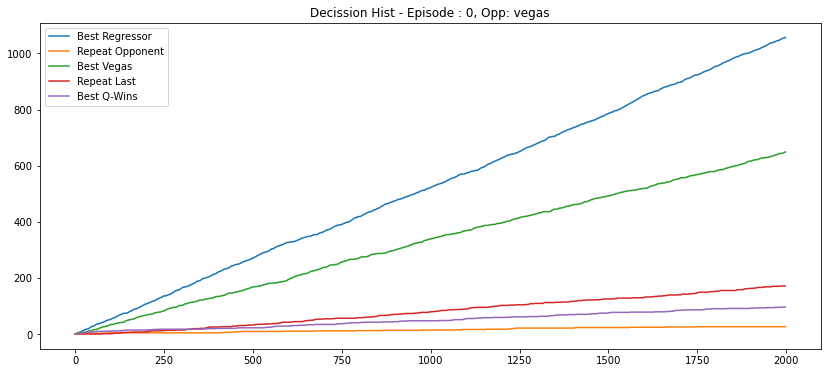

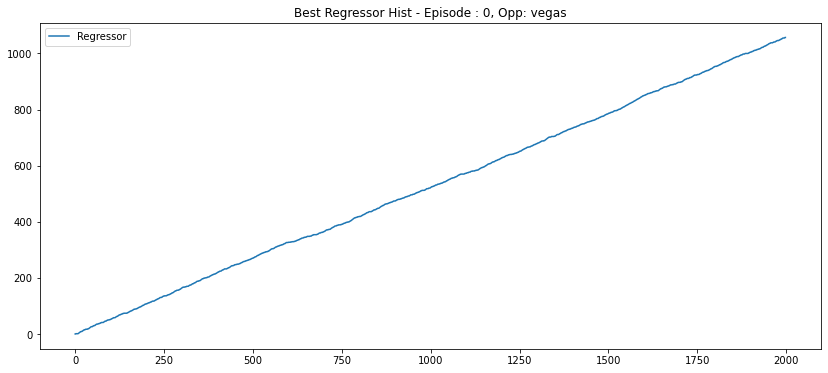

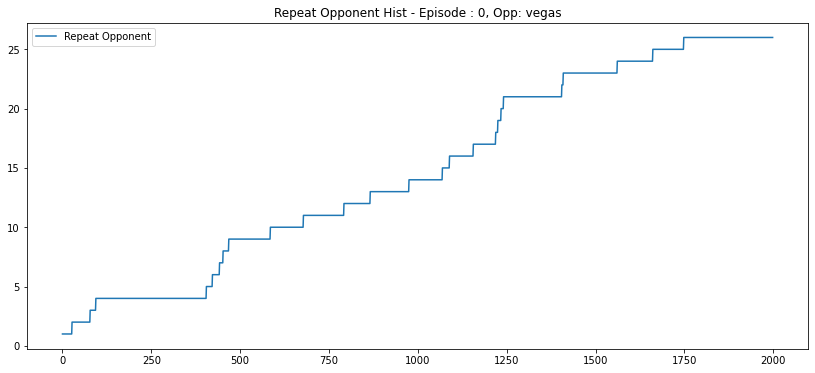

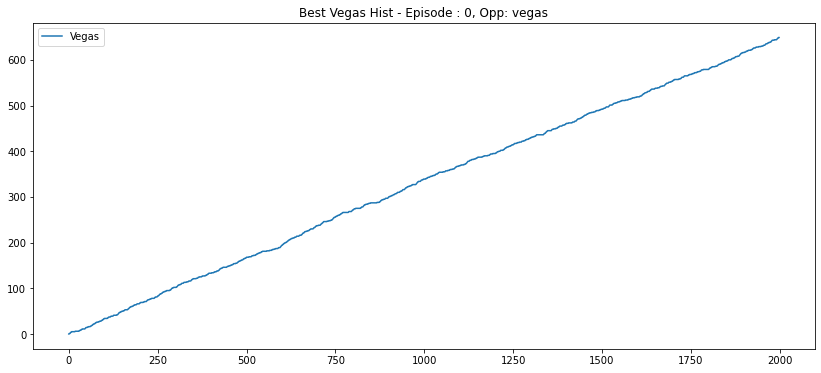

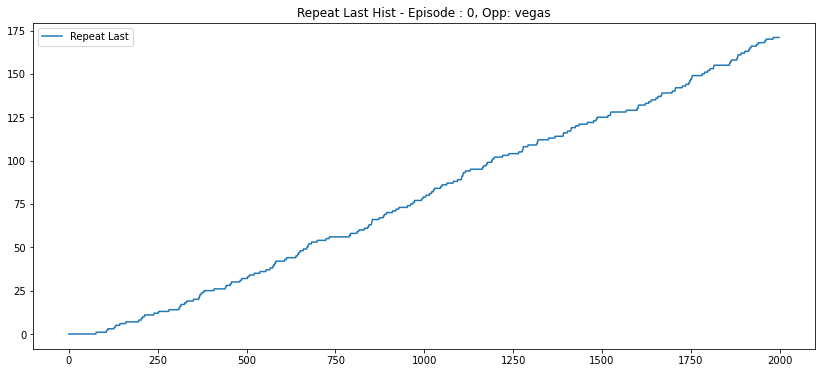

...

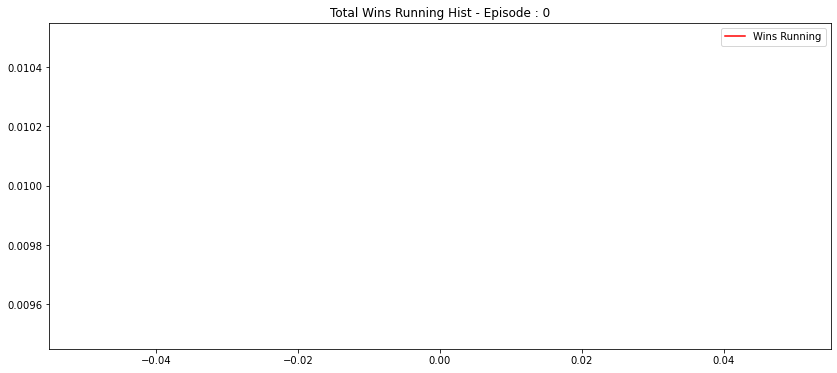

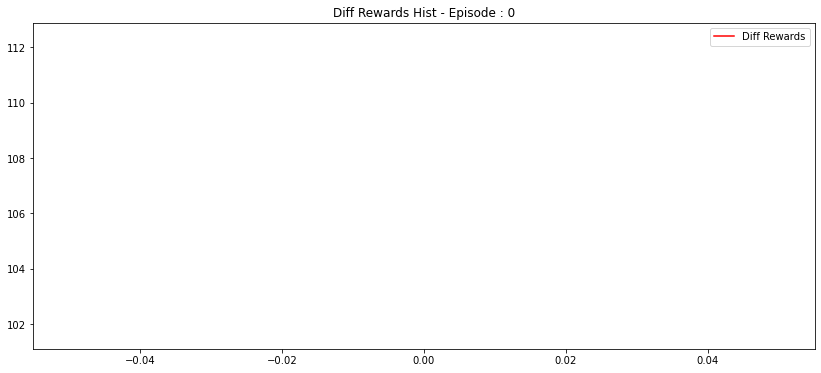

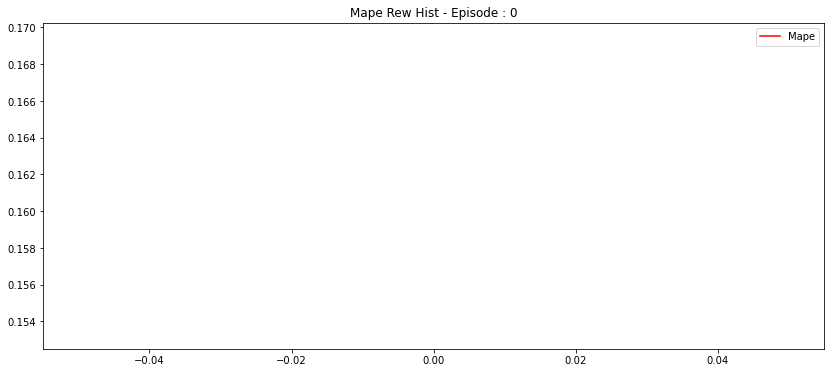

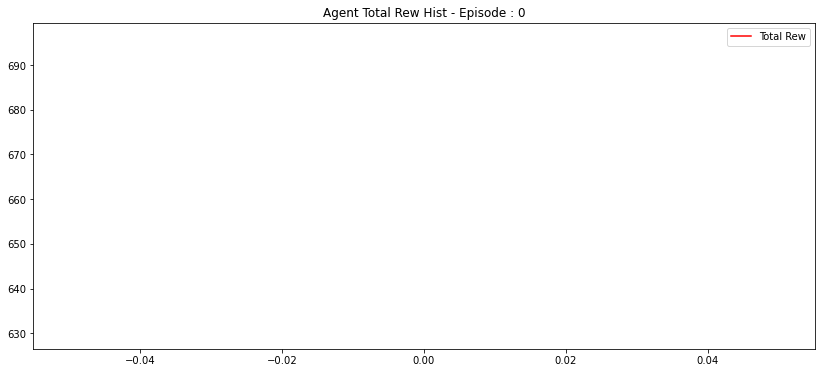

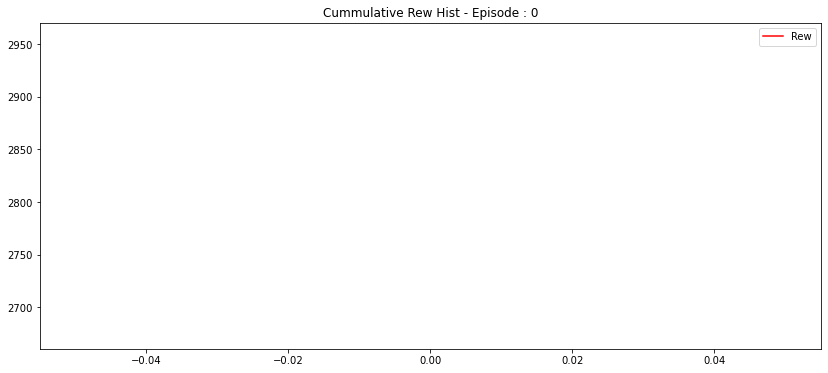

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 2


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


669 549 1855
Env Agent Opp: regressor done, Idx: 3
647 540 1999
Env Agent Opp: regressor done, Idx: 1
653 691 1999
Env Agent Opp: vegas done, Idx: 0
664 562 1999
Env Agent Opp: regressor done, Idx: 2
All envs done
Break step: 7852, Done: True, Idx : 2 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 664, 'step': 1999, 'lastActions': [45, 13]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 562, 'step': 1999, 'lastActions': [45, 13]}
Step: 0
[0.20339672 0.156062   0.26759744 0.19020377 0.18274005]
3
Step: 500
[0.07010545 0.00973686 0.82831067 0.05776474 0.03408219]
2
Step: 1000
[0.17478469 0.02168487 0.6596743  0.09188992 0.05196624]
2
Step: 1500
[0.14626528 0.0261392  0.676179   0.09412306 0.0572935 ]
2
635 614 1999
regressor
Episode: 1
Agent Reward: 635
Opponent Reward: 614
Diff Reward: 21
Wins Nemesis last 10: 0.5


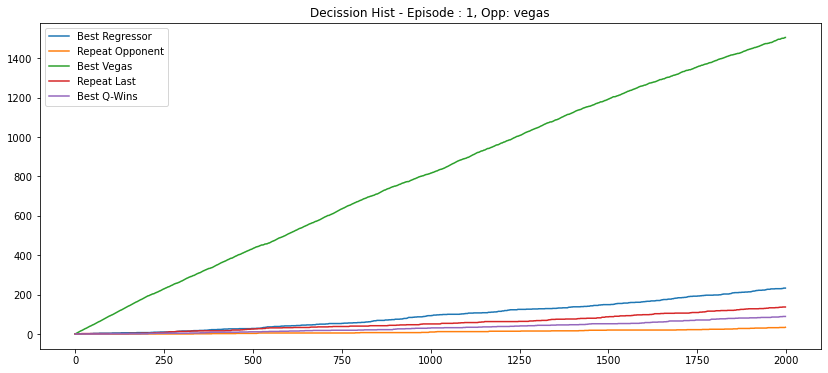

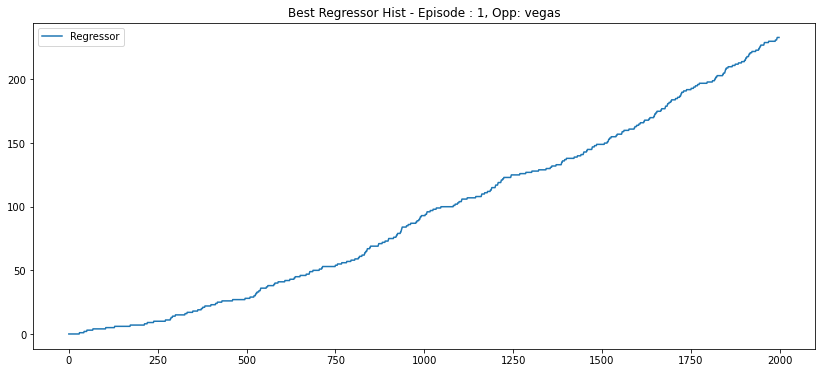

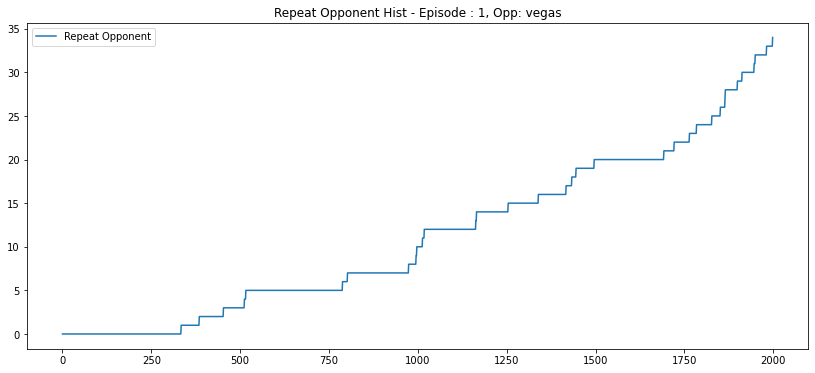

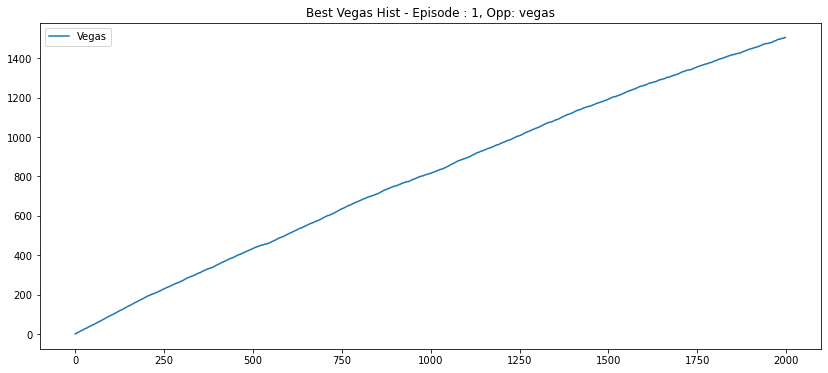

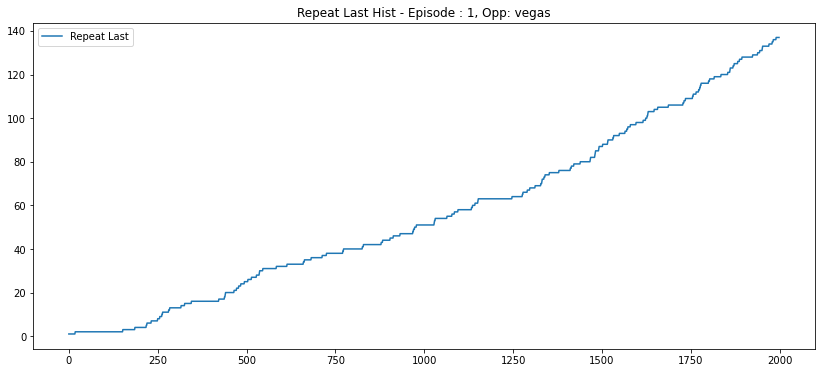

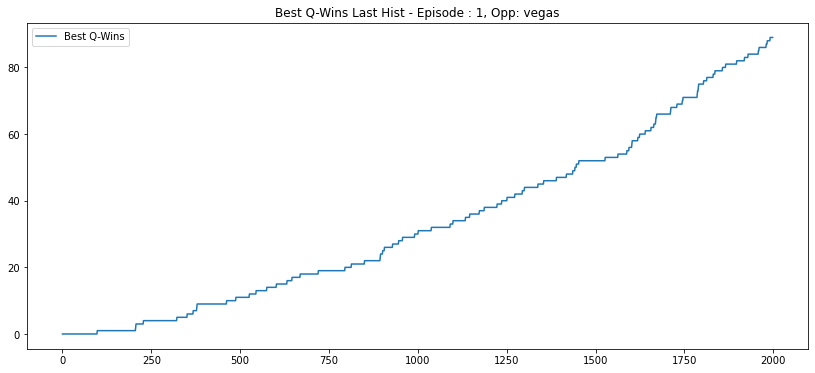

-> Ini env -> 1
670 580 1999
Env Agent Opp: regressor done, Idx: 3
648 565 1999
Env Agent Opp: regressor done, Idx: 1
654 698 1999
Env Agent Opp: vegas done, Idx: 0
623 538 1999
Env Agent Opp: regressor done, Idx: 2
All envs done
Break step: 7996, Done: True, Idx : 2 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 623, 'step': 1999, 'lastActions': [9, 47]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 538, 'step': 1999, 'lastActions': [9, 47]}
Step: 0
[0.23474321 0.1565205  0.25442833 0.17838274 0.17592523]
1
Step: 500
[0.25239912 0.00595451 0.69321823 0.02631981 0.02210843]
2
Step: 1000
[0.27219698 0.01752622 0.62046856 0.04596624 0.04384208]
2
Step: 1500
[0.26229778 0.03347534 0.53990877 0.0833433  0.08097484]
0
626 616 1999
vegas
Episode: 2
Agent Reward: 626
Opponent Reward: 616
Diff Reward: 10
Wins Nemesis last 10: 0.6666666666666666


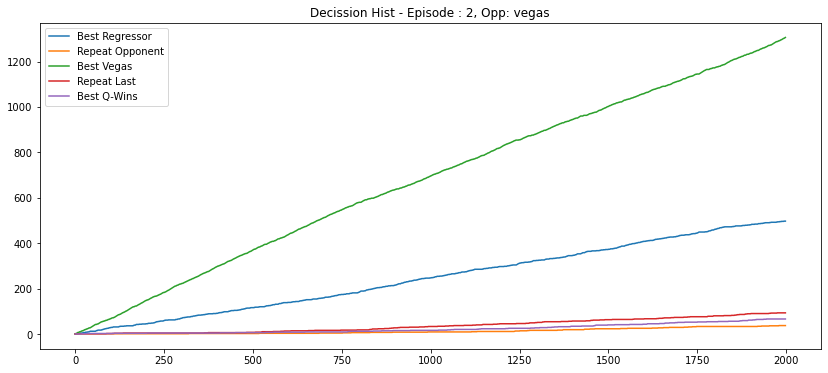

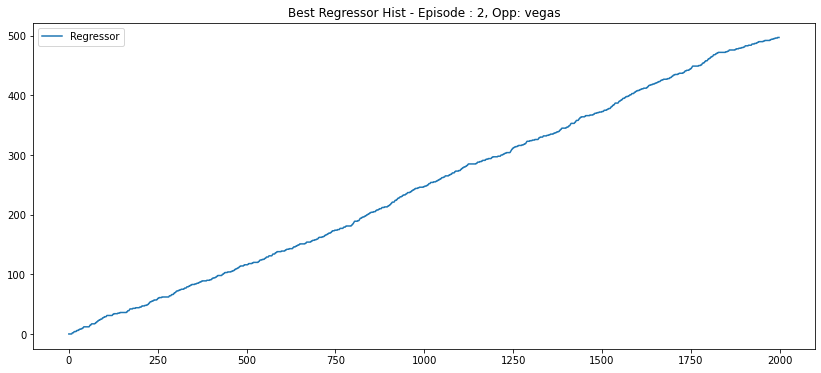

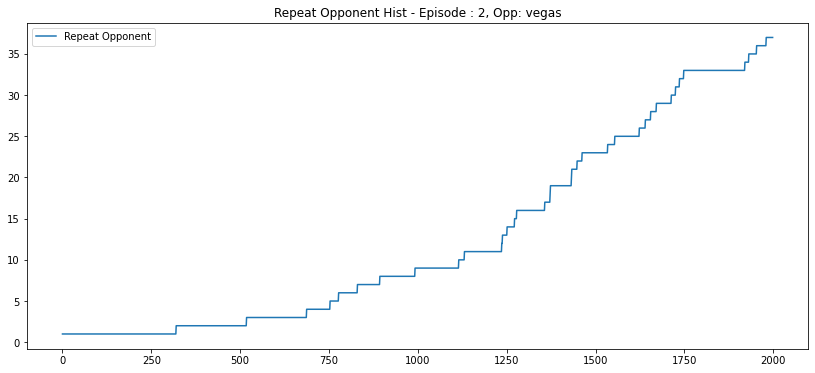

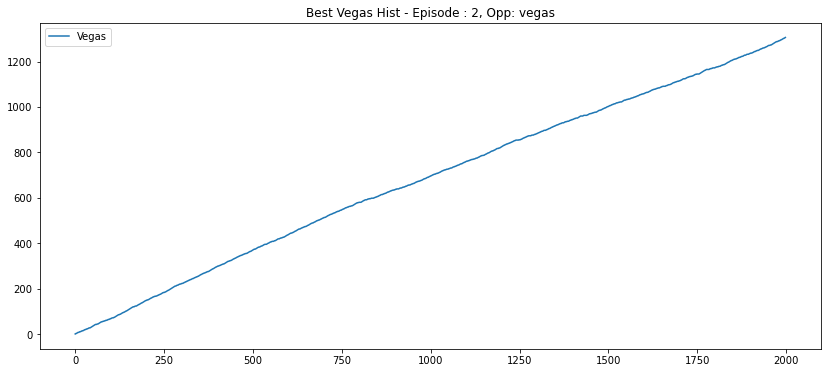

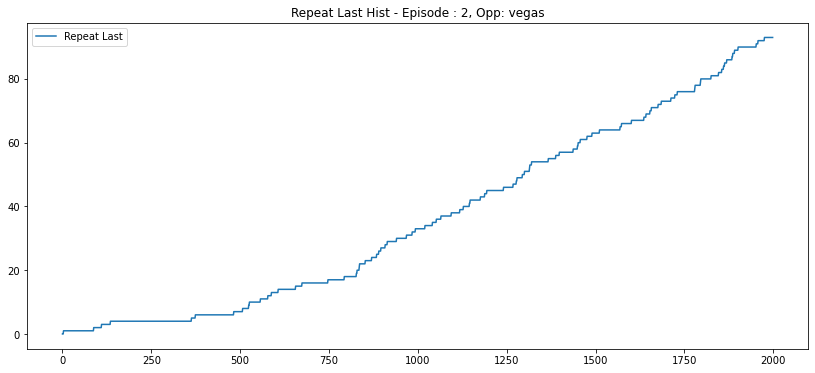

...

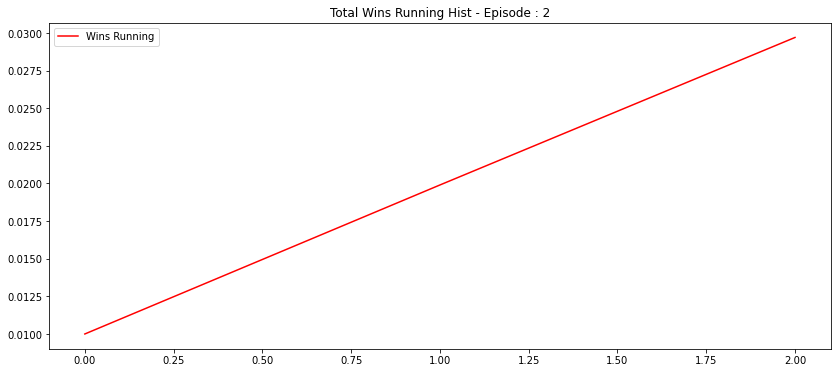

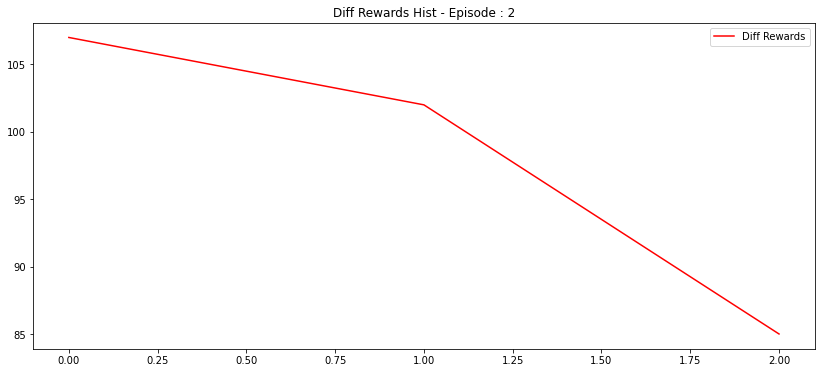

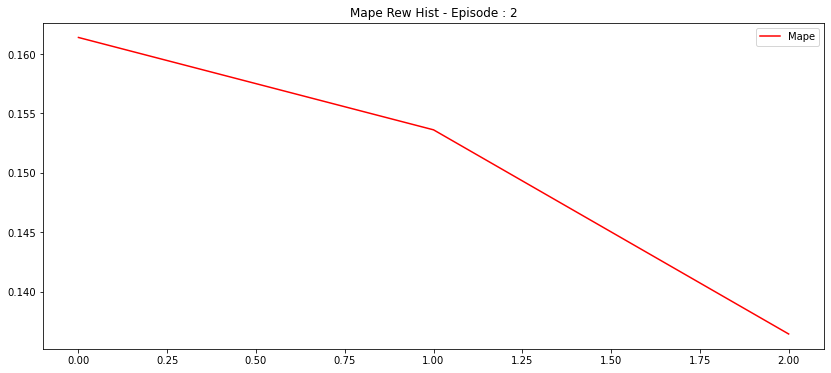

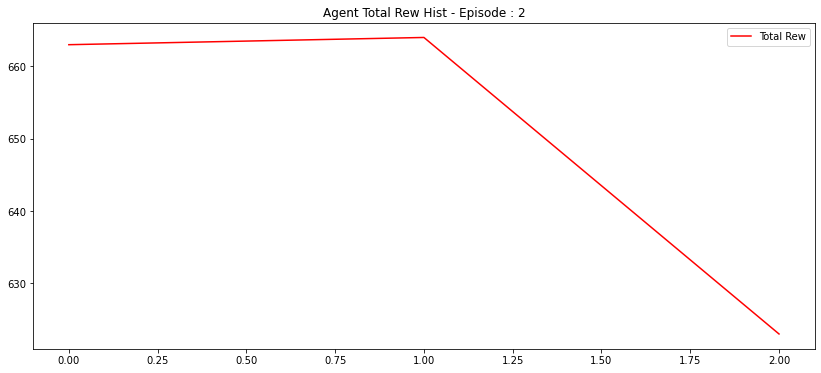

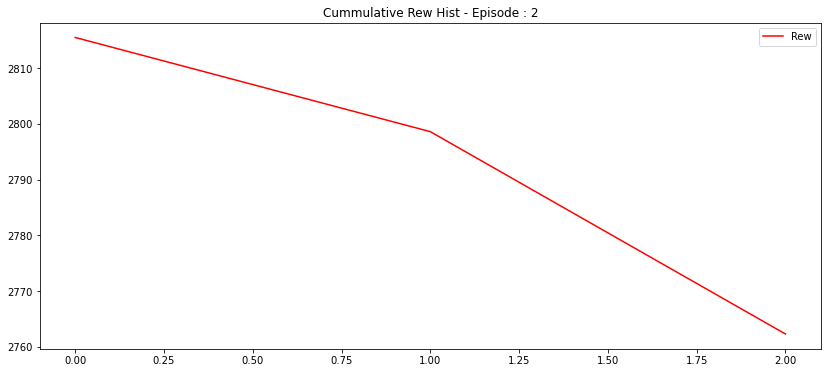

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide


-> Ini env -> 0


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: 

573 453 1301
Env Agent Opp: regressor done, Idx: 3
645 574 1999
Env Agent Opp: regressor done, Idx: 1
672 555 1999
Env Agent Opp: regressor done, Idx: 2
717 668 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 7298, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 717, 'step': 1999, 'lastActions': [22, 78]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 668, 'step': 1999, 'lastActions': [22, 78]}
Step: 0
[0.35078236 0.15231138 0.16548741 0.15111084 0.18030797]
0
Step: 500
[0.98157203 0.00212144 0.00566916 0.00204757 0.00858977]
0
Step: 1000
[0.9687082  0.00328811 0.00981515 0.00510757 0.01308086]
0
Step: 1500
[0.9537214  0.00558889 0.01499148 0.00733432 0.01836399]
0
608 630 1999
vegas
Episode: 3
Agent Reward: 608
Opponent Reward: 630
Diff Reward: -22
Wins Nemesis last 10: 0.5


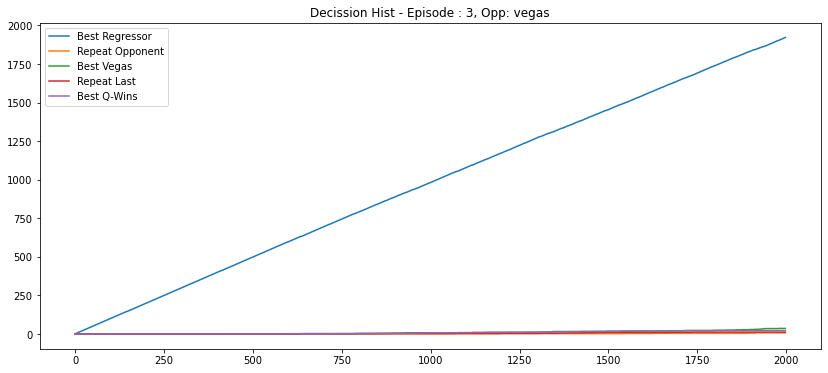

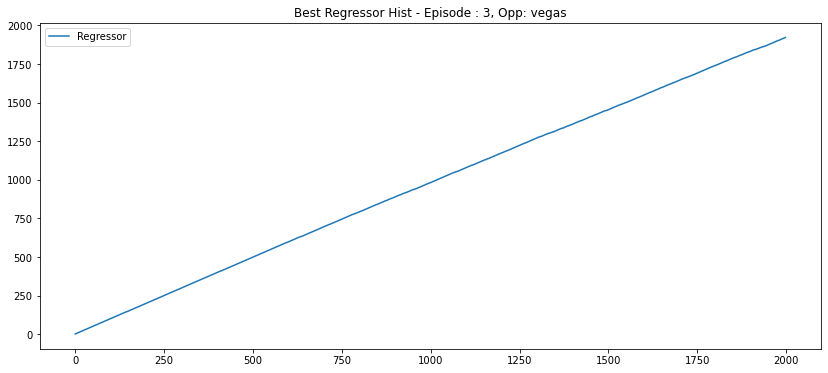

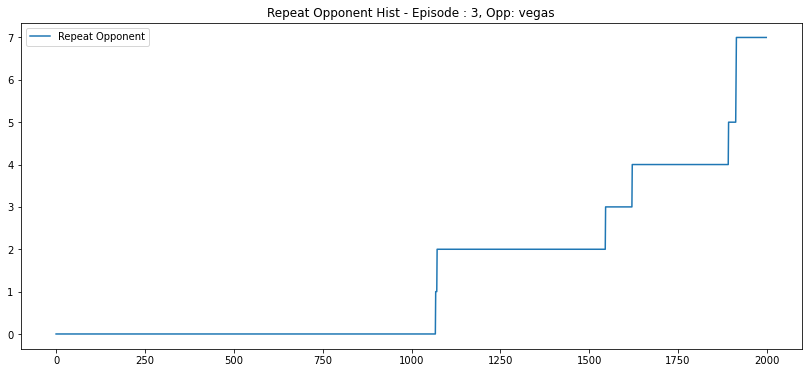

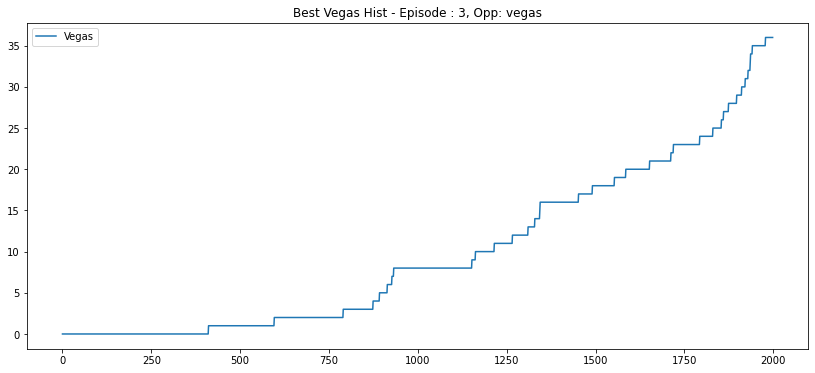

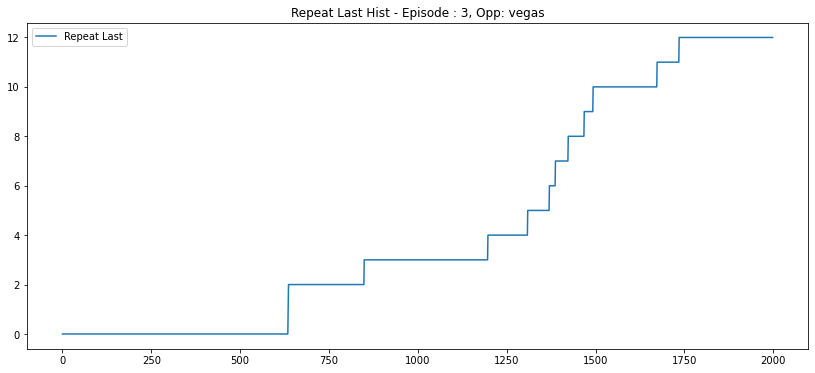

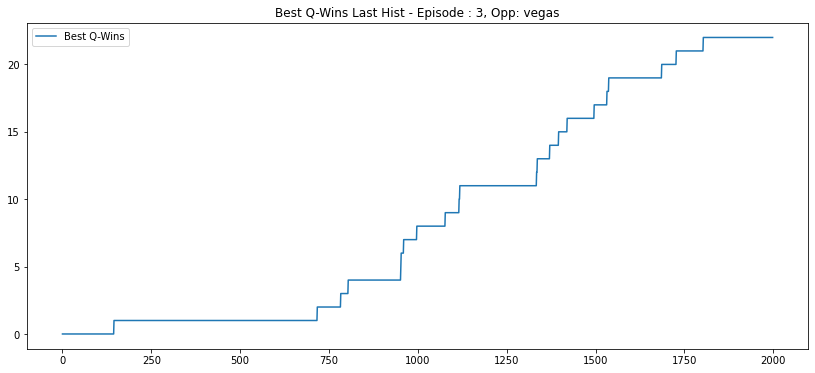

-> Ini env -> 0
409 289 731
Env Agent Opp: regressor done, Idx: 2
550 430 1258
Env Agent Opp: regressor done, Idx: 1
554 434 1320
Env Agent Opp: regressor done, Idx: 3
700 672 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 5308, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 700, 'step': 1999, 'lastActions': [65, 34]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 672, 'step': 1999, 'lastActions': [65, 34]}
Step: 0
[0.39151827 0.13817935 0.16092743 0.14042798 0.16894704]
0
Step: 500
[9.9034750e-01 8.0122310e-04 4.0685022e-03 1.4854412e-03 3.2972801e-03]
0
Step: 1000
[0.98380786 0.00157328 0.00674548 0.00299167 0.0048818 ]
0
Step: 1500
[0.94544923 0.00605453 0.01891742 0.01008505 0.01949376]
0
606 565 1999
regressor
Episode: 4
Agent Reward: 606
Opponent Reward: 565
Diff Reward: 41
Wins Nemesis last 10: 0.6


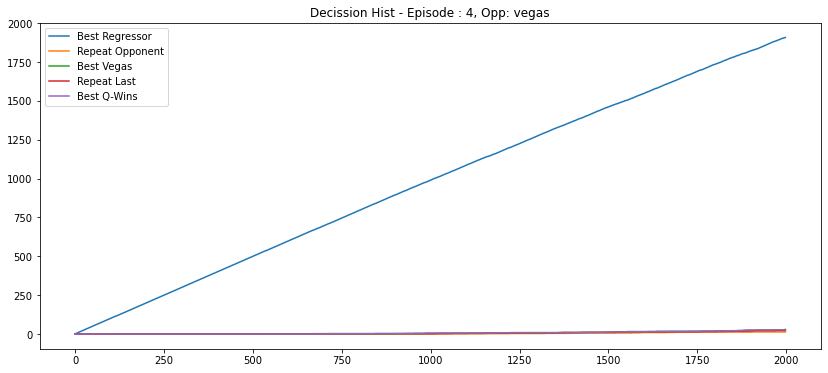

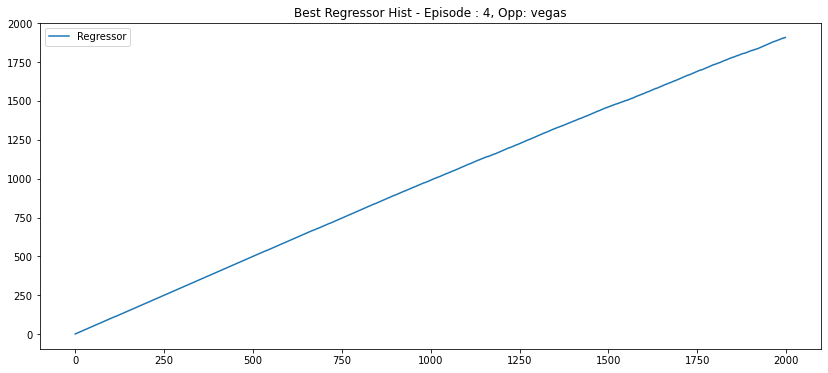

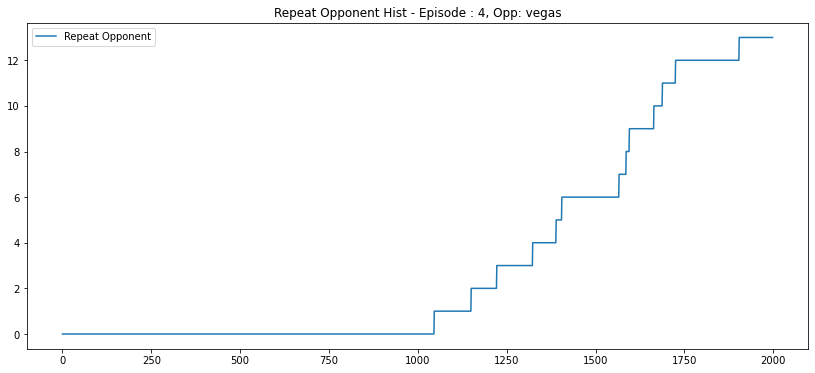

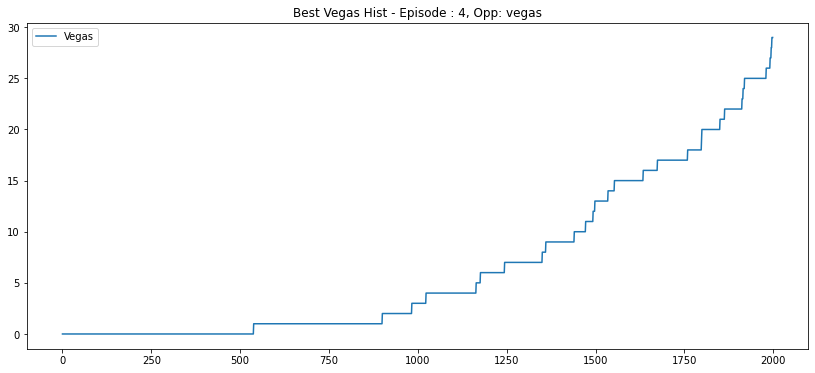

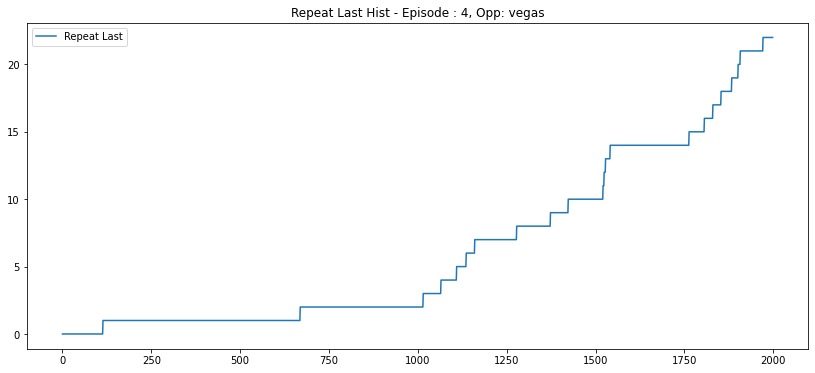

...

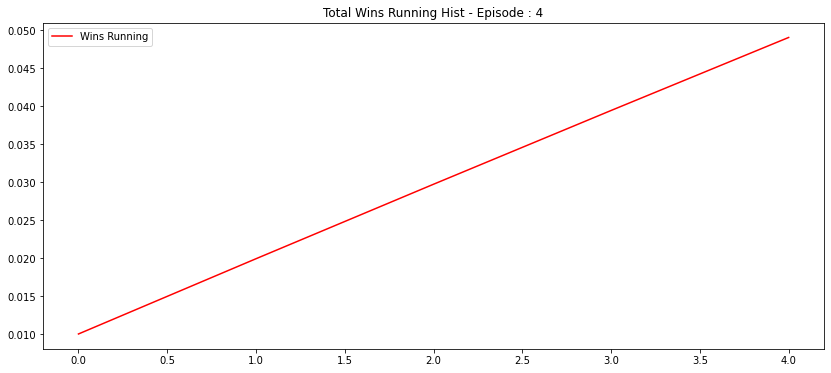

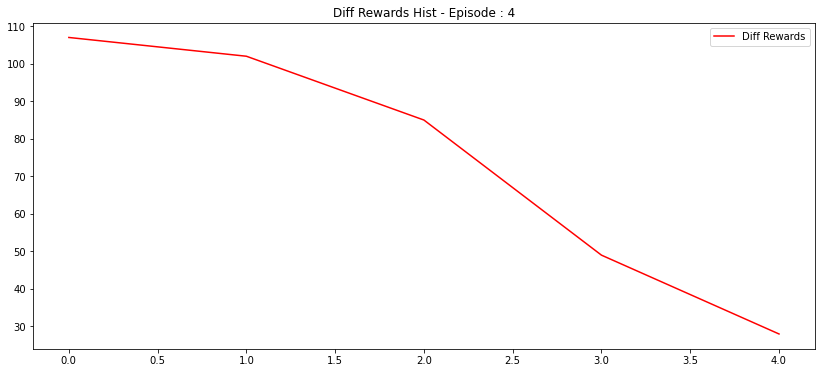

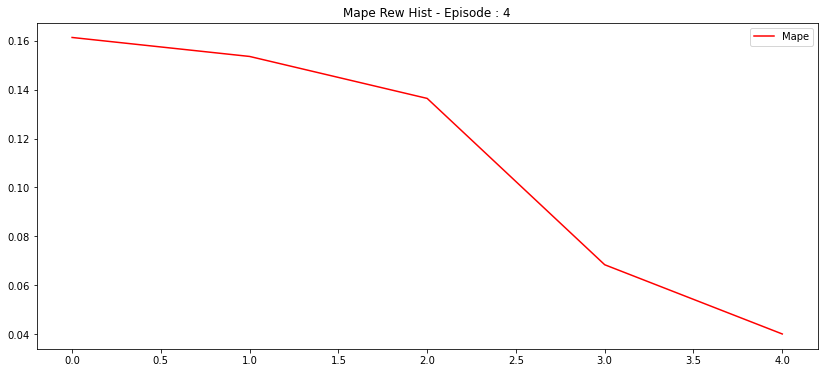

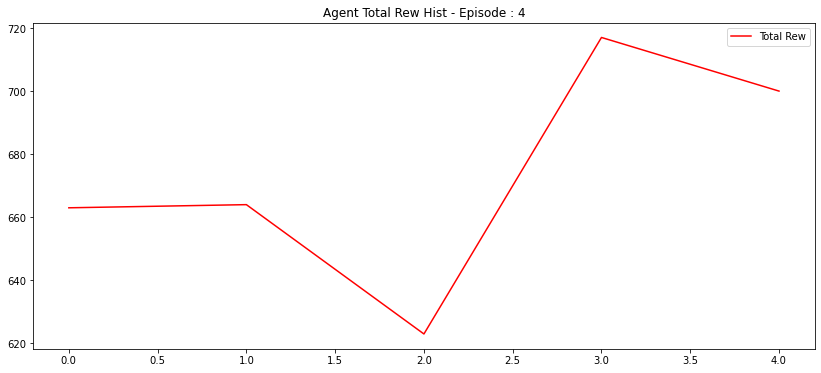

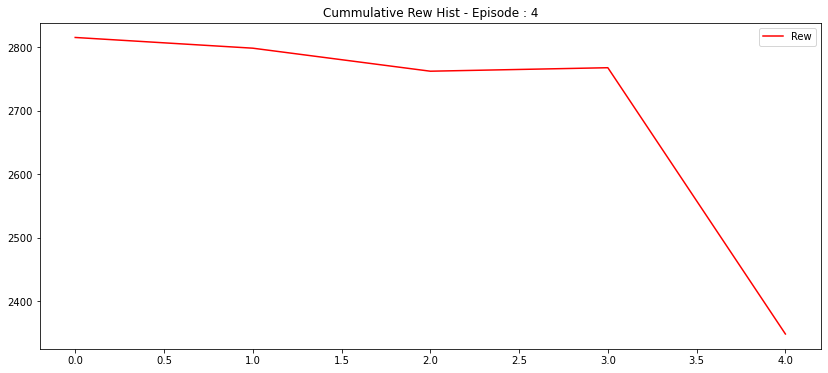

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 3


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


578 458 1343
Env Agent Opp: regressor done, Idx: 3
627 507 1714
Env Agent Opp: regressor done, Idx: 1
585 558 1999
Env Agent Opp: vegas done, Idx: 0
637 562 1999
Env Agent Opp: regressor done, Idx: 2
All envs done
Break step: 7055, Done: True, Idx : 2 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 637, 'step': 1999, 'lastActions': [69, 68]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 562, 'step': 1999, 'lastActions': [69, 68]}
INFO:tensorflow:Assets written to: ../04_Models/ActorCritic/Decission//model_a2c_dec_multienv_v0.6_5\assets
Step: 0
[0.4087863  0.13645945 0.1489104  0.13764744 0.16819647]
4
Step: 500
[9.9596751e-01 3.4469675e-04 1.0621282e-03 5.4898288e-04 2.0767029e-03]
0
Step: 1000
[0.9842138  0.00180912 0.00480328 0.00282301 0.00635087]
0
Step: 1500
[0.9558332  0.00584293 0.01288042 0.00908952 0.01635394]
0
634 588 1999
regressor
Episode: 5
Agent Reward: 634
Opponent Reward: 588
Diff Reward: 46
Wins Nemesis last 10: 0.6666666666666666


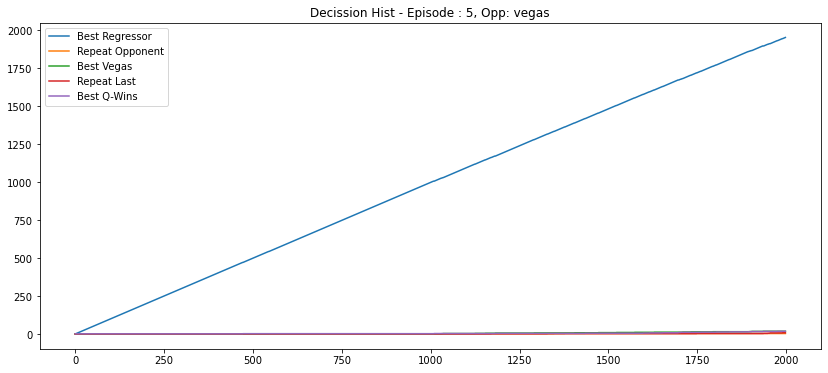

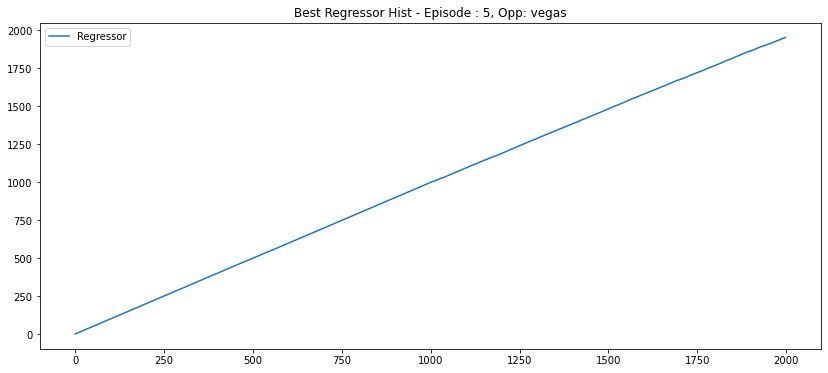

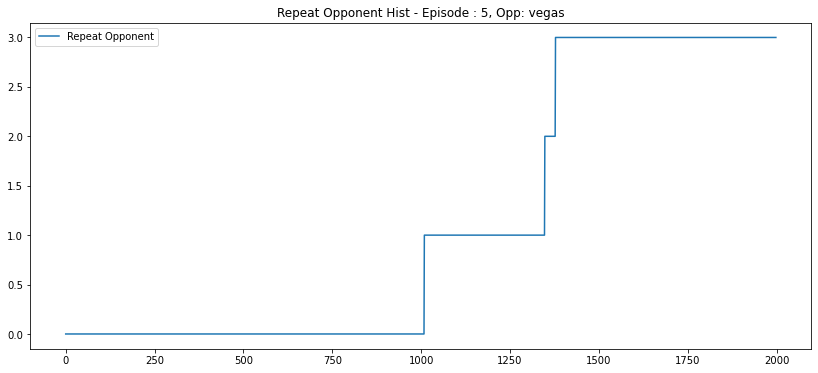

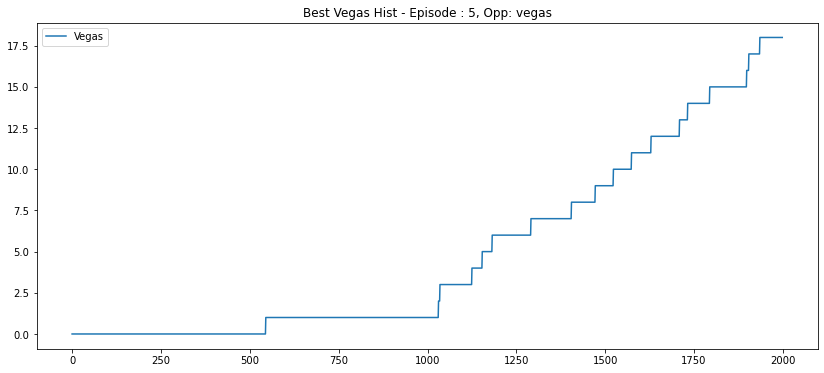

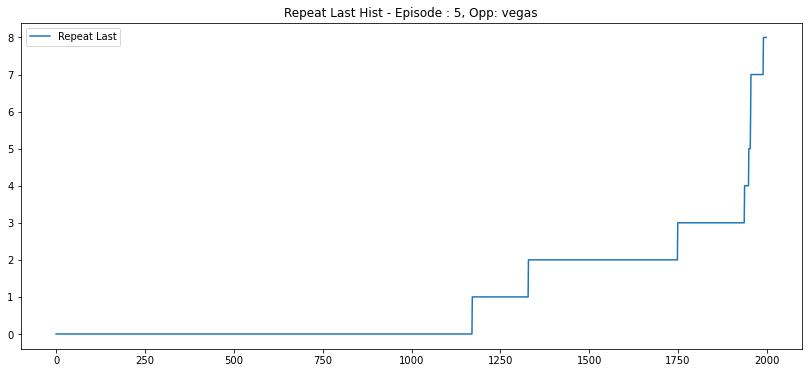

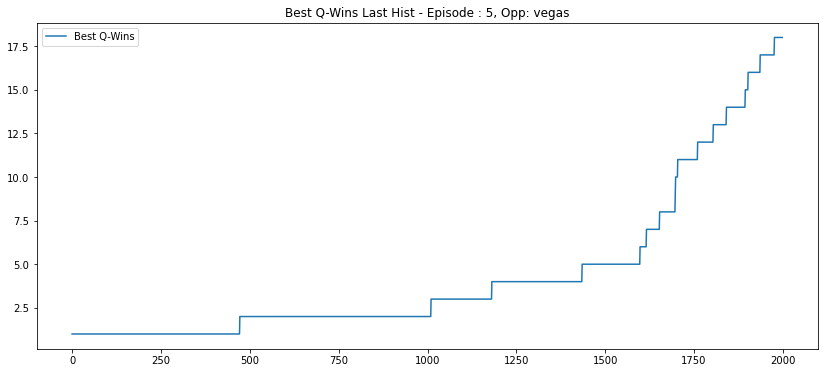

-> Ini env -> 0


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:163: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_count_me' : self.arr_count_me / self.arr_count,


555 435 1402
Env Agent Opp: regressor done, Idx: 1
657 645 1999
Env Agent Opp: vegas done, Idx: 0
648 560 1999
Env Agent Opp: regressor done, Idx: 2
680 591 1999
Env Agent Opp: regressor done, Idx: 3
All envs done
Break step: 7399, Done: True, Idx : 3 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 680, 'step': 1999, 'lastActions': [13, 98]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 591, 'step': 1999, 'lastActions': [13, 98]}
Step: 0
[0.44341025 0.12803951 0.1404422  0.13148701 0.15662095]
0
Step: 500
[9.9893290e-01 9.4610252e-05 3.0431303e-04 1.5227431e-04 5.1600247e-04]
0
Step: 1000
[0.9893798  0.00135484 0.00323357 0.00205033 0.00398147]
0
Step: 1500
[0.9716646  0.00419827 0.00803303 0.00614191 0.00996203]
0
600 654 1999
vegas
Episode: 6
Agent Reward: 600
Opponent Reward: 654
Diff Reward: -54
Wins Nemesis last 10: 0.5714285714285714


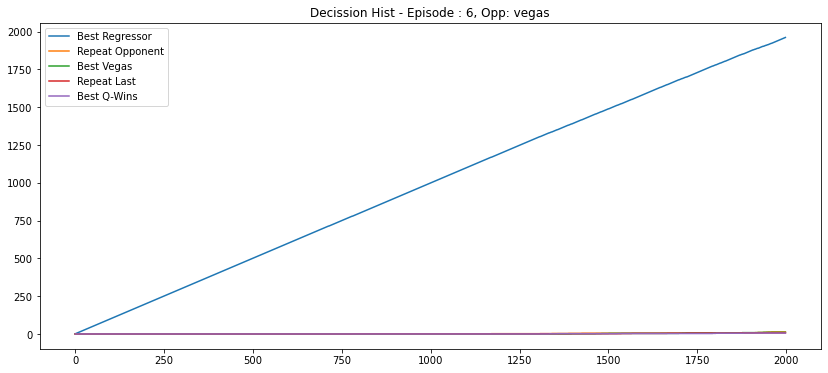

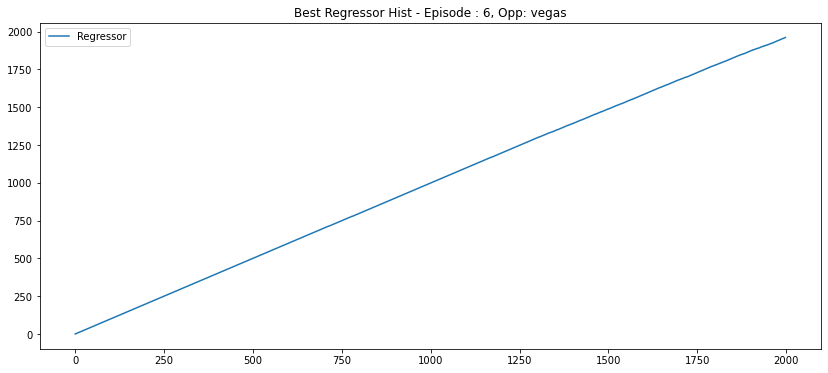

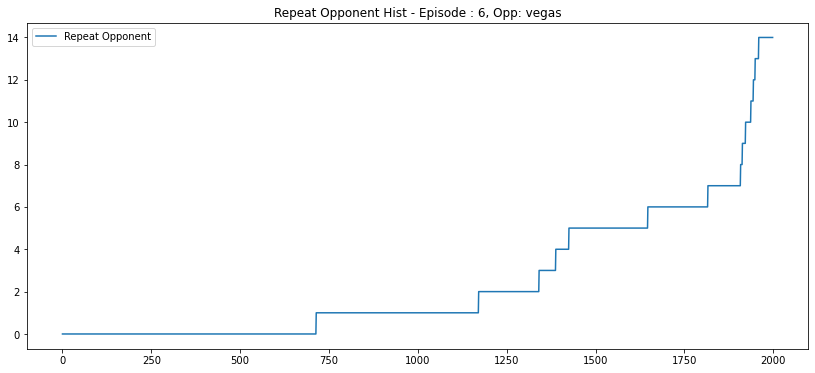

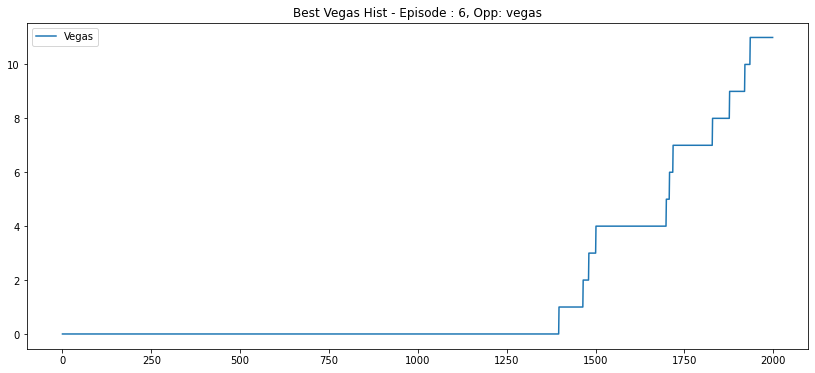

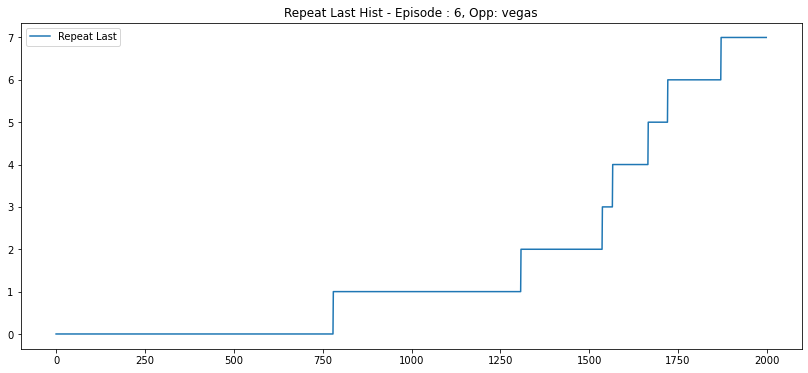

...

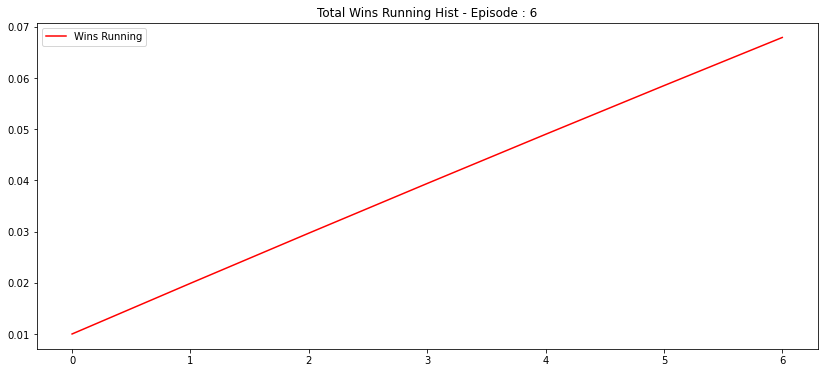

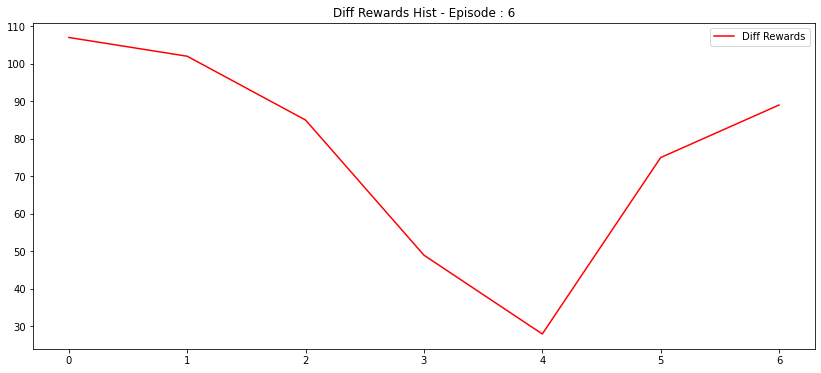

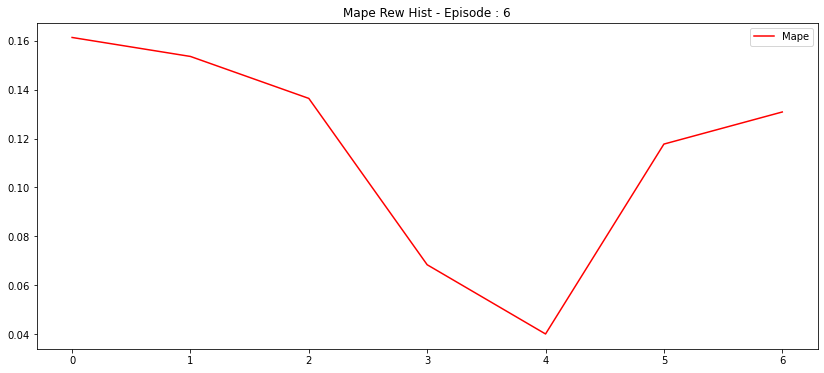

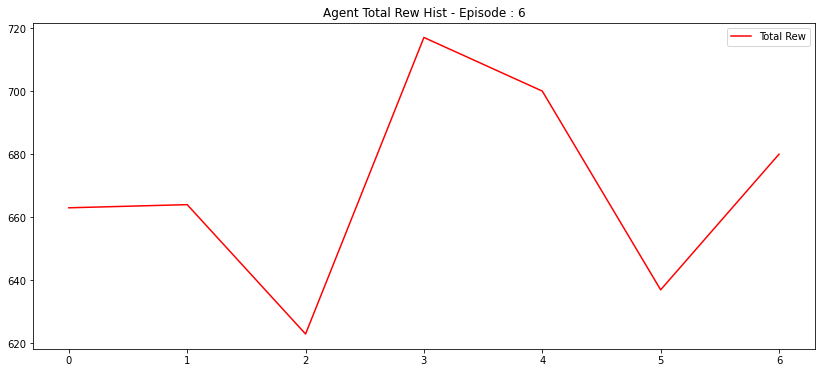

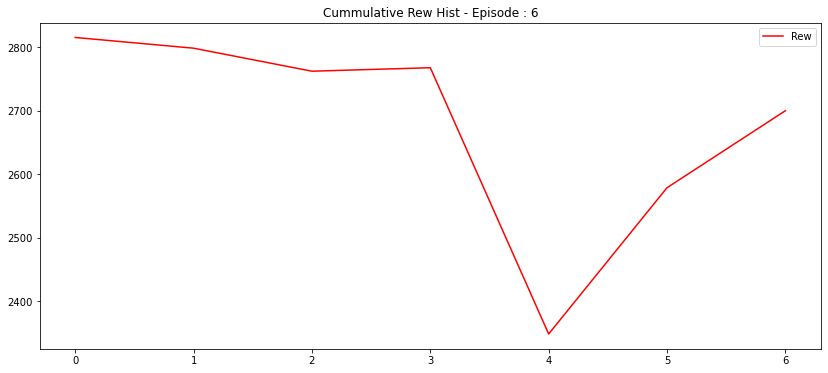

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide


-> Ini env -> 0


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: 

531 411 1178
Env Agent Opp: regressor done, Idx: 2
545 425 1303
Env Agent Opp: regressor done, Idx: 1
507 387 1008
Env Agent Opp: regressor done, Idx: 3
691 688 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 5519, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 691, 'step': 1999, 'lastActions': [19, 14]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 688, 'step': 1999, 'lastActions': [19, 14]}
Step: 0
[0.4463142  0.12607722 0.14095134 0.1319453  0.15471196]
0
Step: 500
[9.9805367e-01 1.8957890e-04 6.5620668e-04 3.5866472e-04 7.4189133e-04]
0
Step: 1000
[9.9323082e-01 6.4479827e-04 2.2434839e-03 1.1446705e-03 2.7361375e-03]
0
Step: 1500
[0.9743919  0.00320891 0.00824457 0.00605021 0.00810437]
0
681 658 1999
regressor
Episode: 7
Agent Reward: 681
Opponent Reward: 658
Diff Reward: 23
Wins Nemesis last 10: 0.625


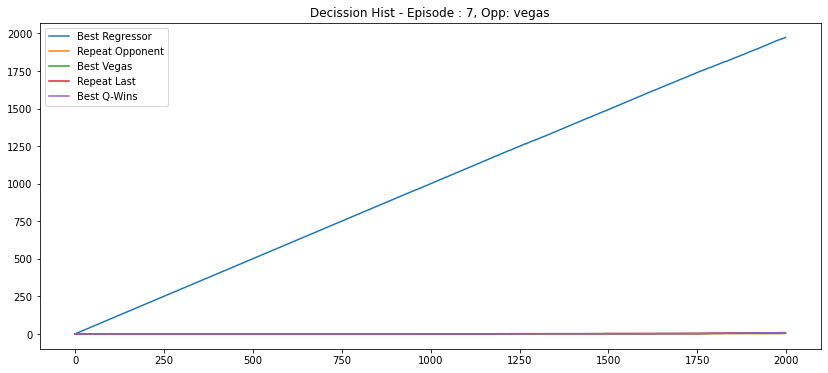

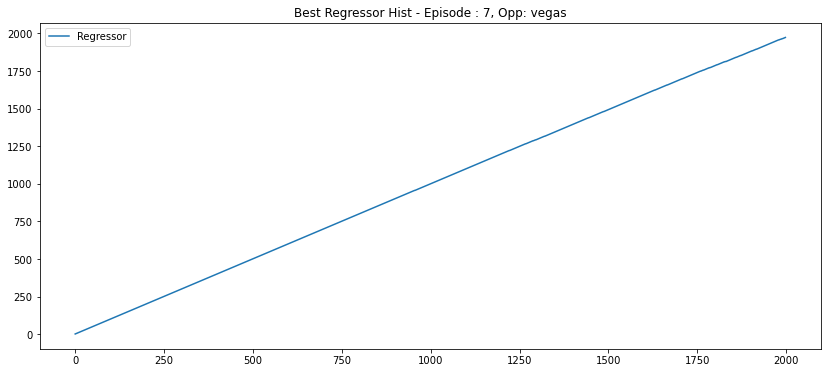

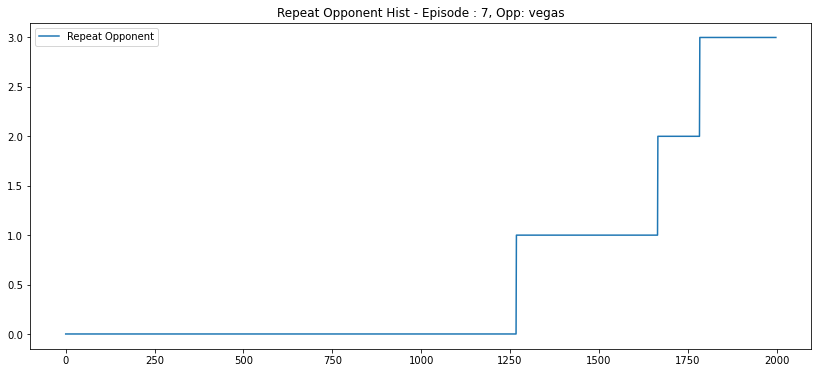

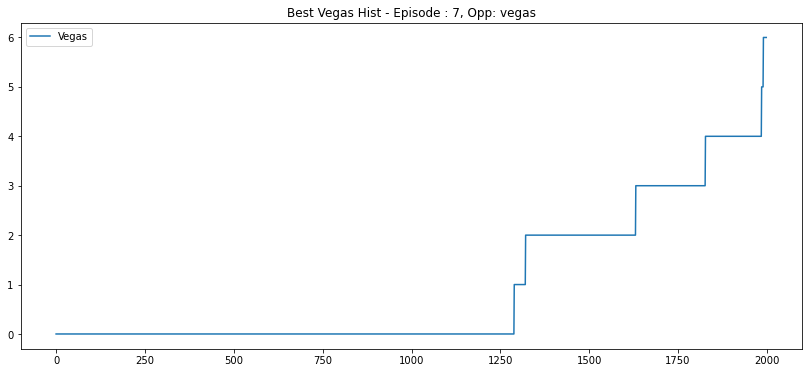

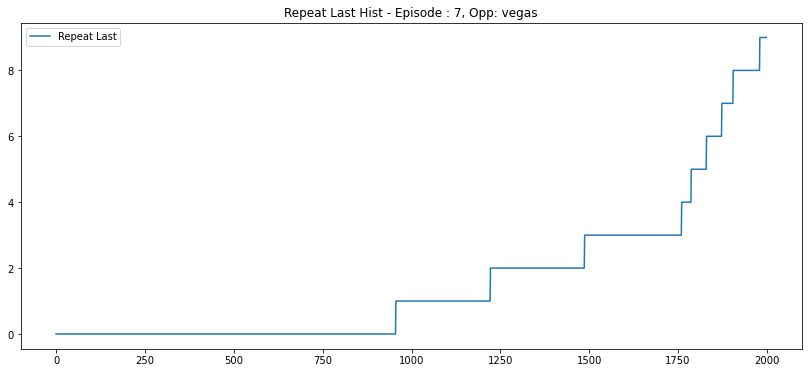

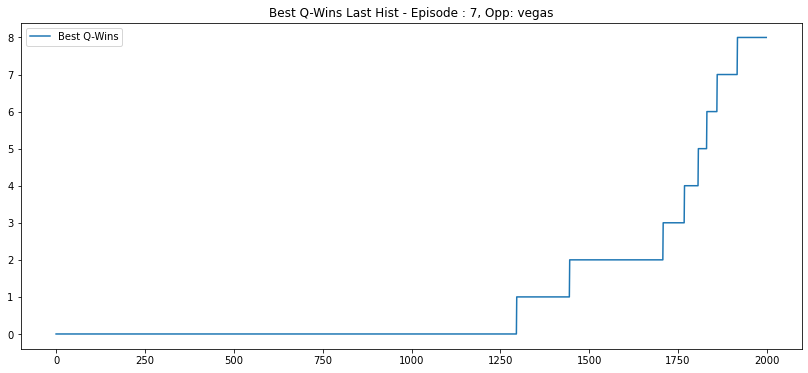

-> Ini env -> 0


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:163: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_count_me' : self.arr_count_me / self.arr_count,


664 570 1999
Env Agent Opp: regressor done, Idx: 1
631 511 1695
Env Agent Opp: regressor done, Idx: 2
696 576 1994
Env Agent Opp: regressor done, Idx: 3
660 641 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 7687, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 660, 'step': 1999, 'lastActions': [45, 73]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 641, 'step': 1999, 'lastActions': [45, 73]}
Step: 0
[0.4452466  0.12966804 0.14293256 0.13198878 0.15016408]
4
Step: 500
[9.9834514e-01 1.8231782e-04 5.9679750e-04 2.7571054e-04 6.0011767e-04]
0
Step: 1000
[0.9635314  0.00501896 0.01231464 0.00906935 0.0100657 ]
0
Step: 1500
[0.93191046 0.01197101 0.02002529 0.01474153 0.02135175]
0
595 595 1999
regressor
Episode: 8
Agent Reward: 595
Opponent Reward: 595
Diff Reward: 0
Wins Nemesis last 10: 0.5555555555555556


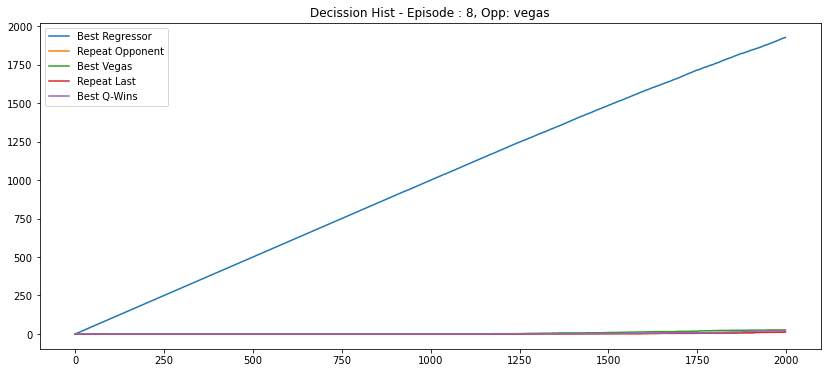

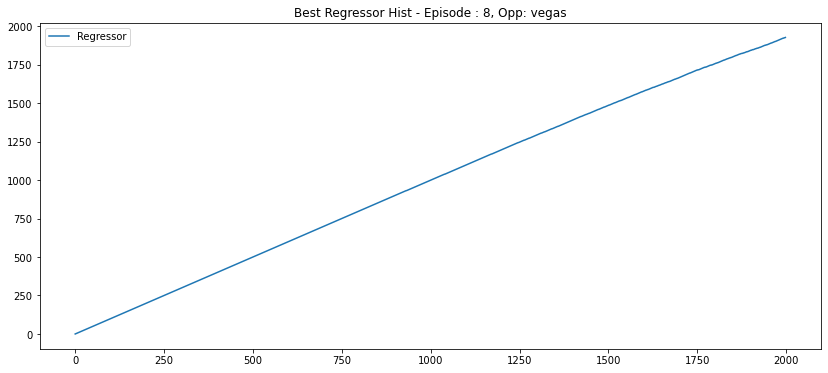

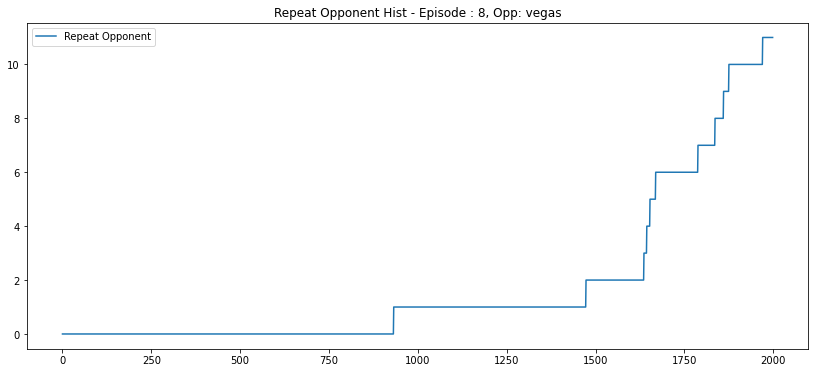

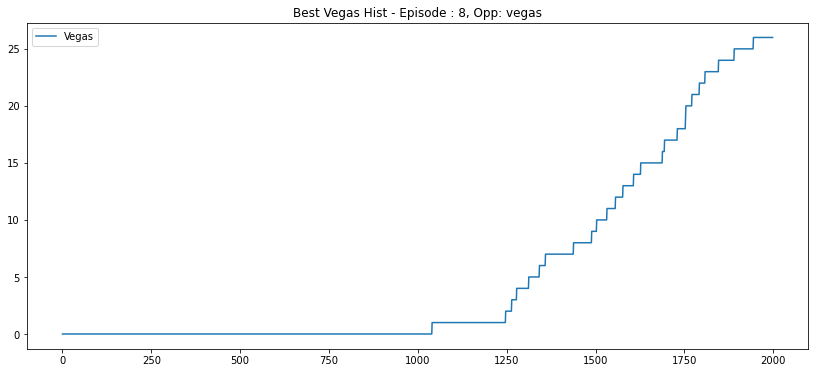

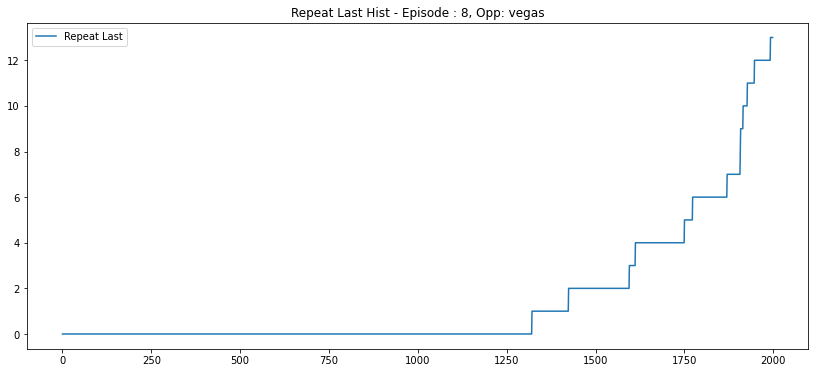

...

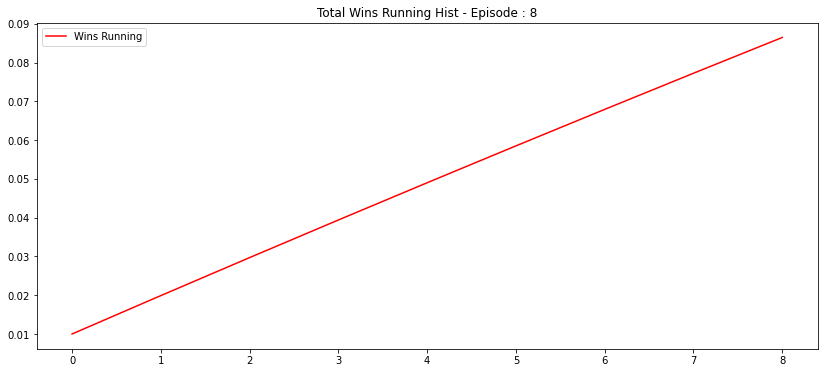

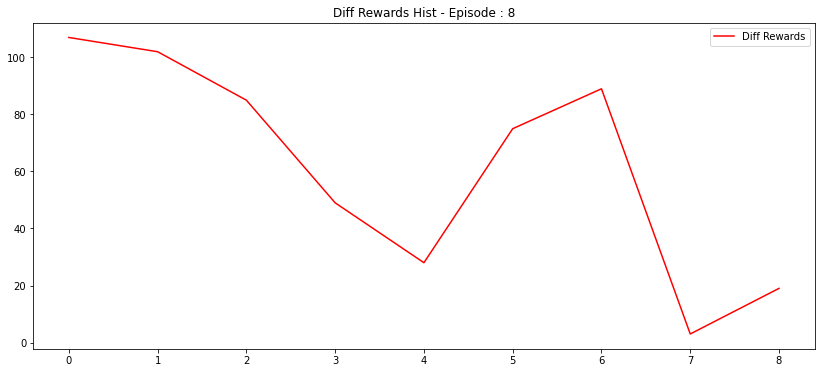

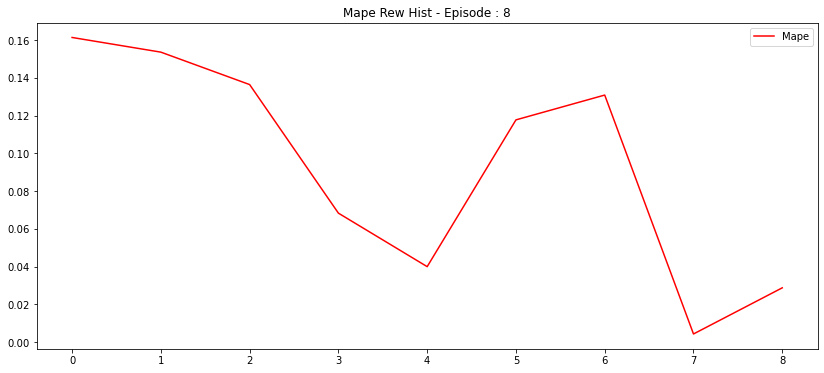

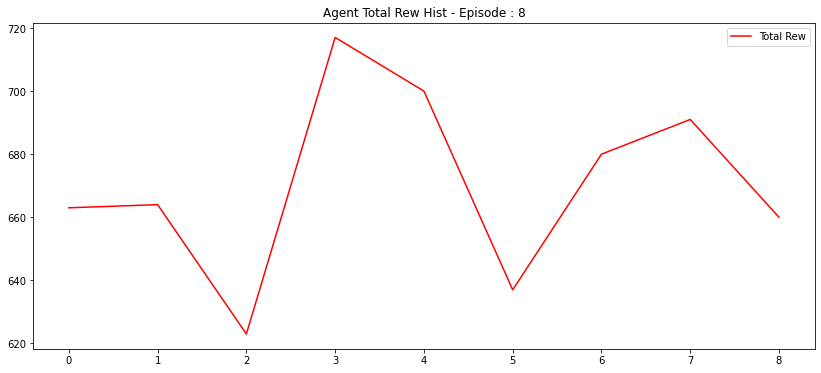

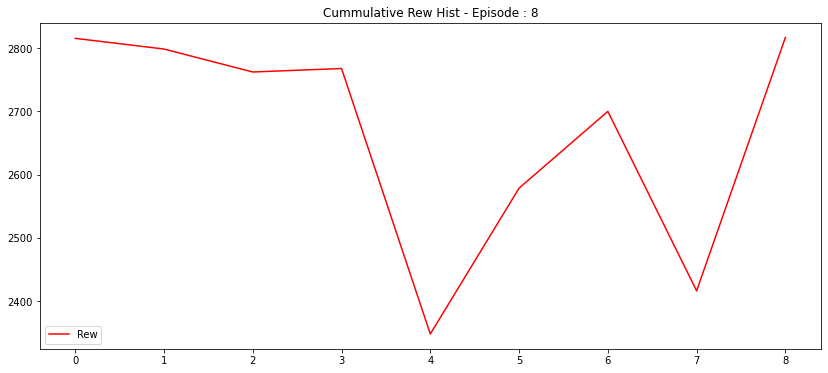

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 1


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


685 675 1999
Env Agent Opp: vegas done, Idx: 0
689 594 1999
Env Agent Opp: regressor done, Idx: 3
667 564 1999
Env Agent Opp: regressor done, Idx: 1
656 543 1999
Env Agent Opp: regressor done, Idx: 2
All envs done
Break step: 7996, Done: True, Idx : 2 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 656, 'step': 1999, 'lastActions': [82, 57]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 543, 'step': 1999, 'lastActions': [82, 57]}
Step: 0
[0.46440372 0.12434147 0.1387248  0.12373096 0.14879905]
0
Step: 500
[9.9942893e-01 5.0022150e-05 1.9228520e-04 6.6198474e-05 2.6249682e-04]
0
Step: 1000
[0.99046093 0.00112608 0.00325909 0.00152568 0.00362829]
0
Step: 1500
[0.9682703  0.00458552 0.01027939 0.00643844 0.0104263 ]
2
590 630 1999
vegas
Episode: 9
Agent Reward: 590
Opponent Reward: 630
Diff Reward: -40
Wins Nemesis last 10: 0.5


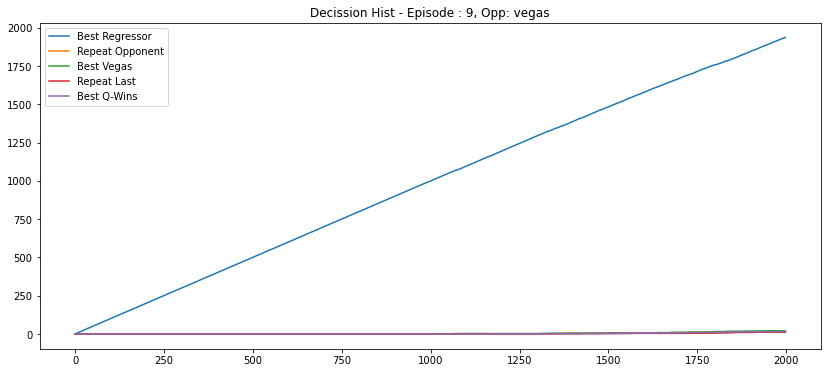

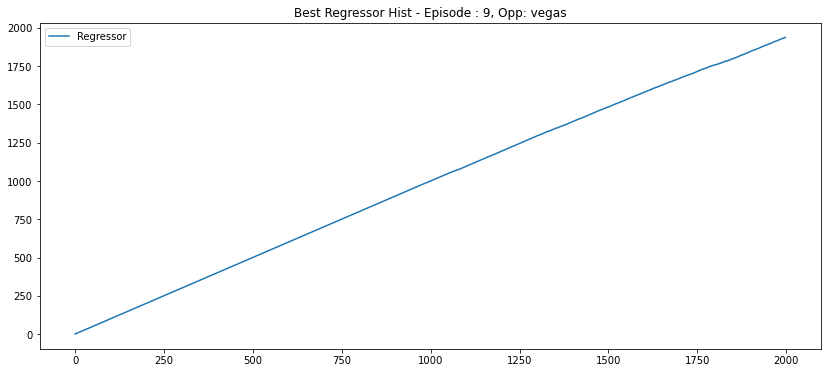

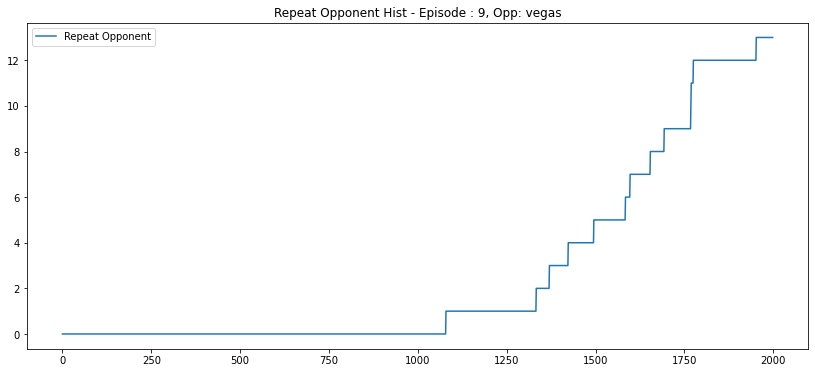

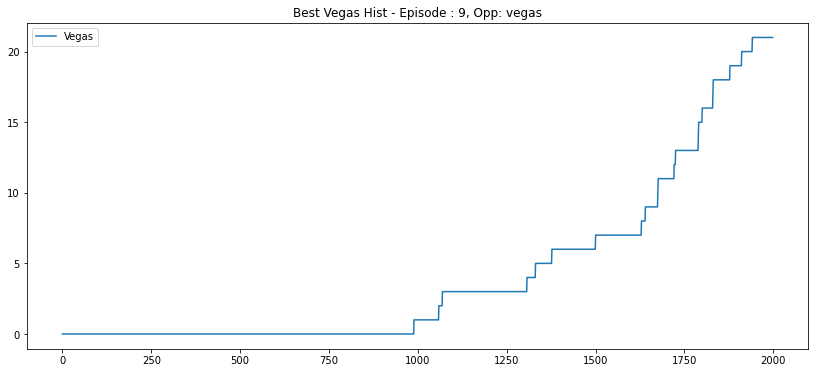

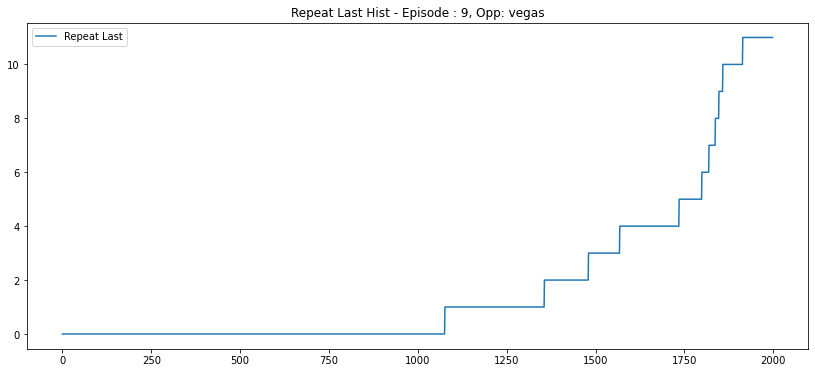

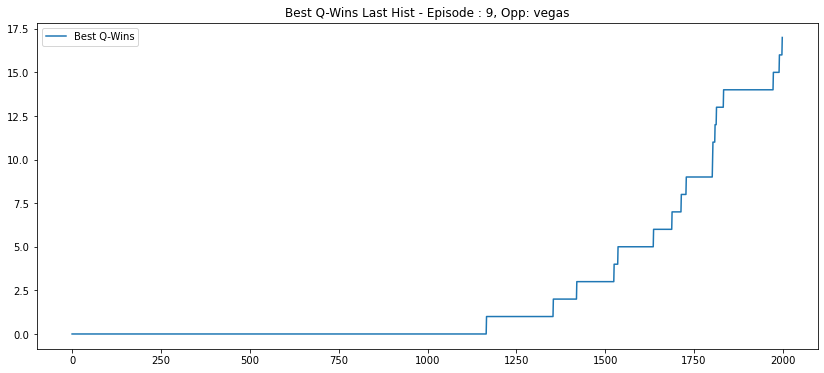

-> Ini env -> 2
550 430 1260
Env Agent Opp: regressor done, Idx: 3
636 595 1999
Env Agent Opp: regressor done, Idx: 1
675 683 1999
Env Agent Opp: vegas done, Idx: 0
665 586 1999
Env Agent Opp: regressor done, Idx: 2
All envs done
Break step: 7257, Done: True, Idx : 2 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 665, 'step': 1999, 'lastActions': [4, 34]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 586, 'step': 1999, 'lastActions': [4, 34]}
INFO:tensorflow:Assets written to: ../04_Models/ActorCritic/Decission//model_a2c_dec_multienv_v0.6_10\assets
Step: 0
[0.42728075 0.13568394 0.1478799  0.11318885 0.17596655]
0
Step: 500
[9.9837303e-01 1.2370151e-04 3.6855860e-04 4.8719587e-05 1.0860272e-03]
0
Step: 1000
[9.9011278e-01 9.8245579e-04 2.6795664e-03 5.4157729e-04 5.6834952e-03]
0
Step: 1500
[0.94739515 0.00724189 0.01578289 0.00504169 0.02453832]
0
604 630 1999
vegas
Episode: 10
Agent Reward: 604
Opponent Reward: 630
Diff Reward: -26
Wins Nemesis last 1

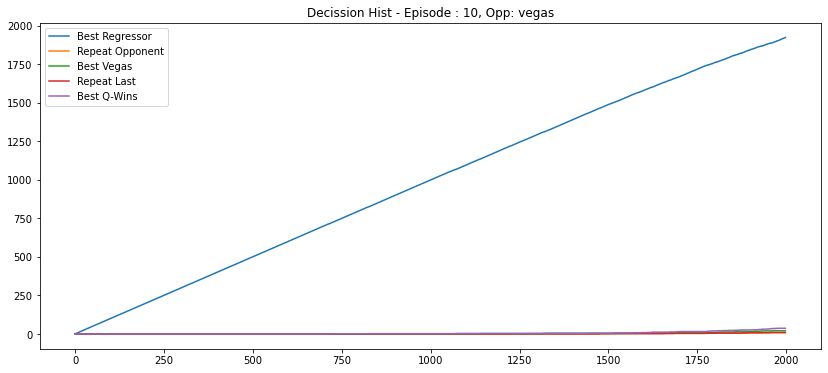

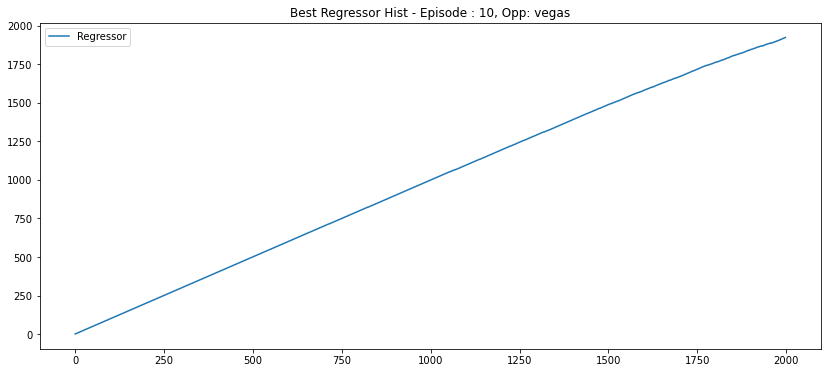

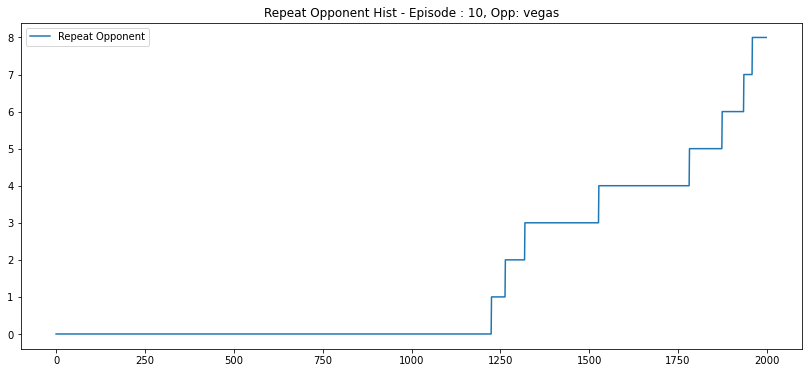

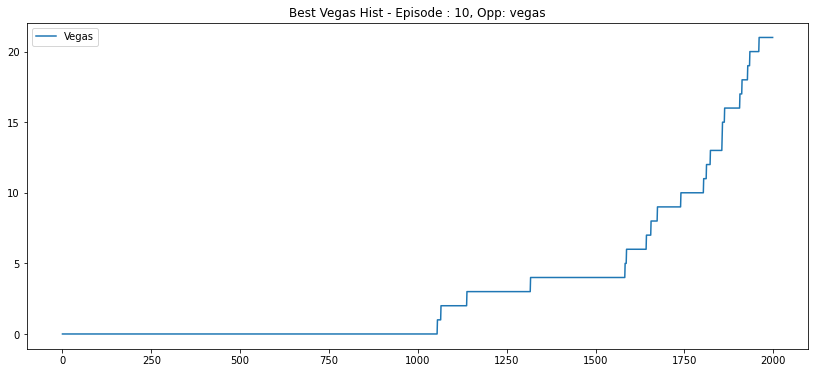

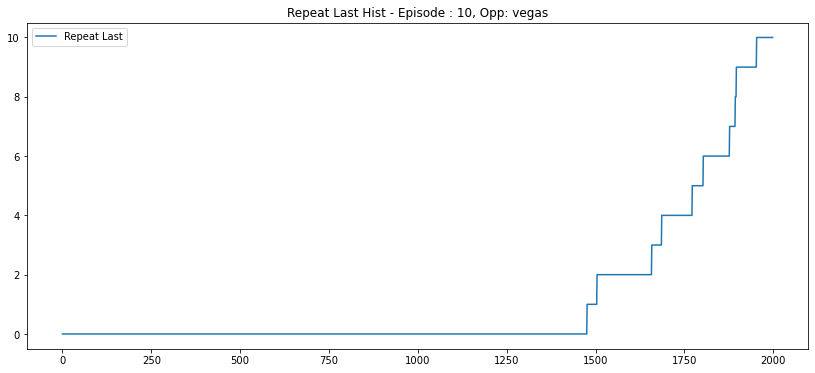

...

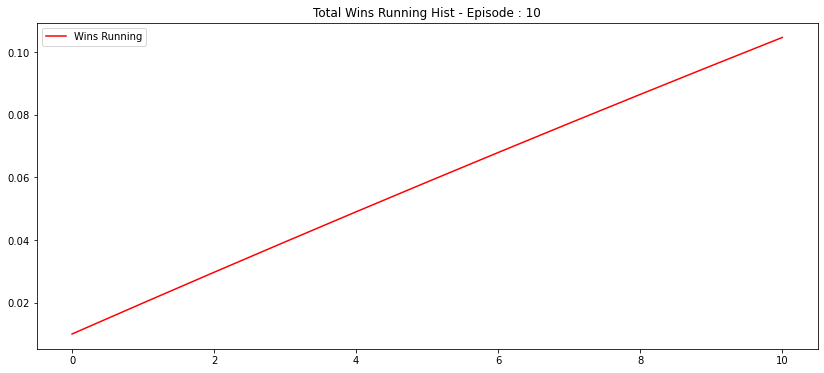

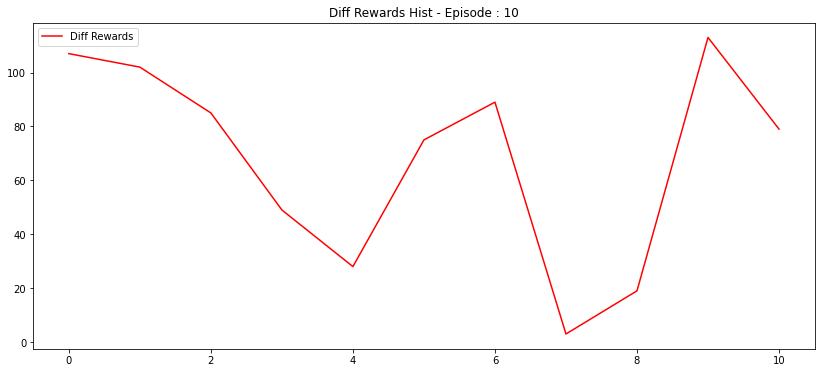

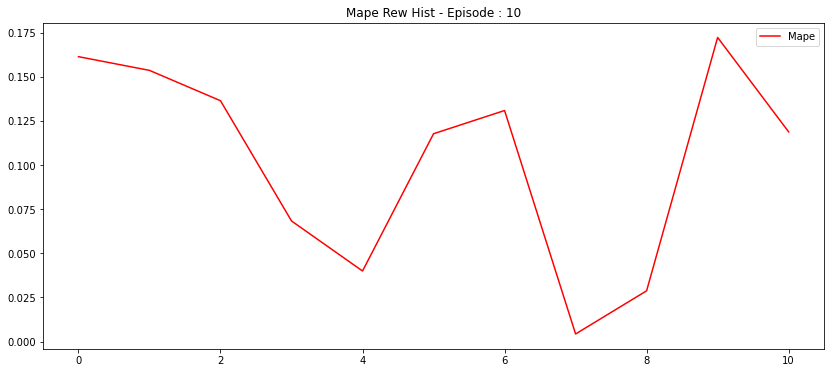

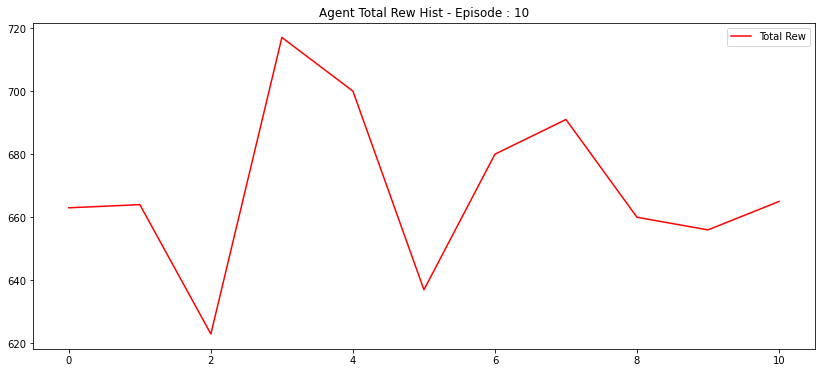

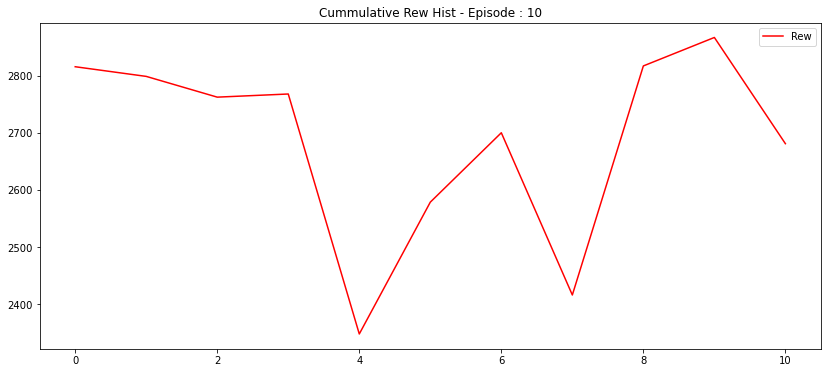

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide


-> Ini env -> 0


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: 

553 433 1354
Env Agent Opp: regressor done, Idx: 2
546 426 1196
Env Agent Opp: regressor done, Idx: 3
631 511 1866
Env Agent Opp: regressor done, Idx: 1
676 663 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6415, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 676, 'step': 1999, 'lastActions': [48, 48]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 663, 'step': 1999, 'lastActions': [48, 48]}
Step: 0
[0.43310684 0.12949581 0.14891192 0.10660908 0.18187639]
0
Step: 500
[9.9754363e-01 1.4084131e-04 5.6670501e-04 5.1263807e-05 1.6975236e-03]
0
Step: 1000
[9.8151141e-01 1.6653580e-03 4.9936203e-03 8.6196238e-04 1.0967714e-02]
0
Step: 1500
[0.9092781  0.01262417 0.0246179  0.00804164 0.04543822]
0
580 639 1999
vegas
Episode: 11
Agent Reward: 580
Opponent Reward: 639
Diff Reward: -59
Wins Nemesis last 10: 0.4


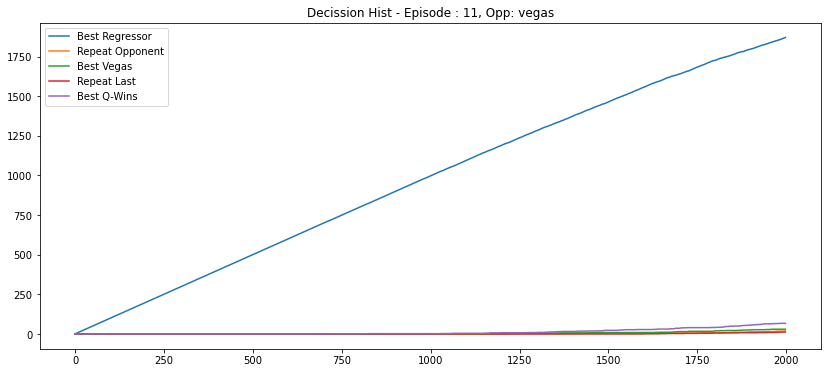

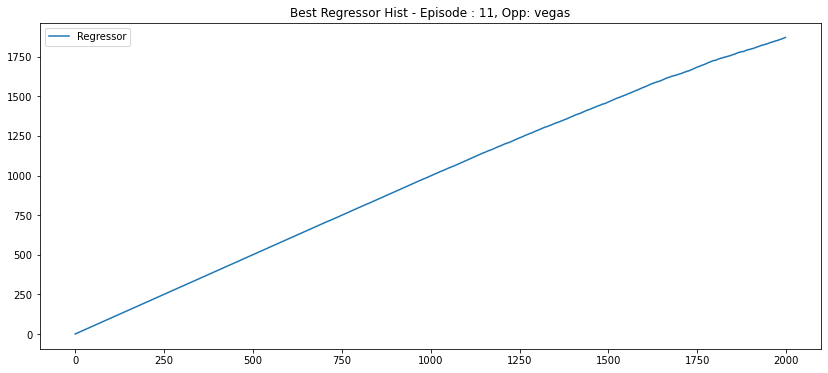

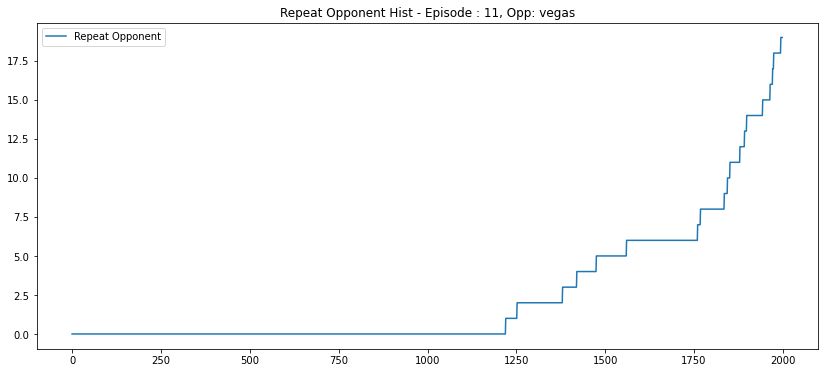

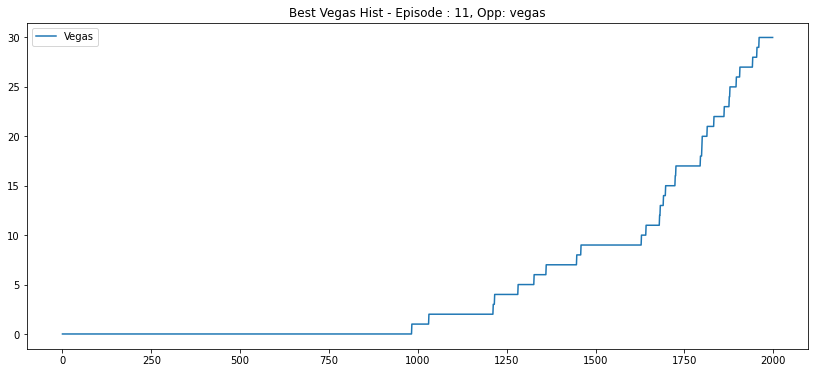

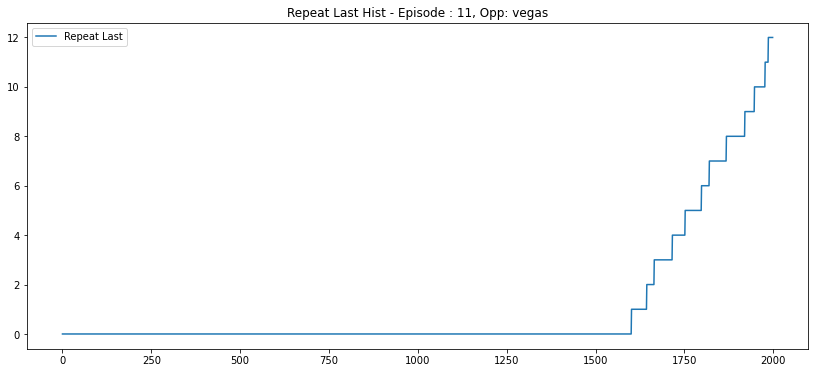

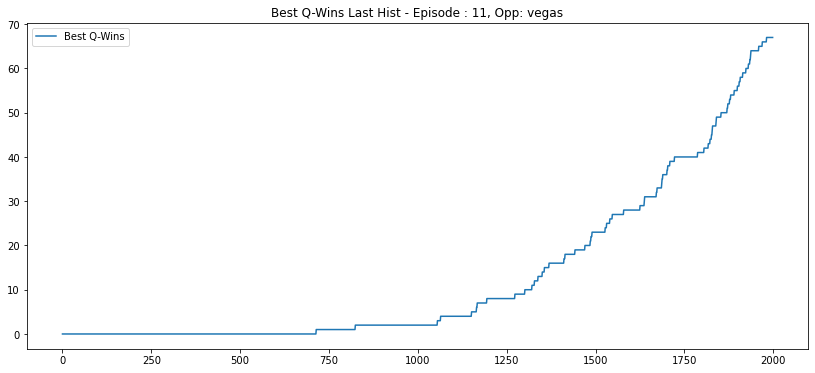

-> Ini env -> 2
722 679 1999
Env Agent Opp: vegas done, Idx: 0
563 443 1368
Env Agent Opp: regressor done, Idx: 2
660 570 1999
Env Agent Opp: regressor done, Idx: 1
685 582 1999
Env Agent Opp: regressor done, Idx: 3
All envs done
Break step: 7365, Done: True, Idx : 3 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 685, 'step': 1999, 'lastActions': [23, 92]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 582, 'step': 1999, 'lastActions': [23, 92]}
Step: 0
[0.55469346 0.09068514 0.13816795 0.09477963 0.12167378]
0
Step: 500
[9.9995768e-01 6.7504982e-07 3.1838605e-05 1.6826581e-06 8.1011740e-06]
0
Step: 1000
[9.9816030e-01 9.0372028e-05 1.0649530e-03 1.6870070e-04 5.1567913e-04]
0
Step: 1500
[0.9774827  0.00254706 0.00935785 0.0030925  0.00751984]
0
597 607 1999
regressor
Episode: 12
Agent Reward: 597
Opponent Reward: 607
Diff Reward: -10
Wins Nemesis last 10: 0.3


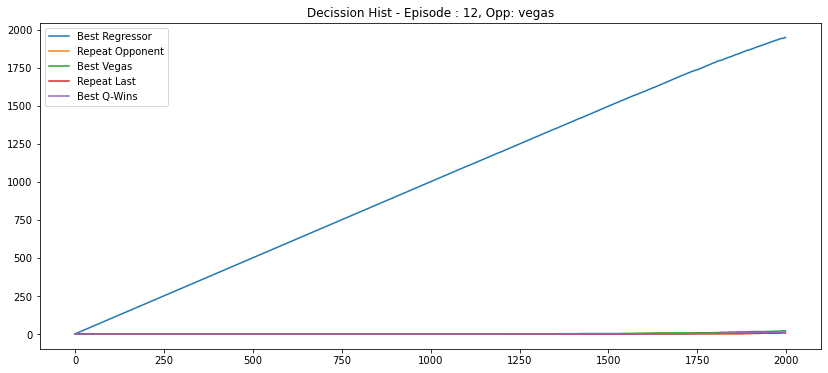

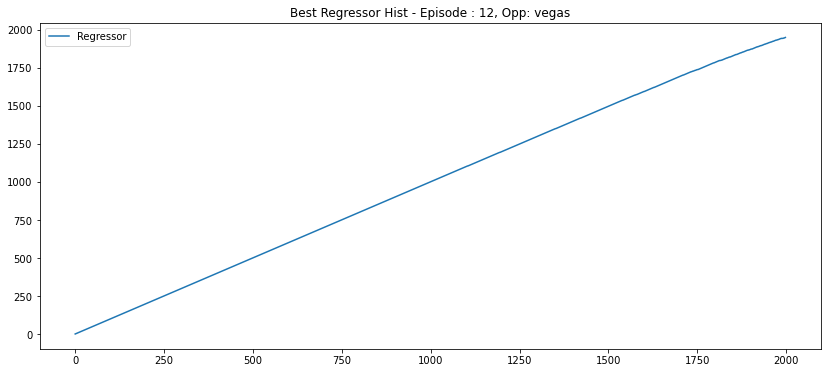

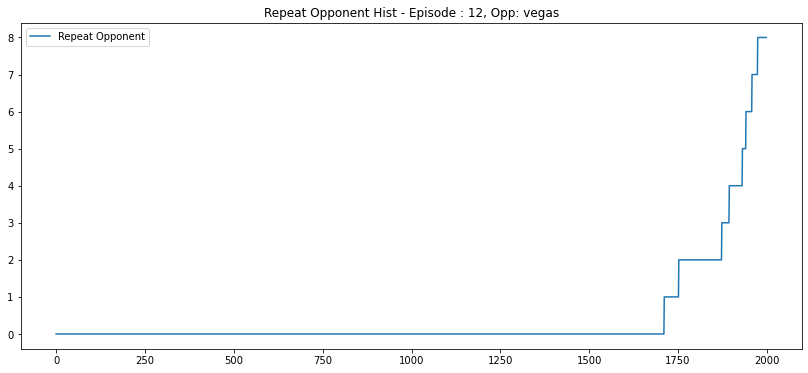

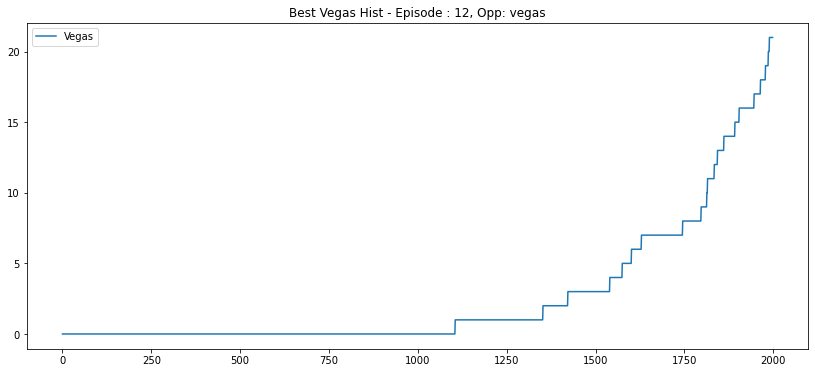

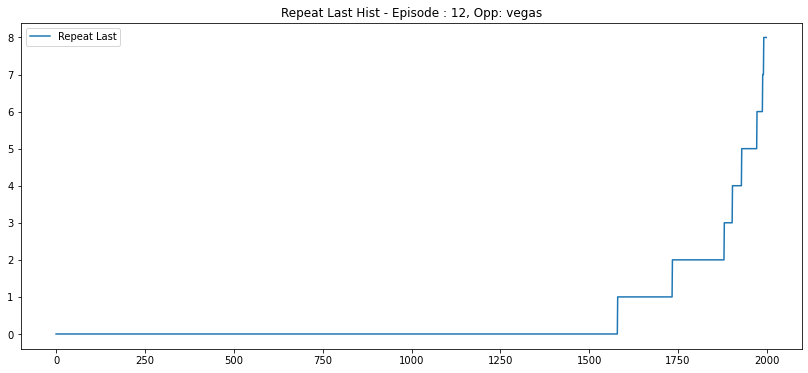

...

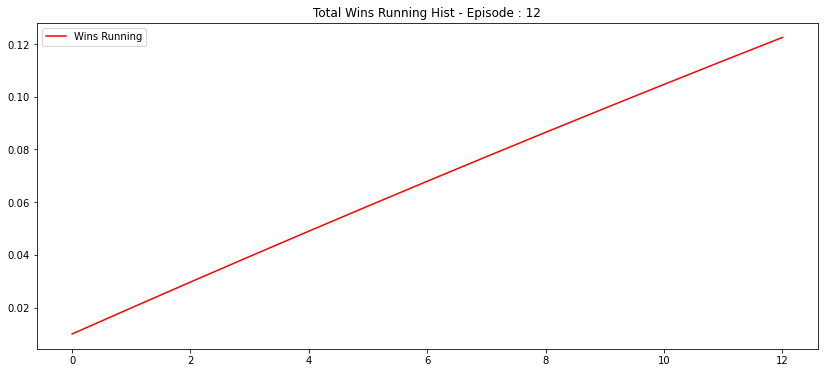

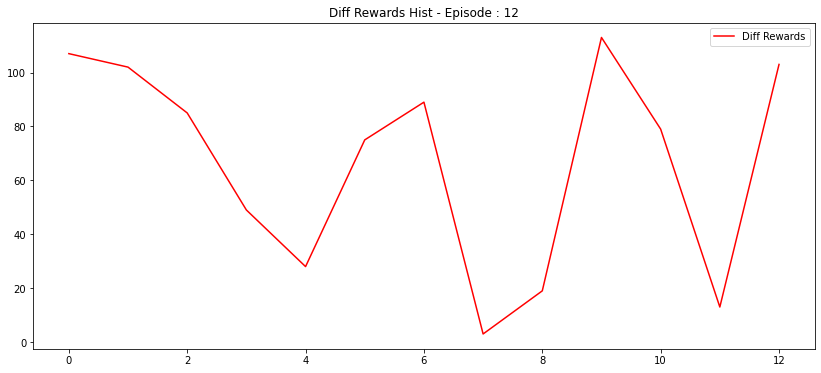

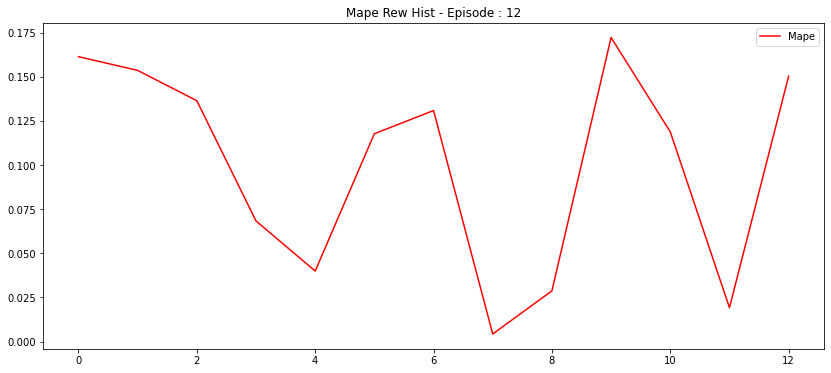

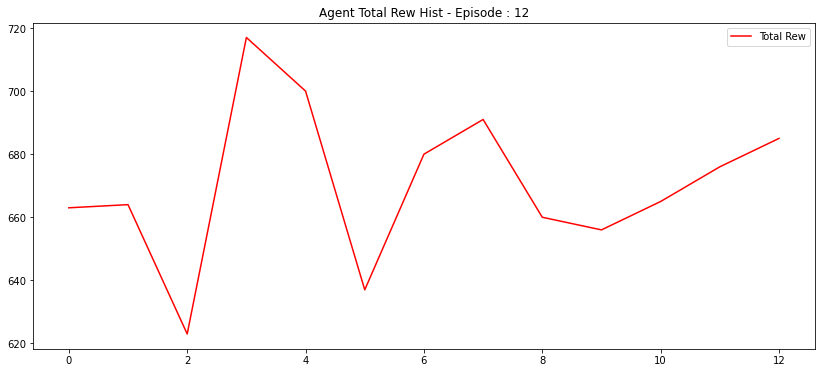

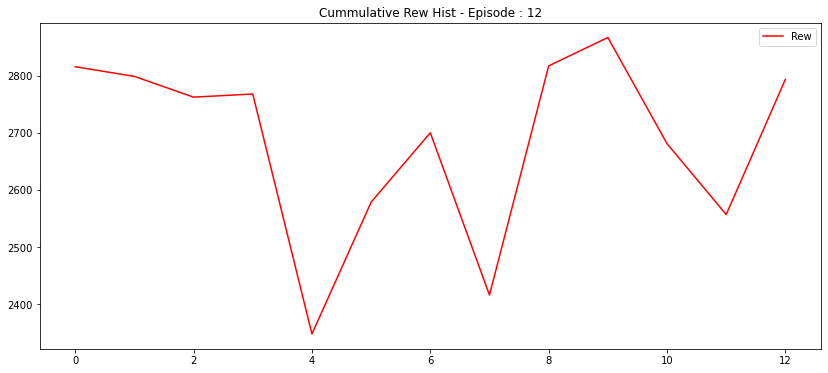

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide


-> Ini env -> 0


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: 

516 396 1249
Env Agent Opp: regressor done, Idx: 1
516 396 1250
Env Agent Opp: regressor done, Idx: 1
606 486 1617
Env Agent Opp: regressor done, Idx: 2
693 590 1999
Env Agent Opp: regressor done, Idx: 3
700 672 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6865, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 700, 'step': 1999, 'lastActions': [69, 14]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 672, 'step': 1999, 'lastActions': [69, 14]}
Step: 0
[0.5988581  0.08392709 0.12336331 0.0769379  0.11691362]
0
Step: 500
[9.9996305e-01 8.5621048e-07 2.3959614e-05 8.0735708e-07 1.1271469e-05]
0
Step: 1000
[9.9926955e-01 4.0481780e-05 3.8783165e-04 3.5520603e-05 2.6656053e-04]
0
Step: 1500
[9.9087536e-01 1.0493698e-03 3.9087753e-03 7.0343597e-04 3.4630804e-03]
0
580 620 1999
vegas
Episode: 13
Agent Reward: 580
Opponent Reward: 620
Diff Reward: -40
Wins Nemesis last 10: 0.3


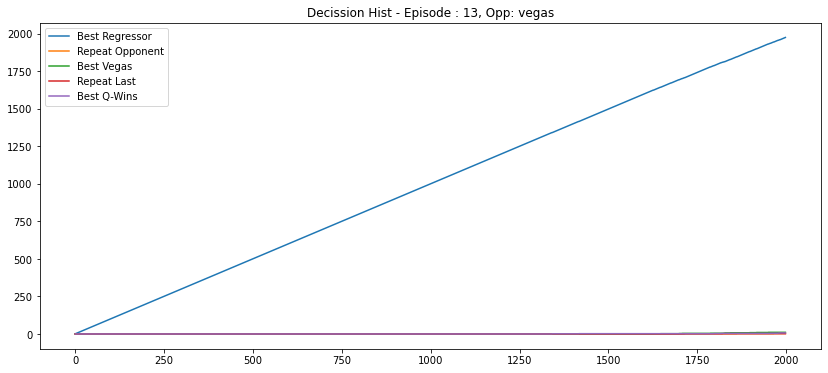

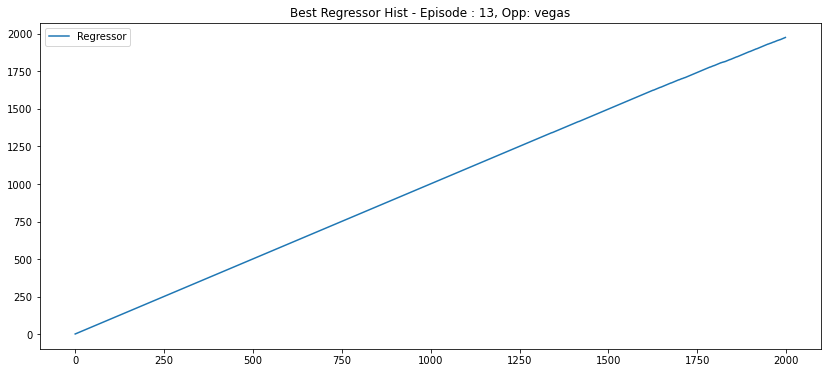

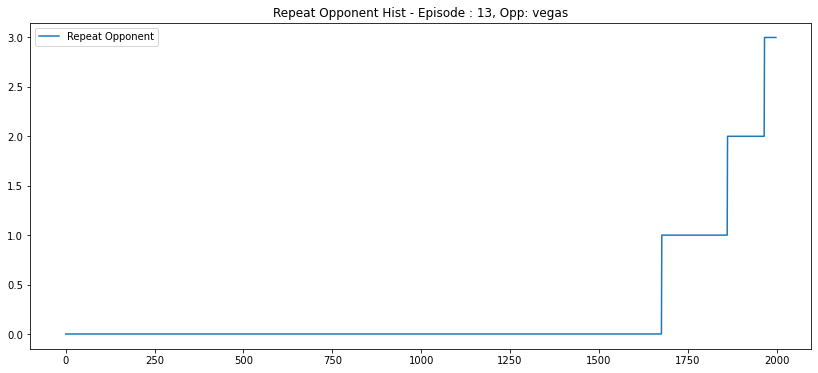

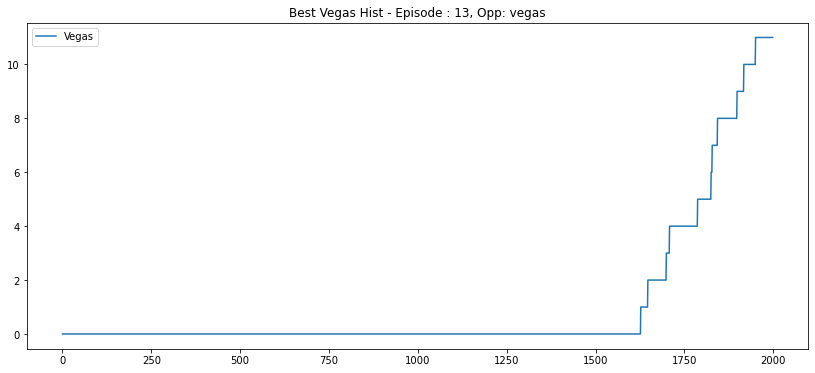

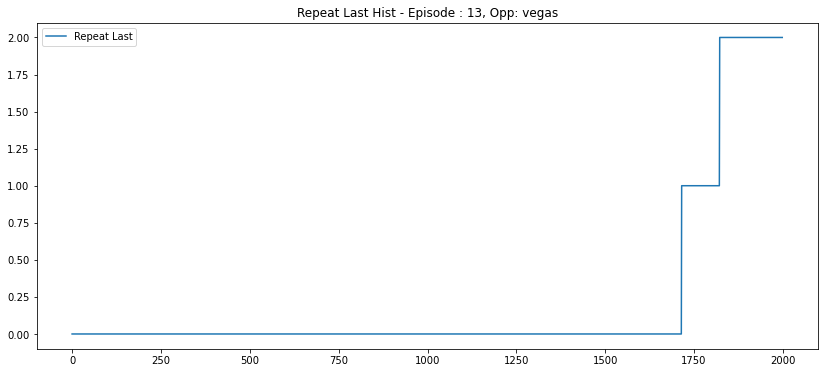

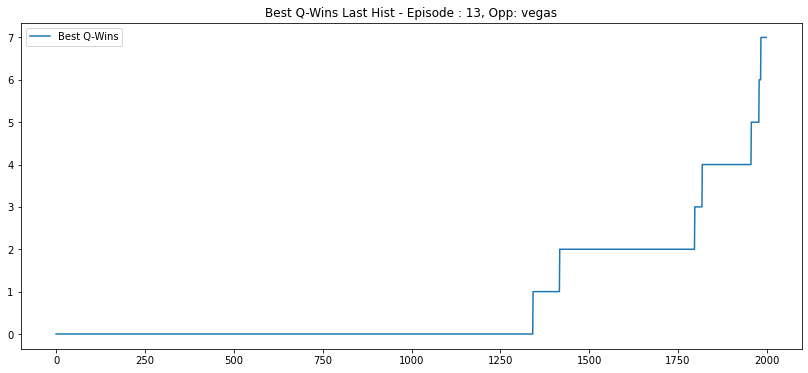

-> Ini env -> 0


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:163: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_count_me' : self.arr_count_me / self.arr_count,


449 329 970
Env Agent Opp: regressor done, Idx: 2
517 397 1223
Env Agent Opp: regressor done, Idx: 1
694 611 1999
Env Agent Opp: regressor done, Idx: 3
688 667 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6191, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 688, 'step': 1999, 'lastActions': [50, 46]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 667, 'step': 1999, 'lastActions': [50, 46]}
Step: 0
[0.6113363  0.08437067 0.11398824 0.07498031 0.11532453]
0
Step: 500
[9.9995363e-01 2.0116643e-06 2.4074345e-05 1.6007656e-06 1.8755807e-05]
0
Step: 1000
[9.9809152e-01 1.6750503e-04 8.8069413e-04 1.2656176e-04 7.3364063e-04]
0
Step: 1500
[0.9765618  0.00374024 0.00767078 0.00258223 0.00944496]
0
572 580 1999
regressor
Episode: 14
Agent Reward: 572
Opponent Reward: 580
Diff Reward: -8
Wins Nemesis last 10: 0.2


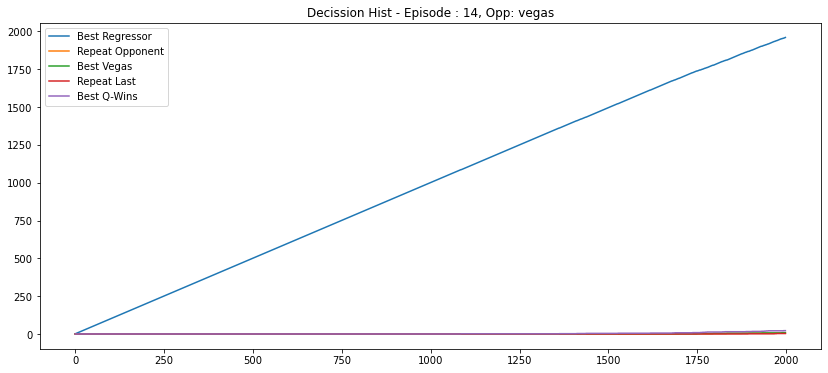

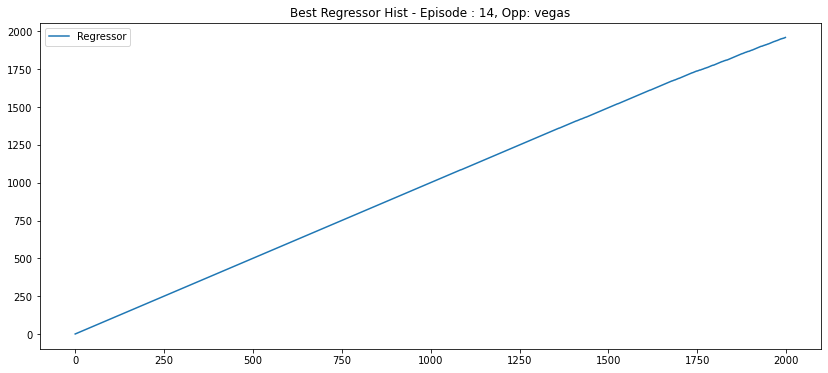

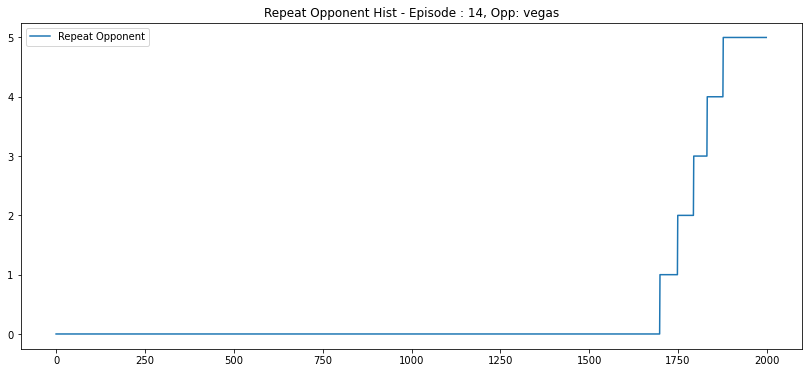

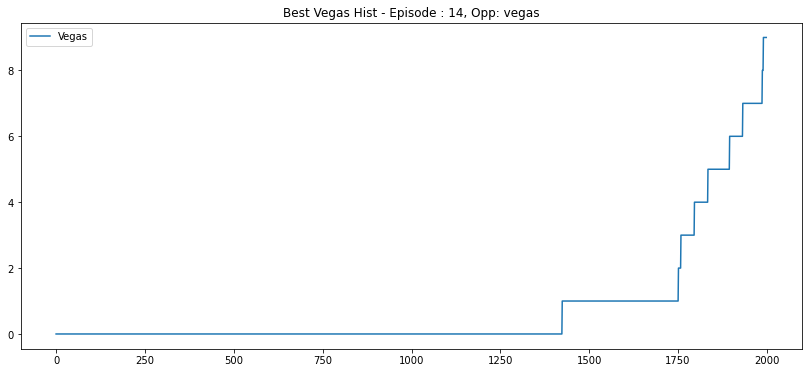

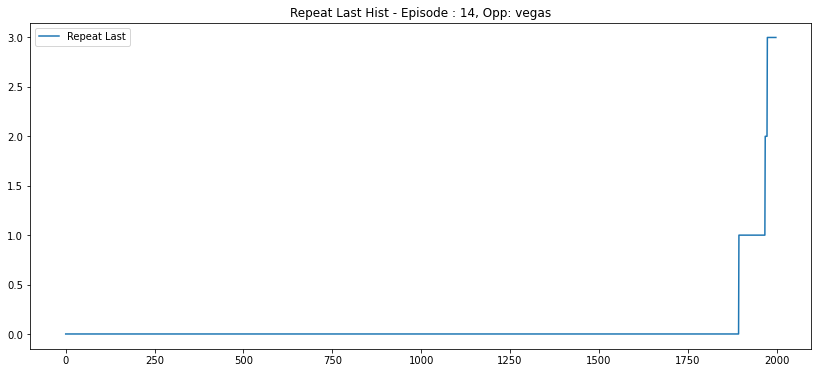

...

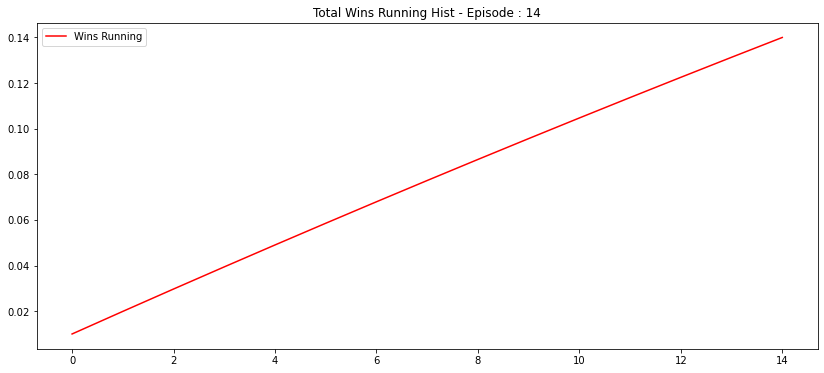

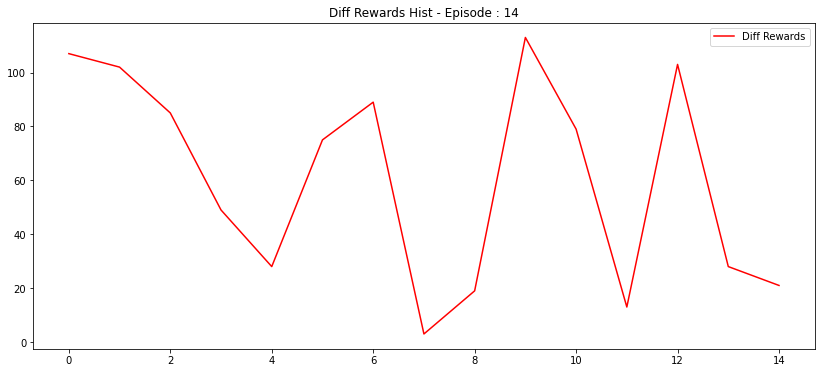

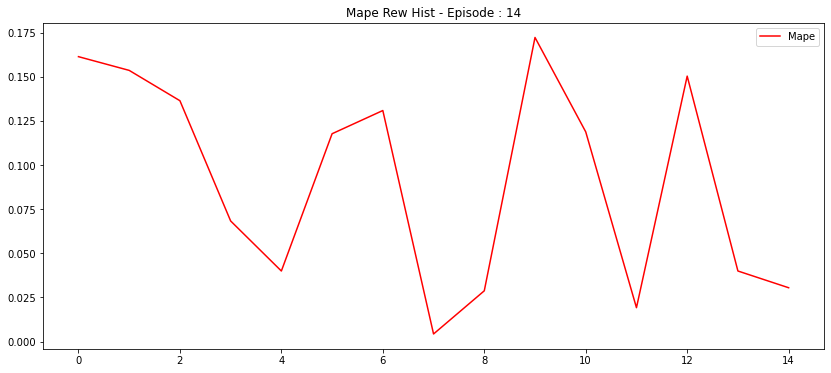

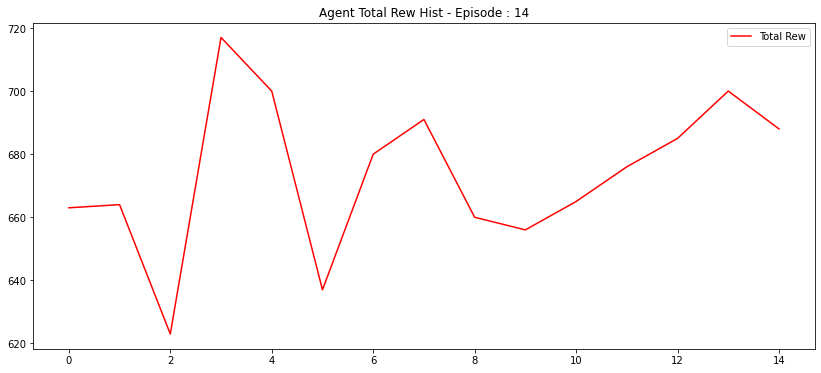

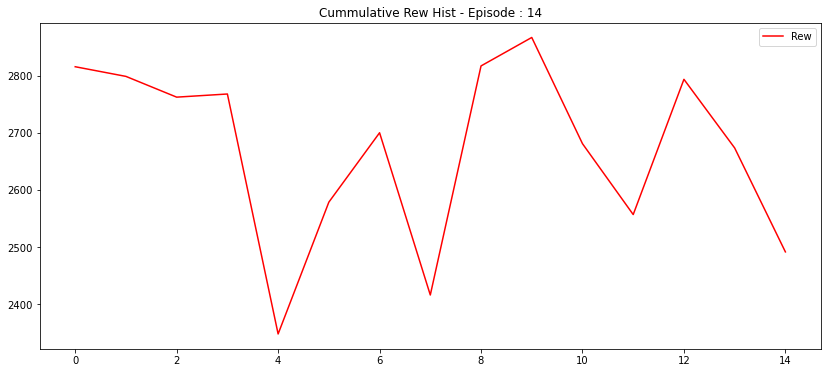

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 2


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


611 491 1531
Env Agent Opp: regressor done, Idx: 3
611 603 1999
Env Agent Opp: vegas done, Idx: 0
643 535 1999
Env Agent Opp: regressor done, Idx: 2
658 576 1999
Env Agent Opp: regressor done, Idx: 1
All envs done
Break step: 7528, Done: True, Idx : 1 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 658, 'step': 1999, 'lastActions': [16, 95]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 576, 'step': 1999, 'lastActions': [16, 95]}
INFO:tensorflow:Assets written to: ../04_Models/ActorCritic/Decission//model_a2c_dec_multienv_v0.6_15\assets
Step: 0
[0.7162259  0.06235914 0.0836997  0.05629453 0.08142063]
0
Step: 500
[9.9999964e-01 1.4764776e-08 2.3826483e-07 1.1127324e-08 1.4190651e-07]
0
Step: 1000
[9.9996233e-01 2.6448934e-06 1.8900537e-05 1.9826534e-06 1.4233453e-05]
0
Step: 1500
[9.9884170e-01 1.4517352e-04 4.5346367e-04 1.1939528e-04 4.4033086e-04]
0
591 612 1999
vegas
Episode: 15
Agent Reward: 591
Opponent Reward: 612
Diff Reward: -21
Wins Nemesis last 

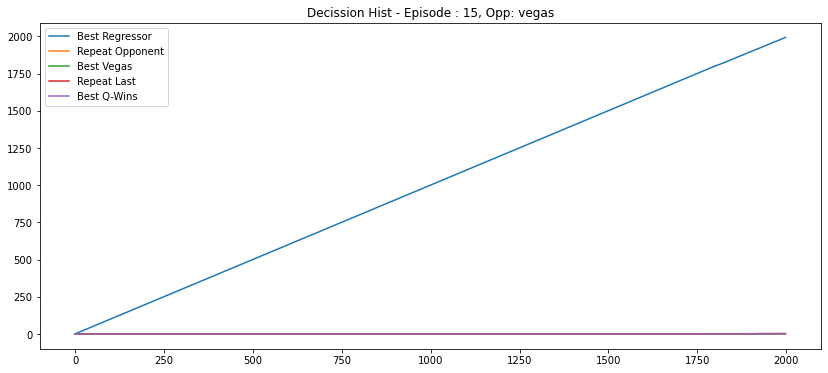

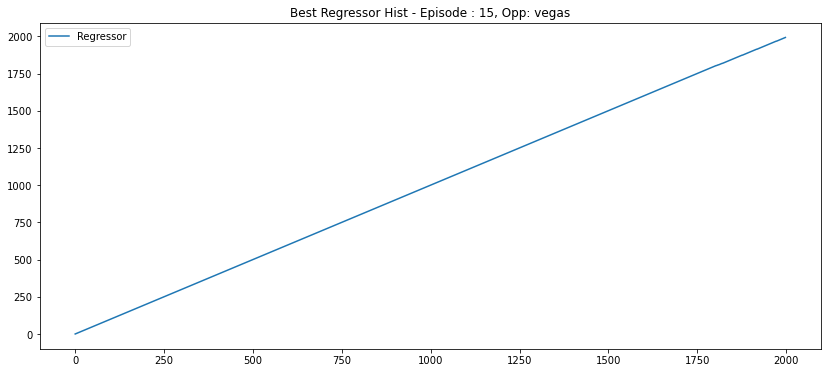

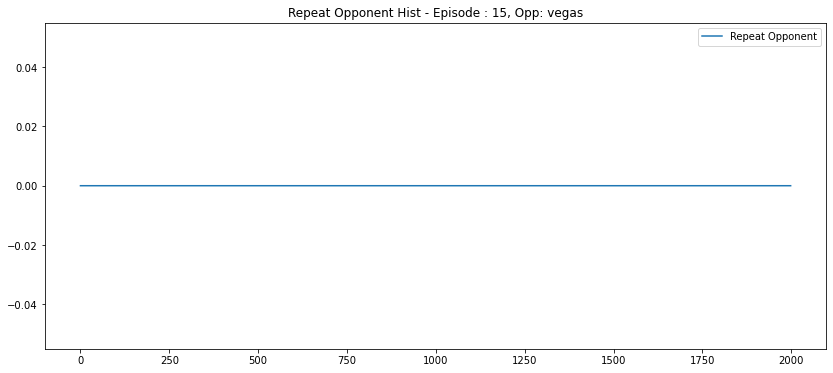

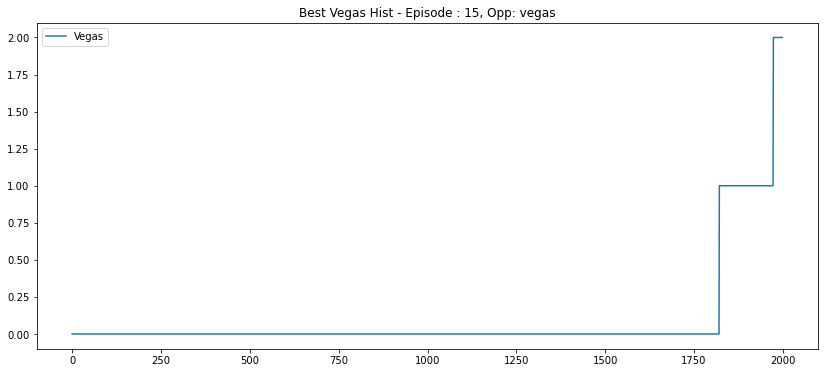

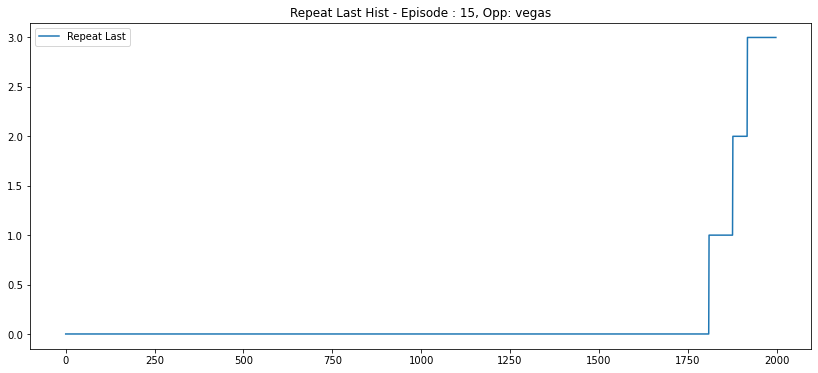

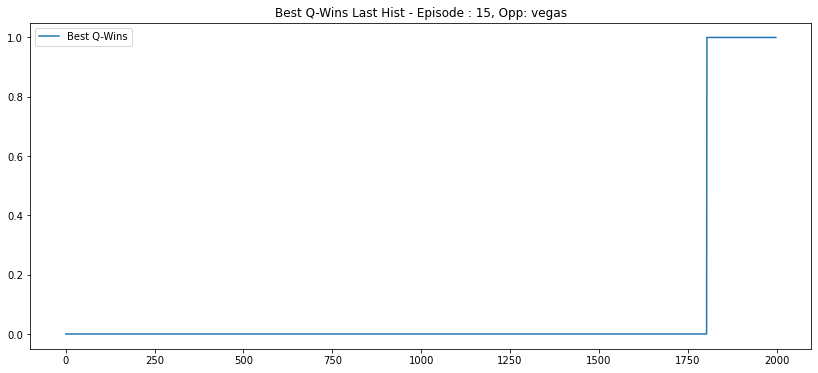

-> Ini env -> 3
576 456 1277
Env Agent Opp: regressor done, Idx: 3
717 730 1999
Env Agent Opp: vegas done, Idx: 0
600 480 1571
Env Agent Opp: regressor done, Idx: 1
565 445 1548
Env Agent Opp: regressor done, Idx: 2
All envs done
Break step: 6395, Done: True, Idx : 2 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 565, 'step': 1548, 'lastActions': [16, 60]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 445, 'step': 1548, 'lastActions': [16, 60]}
Step: 0
[0.71600765 0.06565005 0.07910304 0.05778743 0.08145182]
0
Step: 500
[9.9999940e-01 4.2260432e-08 3.0992805e-07 2.6889381e-08 2.6236006e-07]
0
Step: 1000
[9.9993503e-01 6.9543539e-06 2.6538324e-05 4.4663102e-06 2.7031952e-05]
0
Step: 1500
[9.9599177e-01 7.6216797e-04 1.3653013e-03 4.7099256e-04 1.4098387e-03]
0
584 631 1999
vegas
Episode: 16
Agent Reward: 584
Opponent Reward: 631
Diff Reward: -47
Wins Nemesis last 10: 0.1


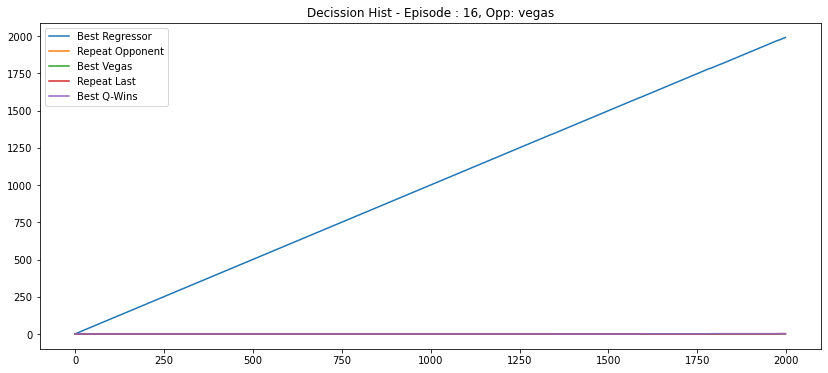

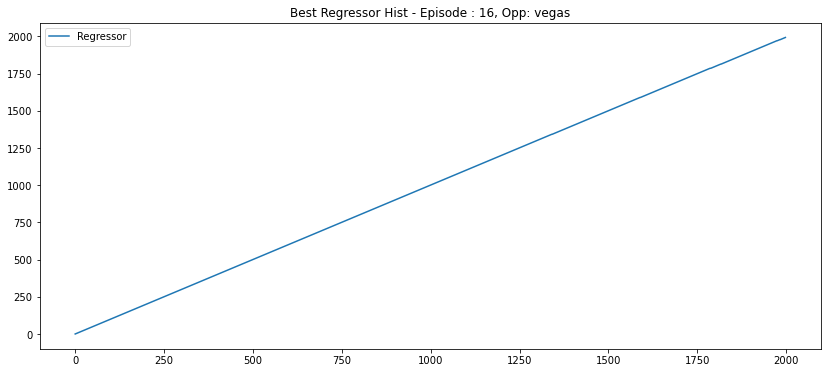

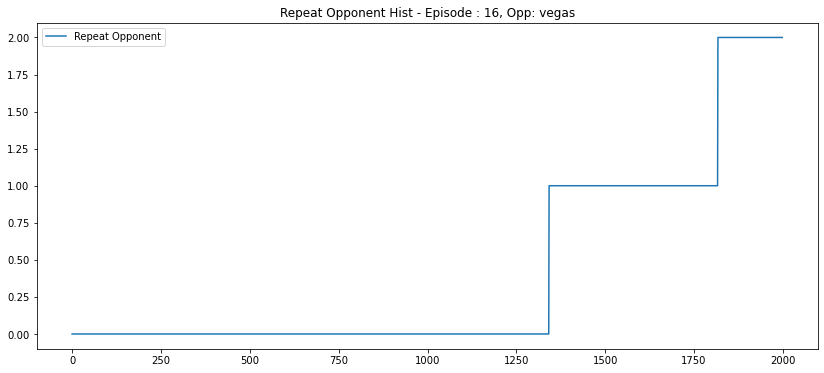

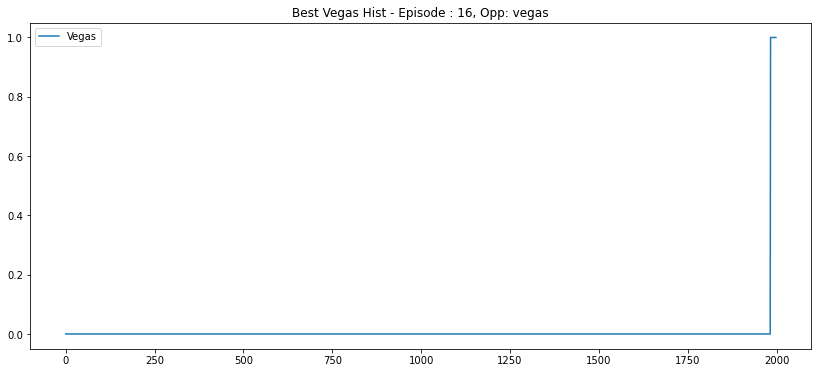

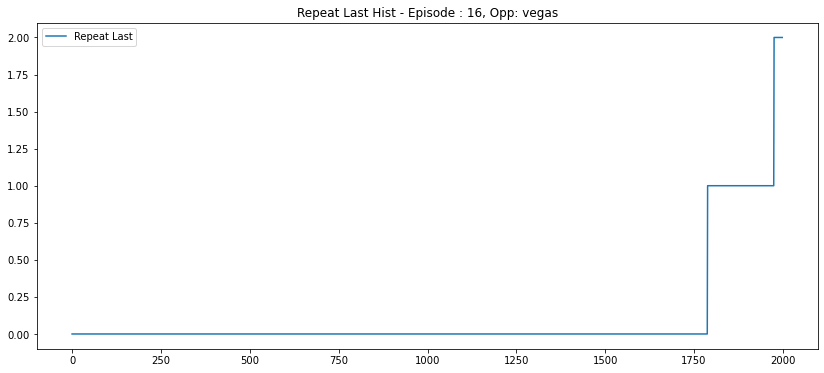

...

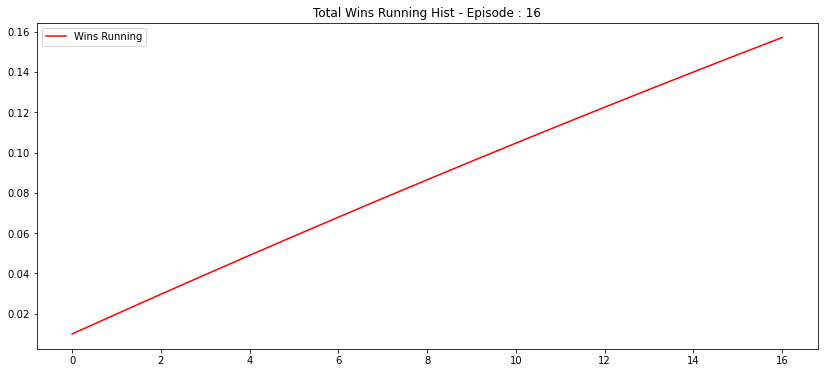

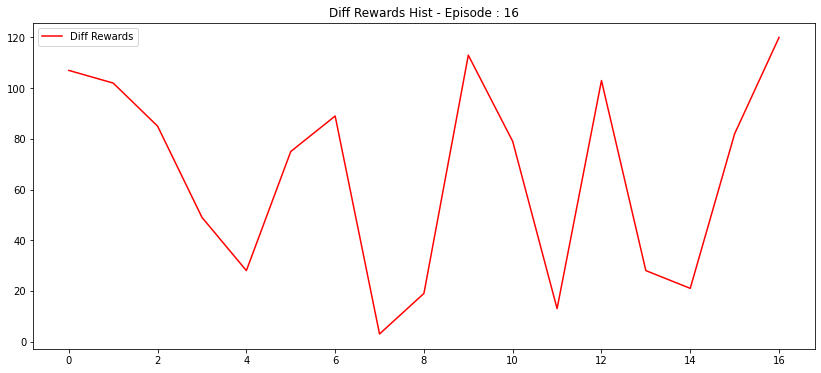

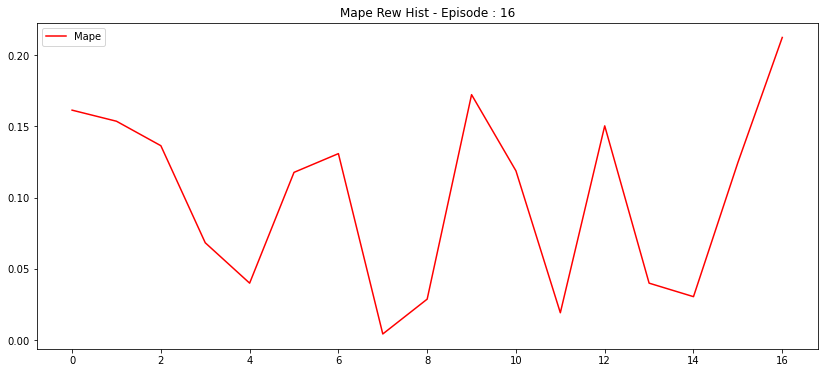

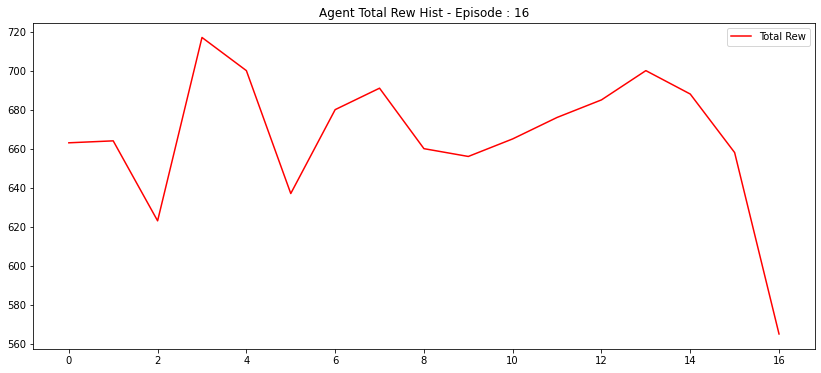

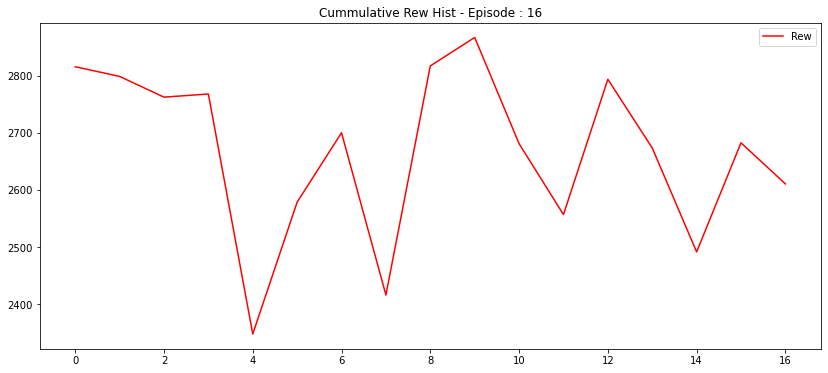

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 3


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


470 350 968
Env Agent Opp: regressor done, Idx: 1
637 517 1620
Env Agent Opp: regressor done, Idx: 3
663 543 1925
Env Agent Opp: regressor done, Idx: 2
696 685 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6512, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 696, 'step': 1999, 'lastActions': [0, 17]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 685, 'step': 1999, 'lastActions': [0, 17]}
Step: 0
[0.747122   0.05744809 0.07143185 0.05048352 0.07351459]
0
Step: 500
[1.0000000e+00 3.2856511e-09 3.4849002e-08 2.1087811e-09 2.6272618e-08]
0
Step: 1000
[9.9998951e-01 9.1535878e-07 4.6782347e-06 5.9889624e-07 4.3477962e-06]
0
Step: 1500
[9.9879599e-01 1.7402954e-04 4.1958783e-04 1.3083365e-04 4.7952629e-04]
0
591 612 1999
vegas
Episode: 17
Agent Reward: 591
Opponent Reward: 612
Diff Reward: -21
Wins Nemesis last 10: 0.0


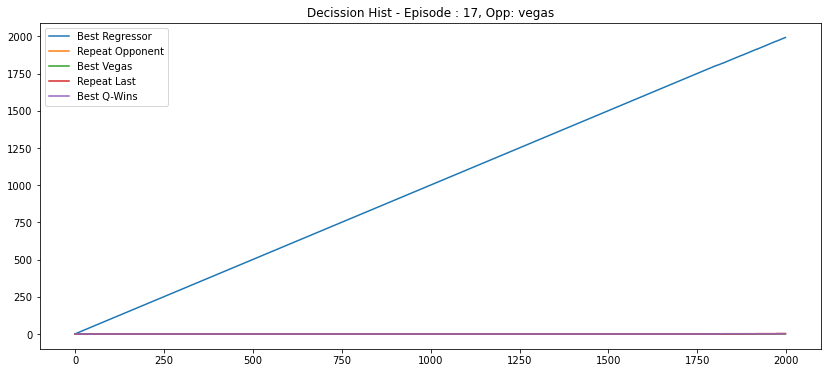

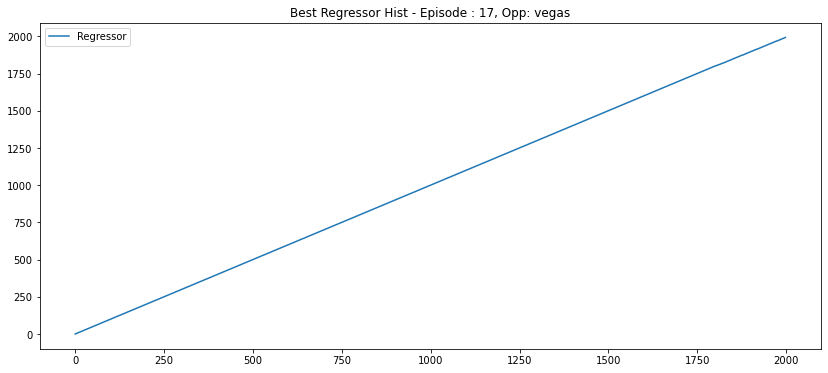

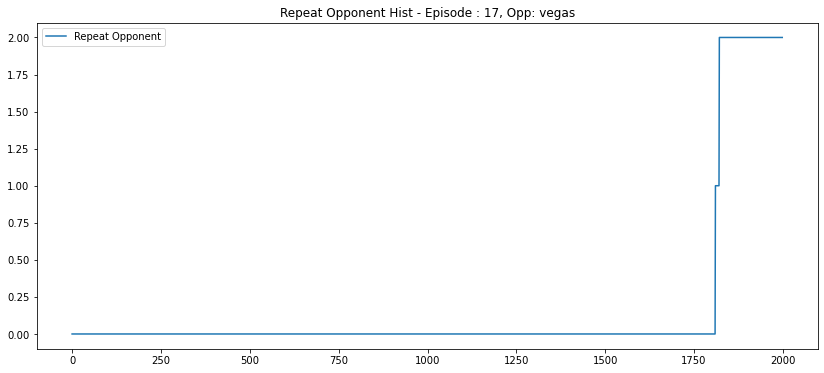

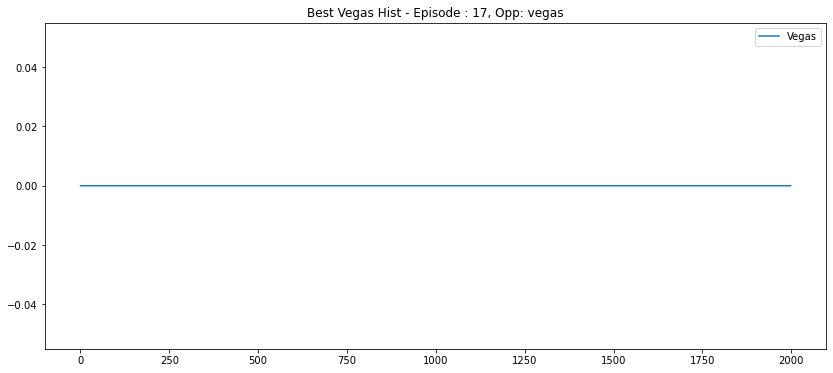

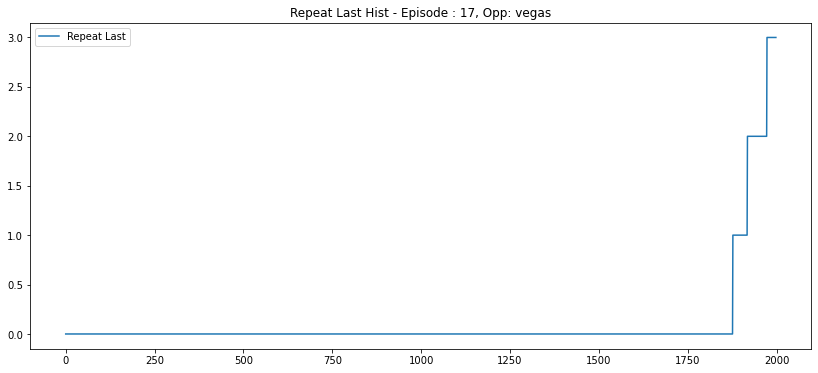

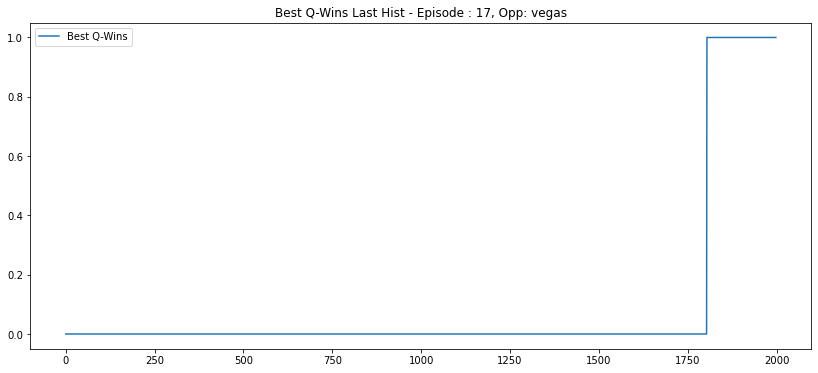

-> Ini env -> 2
722 678 1999
Env Agent Opp: vegas done, Idx: 0
682 570 1999
Env Agent Opp: regressor done, Idx: 1
600 480 1611
Env Agent Opp: regressor done, Idx: 2
670 574 1999
Env Agent Opp: regressor done, Idx: 3
All envs done
Break step: 7608, Done: True, Idx : 3 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 670, 'step': 1999, 'lastActions': [3, 81]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 574, 'step': 1999, 'lastActions': [3, 81]}
Step: 0
[0.79996634 0.04606104 0.05844621 0.03662534 0.05890115]
0
Step: 500
[1.0000000e+00 3.1363670e-10 4.6879411e-09 1.3640598e-10 2.4540519e-09]
0
Step: 1000
[9.9998629e-01 1.3310133e-06 6.3229704e-06 6.7584665e-07 5.3791578e-06]
0
Step: 1500
[9.9946398e-01 7.6696328e-05 2.0632076e-04 4.3442789e-05 2.0962620e-04]
0
645 642 1999
regressor
Episode: 18
Agent Reward: 645
Opponent Reward: 642
Diff Reward: 3
Wins Nemesis last 10: 0.1


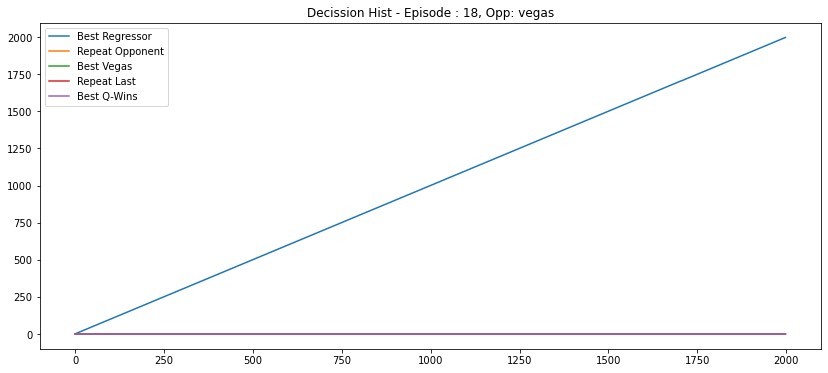

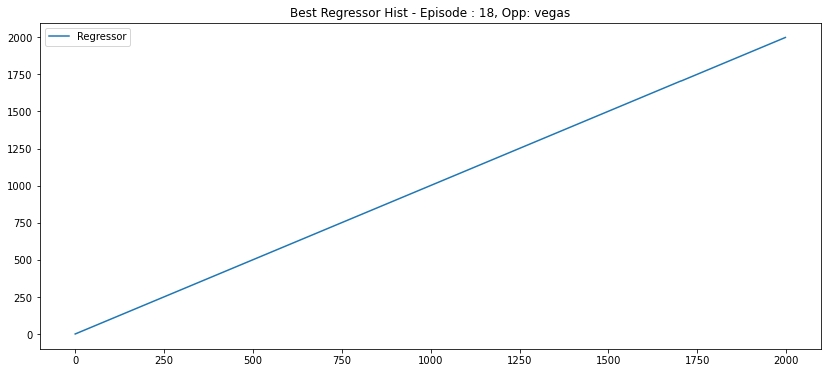

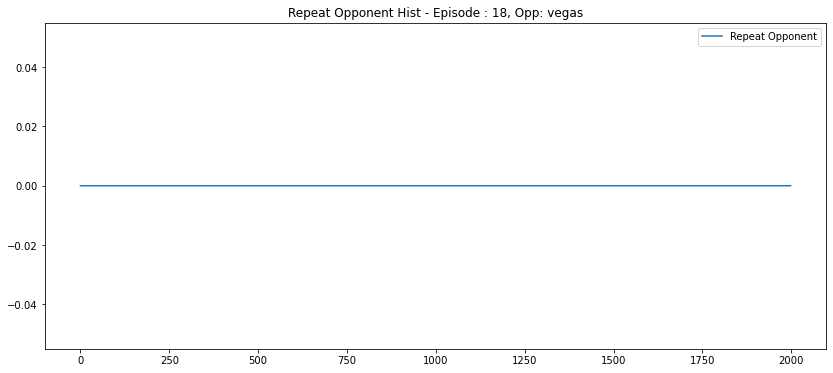

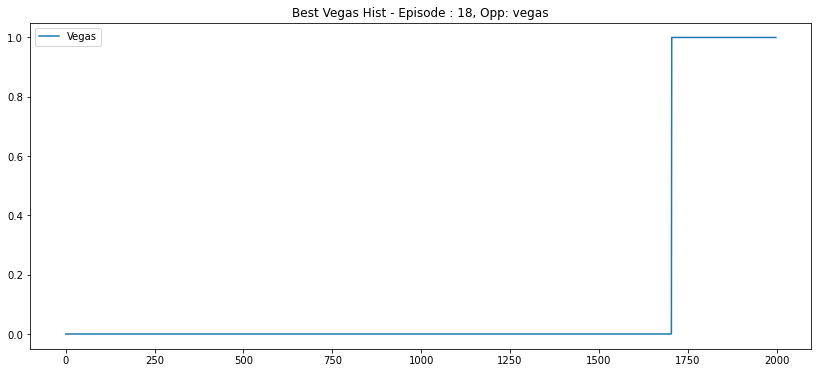

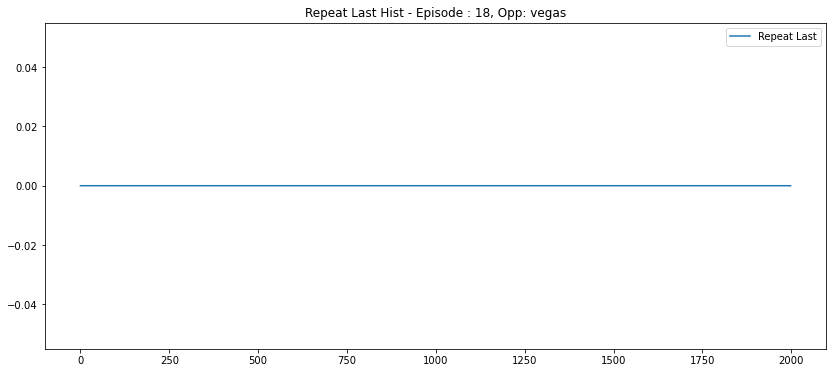

...

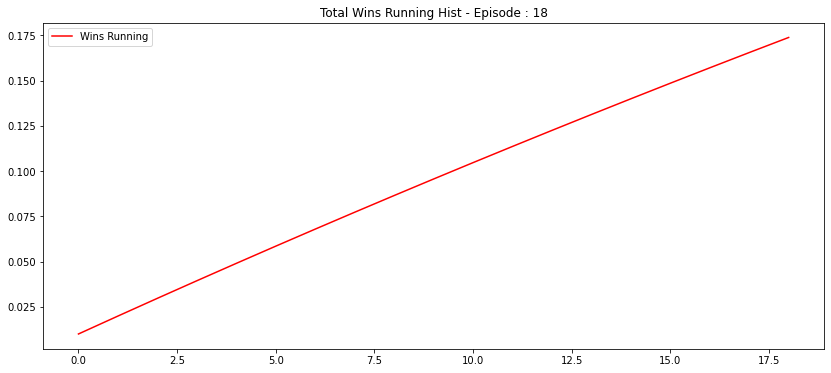

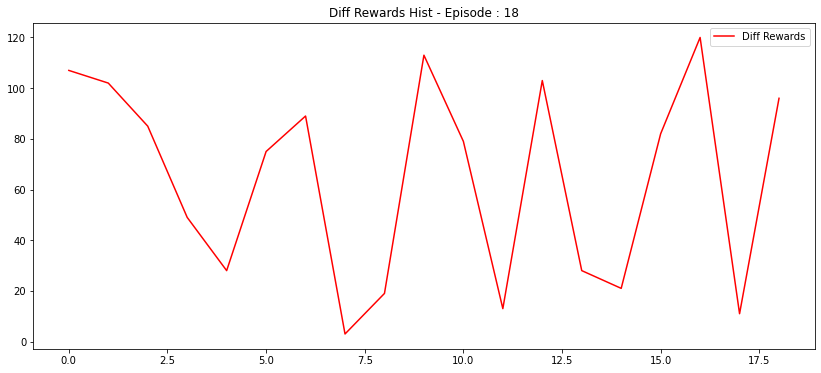

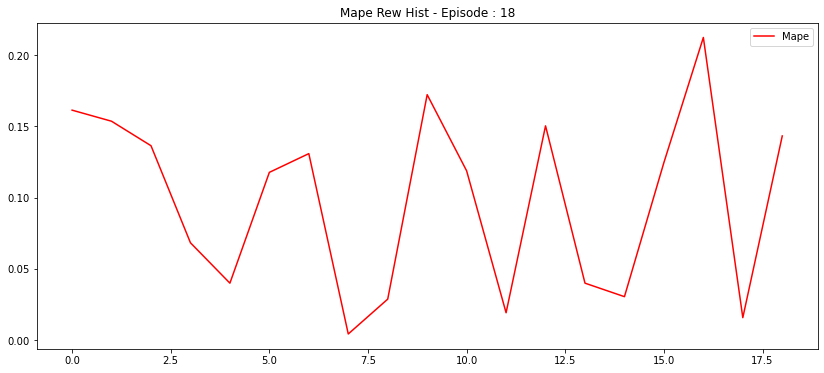

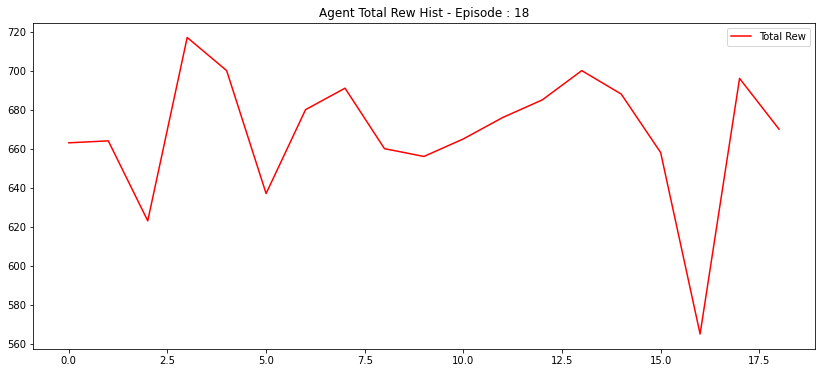

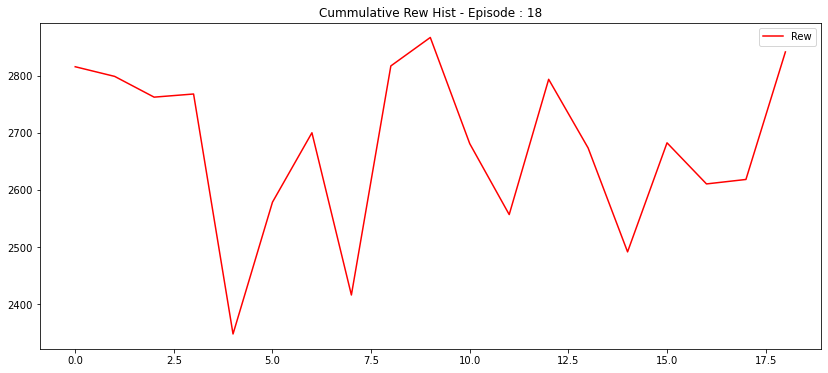

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 1


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


525 405 1261
Env Agent Opp: regressor done, Idx: 2
613 493 1527
Env Agent Opp: regressor done, Idx: 3
639 557 1999
Env Agent Opp: regressor done, Idx: 1
570 578 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6786, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 570, 'step': 1999, 'lastActions': [4, 15]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 578, 'step': 1999, 'lastActions': [4, 15]}
Step: 0
[0.7170231  0.07476447 0.07345133 0.05020954 0.08455153]
0
Step: 500
[9.9999833e-01 2.8719717e-07 6.6054190e-07 5.7417857e-08 7.3302573e-07]
0
Step: 1000
[9.9721020e-01 7.0037181e-04 8.7581546e-04 2.4158609e-04 9.7189337e-04]
0
Step: 1500
[0.98402923 0.00407164 0.00383304 0.00161349 0.0064526 ]
0
639 623 1999
regressor
Episode: 19
Agent Reward: 639
Opponent Reward: 623
Diff Reward: 16
Wins Nemesis last 10: 0.2


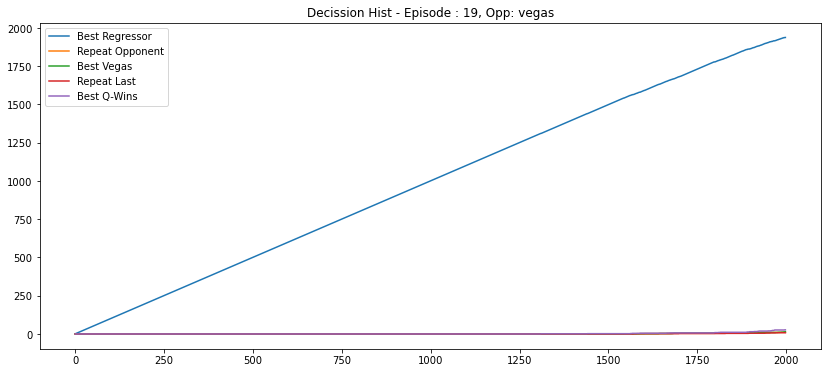

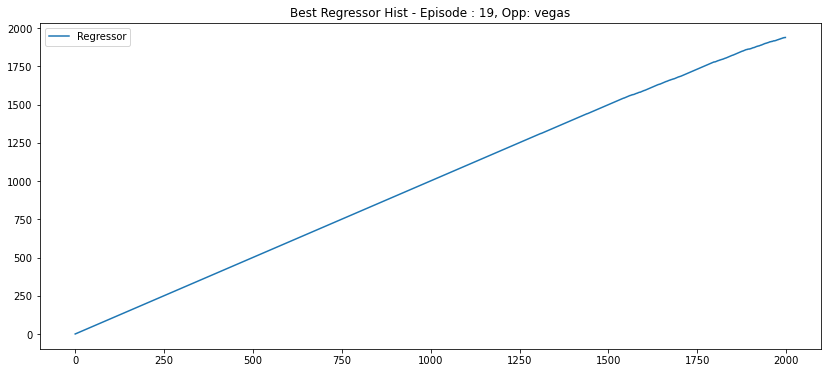

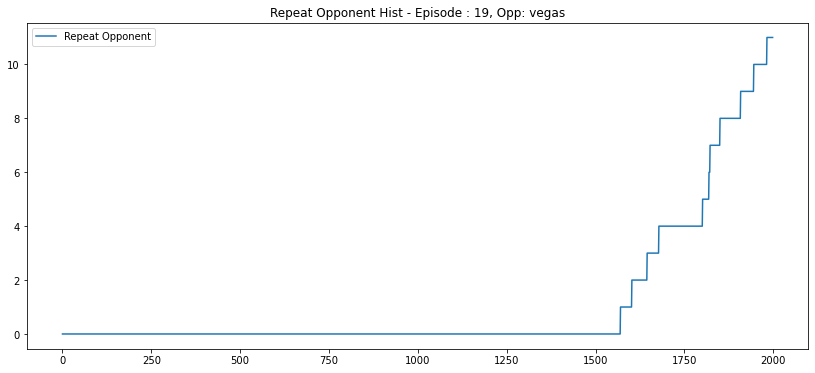

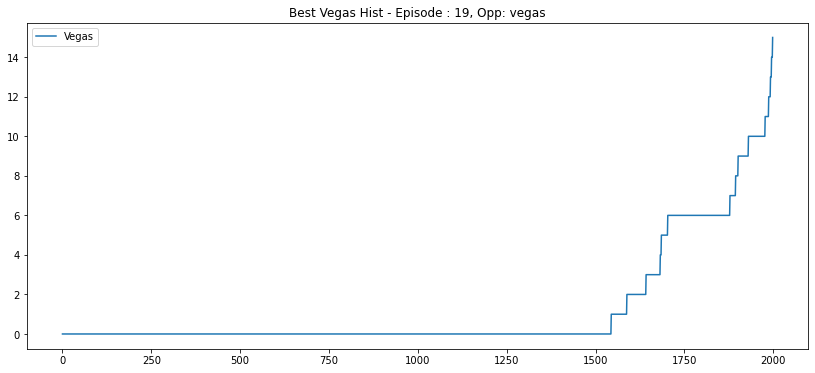

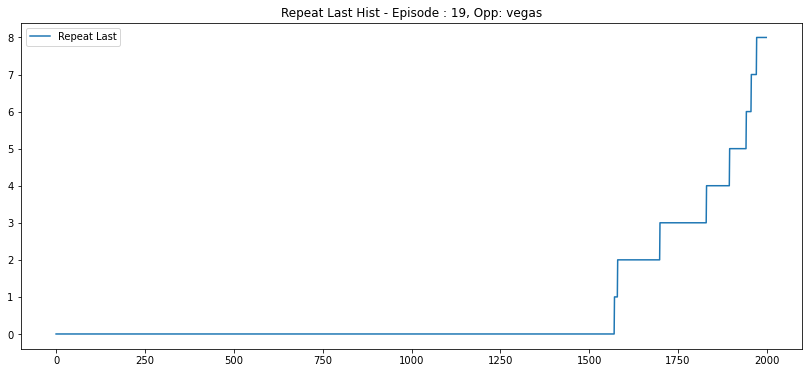

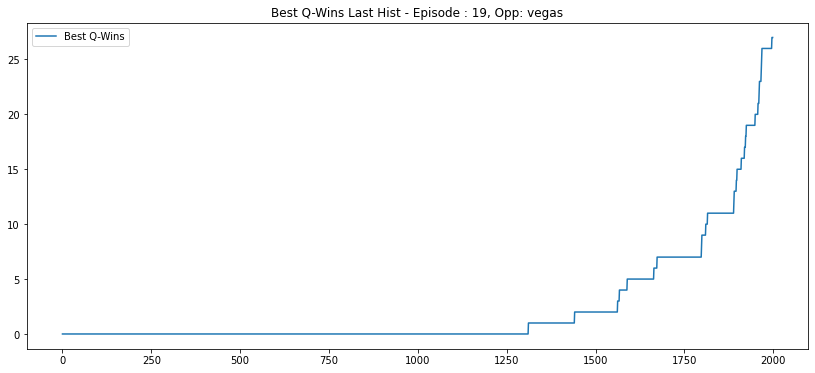

-> Ini env -> 3
480 360 980
Env Agent Opp: regressor done, Idx: 2
524 404 1302
Env Agent Opp: regressor done, Idx: 1
693 598 1999
Env Agent Opp: regressor done, Idx: 3
629 614 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6280, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 629, 'step': 1999, 'lastActions': [45, 9]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 614, 'step': 1999, 'lastActions': [45, 9]}
INFO:tensorflow:Assets written to: ../04_Models/ActorCritic/Decission//model_a2c_dec_multienv_v0.6_20\assets
Step: 0
[0.78777015 0.05605404 0.05594457 0.0359007  0.0643306 ]
0
Step: 500
[1.0000000e+00 9.7913286e-09 2.2837236e-08 1.0772470e-09 2.8748033e-08]
0
Step: 1000
[9.9998569e-01 2.8261716e-06 4.6335977e-06 5.1768745e-07 6.3613429e-06]
0
Step: 1500
[9.9906284e-01 2.1324093e-04 2.5888867e-04 6.4112384e-05 4.0096982e-04]
0
587 615 1999
vegas
Episode: 20
Agent Reward: 587
Opponent Reward: 615
Diff Reward: -28
Wins 

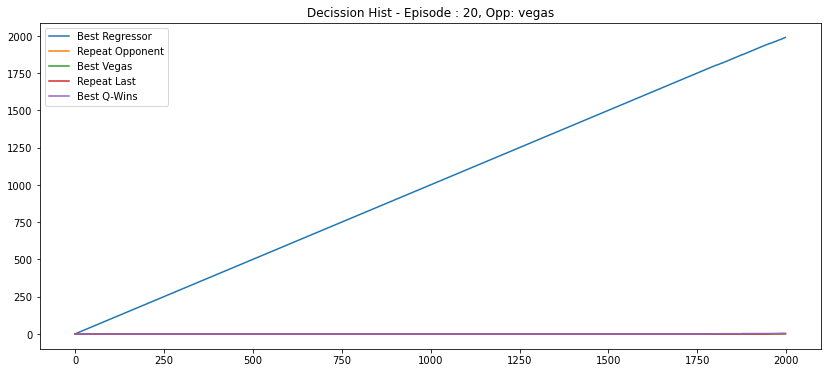

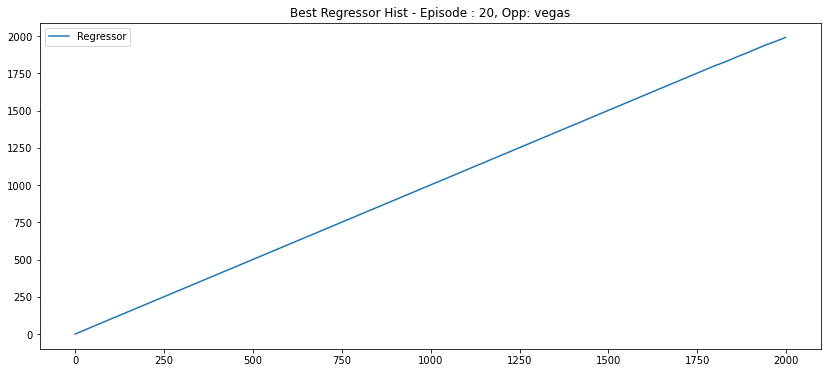

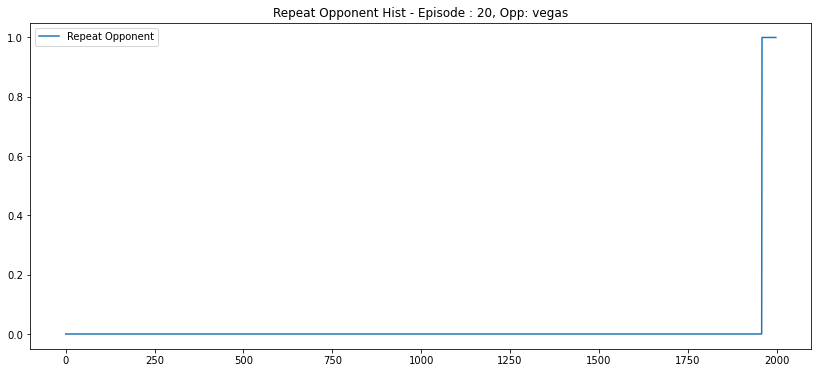

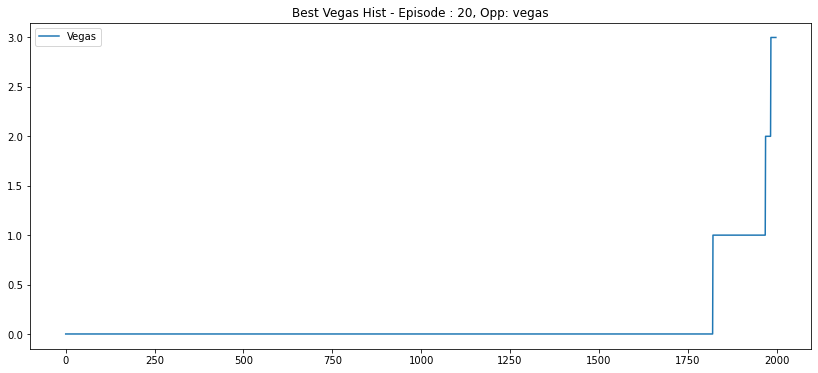

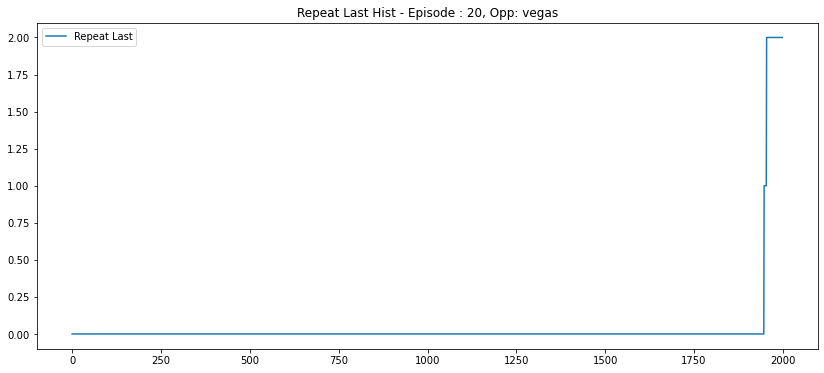

...

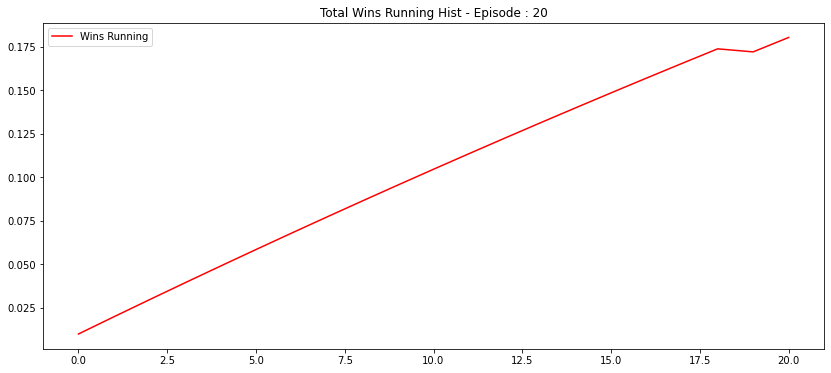

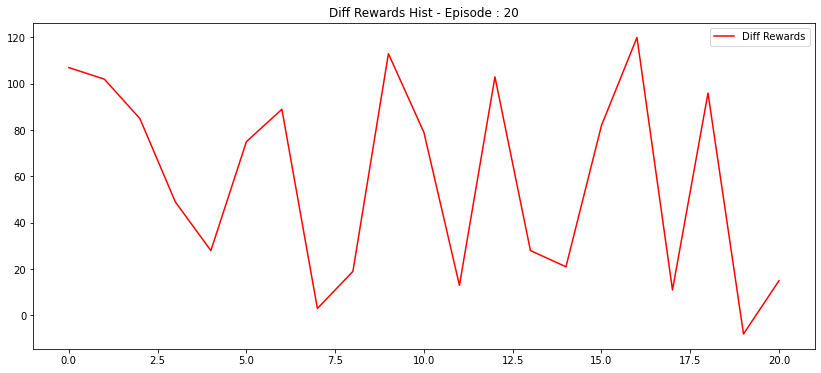

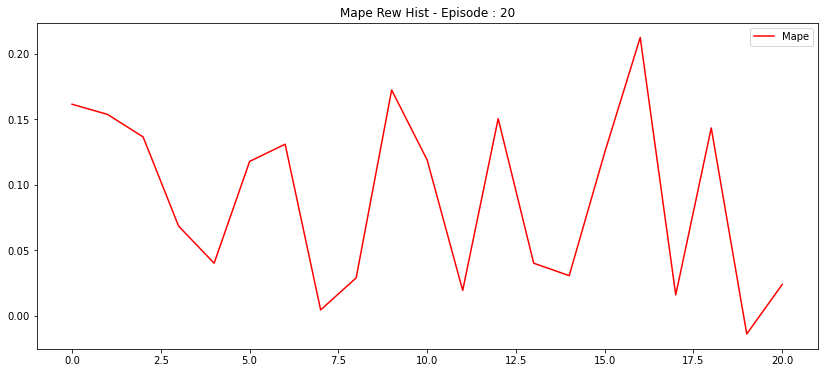

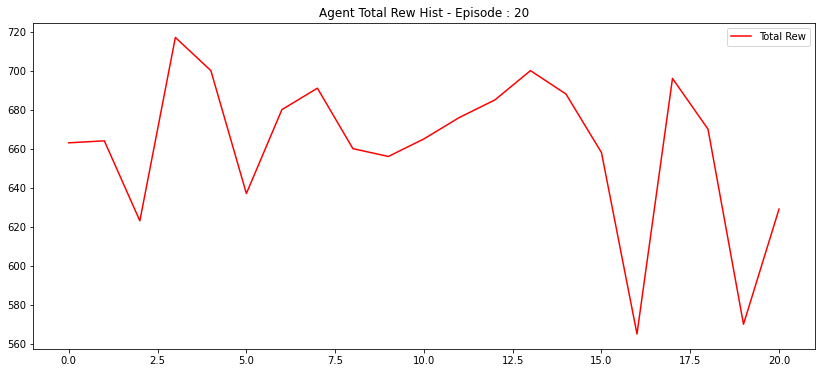

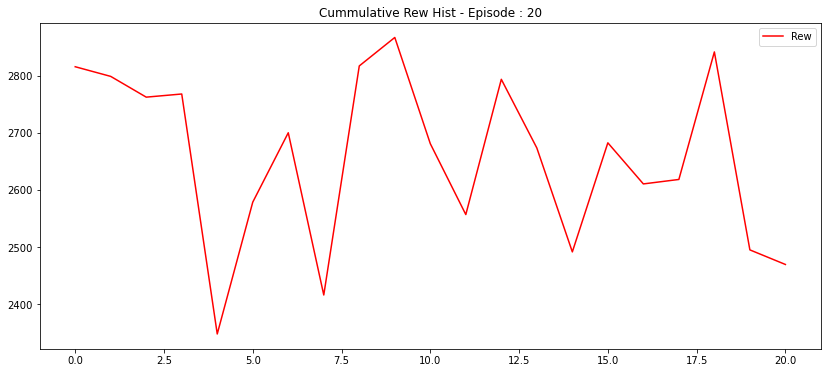

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 2


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


549 429 1188
Env Agent Opp: regressor done, Idx: 3
555 435 1416
Env Agent Opp: regressor done, Idx: 2
648 608 1999
Env Agent Opp: regressor done, Idx: 1
734 688 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6602, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 734, 'step': 1999, 'lastActions': [0, 68]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 688, 'step': 1999, 'lastActions': [0, 68]}
Step: 0
[0.8190792  0.04219311 0.05013907 0.03161672 0.05697184]
0
Step: 500
[1.0000000e+00 3.4765318e-10 2.8241709e-09 1.0934700e-10 3.3672785e-09]
0
Step: 1000
[9.9998367e-01 1.8765325e-06 5.9960171e-06 8.4002119e-07 7.6202205e-06]
0
Step: 1500
[9.9948704e-01 7.9237419e-05 1.6968088e-04 4.1465901e-05 2.2262480e-04]
0
653 622 1999
regressor
Episode: 21
Agent Reward: 653
Opponent Reward: 622
Diff Reward: 31
Wins Nemesis last 10: 0.3


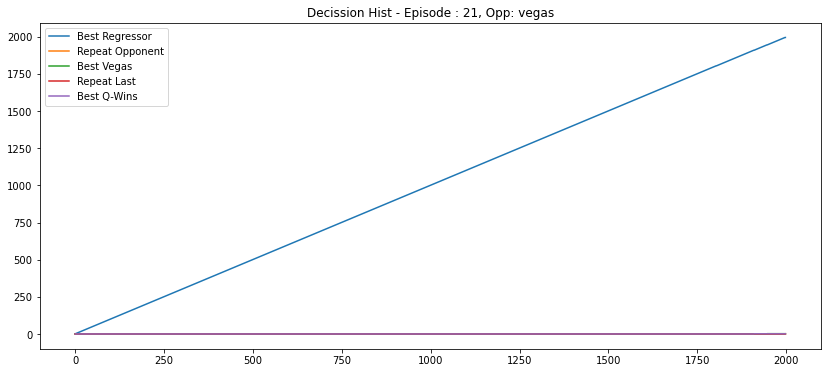

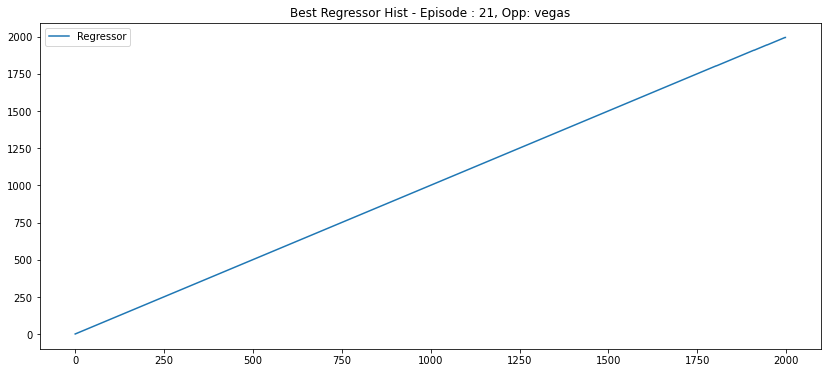

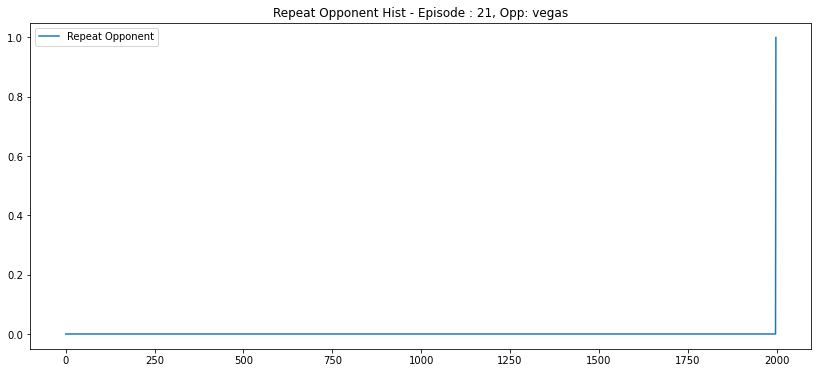

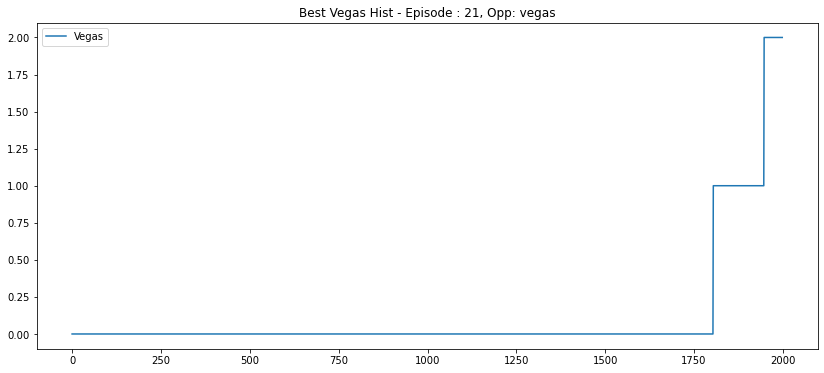

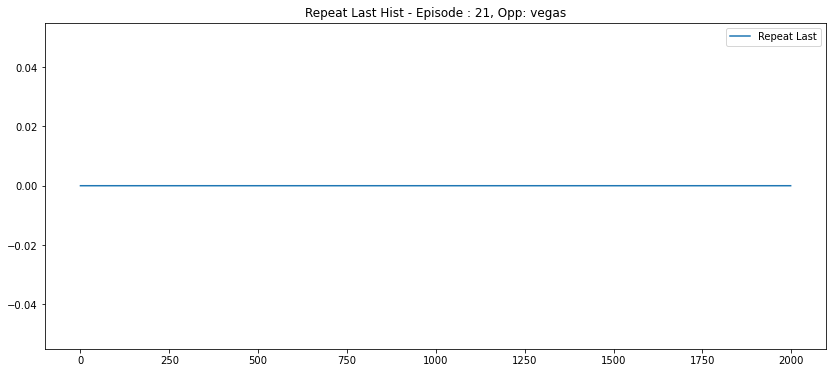

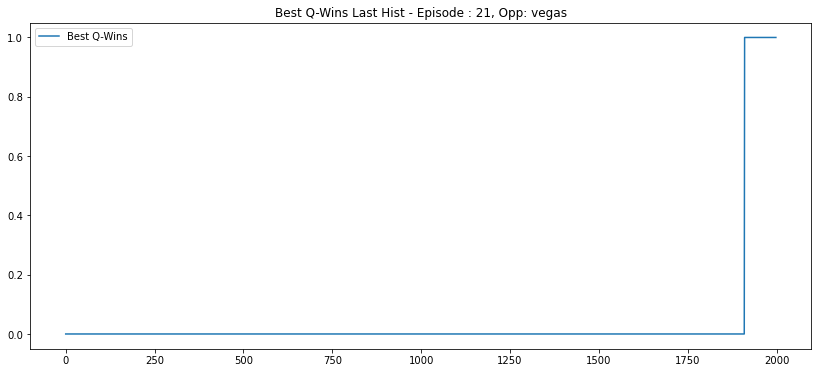

-> Ini env -> 3


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:163: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_count_me' : self.arr_count_me / self.arr_count,


404 284 789
Env Agent Opp: regressor done, Idx: 1
484 364 1046
Env Agent Opp: regressor done, Idx: 2
705 609 1999
Env Agent Opp: regressor done, Idx: 3
649 653 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 5833, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 649, 'step': 1999, 'lastActions': [78, 1]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 653, 'step': 1999, 'lastActions': [78, 1]}
Step: 0
[0.7599286  0.05775528 0.06412525 0.04596198 0.07222883]
0
Step: 500
[9.9999976e-01 3.2441662e-08 1.2899082e-07 1.4284252e-08 1.6740397e-07]
0
Step: 1000
[9.99867678e-01 1.87799506e-05 4.44659454e-05 1.14980985e-05
 5.74332298e-05]
0
Step: 1500
[9.9499691e-01 9.5902919e-04 1.4189187e-03 5.7456130e-04 2.0505495e-03]
0
639 661 1999
regressor
Episode: 22
Agent Reward: 639
Opponent Reward: 661
Diff Reward: -22
Wins Nemesis last 10: 0.3


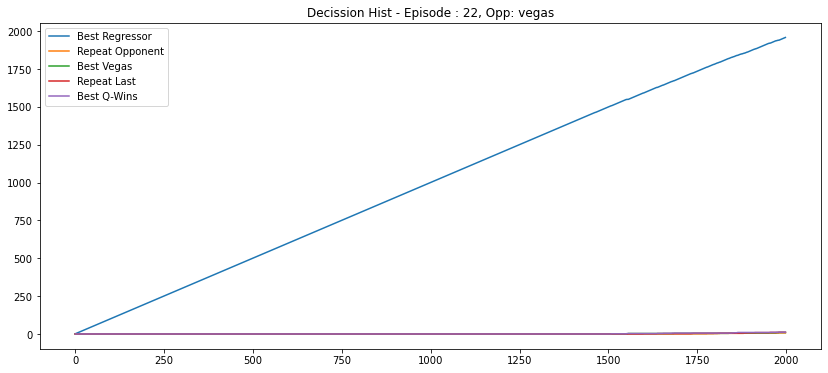

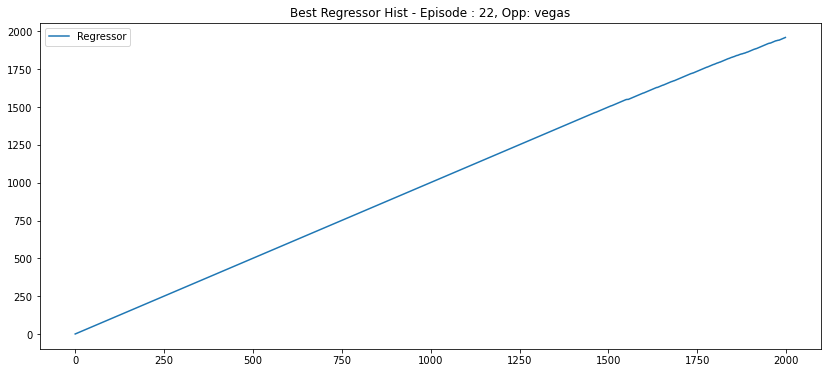

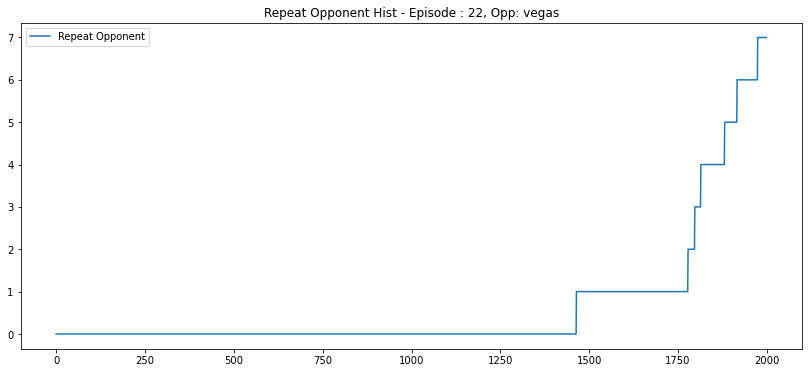

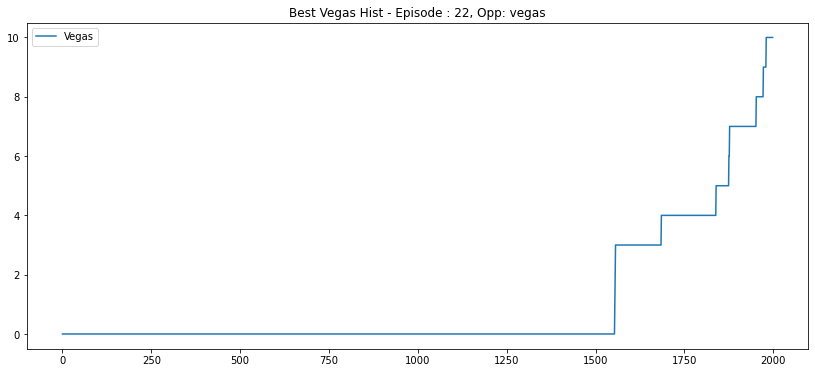

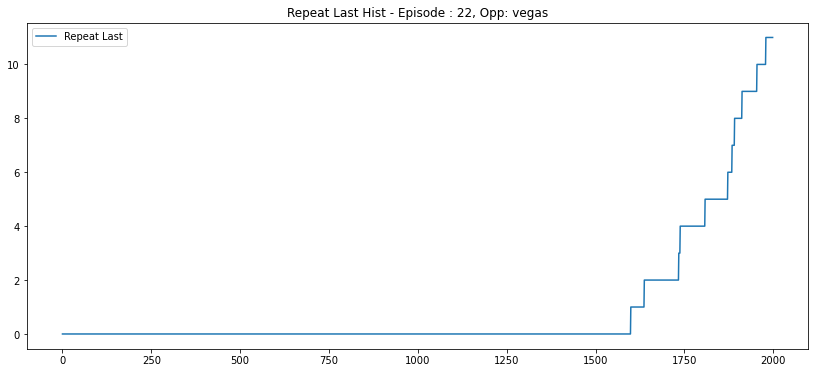

...

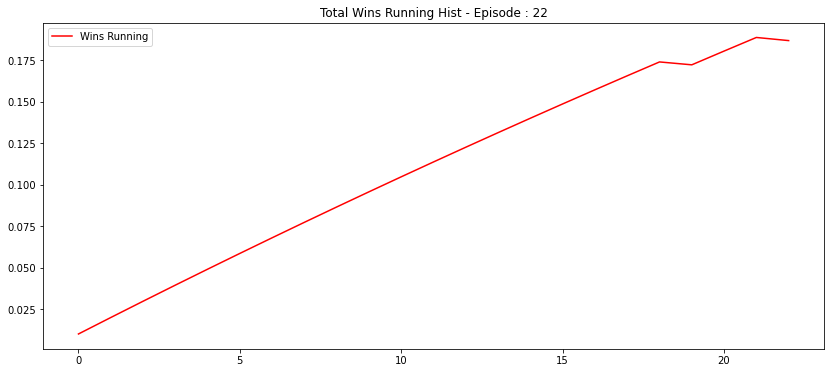

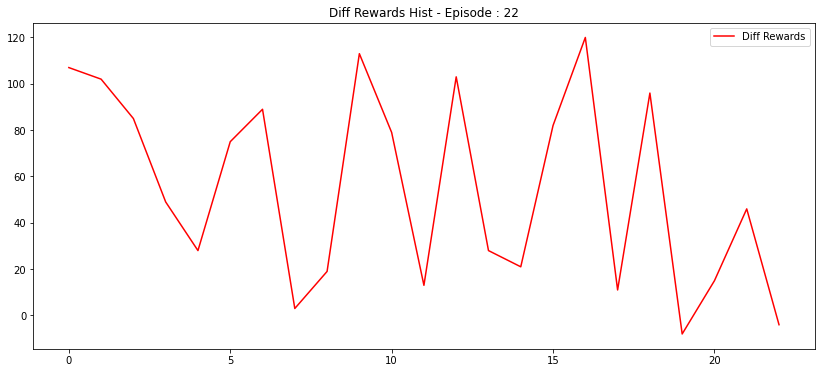

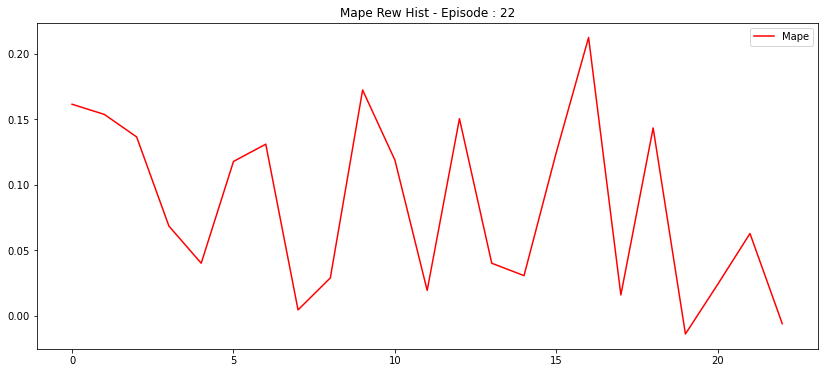

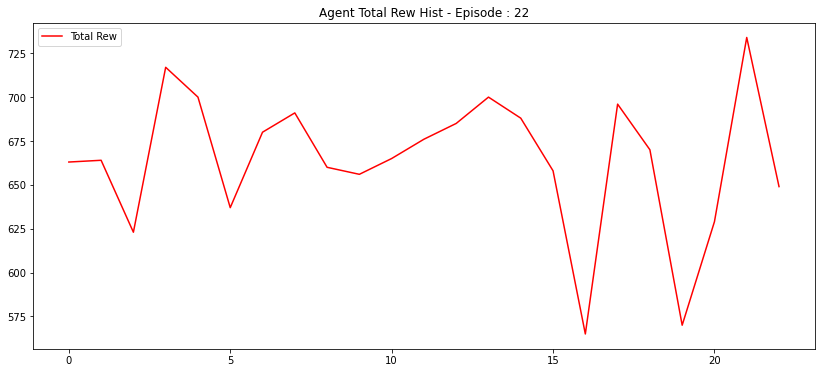

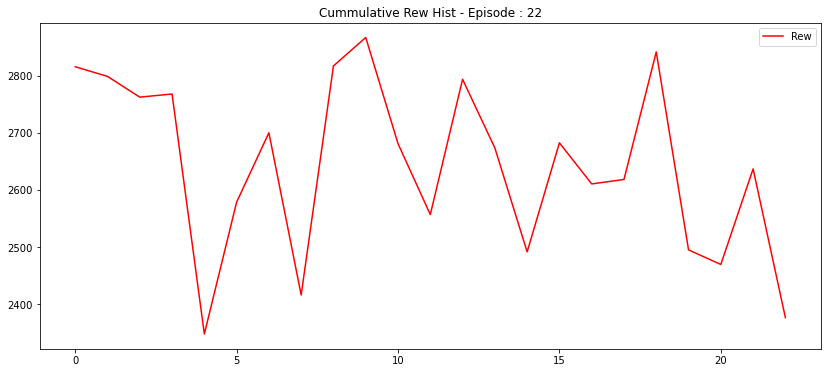

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 1


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


604 484 1565
Env Agent Opp: regressor done, Idx: 1
580 460 1374
Env Agent Opp: regressor done, Idx: 3
590 602 1999
Env Agent Opp: vegas done, Idx: 0
652 542 1999
Env Agent Opp: regressor done, Idx: 2
All envs done
Break step: 6937, Done: True, Idx : 2 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 652, 'step': 1999, 'lastActions': [80, 73]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 542, 'step': 1999, 'lastActions': [80, 73]}
Step: 0
[0.77178025 0.04860257 0.05639662 0.04338433 0.07983617]
0
Step: 500
[9.9999988e-01 5.8106928e-09 3.4475335e-08 5.1500417e-09 1.6682786e-07]
0
Step: 1000
[9.9996543e-01 2.1863925e-06 6.8872887e-06 1.8553245e-06 2.3732056e-05]
0
Step: 1500
[9.9565434e-01 6.3146796e-04 1.0664543e-03 4.8538085e-04 2.1623152e-03]
0
587 626 1999
vegas
Episode: 23
Agent Reward: 587
Opponent Reward: 626
Diff Reward: -39
Wins Nemesis last 10: 0.3


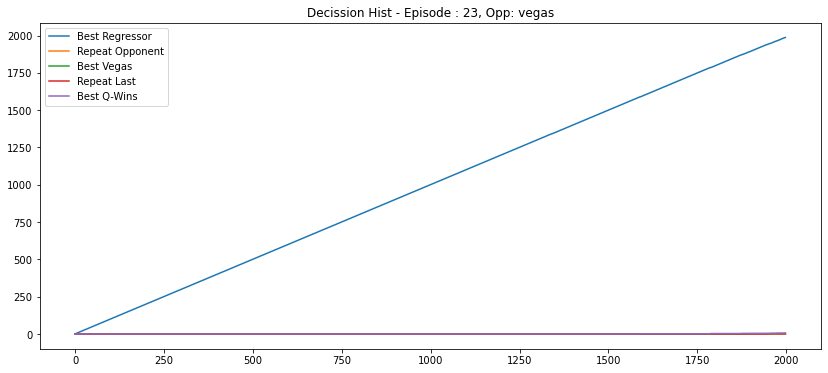

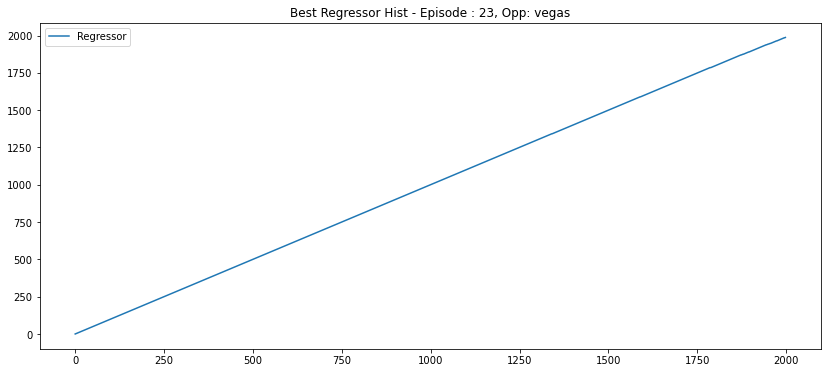

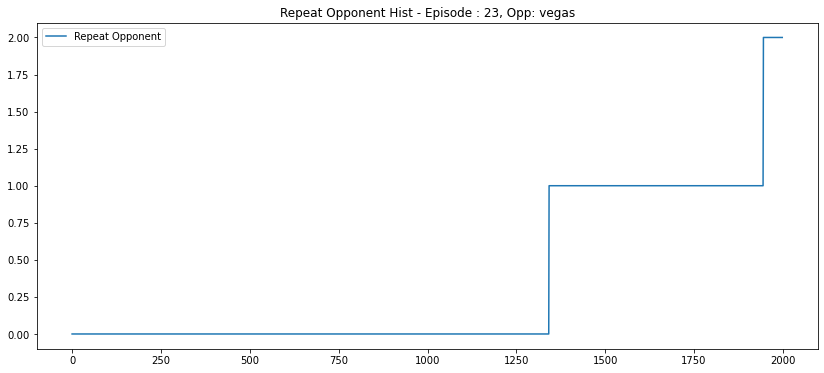

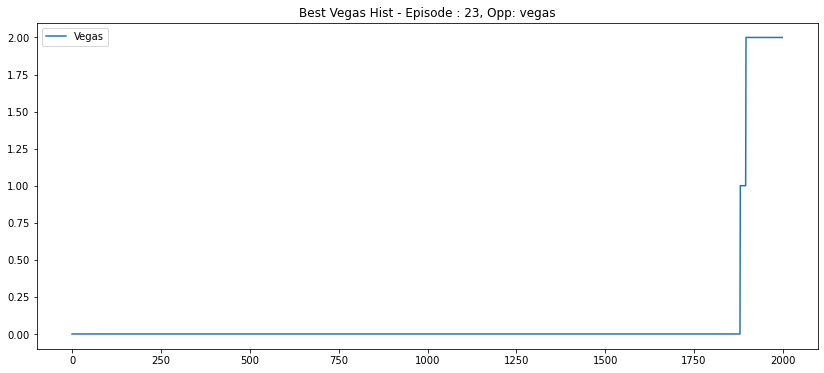

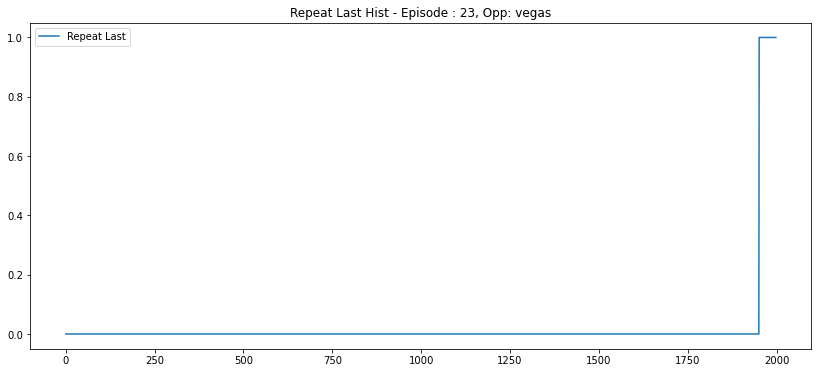

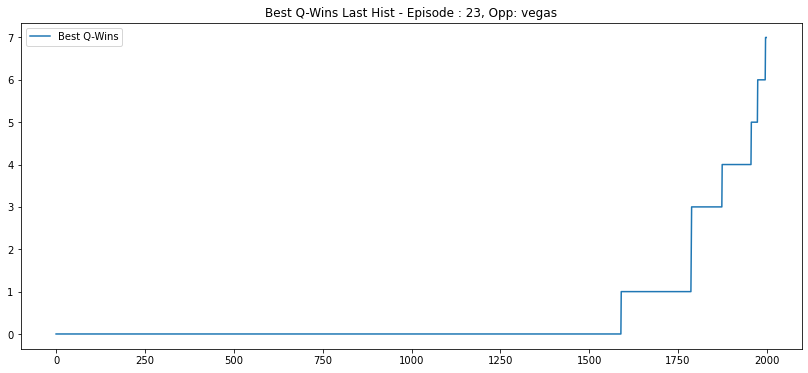

-> Ini env -> 3
470 350 968
Env Agent Opp: regressor done, Idx: 1
637 517 1620
Env Agent Opp: regressor done, Idx: 3
663 543 1929
Env Agent Opp: regressor done, Idx: 2
685 671 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6516, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 685, 'step': 1999, 'lastActions': [82, 82]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 671, 'step': 1999, 'lastActions': [82, 82]}
Step: 0
[0.79870236 0.03957507 0.04978722 0.03802091 0.07391436]
0
Step: 500
[1.0000000e+00 2.5057528e-10 2.8808727e-09 4.0549999e-10 2.5748394e-08]
0
Step: 1000
[9.9998796e-01 4.4716208e-07 2.2285021e-06 6.8126161e-07 8.6844775e-06]
0
Step: 1500
[9.9786609e-01 1.9710677e-04 4.2985551e-04 2.2434861e-04 1.2825573e-03]
0
637 691 1999
regressor
Episode: 24
Agent Reward: 637
Opponent Reward: 691
Diff Reward: -54
Wins Nemesis last 10: 0.3


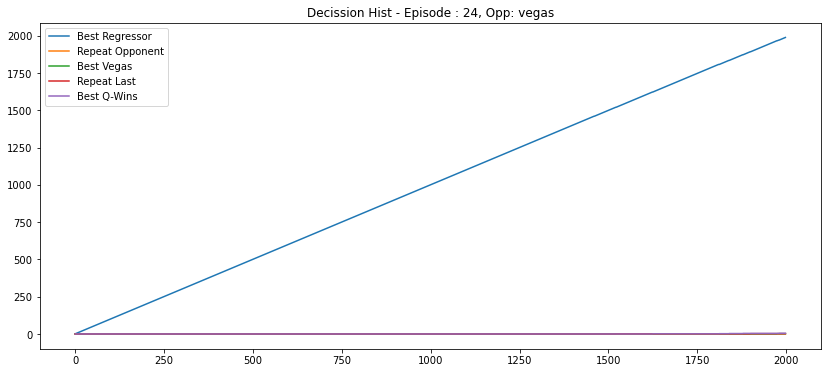

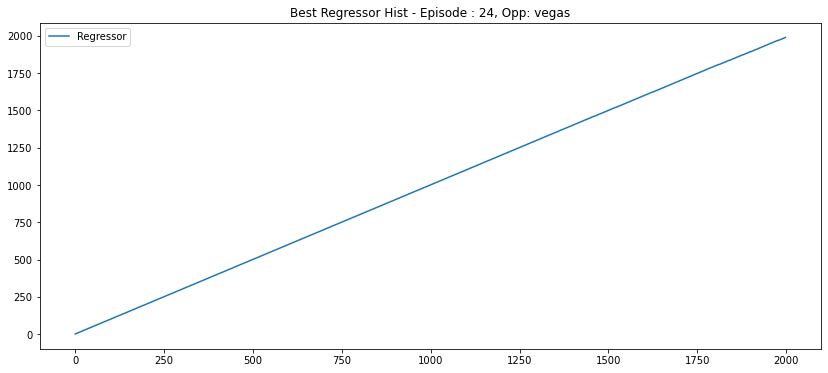

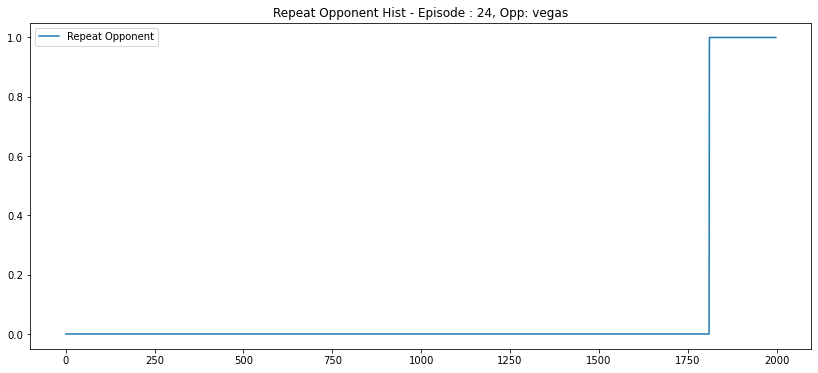

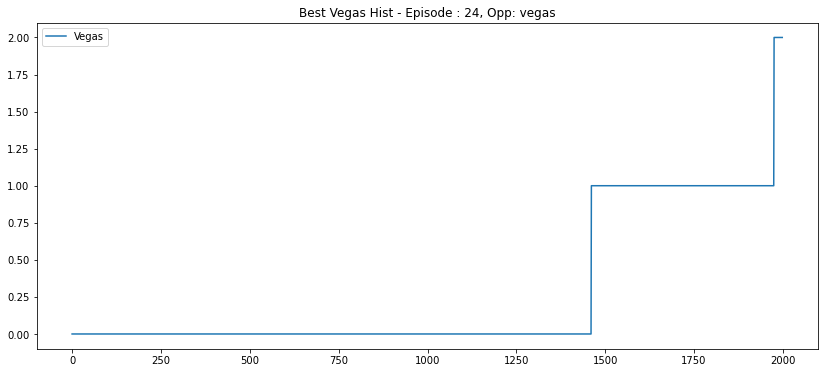

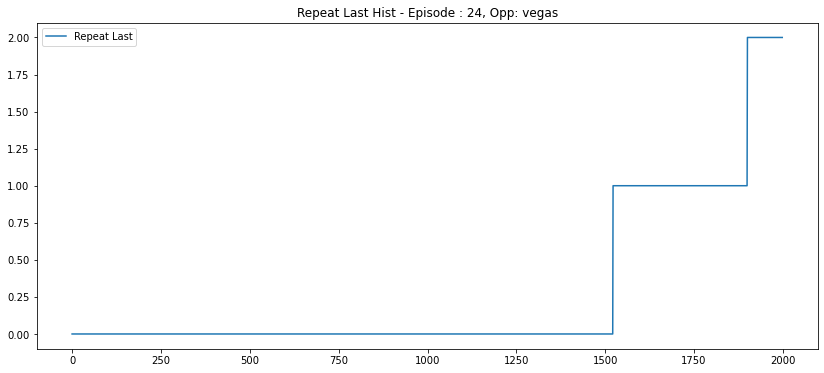

...

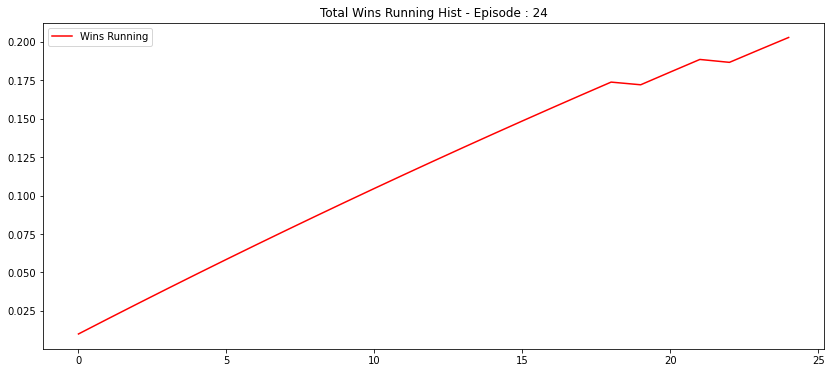

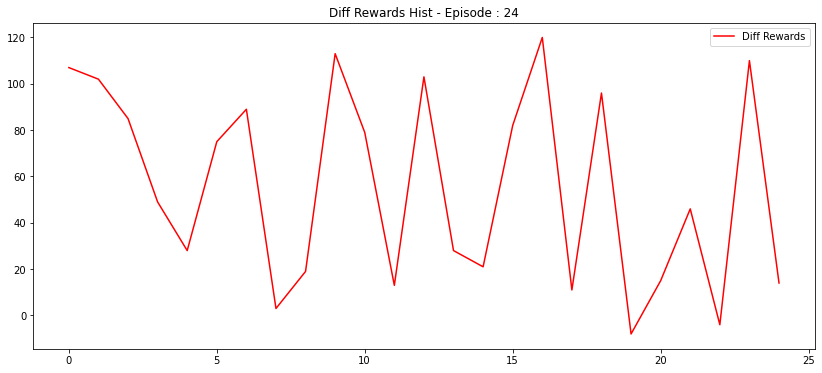

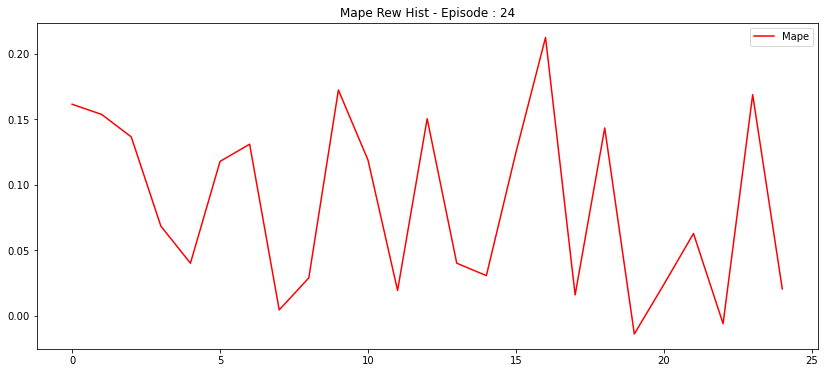

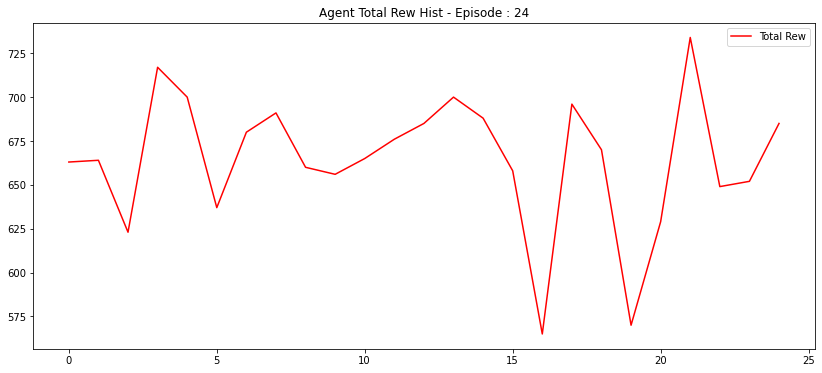

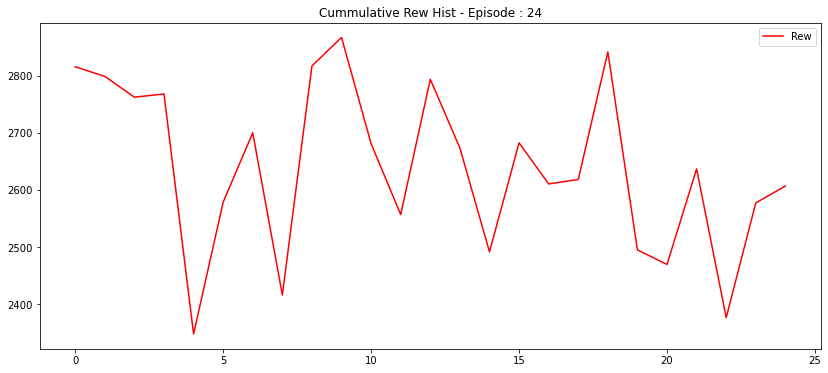

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 3


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


539 419 1243
Env Agent Opp: regressor done, Idx: 1
652 532 1702
Env Agent Opp: regressor done, Idx: 3
582 462 1540
Env Agent Opp: regressor done, Idx: 2
637 593 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6484, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 637, 'step': 1999, 'lastActions': [57, 72]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 593, 'step': 1999, 'lastActions': [57, 72]}
INFO:tensorflow:Assets written to: ../04_Models/ActorCritic/Decission//model_a2c_dec_multienv_v0.6_25\assets
Step: 0
[0.8041244  0.03832879 0.04906381 0.03784622 0.07063689]
0
Step: 500
[1.0000000e+00 2.4019398e-10 2.9988807e-09 4.0052969e-10 1.9487169e-08]
0
Step: 1000
[9.9998915e-01 3.9966744e-07 1.9763147e-06 5.1455635e-07 8.0429072e-06]
0
Step: 1500
[9.9787700e-01 2.0598687e-04 4.5723902e-04 2.4071422e-04 1.2190487e-03]
0
591 604 1999
vegas
Episode: 25
Agent Reward: 591
Opponent Reward: 604
Diff Reward: -13
Wins Nemesis last 

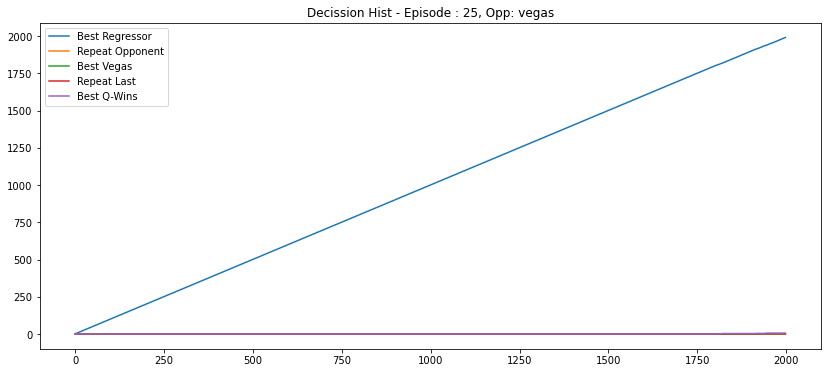

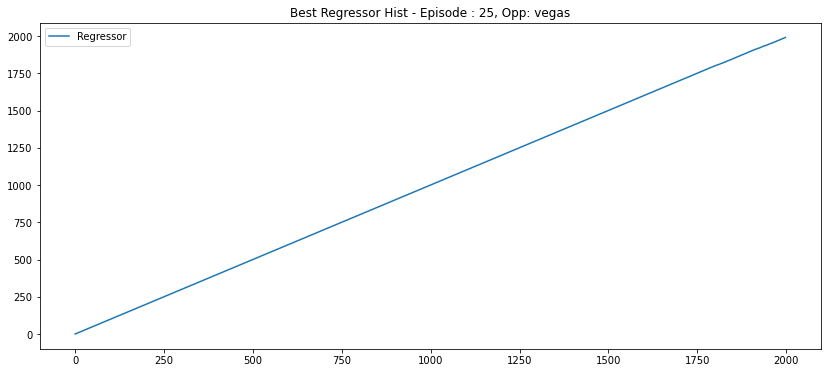

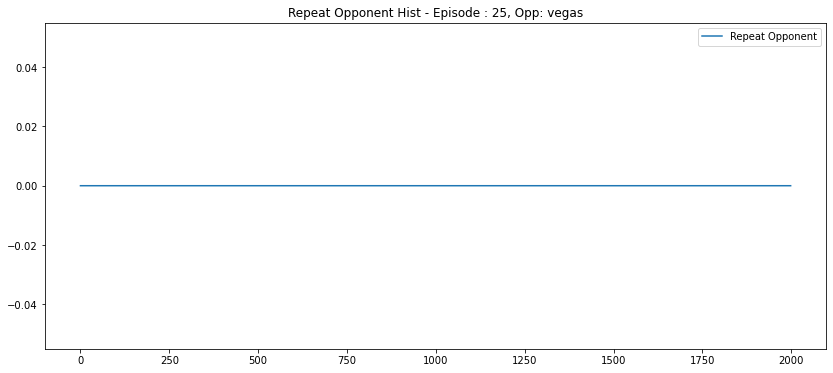

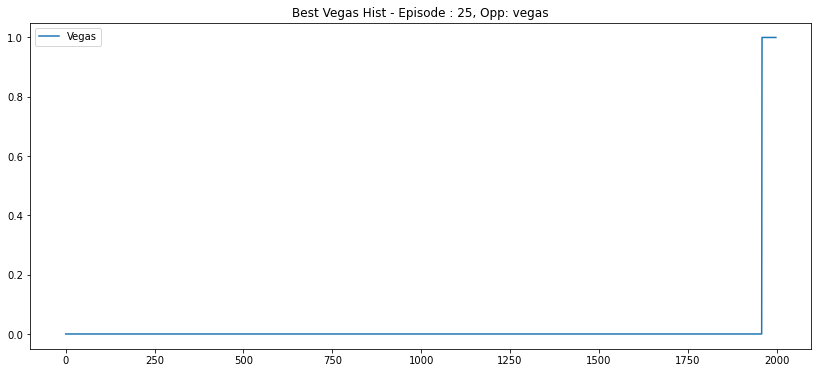

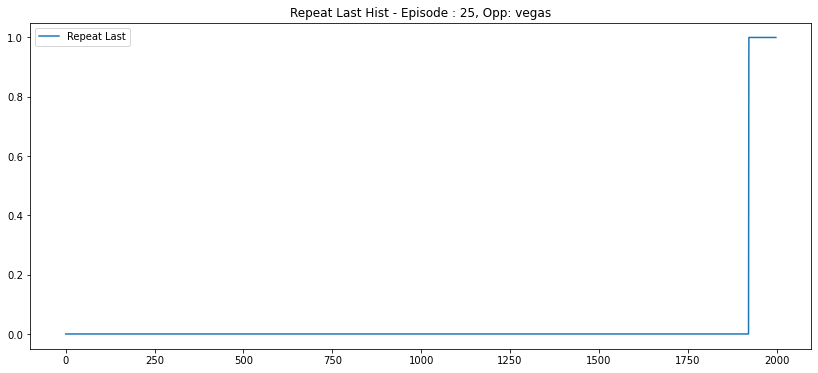

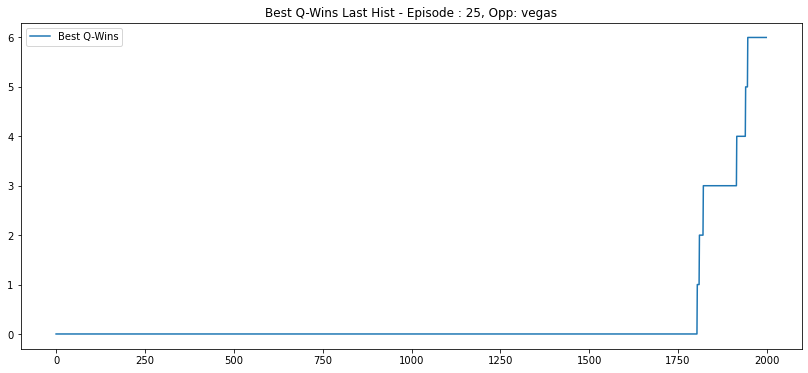

-> Ini env -> 0
578 458 1462
Env Agent Opp: regressor done, Idx: 2
678 558 1836
Env Agent Opp: regressor done, Idx: 3
682 566 1999
Env Agent Opp: regressor done, Idx: 1
676 665 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 7296, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 676, 'step': 1999, 'lastActions': [49, 49]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 665, 'step': 1999, 'lastActions': [49, 49]}
Step: 0
[0.8486961  0.03090603 0.04108565 0.03033435 0.04897788]
0
Step: 500
[1.0000000e+00 6.4297812e-12 1.3420927e-10 1.1145152e-11 2.3656349e-10]
0
Step: 1000
[9.9999595e-01 2.6109171e-07 1.2450171e-06 2.9784189e-07 2.3190387e-06]
0
Step: 1500
[9.9907601e-01 1.1339544e-04 2.6094896e-04 1.1548638e-04 4.3416300e-04]
0
650 609 1999
regressor
Episode: 26
Agent Reward: 650
Opponent Reward: 609
Diff Reward: 41
Wins Nemesis last 10: 0.4


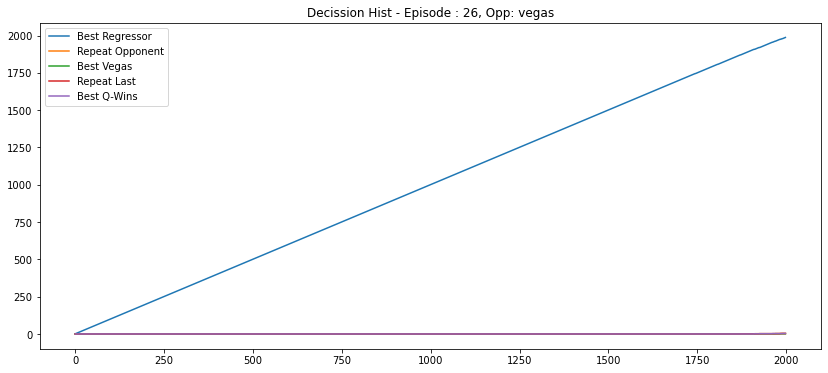

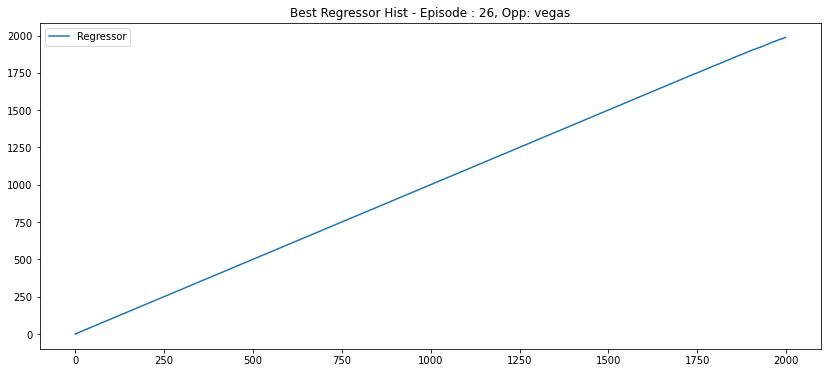

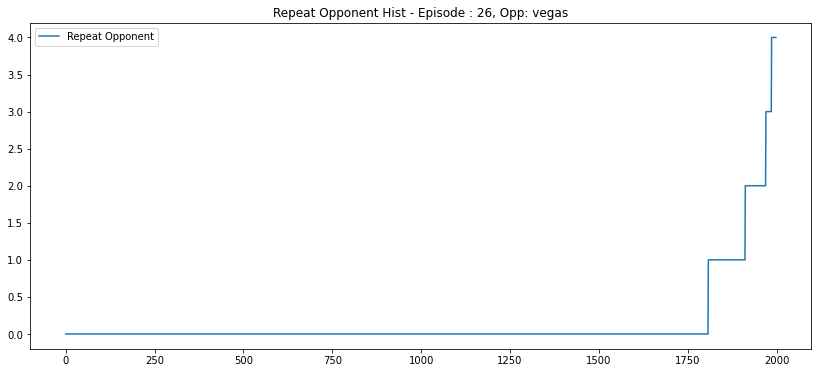

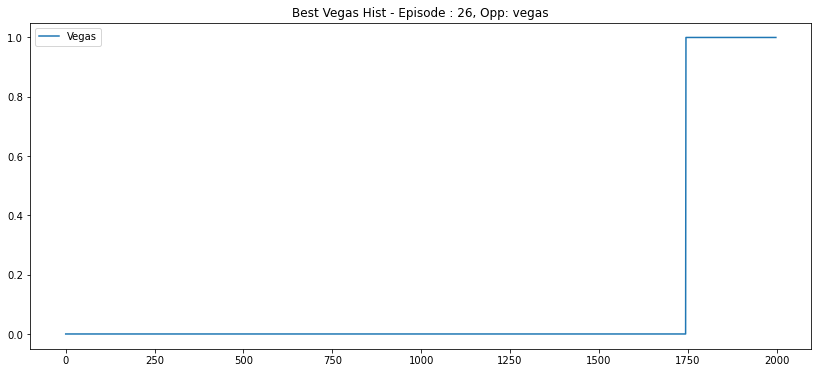

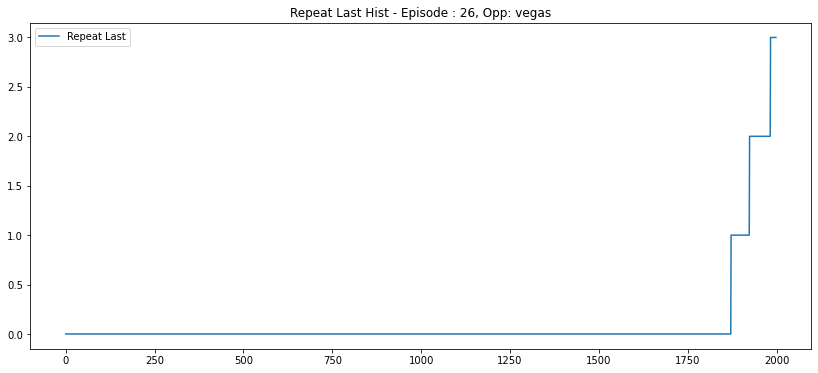

...

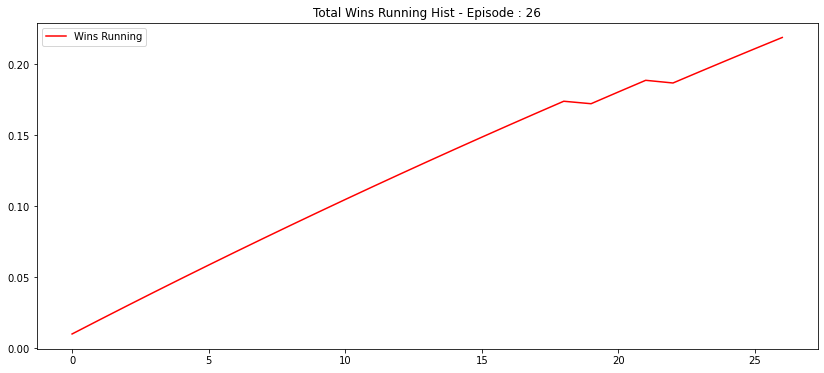

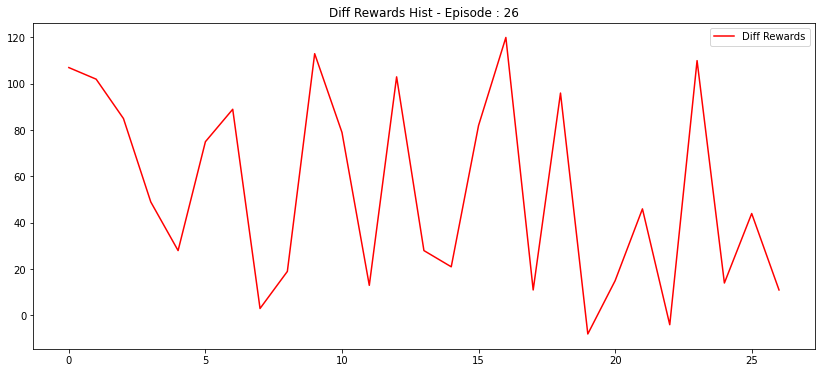

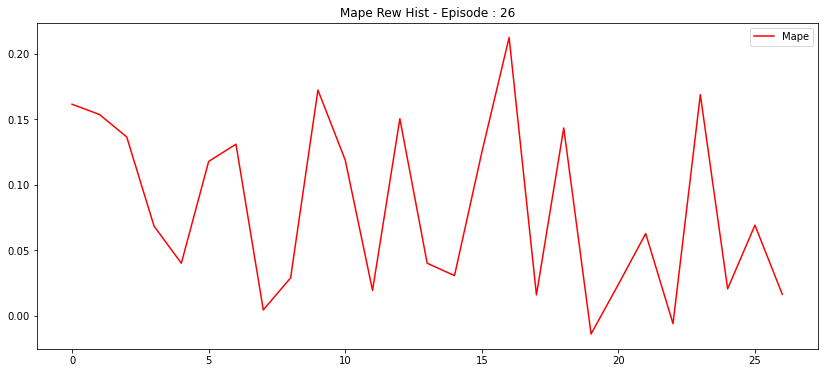

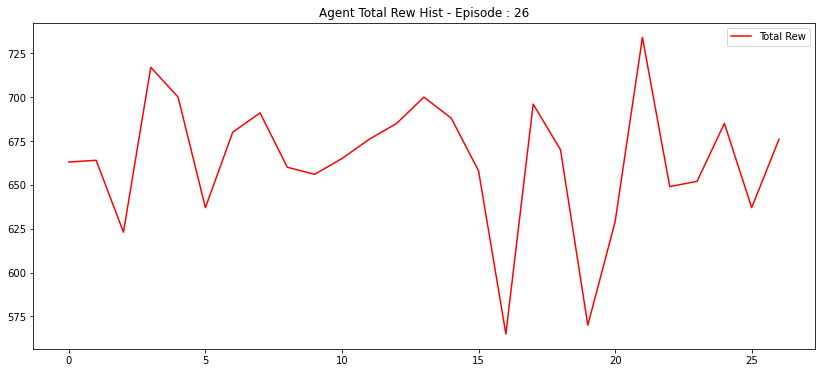

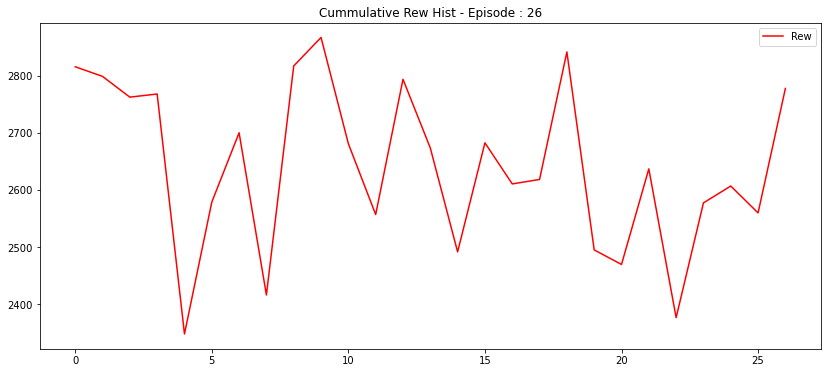

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 2


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


529 409 1217
Env Agent Opp: regressor done, Idx: 2
544 424 1326
Env Agent Opp: regressor done, Idx: 1
680 562 1999
Env Agent Opp: regressor done, Idx: 3
636 662 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6541, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 636, 'step': 1999, 'lastActions': [44, 44]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 662, 'step': 1999, 'lastActions': [44, 44]}
Step: 0
[0.85586154 0.03014468 0.03841627 0.02504181 0.05053574]
0
Step: 500
[1.0000000e+00 2.8495356e-10 2.5456657e-09 1.4980181e-10 8.8548608e-09]
0
Step: 1000
[9.99996781e-01 1.67691098e-07 8.23798587e-07 1.07129026e-07
 2.19624530e-06]
0
Step: 1500
[9.9498713e-01 6.7365711e-04 1.3213858e-03 4.2773926e-04 2.5900572e-03]
0
582 566 1999
regressor
Episode: 27
Agent Reward: 582
Opponent Reward: 566
Diff Reward: 16
Wins Nemesis last 10: 0.5


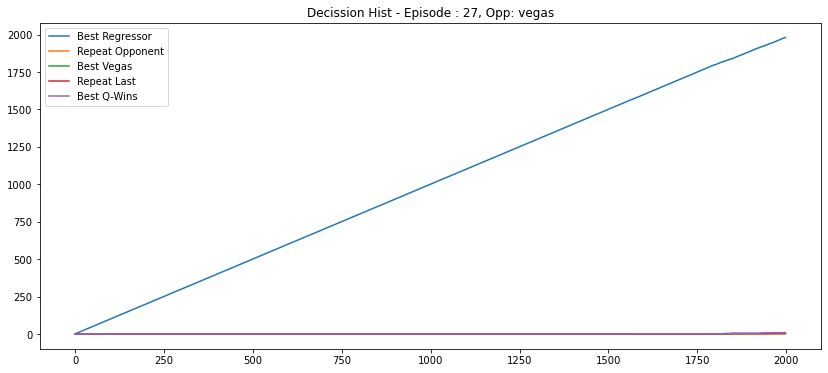

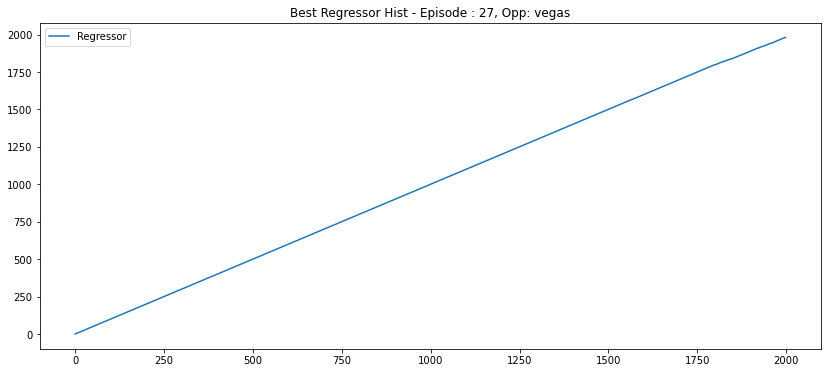

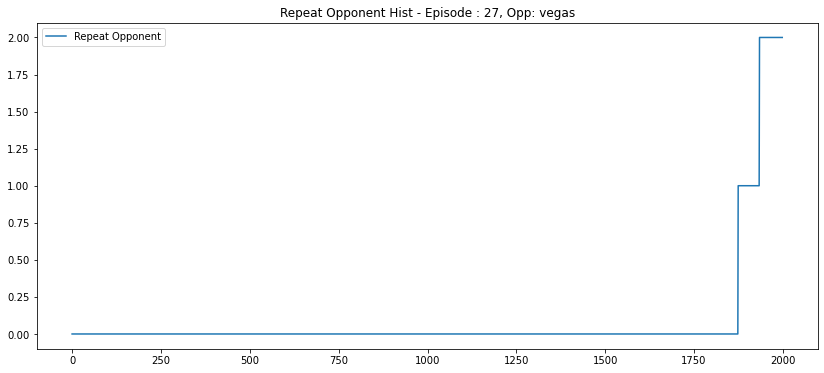

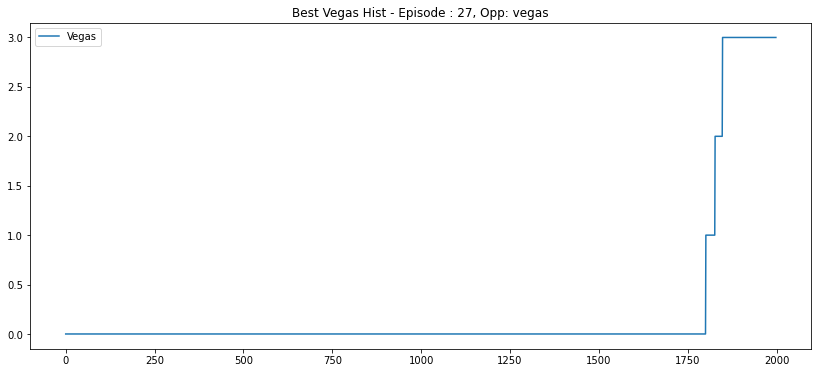

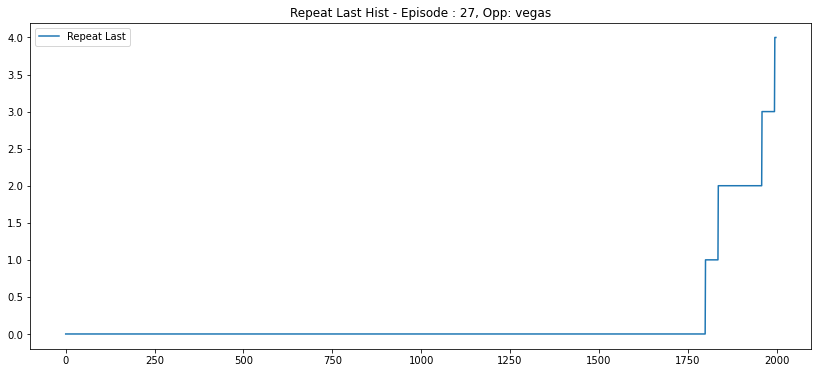

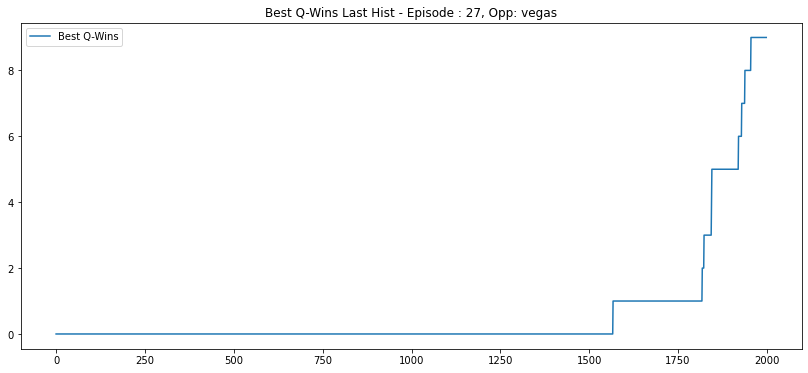

-> Ini env -> 2
461 341 901
Env Agent Opp: regressor done, Idx: 3
599 479 1540
Env Agent Opp: regressor done, Idx: 1
613 493 1707
Env Agent Opp: regressor done, Idx: 2
686 627 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6147, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 686, 'step': 1999, 'lastActions': [48, 82]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 627, 'step': 1999, 'lastActions': [48, 82]}
Step: 0
[0.8009143  0.04021358 0.04684025 0.02751246 0.08451936]
0
Step: 500
[9.9999940e-01 5.9023870e-09 3.5159442e-08 1.0694586e-09 5.6404338e-07]
0
Step: 1000
[9.99876499e-01 5.02195053e-06 1.40116090e-05 1.72083355e-06
 1.02727456e-04]
0
Step: 1500
[9.9241537e-01 8.1459607e-04 1.3987466e-03 3.7787232e-04 4.9933768e-03]
0
620 623 1999
regressor
Episode: 28
Agent Reward: 620
Opponent Reward: 623
Diff Reward: -3
Wins Nemesis last 10: 0.4


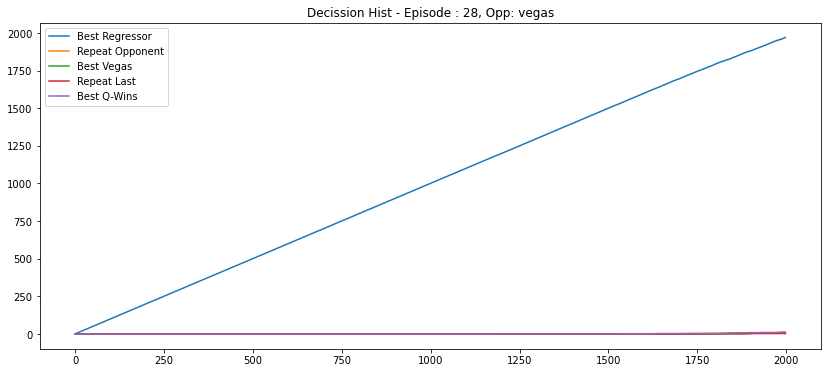

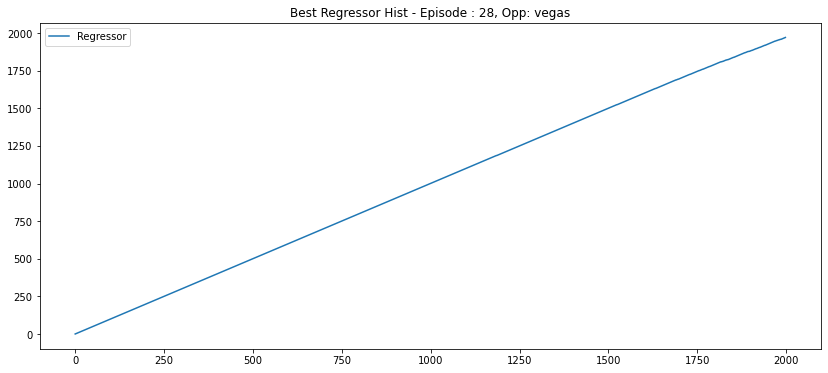

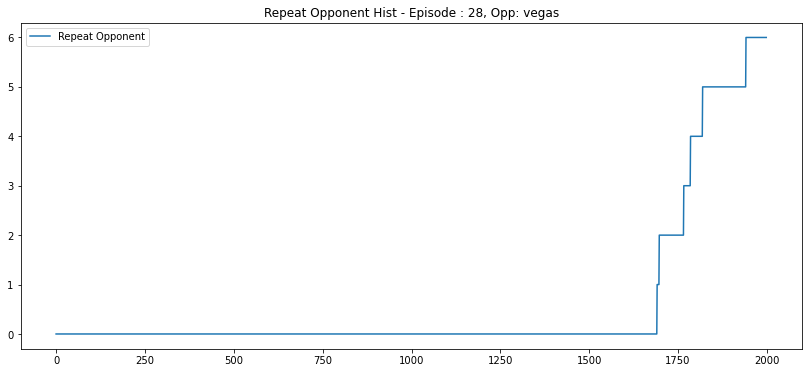

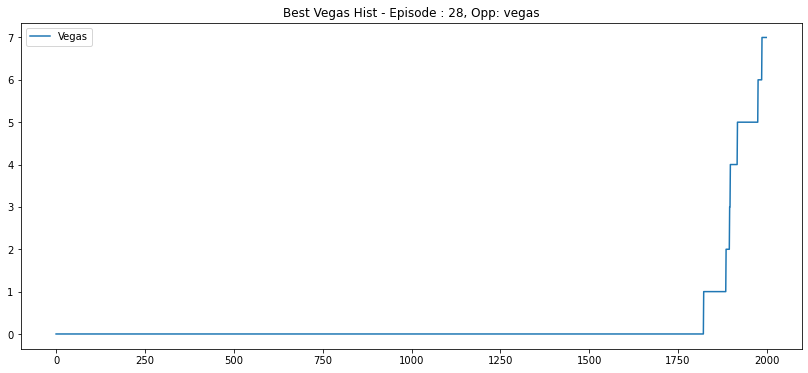

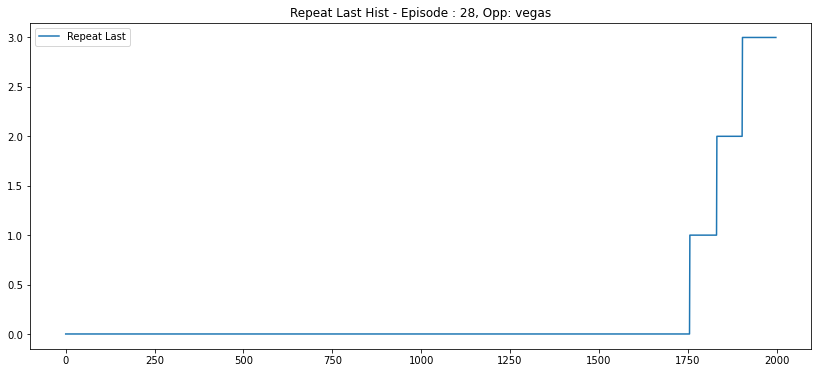

...

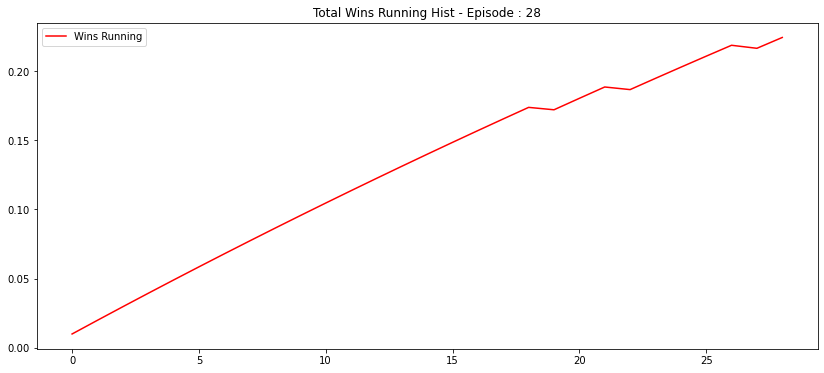

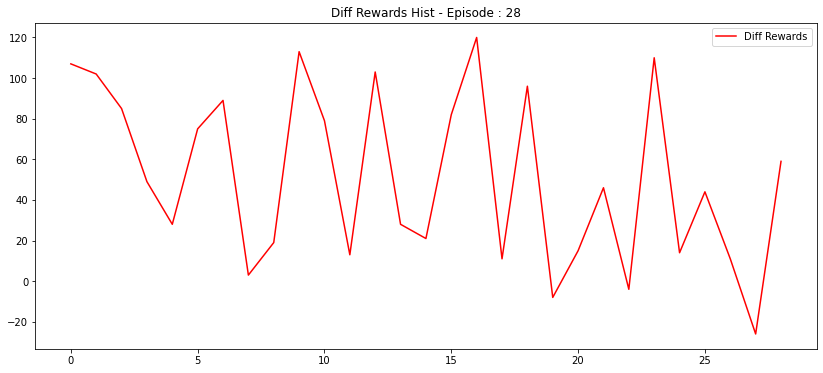

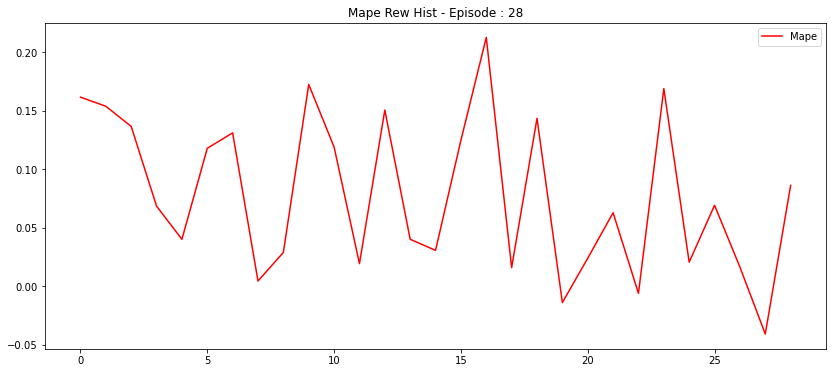

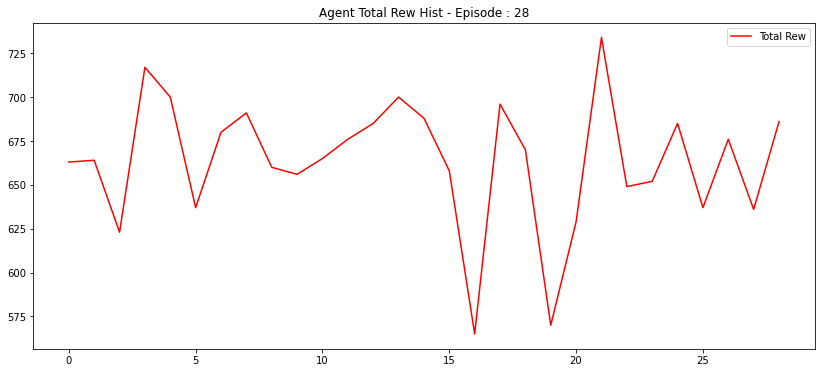

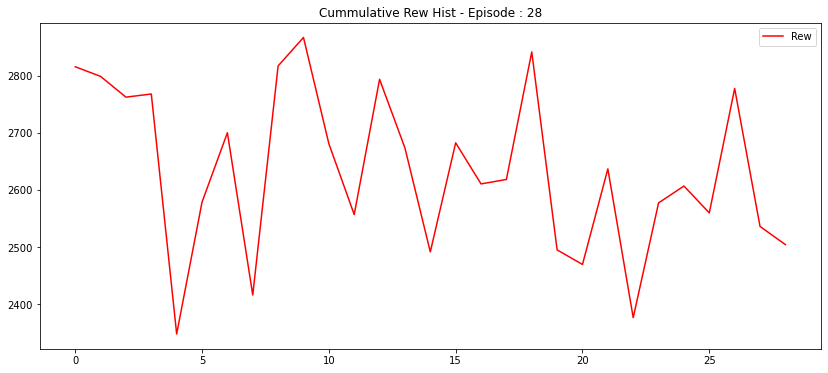

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide


-> Ini env -> 0


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: 

661 582 1999
Env Agent Opp: regressor done, Idx: 1
656 536 1675
Env Agent Opp: regressor done, Idx: 3
582 462 1541
Env Agent Opp: regressor done, Idx: 2
671 627 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 7214, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 671, 'step': 1999, 'lastActions': [69, 53]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 627, 'step': 1999, 'lastActions': [69, 53]}
Step: 0
[0.8396747  0.03054509 0.03473997 0.01910127 0.07593892]
0
Step: 500
[1.0000000e+00 8.9374645e-12 6.1091396e-11 5.4328709e-13 8.2458804e-09]
0
Step: 1000
[9.9999416e-01 6.7745518e-08 1.9602555e-07 1.0074199e-08 5.4770571e-06]
0
Step: 1500
[9.9951208e-01 2.1239211e-05 4.0878833e-05 5.9592721e-06 4.1988763e-04]
0
669 661 1999
regressor
Episode: 29
Agent Reward: 669
Opponent Reward: 661
Diff Reward: 8
Wins Nemesis last 10: 0.4


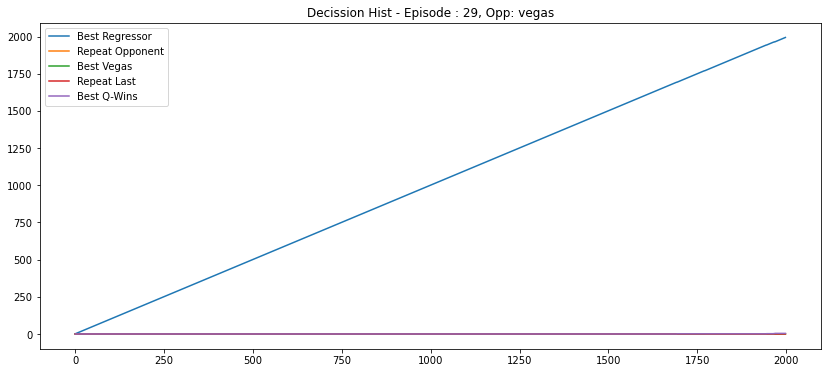

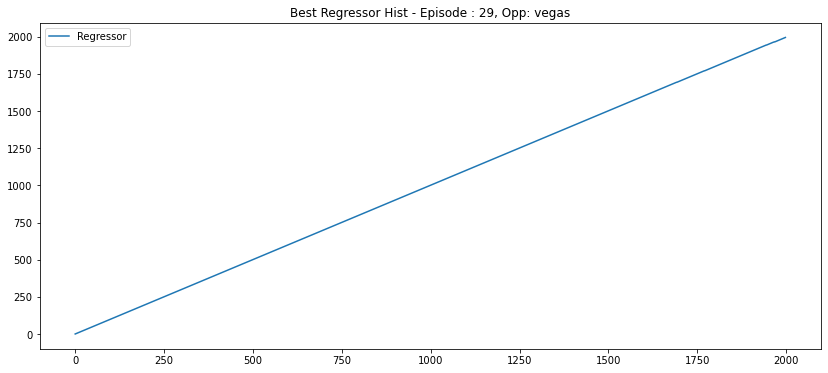

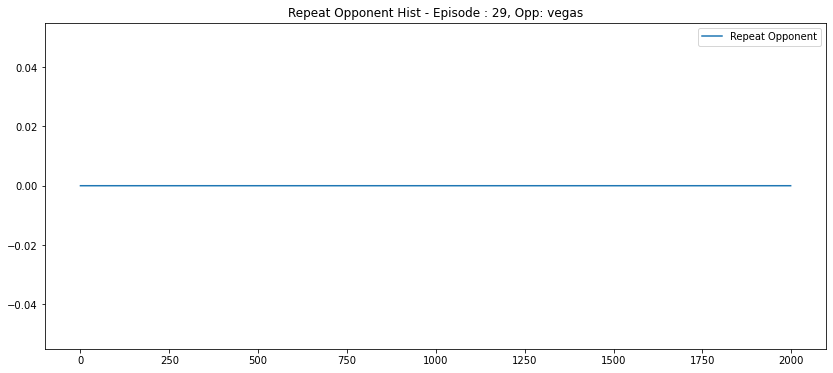

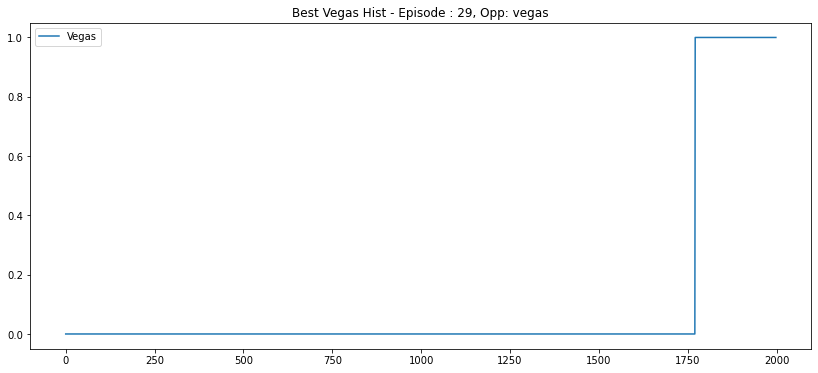

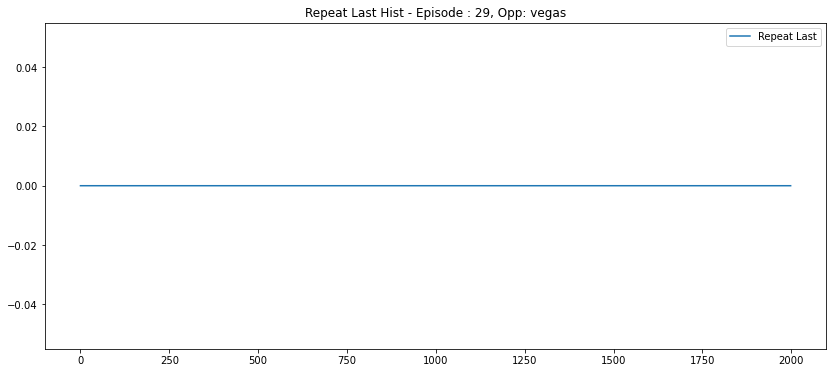

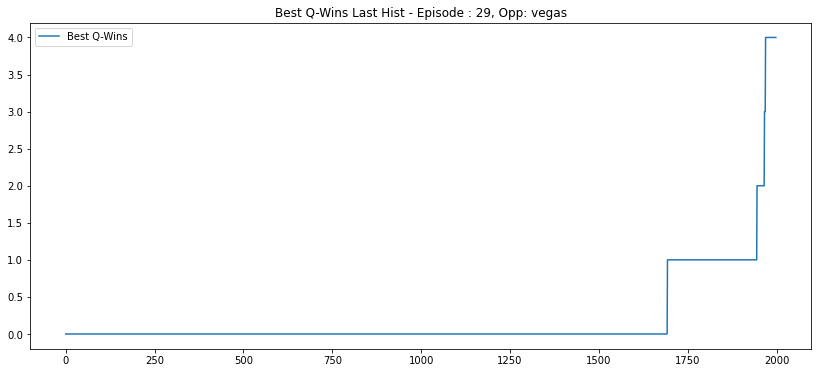

-> Ini env -> 3
479 359 1076
Env Agent Opp: regressor done, Idx: 1
596 476 1473
Env Agent Opp: regressor done, Idx: 3
565 445 1407
Env Agent Opp: regressor done, Idx: 2
623 615 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 5955, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 623, 'step': 1999, 'lastActions': [15, 19]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 615, 'step': 1999, 'lastActions': [15, 19]}
INFO:tensorflow:Assets written to: ../04_Models/ActorCritic/Decission//model_a2c_dec_multienv_v0.6_30\assets
Step: 0
[0.7820175  0.0449908  0.04379191 0.02719821 0.10200156]
0
Step: 500
[9.9999785e-01 1.2900982e-08 2.6790433e-08 1.1663220e-09 2.1110093e-06]
0
Step: 1000
[9.9958605e-01 1.3330722e-05 1.8866054e-05 3.0980982e-06 3.7869491e-04]
0
Step: 1500
[0.89627963 0.01857701 0.01775559 0.00845154 0.05893624]
0
619 586 1999
regressor
Episode: 30
Agent Reward: 619
Opponent Reward: 586
Diff Reward: 33
Wins Nemesis l

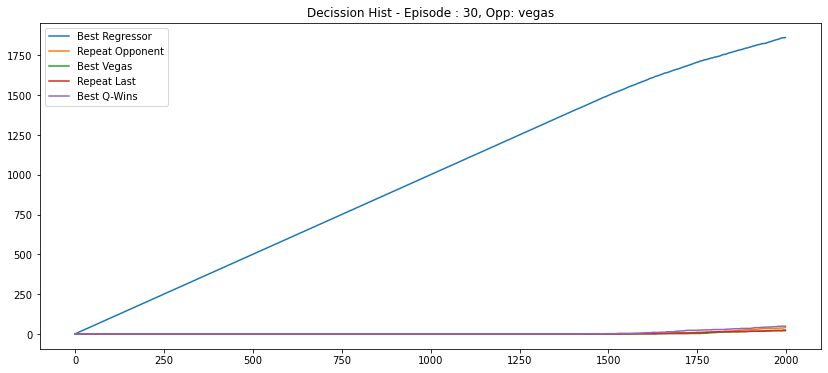

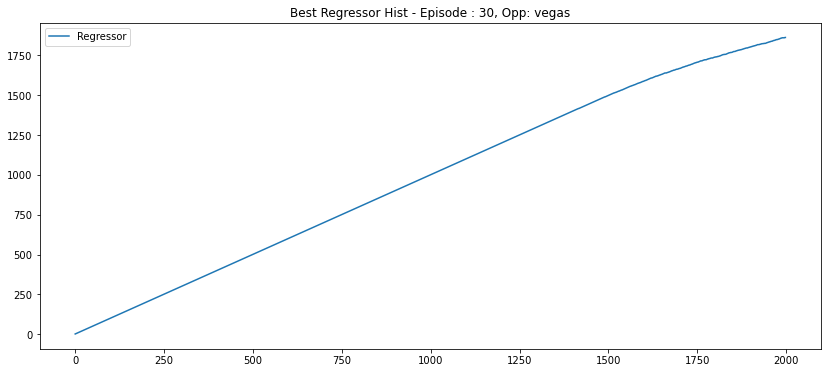

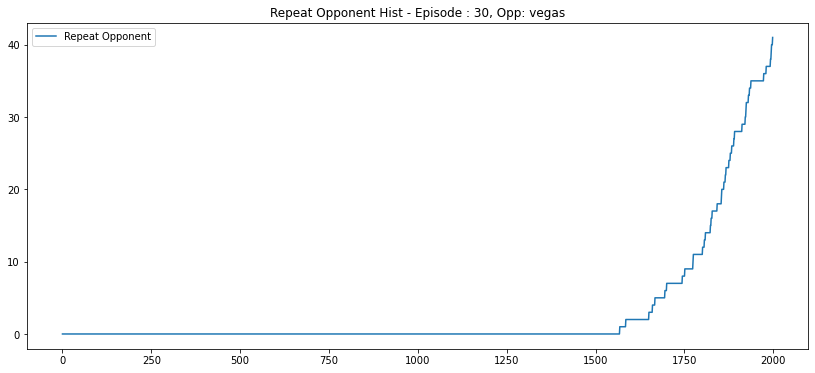

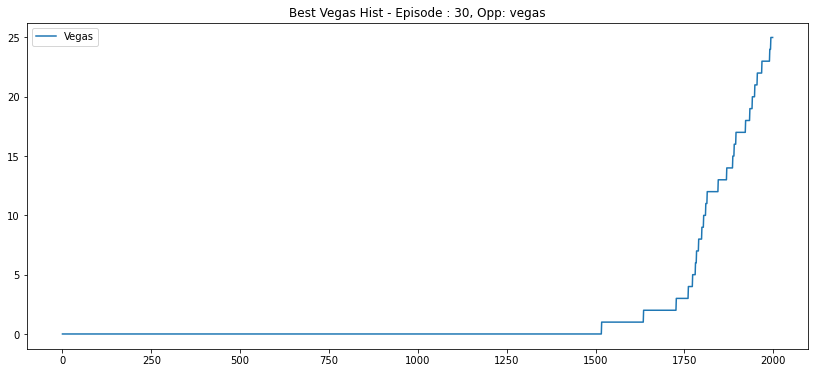

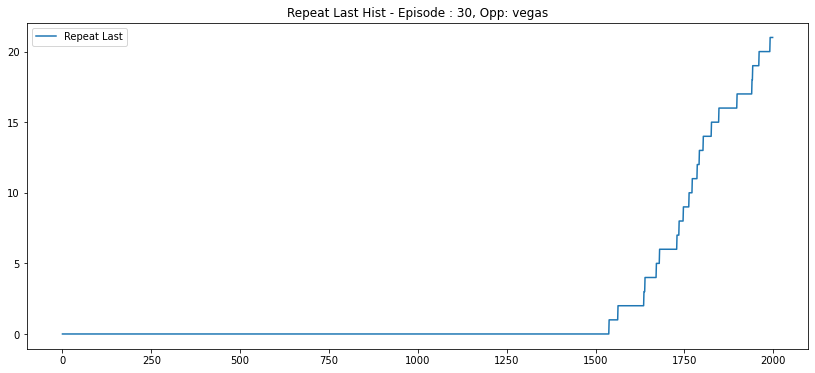

...

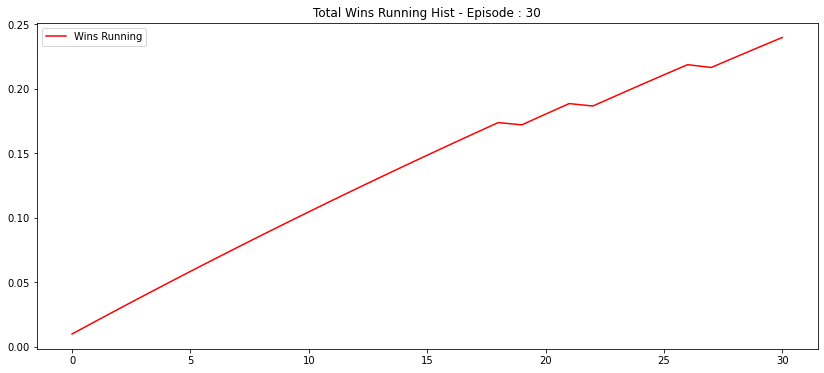

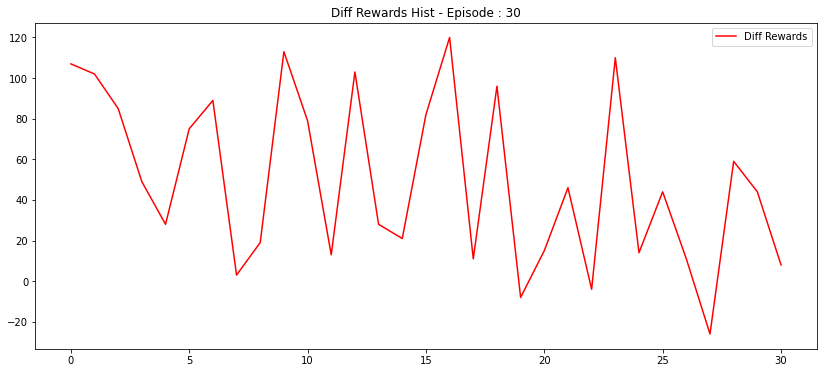

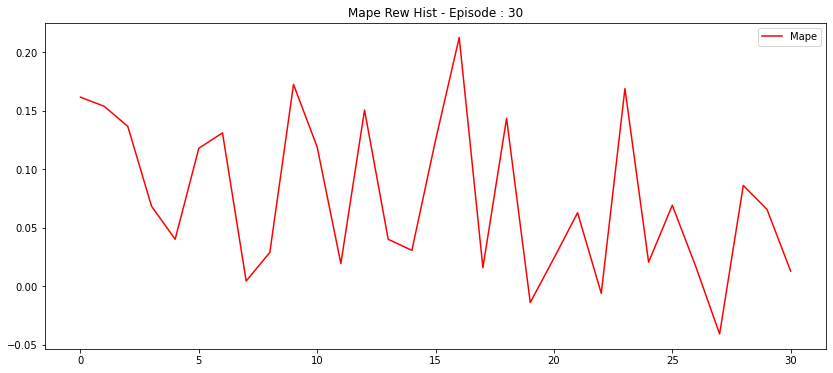

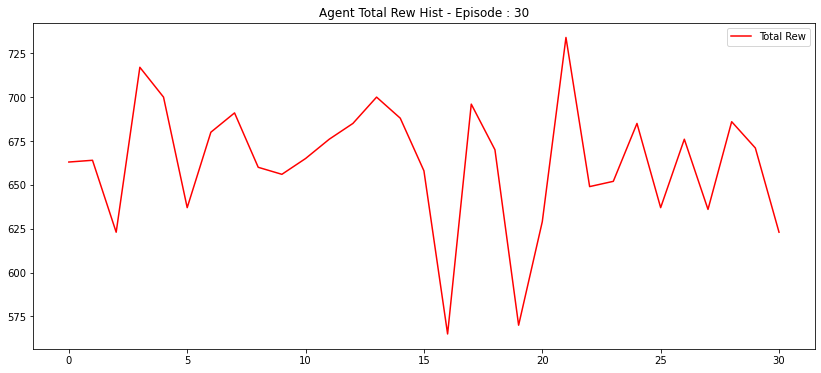

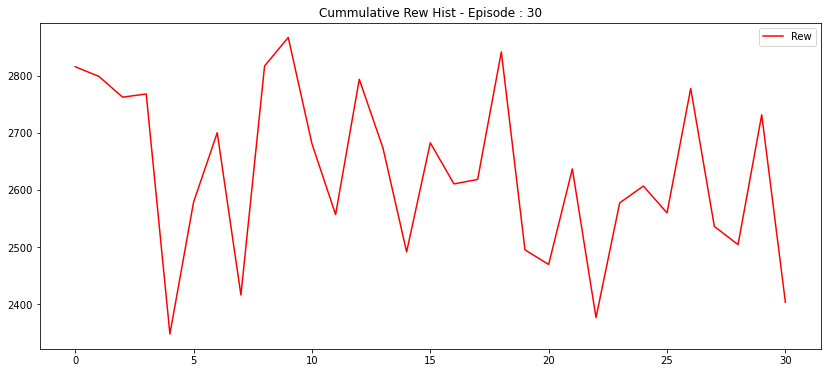

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 3


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


428 308 821
Env Agent Opp: regressor done, Idx: 2
662 585 1999
Env Agent Opp: regressor done, Idx: 1
561 441 1247
Env Agent Opp: regressor done, Idx: 3
655 689 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6066, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 655, 'step': 1999, 'lastActions': [42, 43]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 689, 'step': 1999, 'lastActions': [42, 43]}
Step: 0
[0.8406911  0.03408289 0.02904386 0.0171732  0.07900901]
0
Step: 500
[9.9999976e-01 4.6293996e-10 4.9809079e-10 1.7136435e-11 1.9086454e-07]
0
Step: 1000
[9.9991953e-01 1.7792795e-06 1.7273513e-06 2.0599563e-07 7.6726748e-05]
0
Step: 1500
[9.9539751e-01 4.3053011e-04 3.5028401e-04 9.3506875e-05 3.7281492e-03]
0
590 626 1999
vegas
Episode: 31
Agent Reward: 590
Opponent Reward: 626
Diff Reward: -36
Wins Nemesis last 10: 0.4


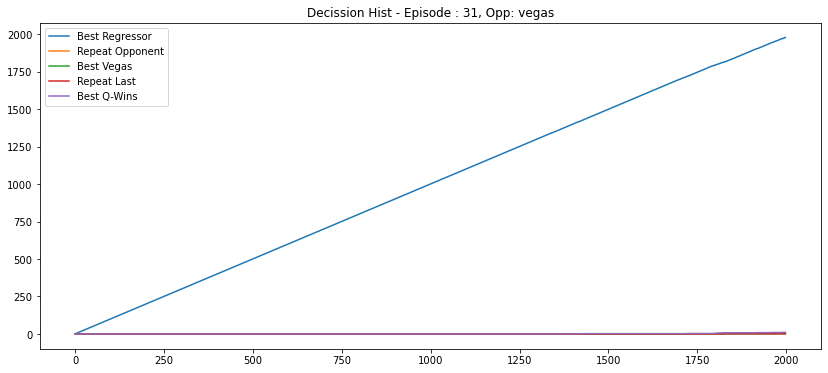

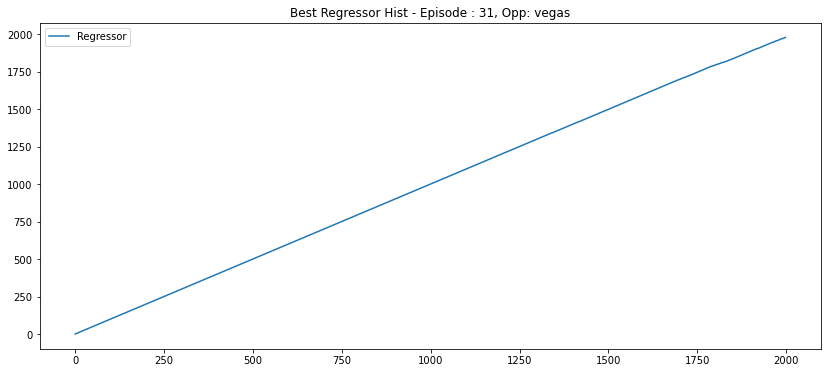

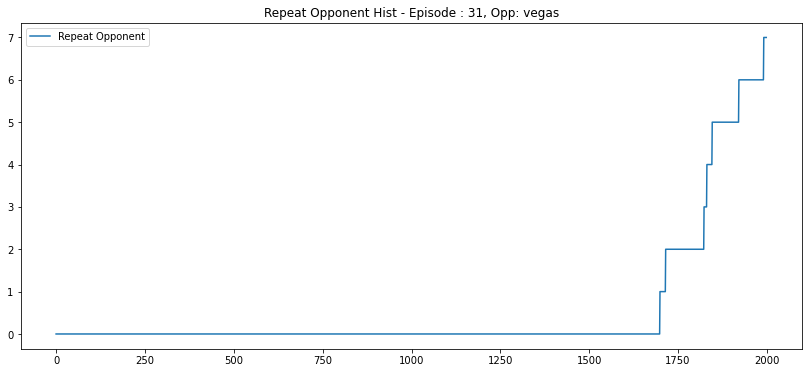

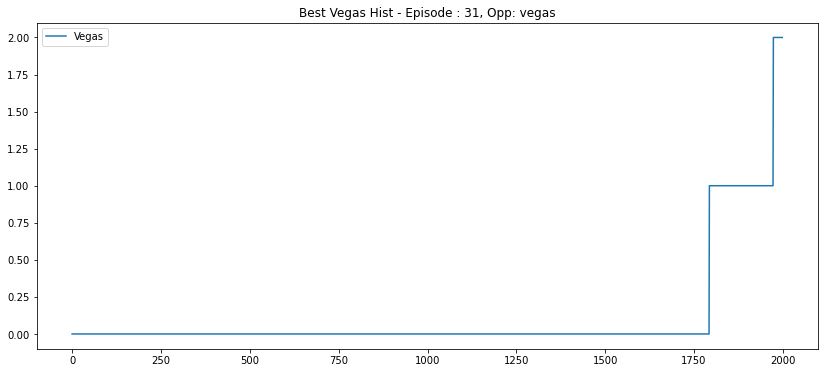

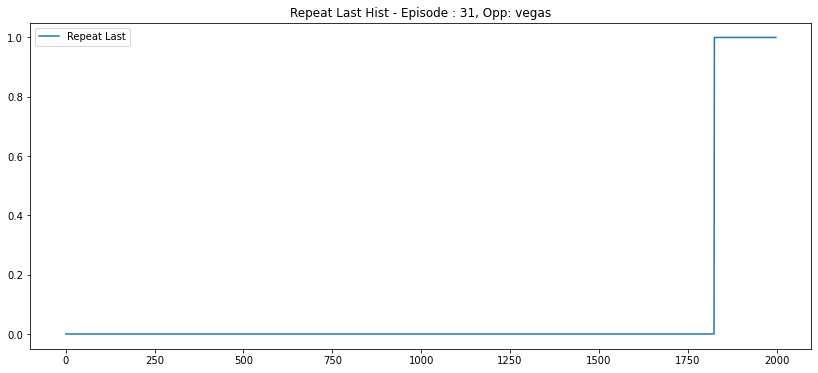

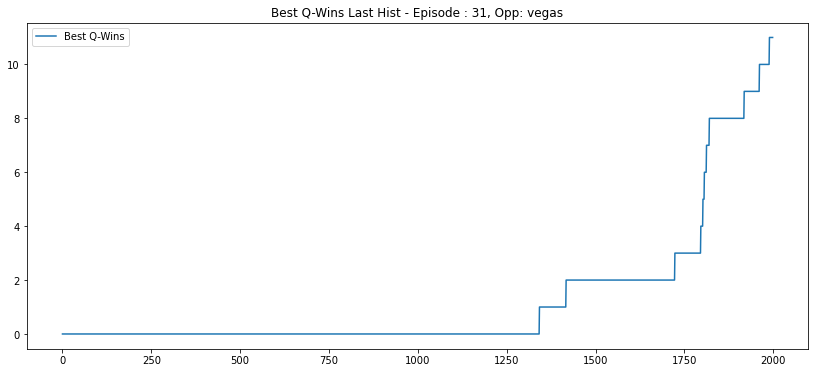

-> Ini env -> 0
551 431 1265
Env Agent Opp: regressor done, Idx: 1
592 472 1649
Env Agent Opp: regressor done, Idx: 2
705 589 1999
Env Agent Opp: regressor done, Idx: 3
669 696 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6912, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 669, 'step': 1999, 'lastActions': [64, 64]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 696, 'step': 1999, 'lastActions': [64, 64]}
Step: 0
[0.8146383  0.0359891  0.02987299 0.01677034 0.10272924]
0
Step: 500
[9.9999809e-01 1.6313747e-09 1.1160544e-09 3.1852333e-11 1.9256595e-06]
0
Step: 1000
[9.9975795e-01 2.4594474e-06 1.8688642e-06 1.8452117e-07 2.3753861e-04]
0
Step: 1500
[9.9082911e-01 5.8936095e-04 4.4278713e-04 1.0104021e-04 8.0377143e-03]
0
583 638 1999
vegas
Episode: 32
Agent Reward: 583
Opponent Reward: 638
Diff Reward: -55
Wins Nemesis last 10: 0.4


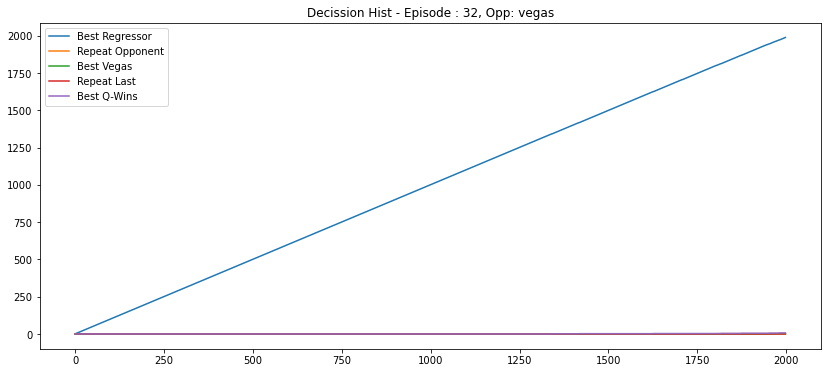

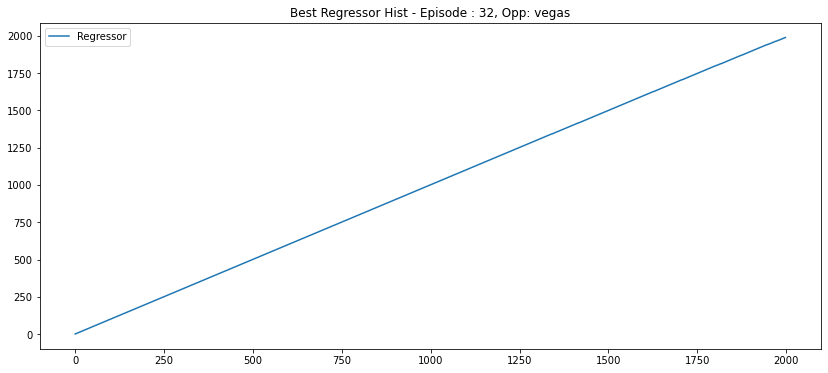

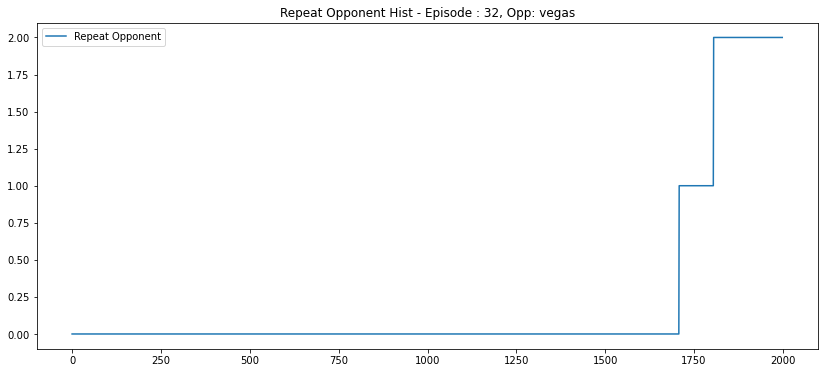

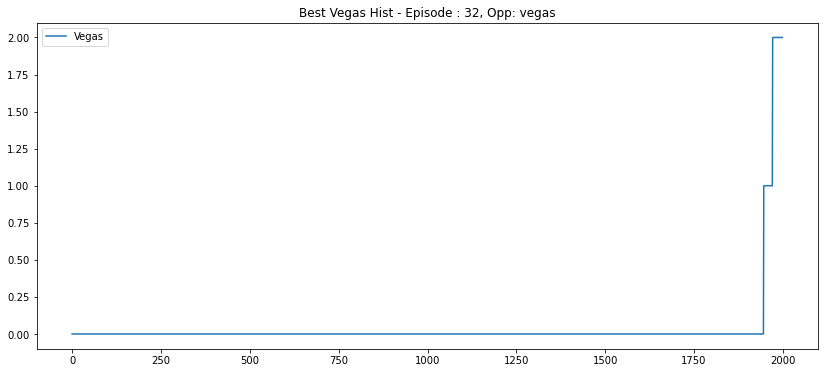

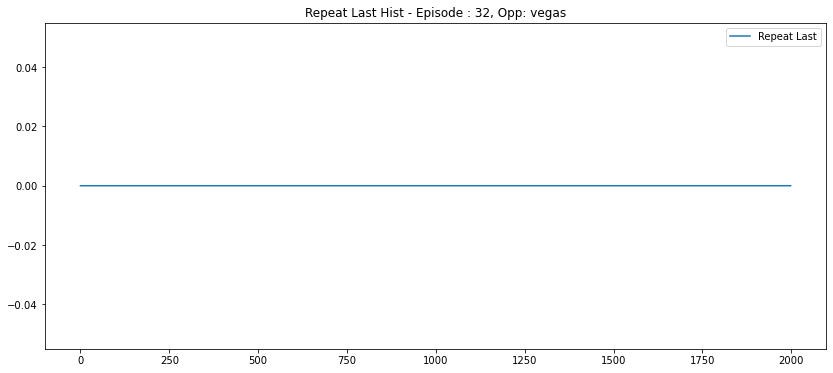

...

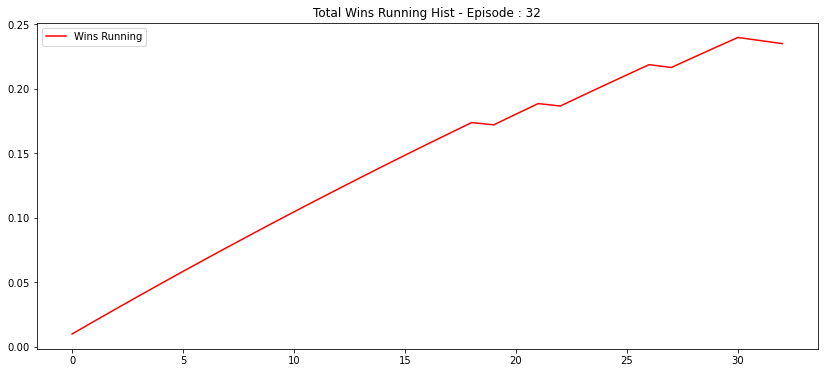

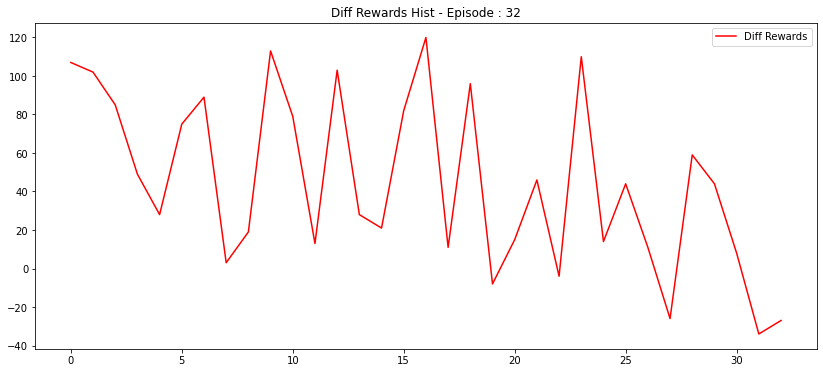

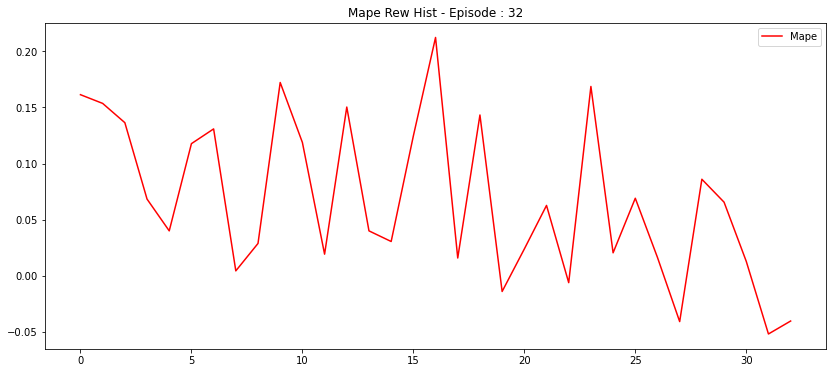

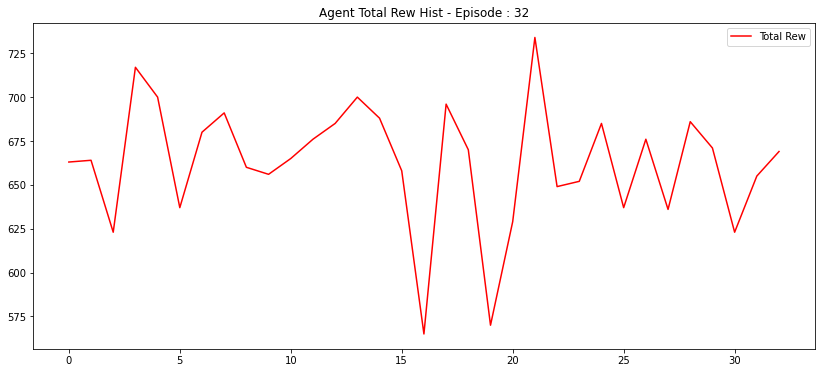

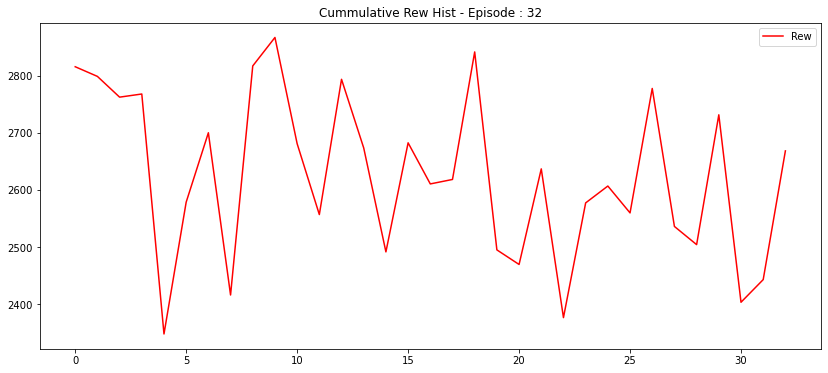

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 3


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


506 386 964
Env Agent Opp: regressor done, Idx: 3
526 406 1255
Env Agent Opp: regressor done, Idx: 2
539 419 1323
Env Agent Opp: regressor done, Idx: 1
716 707 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 5541, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 716, 'step': 1999, 'lastActions': [6, 95]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 707, 'step': 1999, 'lastActions': [6, 95]}
Step: 0
[0.78499174 0.04267386 0.04080428 0.02284299 0.10868706]
0
Step: 500
[9.9999499e-01 1.5448537e-08 2.5020606e-08 7.7147799e-10 5.0306089e-06]
0
Step: 1000
[9.9914849e-01 2.4411367e-05 3.1575626e-05 3.7934808e-06 7.9173996e-04]
0
Step: 1500
[0.97167057 0.00320891 0.00343973 0.00109036 0.02059044]
0
587 631 1999
vegas
Episode: 33
Agent Reward: 587
Opponent Reward: 631
Diff Reward: -44
Wins Nemesis last 10: 0.4


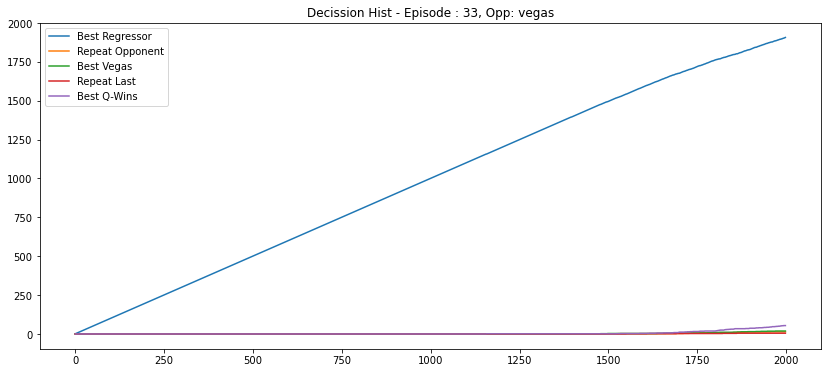

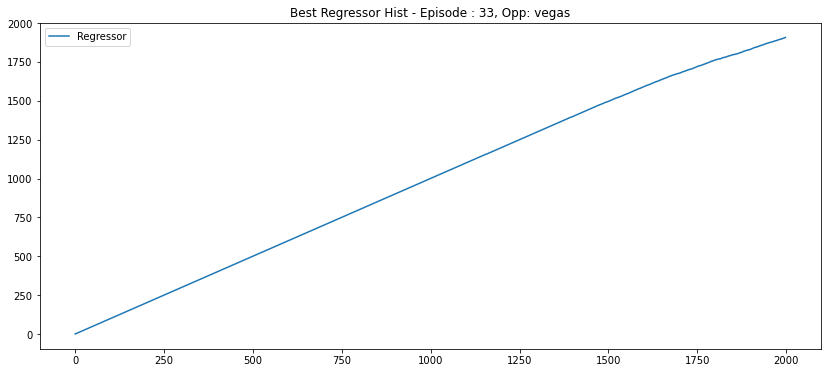

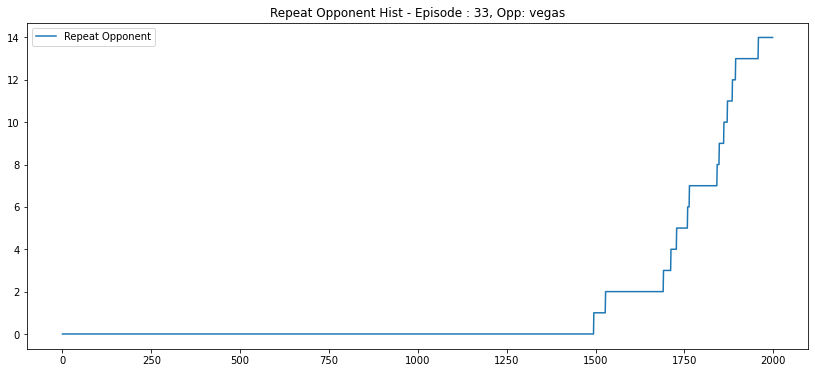

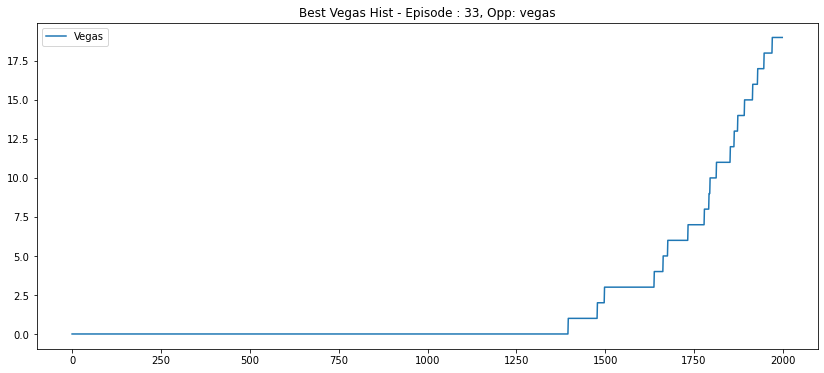

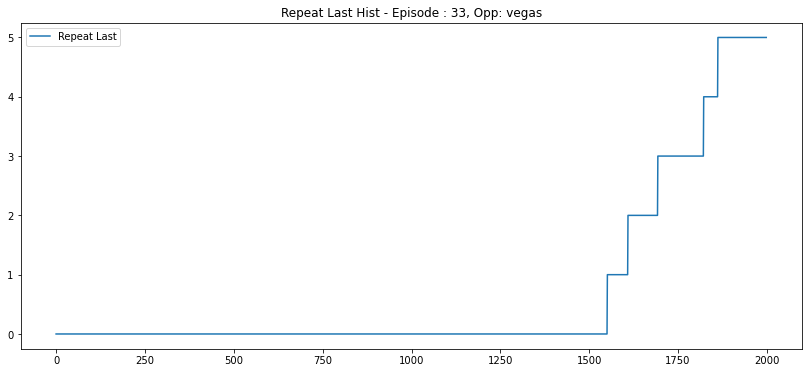

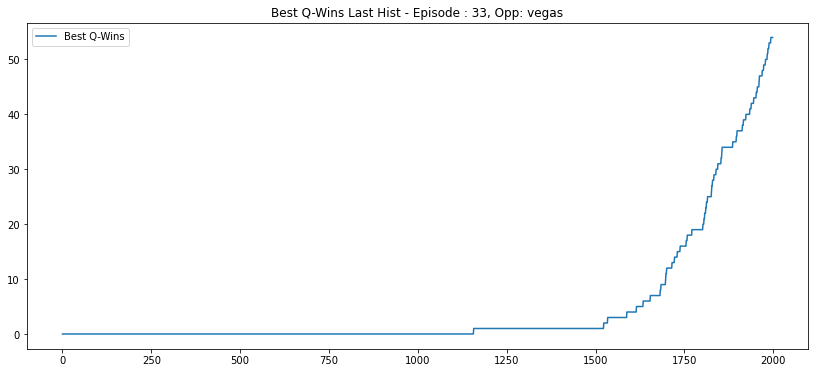

-> Ini env -> 3
553 433 1232
Env Agent Opp: regressor done, Idx: 2
549 429 1195
Env Agent Opp: regressor done, Idx: 3
665 545 1996
Env Agent Opp: regressor done, Idx: 1
683 655 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6422, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 683, 'step': 1999, 'lastActions': [32, 25]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 655, 'step': 1999, 'lastActions': [32, 25]}
Step: 0
[0.7906426  0.03498783 0.04221773 0.01896995 0.11318189]
0
Step: 500
[9.9998915e-01 1.2137473e-08 5.9299644e-08 7.2689188e-10 1.0708848e-05]
0
Step: 1000
[9.9843603e-01 2.7349393e-05 6.9185357e-05 4.9045243e-06 1.4625380e-03]
0
Step: 1500
[0.963216   0.00348461 0.0051164  0.00113833 0.02704473]
0
599 634 1999
vegas
Episode: 34
Agent Reward: 599
Opponent Reward: 634
Diff Reward: -35
Wins Nemesis last 10: 0.4


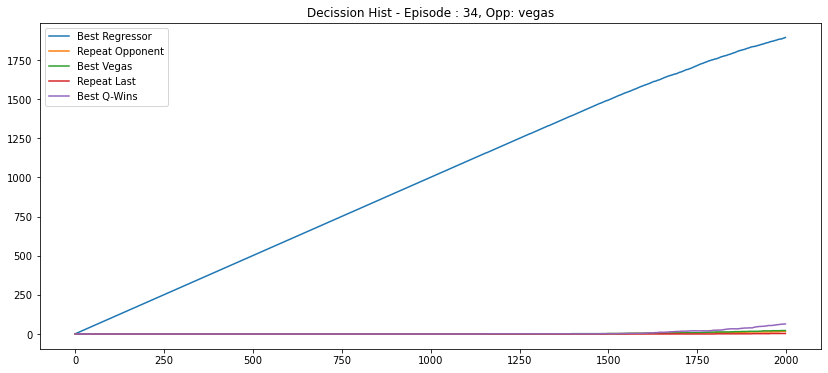

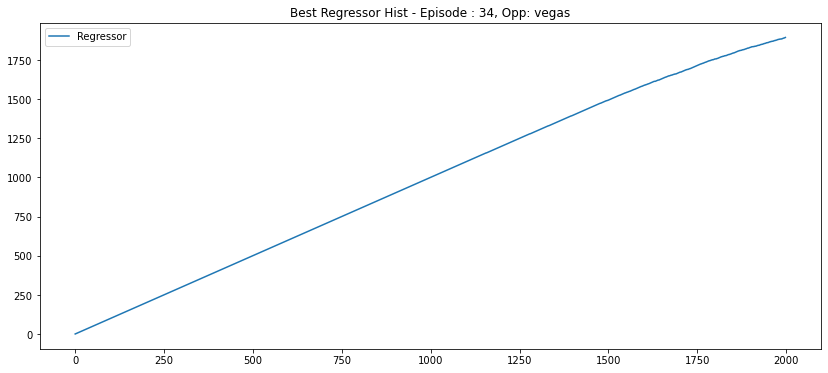

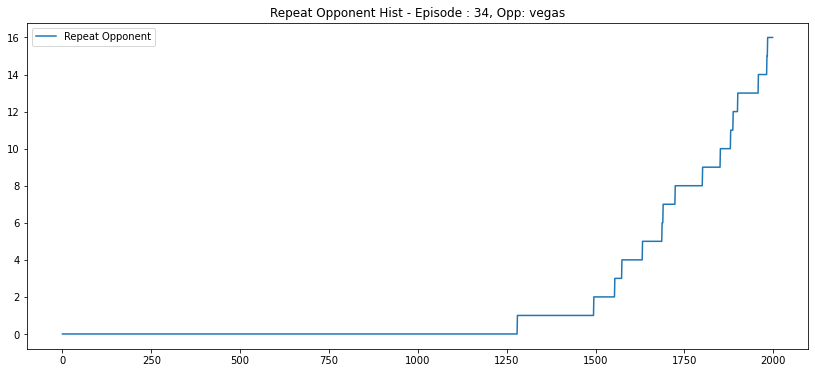

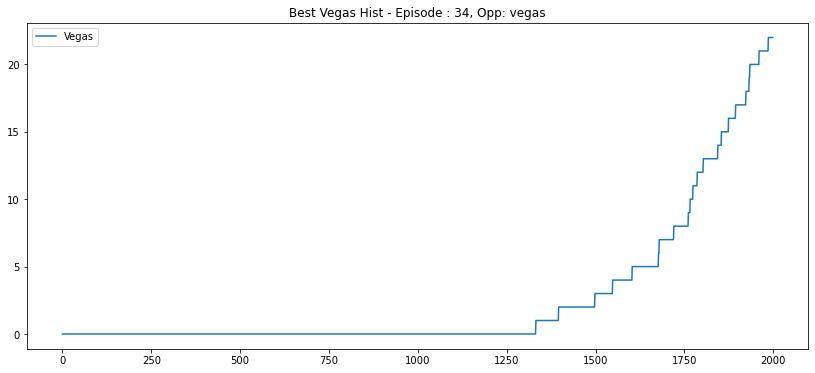

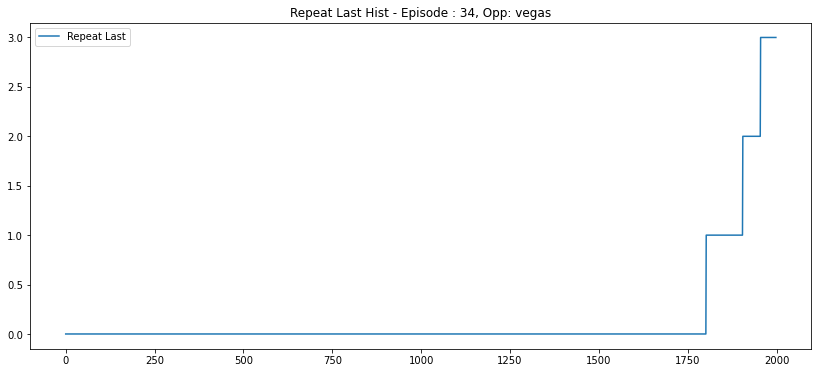

...

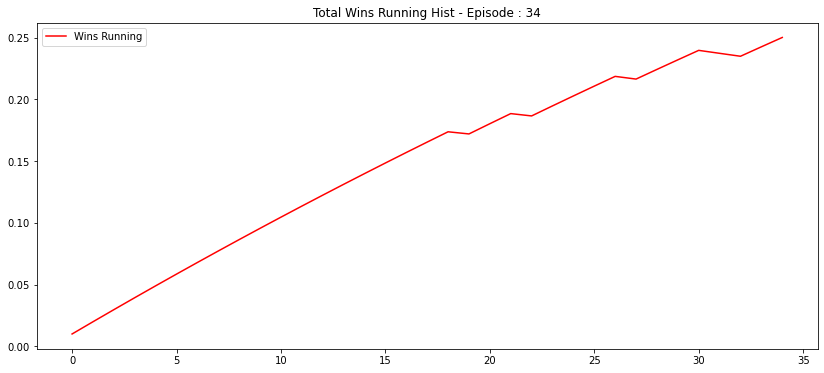

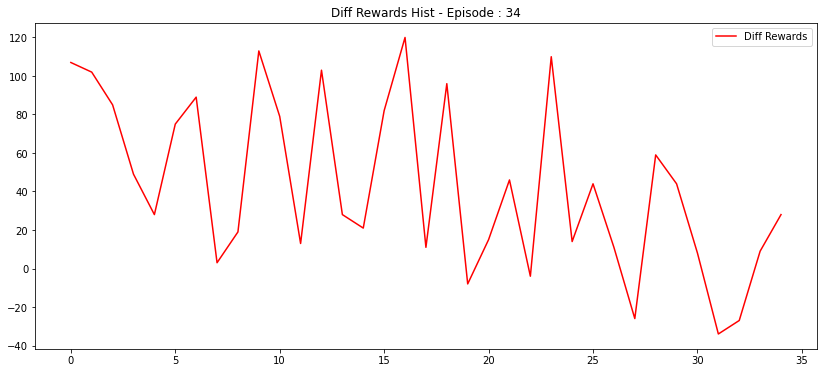

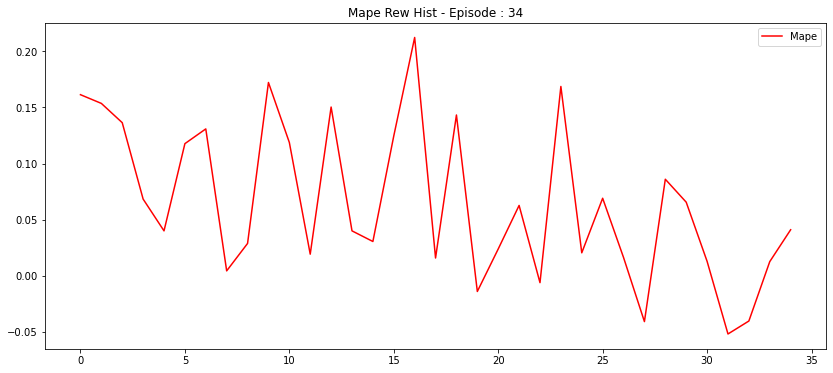

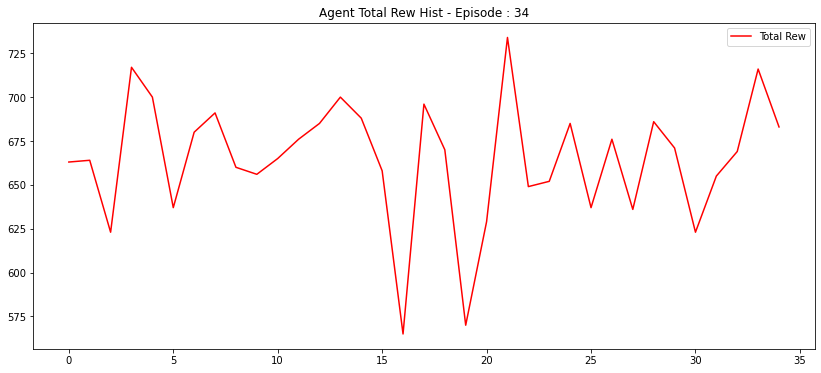

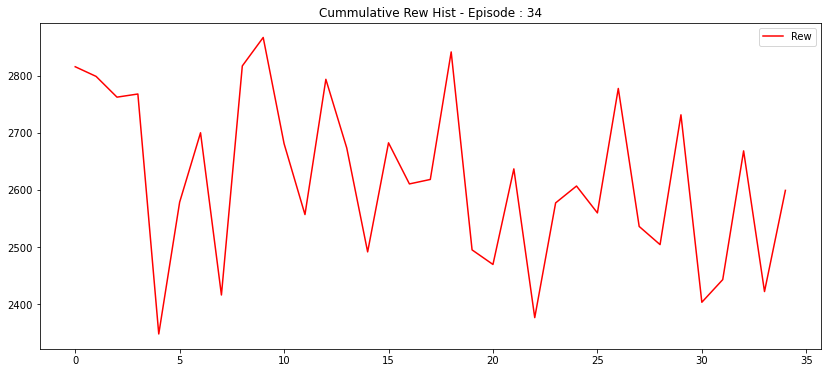

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 3


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:163: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_count_me' : self.arr_count_me / self.arr_co

560 440 1400
Env Agent Opp: regressor done, Idx: 1
670 550 1786
Env Agent Opp: regressor done, Idx: 3
584 464 1524
Env Agent Opp: regressor done, Idx: 2
714 645 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6709, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 714, 'step': 1999, 'lastActions': [94, 4]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 645, 'step': 1999, 'lastActions': [94, 4]}
INFO:tensorflow:Assets written to: ../04_Models/ActorCritic/Decission//model_a2c_dec_multienv_v0.6_35\assets
Step: 0
[0.7459558  0.03884038 0.0469317  0.01993624 0.14833584]
0
Step: 500
[9.9995244e-01 1.7011963e-08 7.5935979e-08 6.0835509e-10 4.7473797e-05]
0
Step: 1000
[9.9731427e-01 2.3393941e-05 6.0644041e-05 3.4983334e-06 2.5980938e-03]
0
Step: 1500
[0.9176093  0.00490103 0.0086039  0.00166146 0.06722432]
0
655 633 1999
regressor
Episode: 35
Agent Reward: 655
Opponent Reward: 633
Diff Reward: 22
Wins Nemesis last 10: 0.5


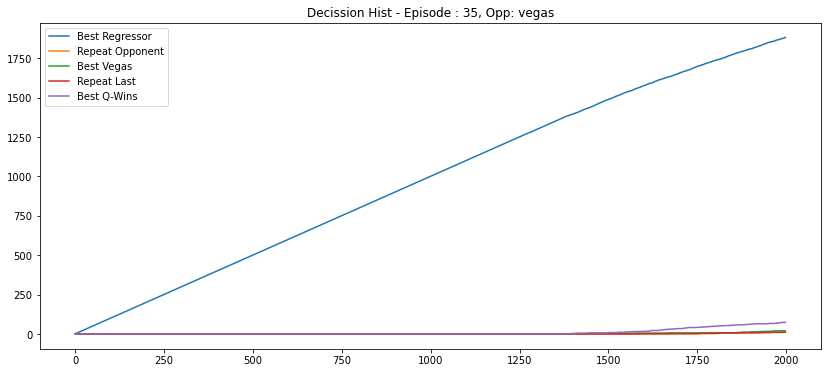

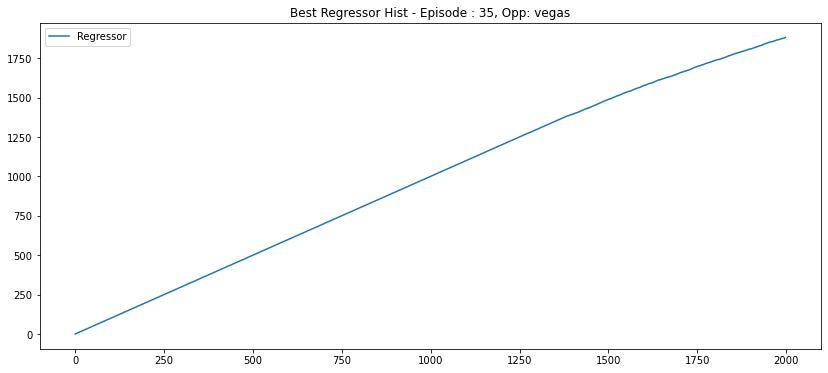

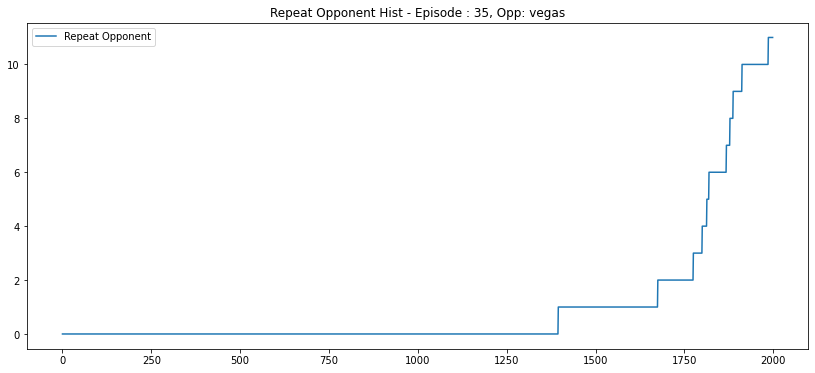

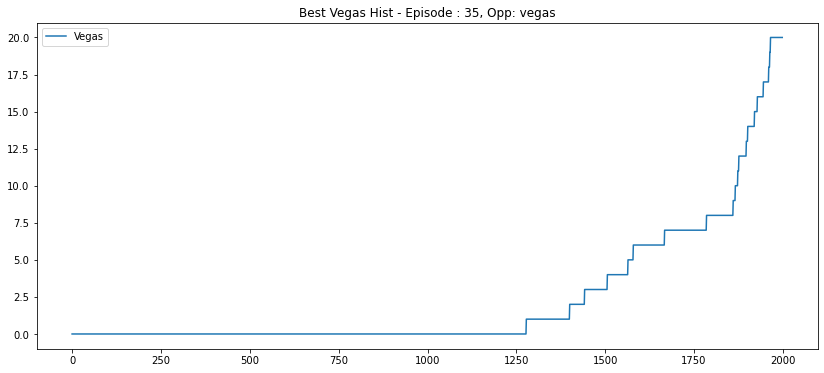

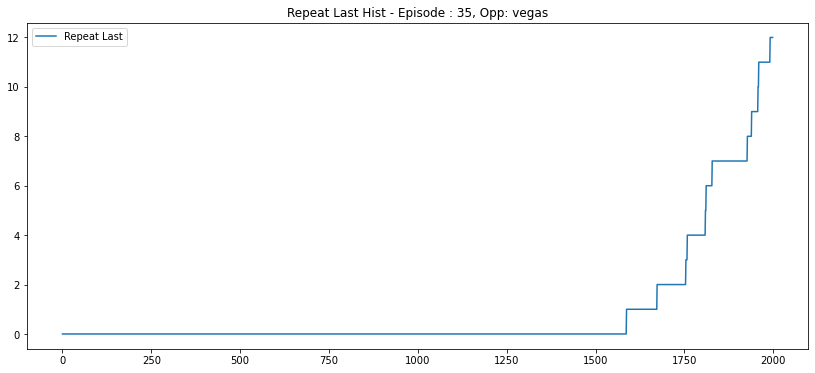

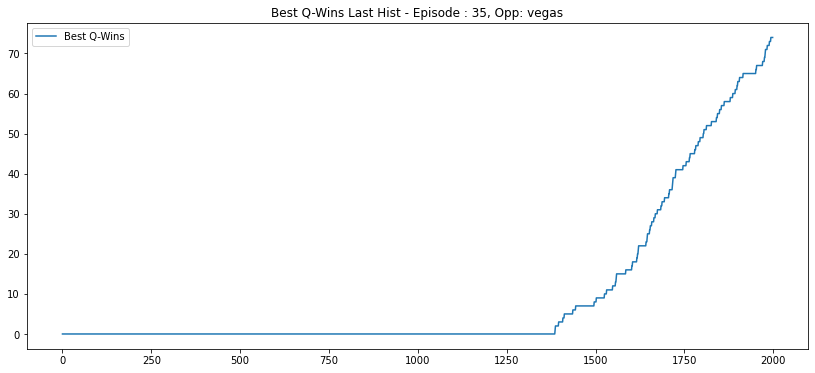

-> Ini env -> 1
582 462 1314
Env Agent Opp: regressor done, Idx: 3
567 447 1448
Env Agent Opp: regressor done, Idx: 1
604 484 1490
Env Agent Opp: regressor done, Idx: 2
634 666 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6251, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 634, 'step': 1999, 'lastActions': [26, 56]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 666, 'step': 1999, 'lastActions': [26, 56]}
Step: 0
[0.8061948  0.0353082  0.03891819 0.01698807 0.10259085]
0
Step: 500
[9.9999809e-01 2.9450757e-09 9.4472972e-09 7.5885027e-11 1.9567583e-06]
0
Step: 1000
[9.9910235e-01 2.1333792e-05 4.2864882e-05 2.6495179e-06 8.3091698e-04]
0
Step: 1500
[0.92651385 0.00929988 0.01067432 0.00308593 0.05042598]
0
592 620 1999
vegas
Episode: 36
Agent Reward: 592
Opponent Reward: 620
Diff Reward: -28
Wins Nemesis last 10: 0.4


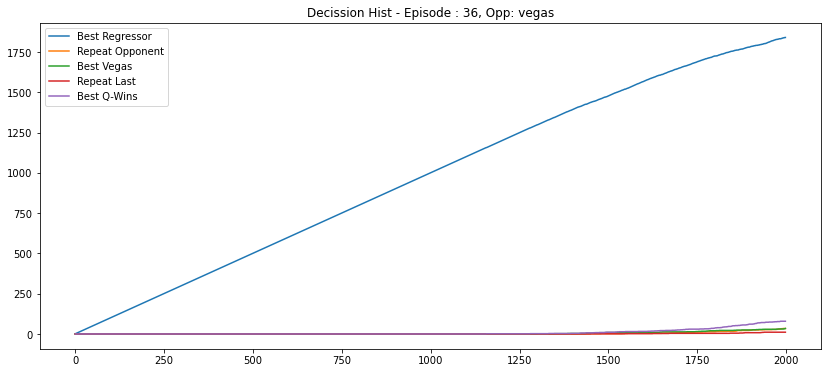

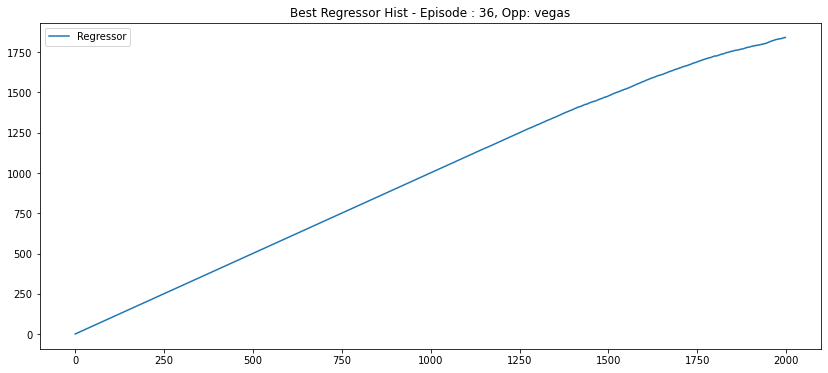

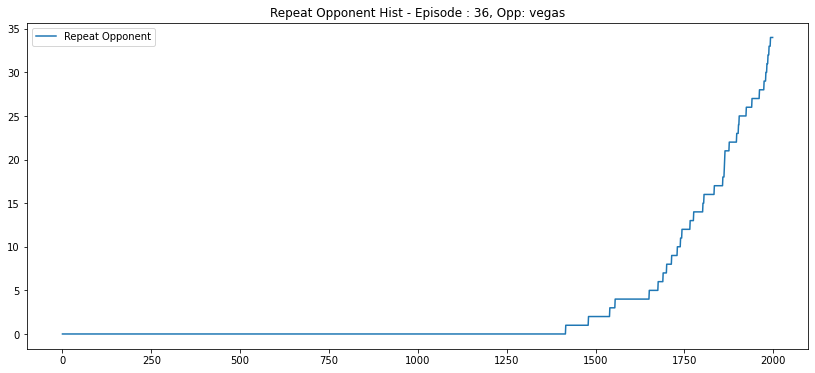

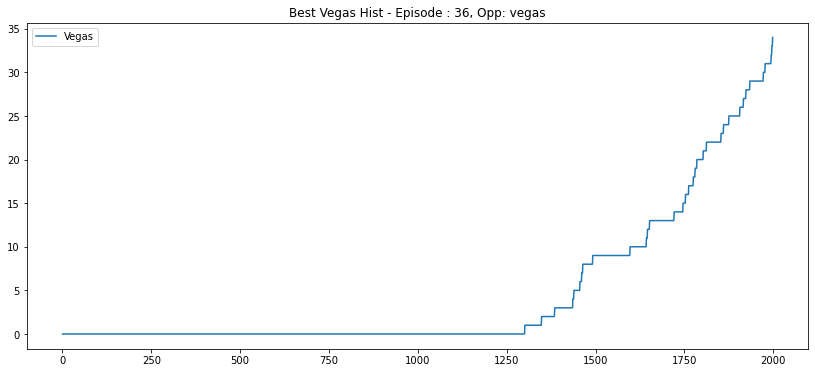

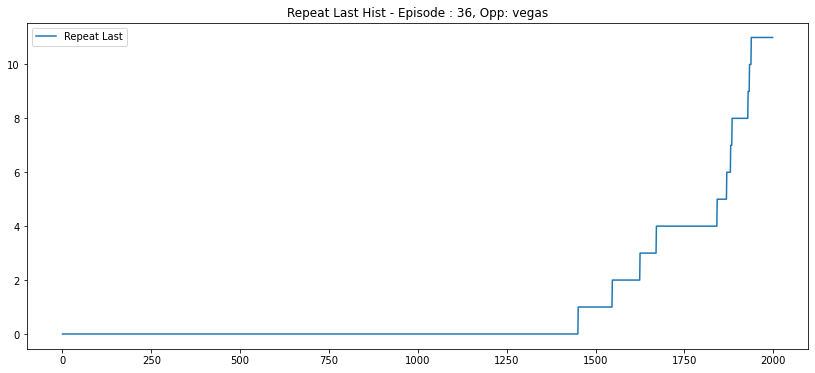

...

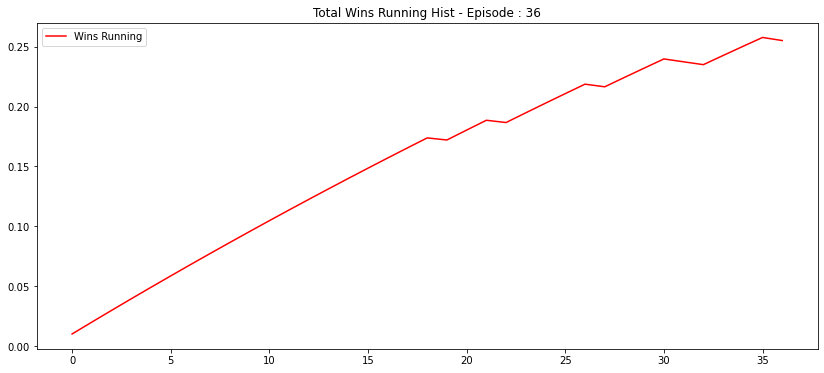

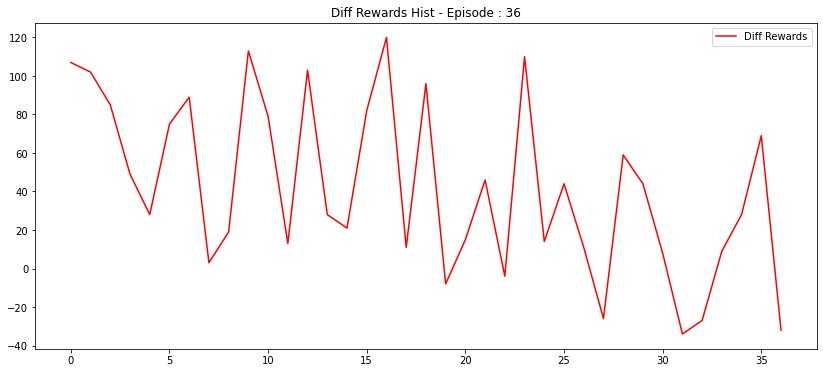

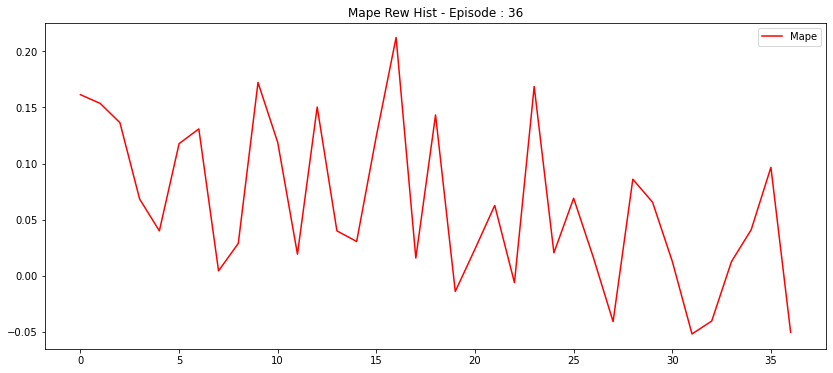

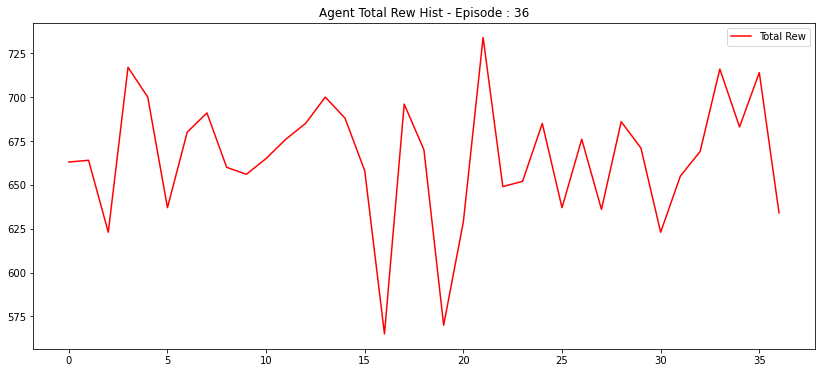

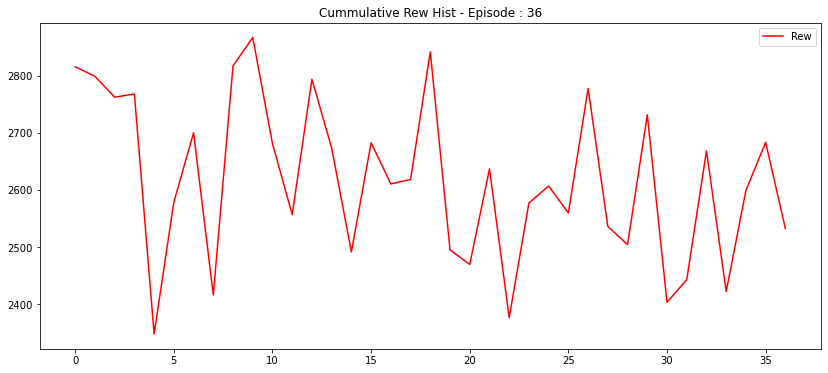

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 1


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:163: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_count_me' : self.arr_count_me / self.arr_co

548 428 1302
Env Agent Opp: regressor done, Idx: 3
575 455 1400
Env Agent Opp: regressor done, Idx: 2
581 461 1476
Env Agent Opp: regressor done, Idx: 1
651 631 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6177, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 651, 'step': 1999, 'lastActions': [55, 26]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 631, 'step': 1999, 'lastActions': [55, 26]}
Step: 0
[0.8309592  0.03069851 0.03154593 0.01419322 0.09260315]
0
Step: 500
[9.9999785e-01 4.0783790e-09 9.3339718e-09 1.4446773e-10 2.1492913e-06]
0
Step: 1000
[9.9836737e-01 5.9506514e-05 7.3093812e-05 8.4862577e-06 1.4916534e-03]
0
Step: 1500
[0.8212448  0.02935131 0.03065557 0.01214548 0.10660278]
0
624 595 1999
regressor
Episode: 37
Agent Reward: 624
Opponent Reward: 595
Diff Reward: 29
Wins Nemesis last 10: 0.4


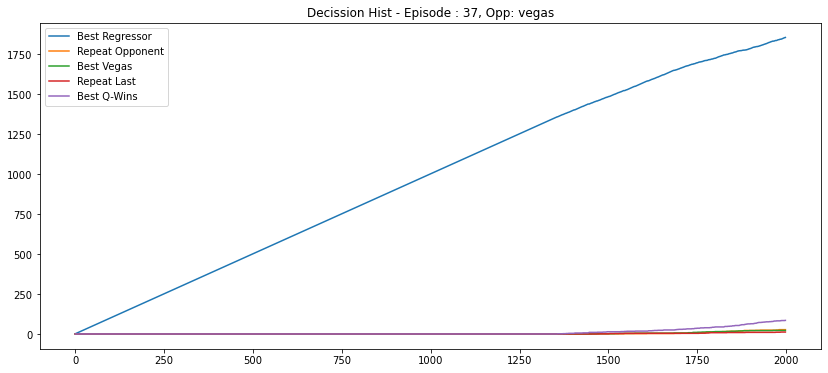

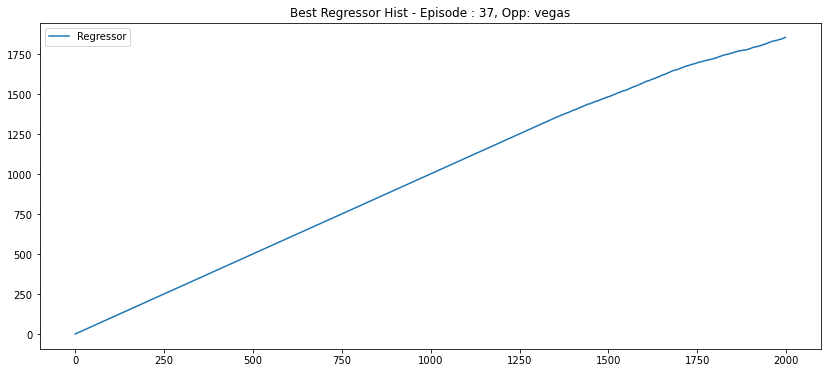

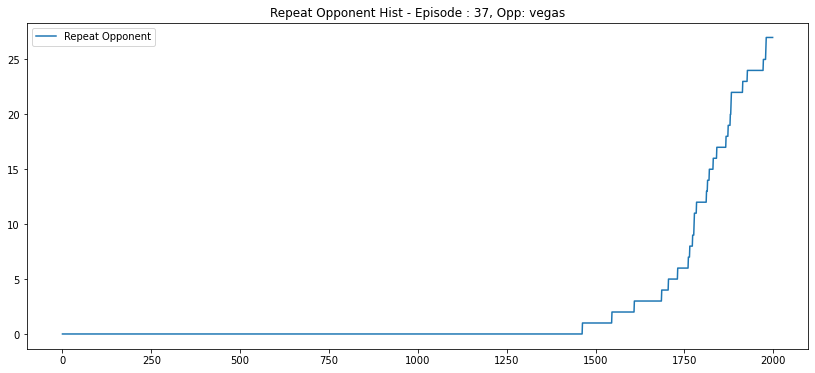

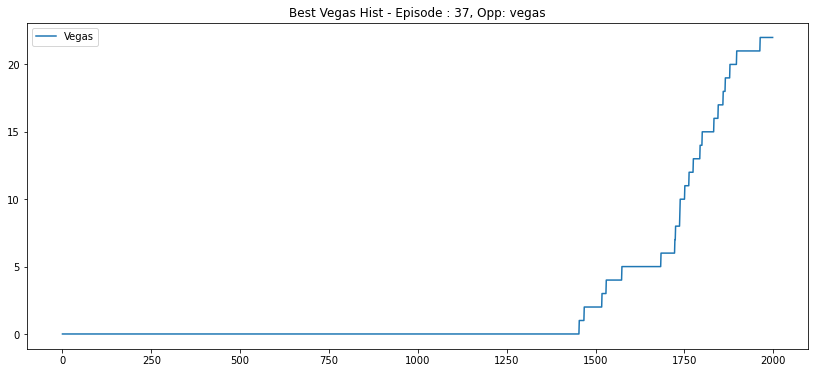

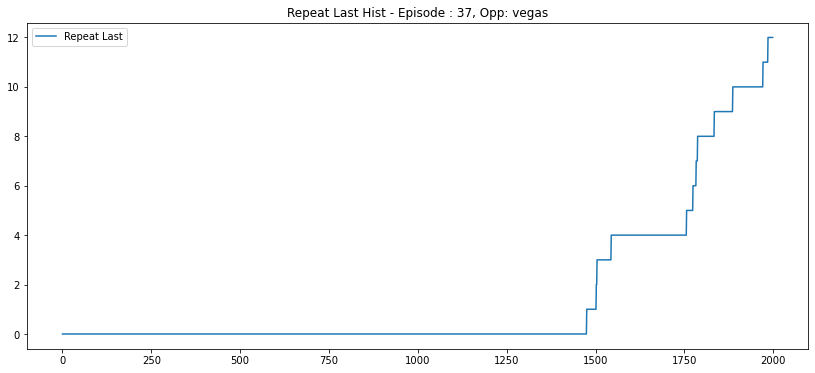

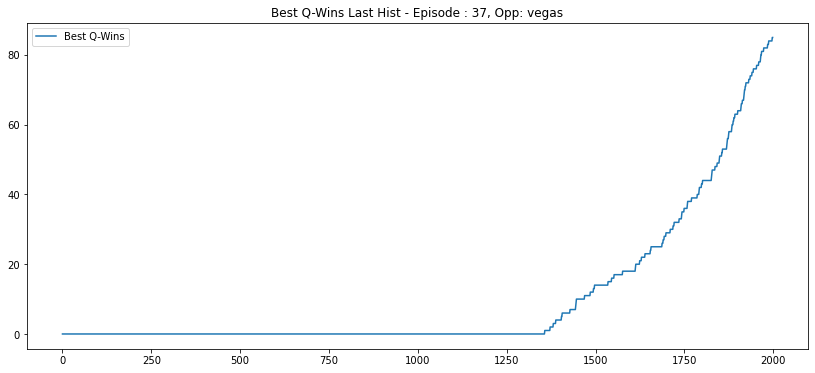

-> Ini env -> 3
517 397 1039
Env Agent Opp: regressor done, Idx: 3
539 419 1299
Env Agent Opp: regressor done, Idx: 1
540 420 1303
Env Agent Opp: regressor done, Idx: 1
509 389 1169
Env Agent Opp: regressor done, Idx: 2
644 609 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 5510, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 644, 'step': 1999, 'lastActions': [6, 66]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 609, 'step': 1999, 'lastActions': [6, 66]}
Step: 0
[0.79943717 0.03790602 0.03791558 0.01590782 0.10883332]
0
Step: 500
[9.9999857e-01 1.2288365e-09 2.3384157e-09 1.2398959e-11 1.4658917e-06]
0
Step: 1000
[9.9886298e-01 2.4373130e-05 3.3046170e-05 2.0889543e-06 1.0774573e-03]
0
Step: 1500
[0.87924856 0.01547125 0.01906769 0.00530385 0.08090869]
0
642 695 1999
regressor
Episode: 38
Agent Reward: 642
Opponent Reward: 695
Diff Reward: -53
Wins Nemesis last 10: 0.4


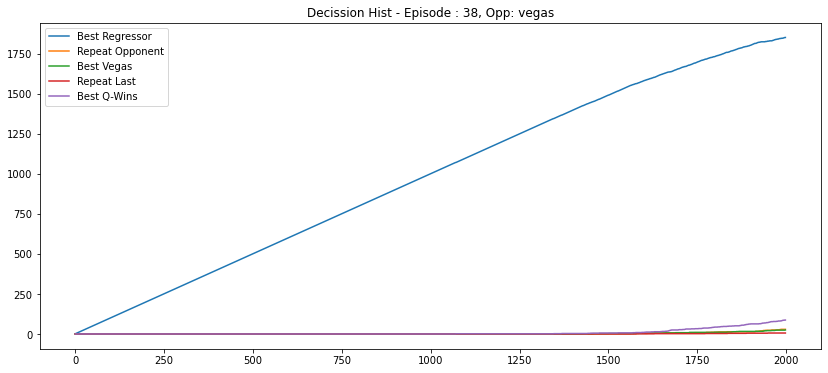

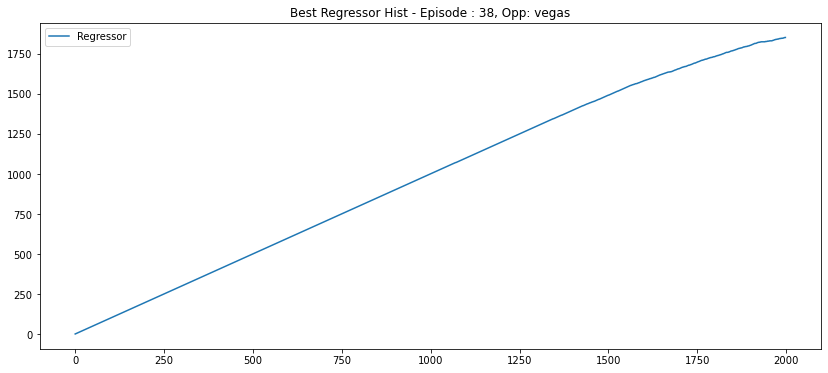

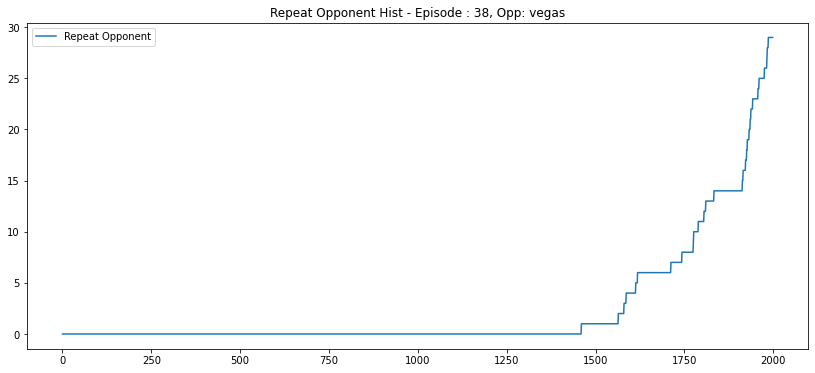

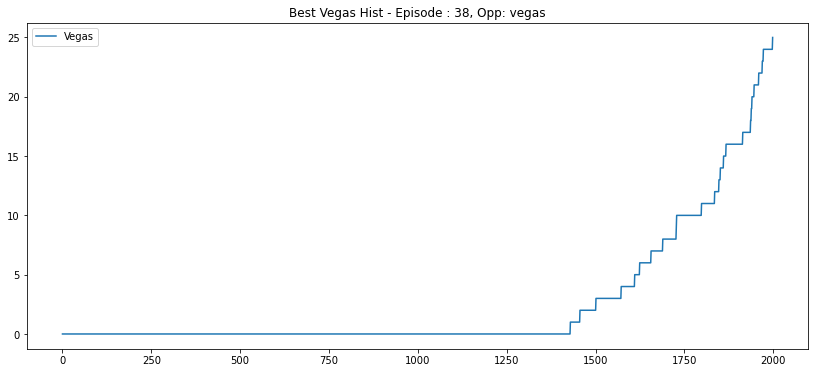

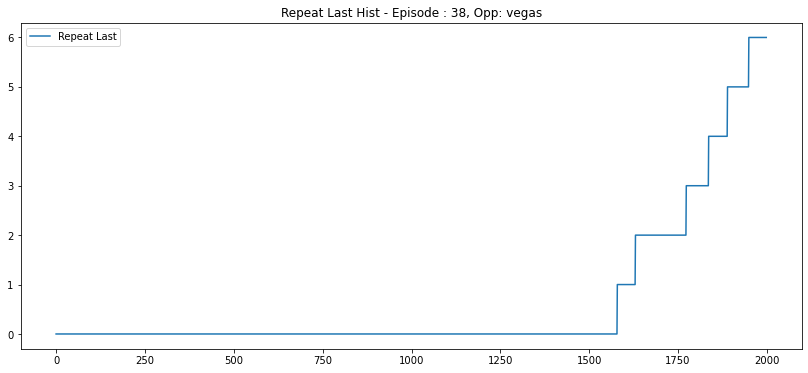

...

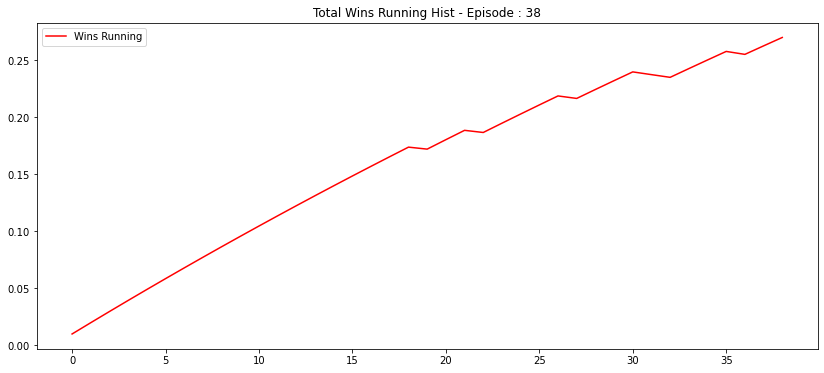

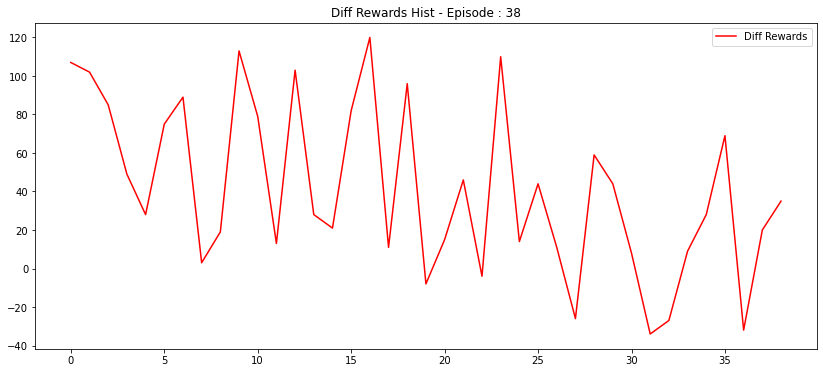

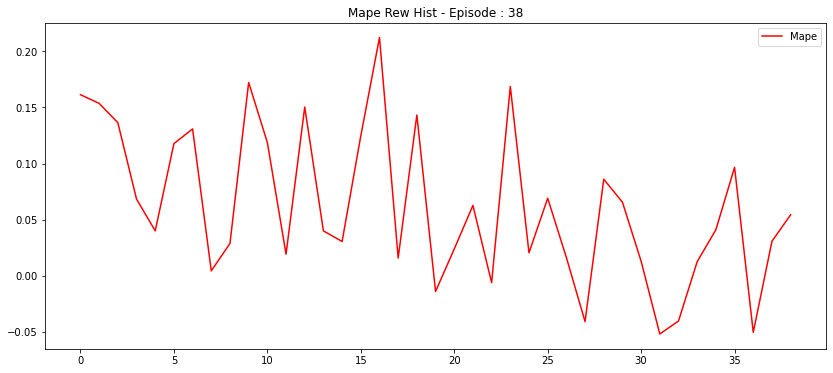

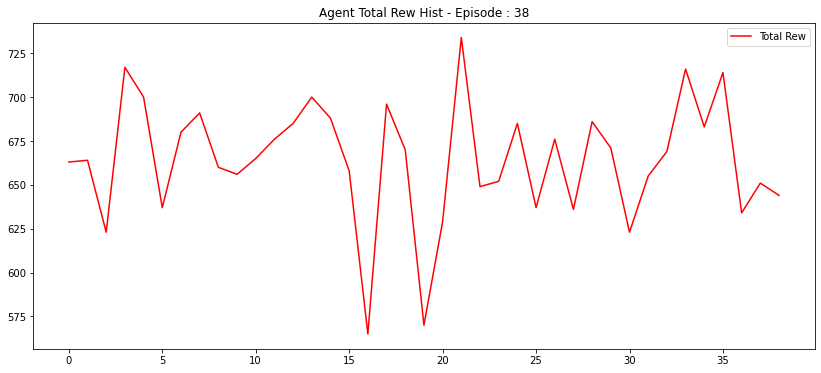

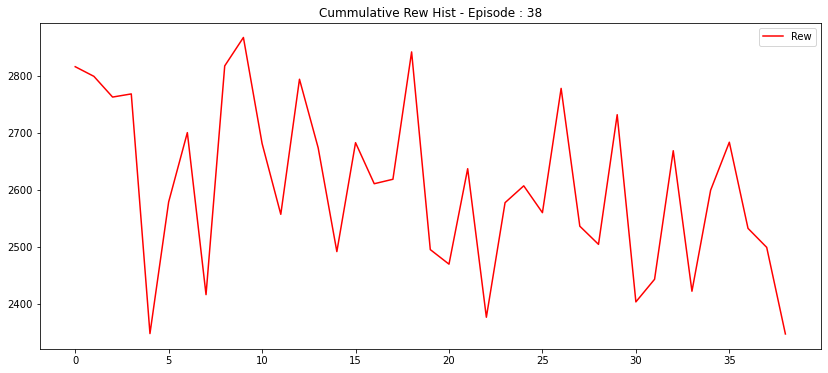

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 3


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


612 492 1442
Env Agent Opp: regressor done, Idx: 3
612 492 1443
Env Agent Opp: regressor done, Idx: 3
510 390 1084
Env Agent Opp: regressor done, Idx: 2
569 449 1429
Env Agent Opp: regressor done, Idx: 1
676 656 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 5955, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 676, 'step': 1999, 'lastActions': [58, 89]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 656, 'step': 1999, 'lastActions': [58, 89]}
Step: 0
[0.8537558  0.02945439 0.02374702 0.00923672 0.0838061 ]
0
Step: 500
[9.99998808e-01 3.13550363e-09 1.52480917e-09 1.02802385e-11
 1.17791330e-06]
0
Step: 1000
[9.9859089e-01 5.8578124e-05 4.2618238e-05 2.5907871e-06 1.3053276e-03]
0
Step: 1500
[0.8633125  0.01873919 0.01673285 0.00456959 0.09664589]
0
586 625 1999
regressor
Episode: 39
Agent Reward: 586
Opponent Reward: 625
Diff Reward: -39
Wins Nemesis last 10: 0.3


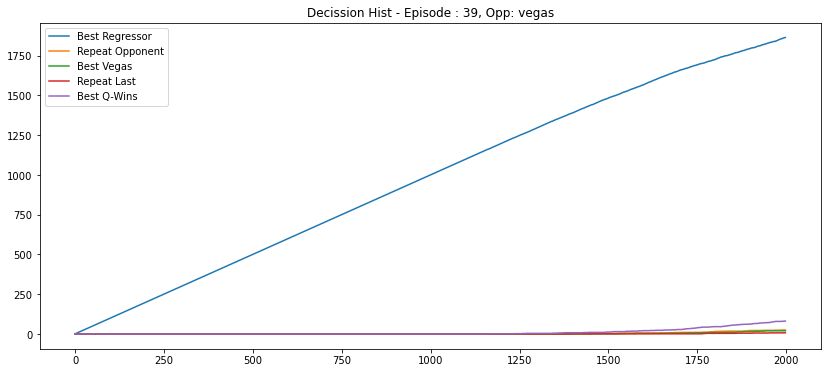

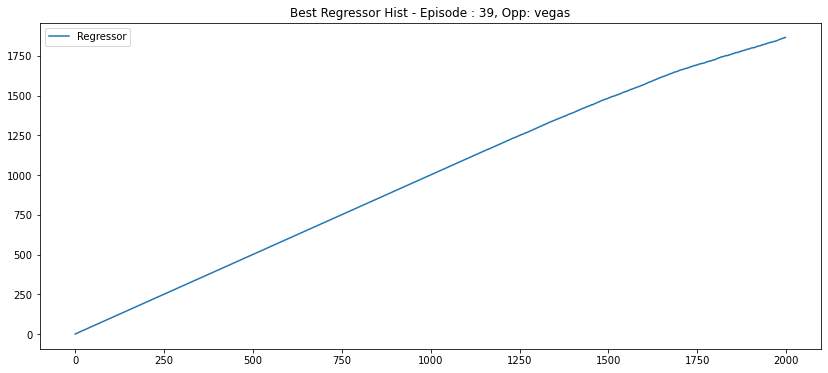

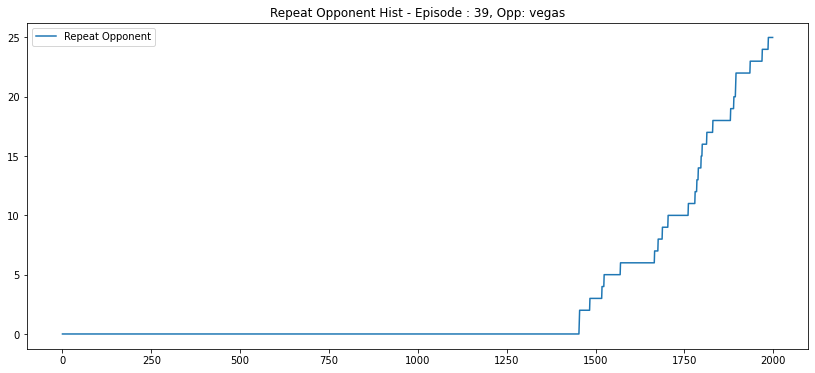

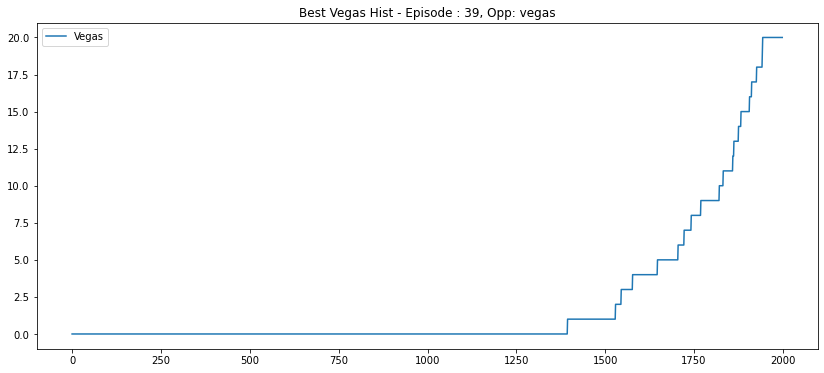

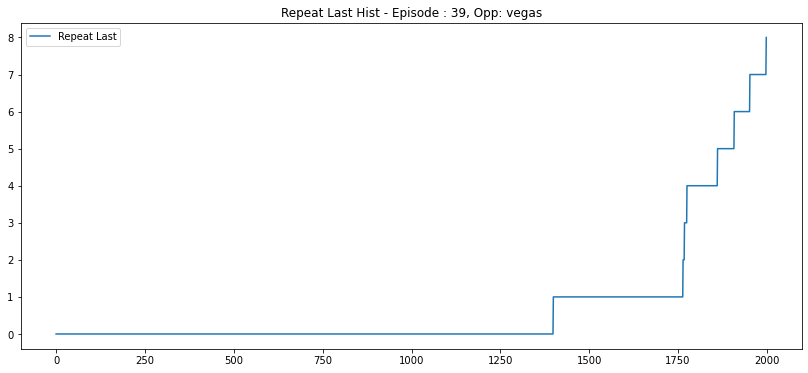

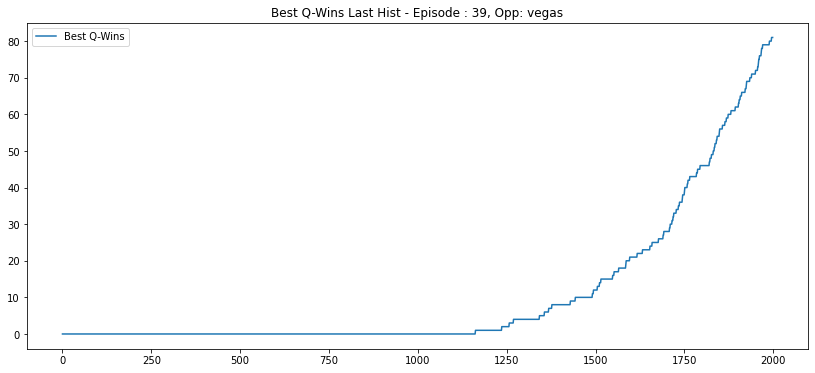

-> Ini env -> 1
577 457 1407
Env Agent Opp: regressor done, Idx: 2
624 632 1999
Env Agent Opp: vegas done, Idx: 0
644 524 1713
Env Agent Opp: regressor done, Idx: 3
637 517 1672
Env Agent Opp: regressor done, Idx: 1
All envs done
Break step: 6791, Done: True, Idx : 1 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 637, 'step': 1672, 'lastActions': [99, 47]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 517, 'step': 1672, 'lastActions': [99, 47]}
INFO:tensorflow:Assets written to: ../04_Models/ActorCritic/Decission//model_a2c_dec_multienv_v0.6_40\assets
Step: 0
[0.9143768  0.01652821 0.01289432 0.00441276 0.05178788]
0


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:163: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_count_me' : self.arr_count_me / self.arr_count,


Step: 500
[1.0000000e+00 8.8130225e-13 3.3135940e-13 4.3567770e-16 1.7491315e-09]
0
Step: 1000
[9.9998522e-01 2.0000118e-07 1.3047119e-07 2.6999993e-09 1.4401247e-05]
0
Step: 1500
[9.9905199e-01 5.4211883e-05 3.8663315e-05 2.7815454e-06 8.5239462e-04]
0
685 650 1999
regressor
Episode: 40
Agent Reward: 685
Opponent Reward: 650
Diff Reward: 35
Wins Nemesis last 10: 0.3


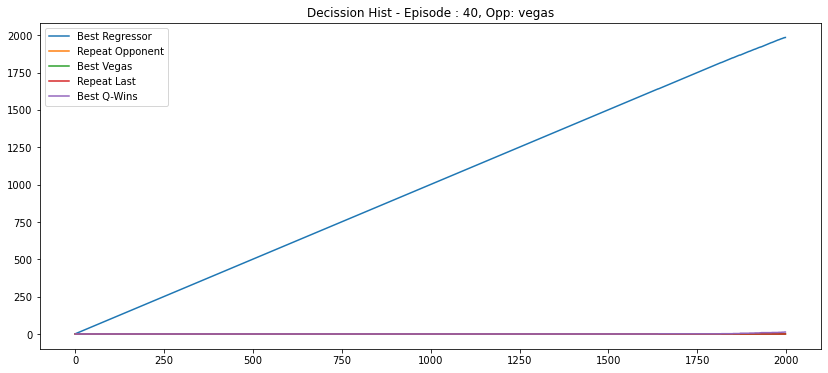

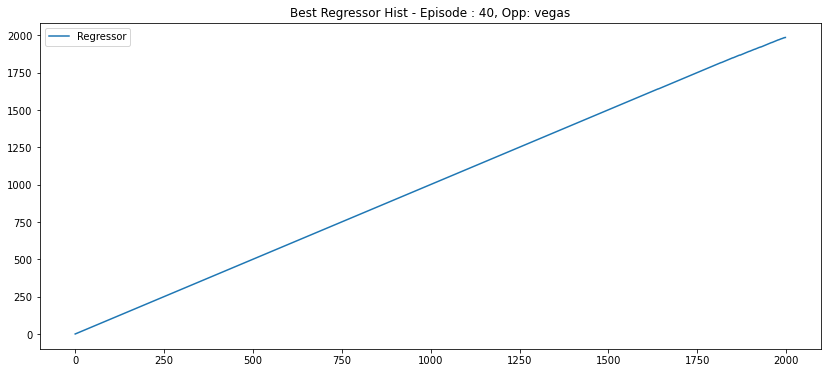

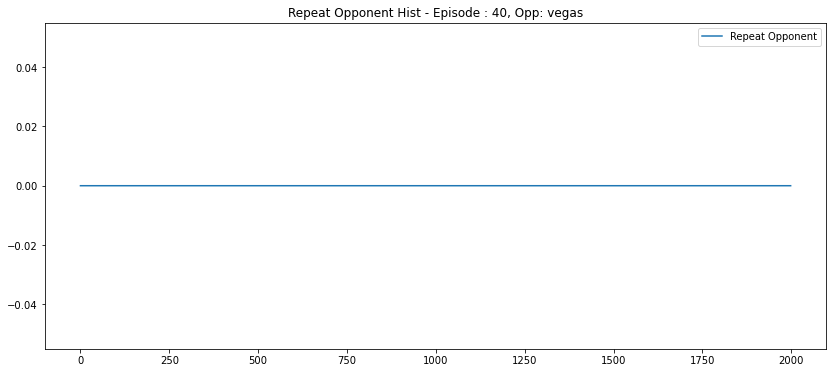

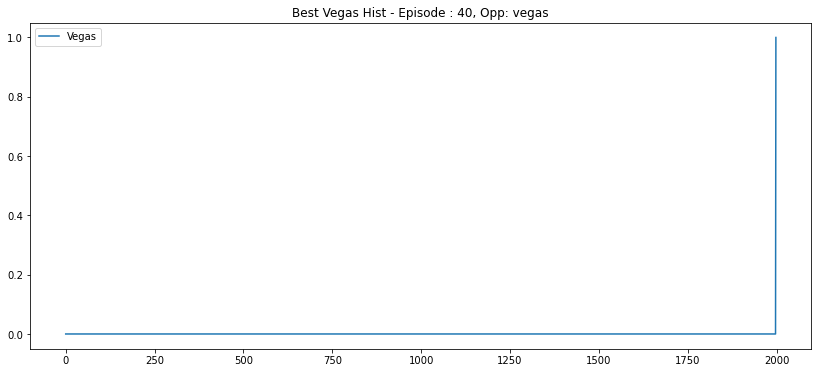

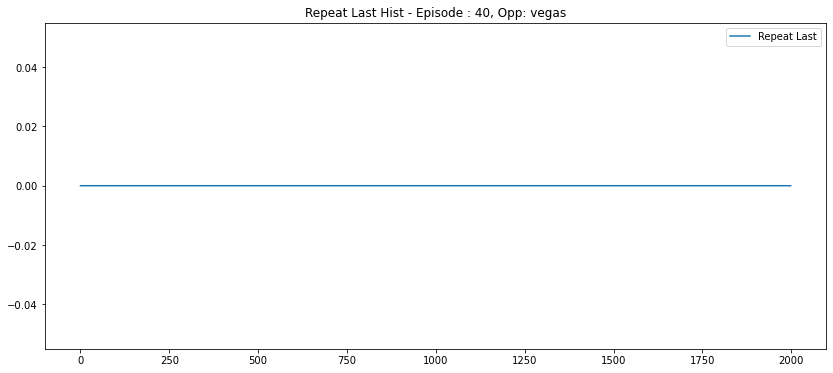

...

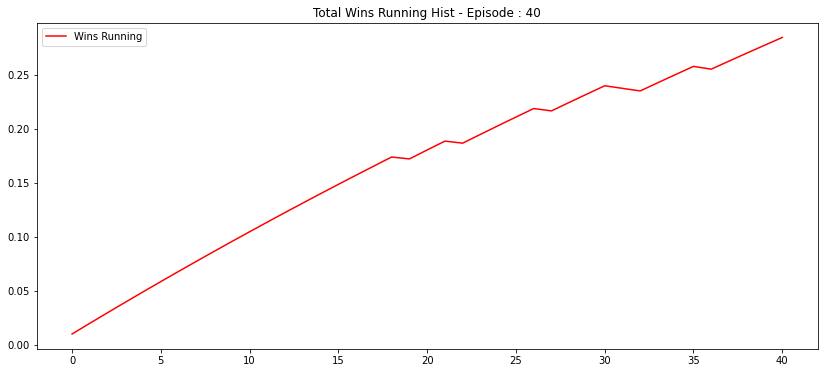

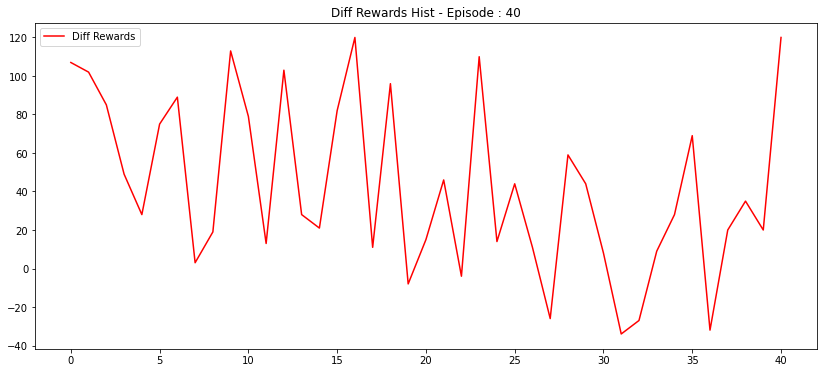

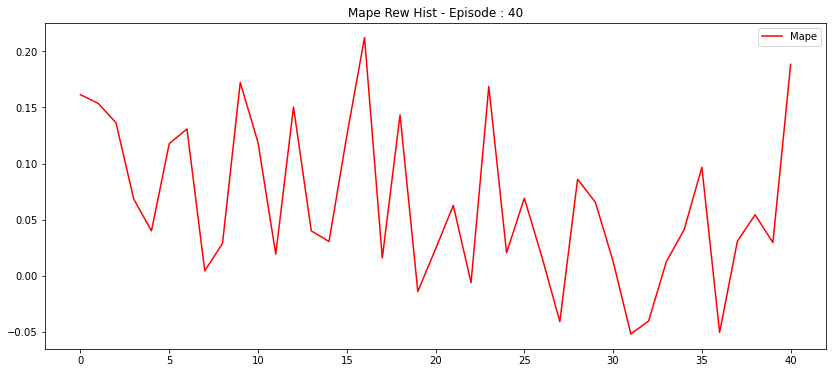

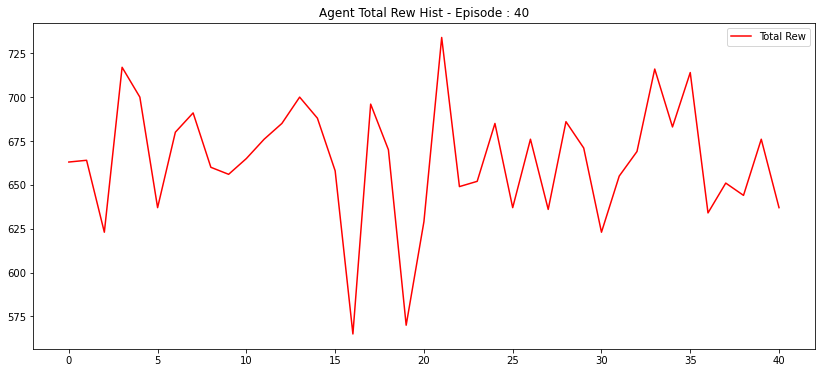

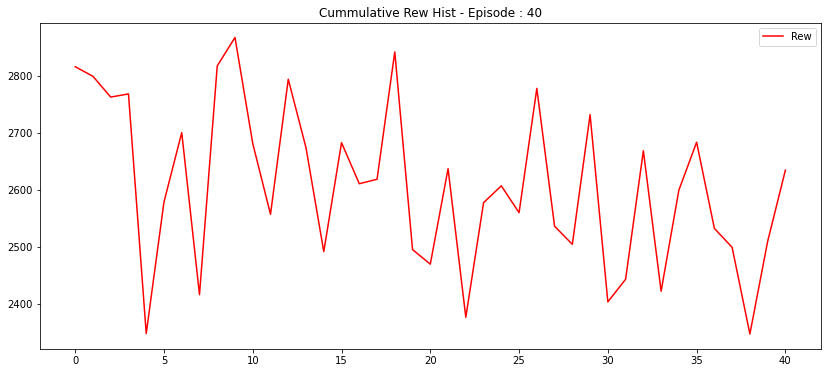

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 1


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


562 442 1293
Env Agent Opp: regressor done, Idx: 2
511 391 1169
Env Agent Opp: regressor done, Idx: 1
564 611 1999
Env Agent Opp: vegas done, Idx: 0
638 518 1717
Env Agent Opp: regressor done, Idx: 3
All envs done
Break step: 6178, Done: True, Idx : 3 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 638, 'step': 1717, 'lastActions': [25, 57]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 518, 'step': 1717, 'lastActions': [25, 57]}
Step: 0
[0.8445482  0.03132809 0.0232639  0.01104651 0.08981334]
0
Step: 500
[9.9999952e-01 6.1547767e-10 2.1884254e-10 2.8187838e-12 4.7072032e-07]
0
Step: 1000
[9.9846208e-01 6.5996261e-05 4.0494808e-05 4.4961107e-06 1.4270399e-03]
0
Step: 1500
[0.9541029  0.00675446 0.00441879 0.00112245 0.03360145]
0
591 625 1999
regressor
Episode: 41
Agent Reward: 591
Opponent Reward: 625
Diff Reward: -34
Wins Nemesis last 10: 0.3


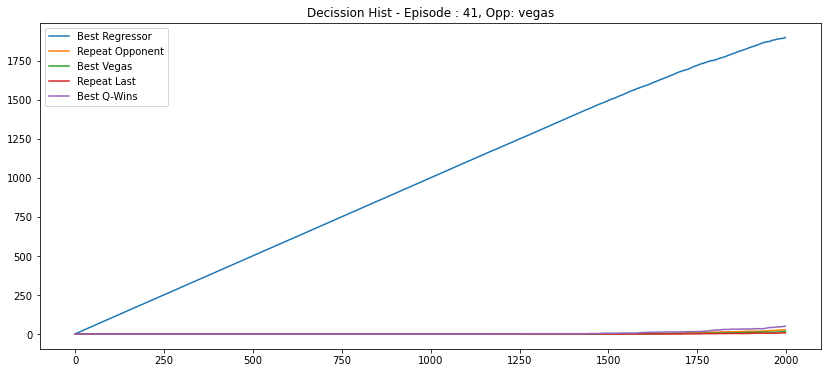

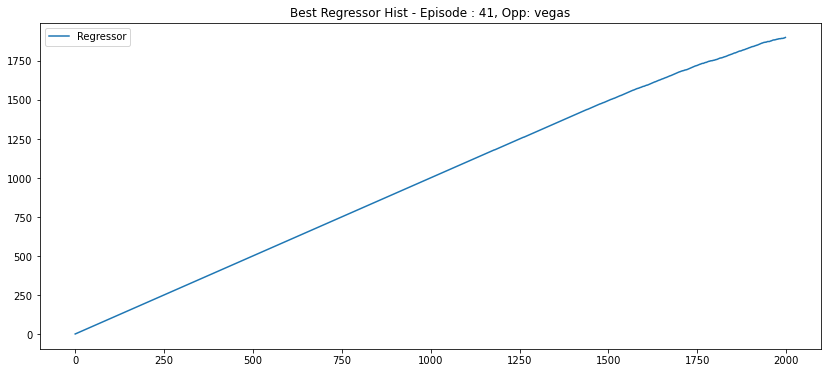

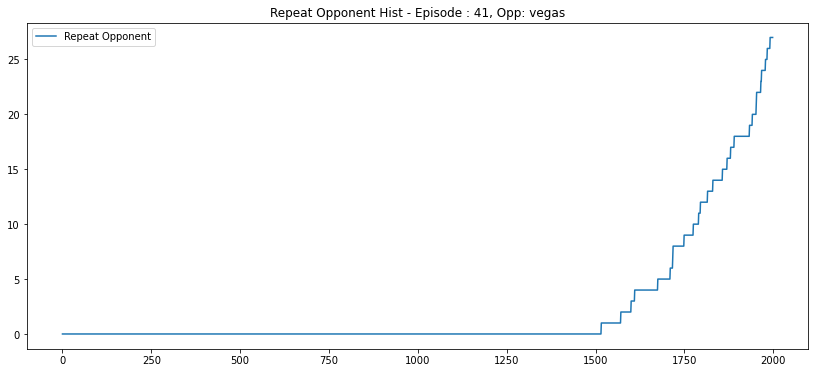

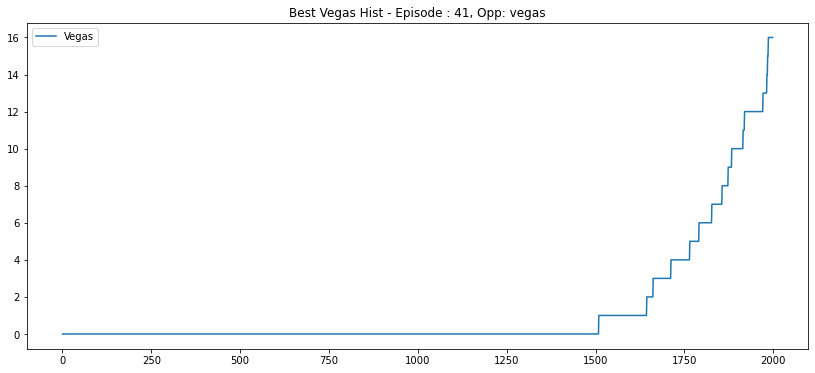

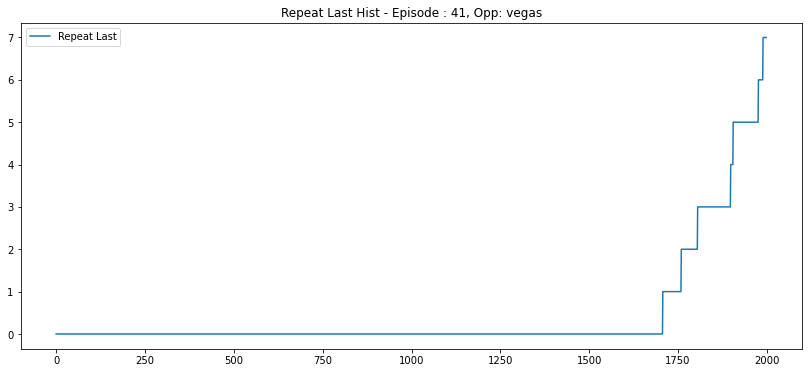

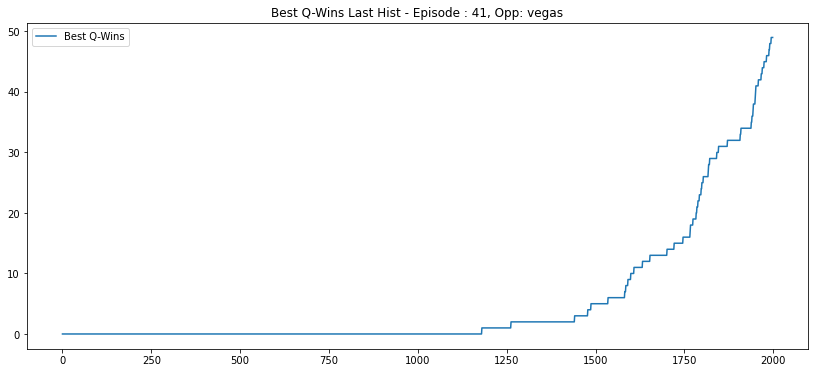

-> Ini env -> 2
581 461 1370
Env Agent Opp: regressor done, Idx: 3
633 545 1999
Env Agent Opp: regressor done, Idx: 2
675 572 1999
Env Agent Opp: regressor done, Idx: 1
684 631 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 7367, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 684, 'step': 1999, 'lastActions': [21, 12]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 631, 'step': 1999, 'lastActions': [21, 12]}
Step: 0
[0.8717972  0.02686296 0.01518129 0.00766718 0.07849126]
0
Step: 500
[9.9999952e-01 6.6559536e-10 3.6307450e-11 8.7153792e-13 5.2490520e-07]
0
Step: 1000
[9.9982625e-01 3.0068088e-06 4.8977955e-07 4.8104507e-08 1.7019555e-04]
0
Step: 1500
[9.8629934e-01 1.4425928e-03 5.6783209e-04 1.3778845e-04 1.1552536e-02]
0
673 662 1999
regressor
Episode: 42
Agent Reward: 673
Opponent Reward: 662
Diff Reward: 11
Wins Nemesis last 10: 0.4


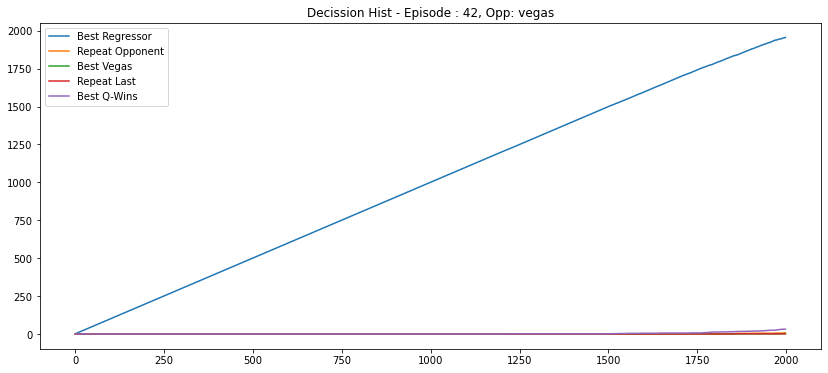

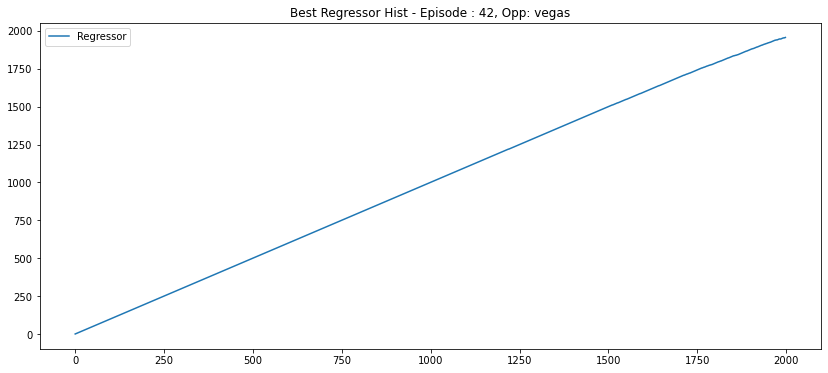

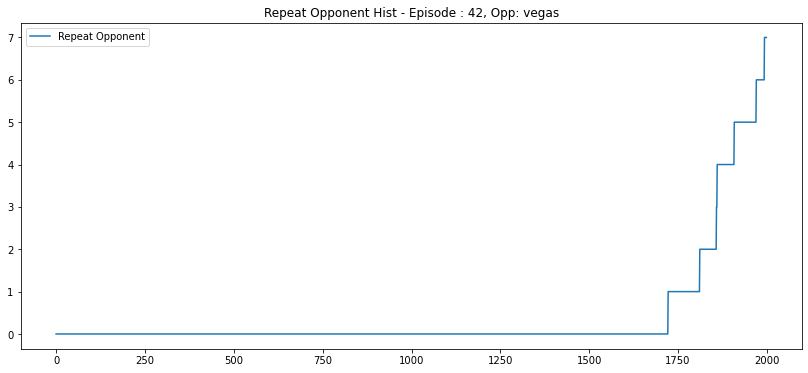

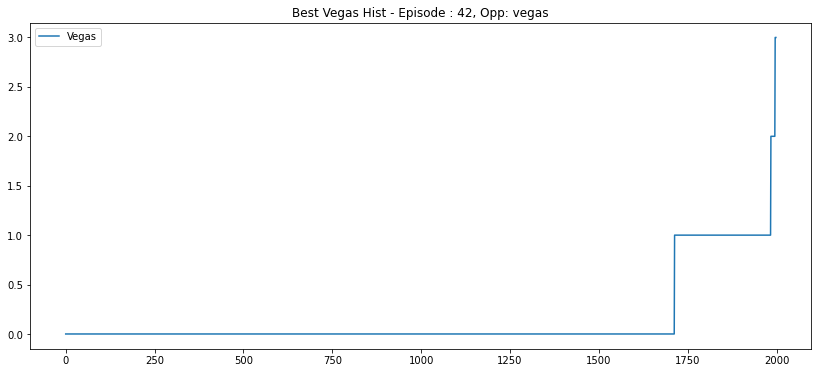

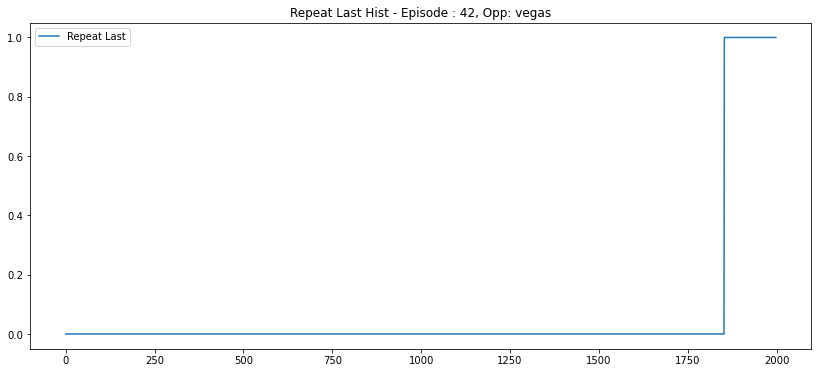

...

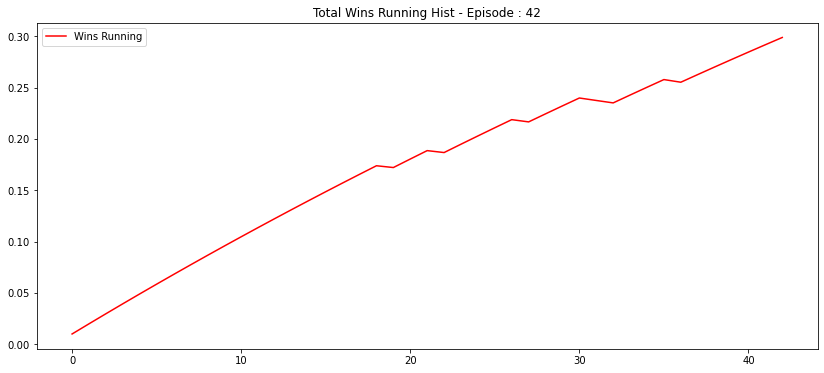

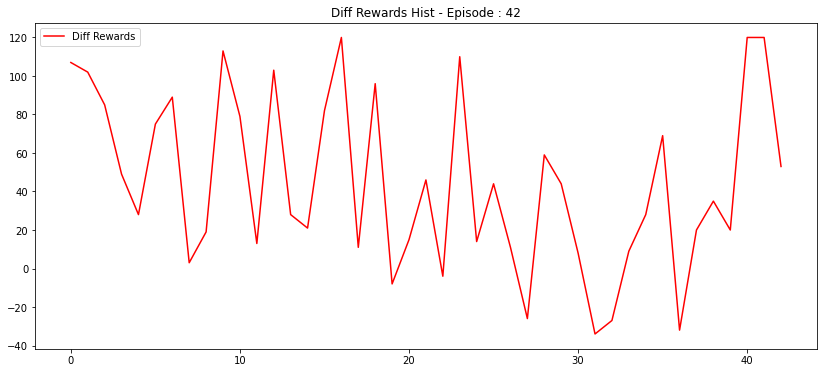

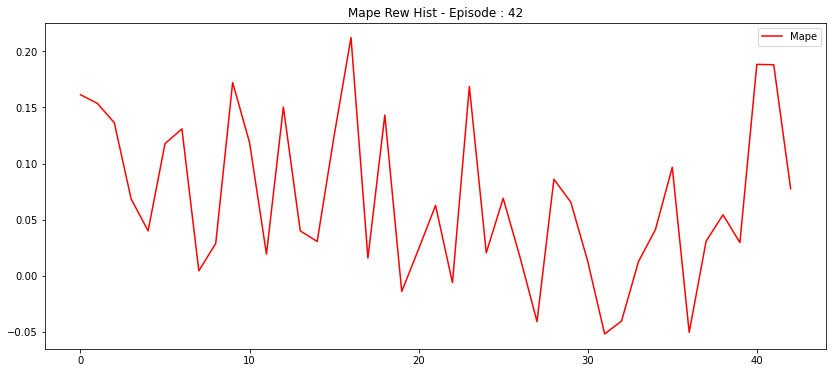

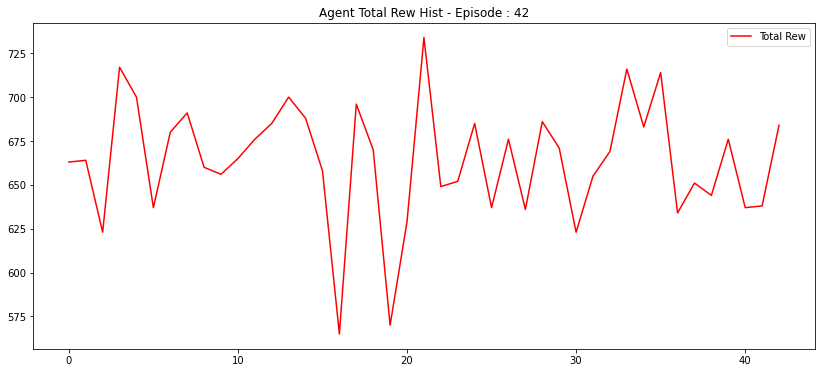

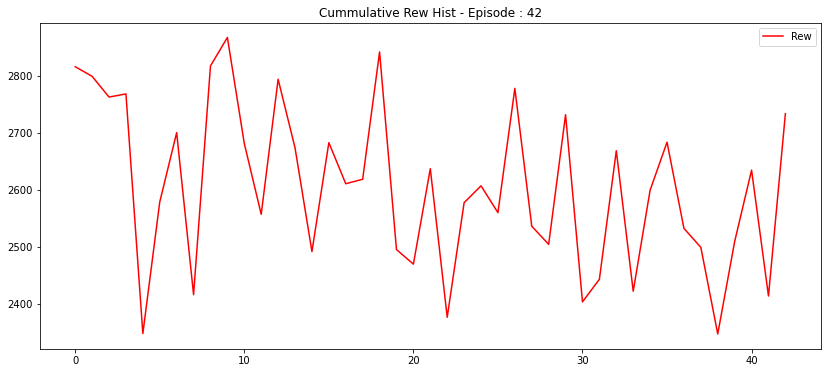

C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:419: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:420: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:448: RuntimeWarning: invalid value encountered in true_divide
C:\Users\Enric\anaconda3\lib\site-packages\ipykernel_launcher.py:449: RuntimeWarning: invalid value encountered in true_divide
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: divide by zero encountered in true_divide
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))


-> Ini env -> 1


G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:76: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_distribs_std = np.sqrt((self.arr_wins*self.arr_loss)/((self.arr_wins+self.arr_loss+1)*((self.arr_wins+self.arr_loss)**2)))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:77: RuntimeWarning: invalid value encountered in sqrt
  self.arr_beta_skewness = (2*(self.arr_wins-self.arr_loss)*np.sqrt(self.arr_wins+self.arr_loss+1))/((self.arr_wins+self.arr_loss+2)*np.sqrt(self.arr_wins*self.arr_loss))
G:\PROYECTOS\Kaggle - Santa 2020\06_Scripts\rl_agent_model_offline_regressor_v0_11.py:162: RuntimeWarning: invalid value encountered in true_divide
  'list_pc_wins' : (self.arr_wins - 1) / self.arr_count_me,


493 373 1145
Env Agent Opp: regressor done, Idx: 2
589 469 1391
Env Agent Opp: regressor done, Idx: 3
645 565 1999
Env Agent Opp: regressor done, Idx: 1
540 561 1999
Env Agent Opp: vegas done, Idx: 0
All envs done
Break step: 6534, Done: True, Idx : 0 | Me: {'remainingOverageTime': 60, 'agentIndex': 1, 'reward': 540, 'step': 1999, 'lastActions': [33, 30]} | Opp: {'remainingOverageTime': 60, 'agentIndex': 0, 'reward': 561, 'step': 1999, 'lastActions': [33, 30]}
Step: 0
[0.88325375 0.02725233 0.01142309 0.00610387 0.07196698]
0
Step: 500
[9.9999833e-01 6.2430217e-09 9.0047685e-11 5.1722732e-12 1.6382281e-06]
0


KeyboardInterrupt: 

In [5]:
####################################################################
# 5. Simulation

from rl_agent_class_vegas_slot_v0_1 import AgentRules as AgentVegas
from rl_agent_random_v0_3 import AgentRules as AgentRandom
from rl_agent_model_offline_regressor_v0_11 import AgentRules as AgentRegressor

path_input_model_regressor = f'./01_ModelsAgentRL/model_xgb_v06.pickle'

num_episodes = 10_000
batch_size = 32
num_decissions = 5
num_actions = 100
lr_a2c = 7e-4
memory_maxlen = batch_size
gamma = 0.99
clip_grad = 0.5
entropy_coef = 0.02
critic_coef = 0.5
num_envs = 4

model_regressor = pickle.load(open(path_input_model_regressor, 'rb')) 
model_a2c = A2CModel(num_actions=num_decissions)

trainer = TrainingSantaAgentRL(model_regressor=model_regressor, 
                               model_a2c=model_a2c,
                               path_load_model_a2c='../04_Models/ActorCritic/Decission/model_a2c_dec_multienv_v0.5_10', 
                               load_model=False, clip_grad=clip_grad, num_envs=num_envs,
                               num_episodes=num_episodes, batch_size=batch_size, 
                               num_actions=num_actions, num_decissions=num_decissions,
                               maxlen=memory_maxlen, lr_a2c=lr_a2c,
                               gamma=gamma, entropy_coef=entropy_coef, critic_coef=critic_coef)

trainer.runSimulation(save_episodes=5, display_plots=2, episodes_play_nemesis=1, restart_opp=25,
                      path_save_model='../04_Models/ActorCritic/Decission/', name_model='model_a2c_dec_multienv_v0.6')

# 0: best regressor | 1: opp action | 2: best vegas | 3: Repeat last action | 4: q-wins

####################################################################

In [ ]:
# Ep: 152: 2%
# 153/10000 [3:14:32<201:49:55, 73.79s/it, actor_loss=-6.01e-12, agent_reward=641, critic_loss=2, diff_reward=60,
#            diff_running_reward=48.4, loss=2, loss_running=2.52, mape_rew=0.0936, mape_reward_running=0.0752,
#            memory_len=0, opp_reward=581, opponent=vegas, wins_last10_nemesis=1, wins_running=0.782]